In [1]:
import numpy as np
import pandas as pd
import datetime
import glob
import os.path
from pandas.compat import StringIO

### NREL Bird Model implementation: for obtaining clear sky GHI

In [2]:
import itertools
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [3]:
%matplotlib inline
sns.set_color_codes()

In [4]:
import pvlib
from pvlib import clearsky, atmosphere
from pvlib.location import Location

In [5]:
ftp = Location(48,-106.449, 'US/Mountain', 630.0216, 'Fort Peck')

In [6]:
times2009 = pd.DatetimeIndex(start='2009-01-01', end='2010-01-01', freq='1min',
                        tz=ftp.tz)   # 12 months of 2009 - For testing
times2010and2011 = pd.DatetimeIndex(start='2010-01-01', end='2012-01-01', freq='1min',
                        tz=ftp.tz)   # 24 months of 2010 and 2011 - For training

In [7]:
cs_2009 = ftp.get_clearsky(times2009) 
cs_2010and2011 = ftp.get_clearsky(times2010and2011) # ineichen with climatology table by default
#cs_2011 = bvl.get_clearsky(times2011) 

In [8]:
cs_2009.drop(['dni','dhi'],axis=1, inplace=True) #updating the same dataframe by dropping two columns
cs_2010and2011.drop(['dni','dhi'],axis=1, inplace=True) #updating the same dataframe by dropping two columns
#cs_2011.drop(['dni','dhi'],axis=1, inplace=True) #updating the same dataframe by dropping two columns

In [9]:
cs_2009.reset_index(inplace=True)
cs_2010and2011.reset_index(inplace=True)
#cs_2011.reset_index(inplace=True)

In [10]:
cs_2009['index']=cs_2009['index'].apply(lambda x:x.to_datetime())
cs_2009['year'] = cs_2009['index'].apply(lambda x:x.year)
cs_2009['month'] = cs_2009['index'].apply(lambda x:x.month)
cs_2009['day'] = cs_2009['index'].apply(lambda x:x.day)
cs_2009['hour'] = cs_2009['index'].apply(lambda x:x.hour)
cs_2009['min'] = cs_2009['index'].apply(lambda x:x.minute)

In [11]:
cs_2010and2011['index']=cs_2010and2011['index'].apply(lambda x:x.to_datetime())
cs_2010and2011['year'] = cs_2010and2011['index'].apply(lambda x:x.year)
cs_2010and2011['month'] = cs_2010and2011['index'].apply(lambda x:x.month)
cs_2010and2011['day'] = cs_2010and2011['index'].apply(lambda x:x.day)
cs_2010and2011['hour'] = cs_2010and2011['index'].apply(lambda x:x.hour)
cs_2010and2011['min'] = cs_2010and2011['index'].apply(lambda x:x.minute)

In [12]:
print(cs_2009.shape)
print(cs_2010and2011.shape)
#print(cs_2011.shape)

(525601, 7)
(1051201, 7)


In [13]:
cs_2009.drop(cs_2009.index[-1], inplace=True)
cs_2010and2011.drop(cs_2010and2011.index[-1], inplace=True)
#cs_2011.drop(cs_2011.index[-1], inplace=True)

In [14]:
print(cs_2009.shape)
print(cs_2010and2011.shape)
#print(cs_2011.shape)

(525600, 7)
(1051200, 7)


In [15]:
cs_2010and2011.head()

,index,ghi,year,month,day,hour,min
0,2010-01-01 00:00:00-07:00,0.0,2010,1,1,0,0
1,2010-01-01 00:01:00-07:00,0.0,2010,1,1,0,1
2,2010-01-01 00:02:00-07:00,0.0,2010,1,1,0,2
3,2010-01-01 00:03:00-07:00,0.0,2010,1,1,0,3
4,2010-01-01 00:04:00-07:00,0.0,2010,1,1,0,4


### Import files from each year in a separate dataframe


- year            integer	 year, i.e., 1995
- jday            integer	 Julian day (1 through 365 [or 366])
- month           integer	 number of the month (1-12)
- day             integer	 day of the month(1-31)
- hour            integer	 hour of the day (0-23)
- min             integer	 minute of the hour (0-59)
- dt              real	 decimal time (hour.decimalminutes, e.g., 23.5 = 2330)
- zen             real	 solar zenith angle (degrees)
- dw_solar        real	 downwelling global solar (Watts m^-2)
- uw_solar        real	 upwelling global solar (Watts m^-2)
- direct_n        real	 direct-normal solar (Watts m^-2)
- diffuse         real	 downwelling diffuse solar (Watts m^-2)
- dw_ir           real	 downwelling thermal infrared (Watts m^-2)
- dw_casetemp     real	 downwelling IR case temp. (K)
- dw_dometemp     real	 downwelling IR dome temp. (K)
- uw_ir           real	 upwelling thermal infrared (Watts m^-2)
- uw_casetemp     real	 upwelling IR case temp. (K)
- uw_dometemp     real	 upwelling IR dome temp. (K)
- uvb             real	 global UVB (milliWatts m^-2)
- par             real	 photosynthetically active radiation (Watts m^-2)
- netsolar        real	 net solar (dw_solar - uw_solar) (Watts m^-2)
- netir           real	 net infrared (dw_ir - uw_ir) (Watts m^-2)
- totalnet        real	 net radiation (netsolar+netir) (Watts m^-2)
- temp            real	 10-meter air temperature (?C)
- rh              real	 relative humidity (%)
- windspd         real	 wind speed (ms^-1)
- winddir         real	 wind direction (degrees, clockwise from north)
- pressure        real	 station pressure (mb)


In [16]:
cols = ['year', 'jday', 'month', 'day','hour','min','dt','zen','dw_solar','dw_solar_QC','uw_solar',
       'uw_solar_QC', 'direct_n','direct_n_QC','diffuse', 'diffuse_QC', 'dw_ir', 'dw_ir_QC', 'dw_casetemp',
       'dw_casetemp_QC', 'dw_dometemp','dw_dometemp_QC','uw_ir', 'uw_ir_QC', 'uw_casetemp','uw_casetemp_QC',
       'uw_dometemp','uw_dometemp_QC','uvb','uvb_QC','par','par_QC','netsolar','netsolar_QC','netir','netir_QC',
       'totalnet','totalnet_QC','temp','temp_QC','rh','rh_QC','windspd','windspd_QC','winddir','winddir_QC',
       'pressure','pressure_QC']

In [17]:
path = r'.\\data\\Fort_Peck\\Exp_1_train'
all_files = glob.glob(path + "/*.dat")
all_files.sort()

df_big_train = pd.concat([pd.read_csv(f, skipinitialspace = True, quotechar = '"',skiprows=(2),delimiter=' ', 
                 index_col=False,header=None, names=cols) for f in all_files],ignore_index=True)
df_big_train.shape

(1050071, 48)

In [18]:
path = r'.\\data\\Fort_Peck\\Exp_1_test'
all_files = glob.glob(path + "/*.dat")
all_files.sort()

df_big_test = pd.concat((pd.read_csv(f, skipinitialspace = True, quotechar = '"',skiprows=(2),delimiter=' ', 
                 index_col=False,header=None, names=cols) for f in all_files),ignore_index=True)
df_big_test.shape

(524996, 48)

In [19]:
df_big_test[df_big_test['dw_solar']==-9999.9].shape

(39, 48)

### Merging Clear Sky GHI And the big dataframe

In [20]:
df_train = pd.merge(df_big_train, cs_2010and2011, on=['year','month','day','hour','min'])
df_train.shape

(1050071, 50)

In [21]:
df_test = pd.merge(df_big_test, cs_2009, on=['year','month','day','hour','min'])
df_test.shape

(524996, 50)

In [22]:
df_train.drop(['index'],axis=1, inplace=True) #updating the same dataframe by dropping the index columns from clear sky model
df_test.drop(['index'], axis=1, inplace=True)

In [23]:
df_train.shape

(1050071, 49)

### Managing missing values

In [24]:
# Resetting index
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)

In [25]:
# Dropping rows with two or more -9999.9 values in columns

In [26]:
# Step1: Get indices of all rows with 2 or more -999
missing_data_indices = np.where((df_train <=-9999.9).apply(sum, axis=1)>=2)[0]
# Step2: Drop those indices
df_train.drop(missing_data_indices, axis=0, inplace=True)
# Checking that the rows are dropped
df_train.shape

(1025624, 49)

In [27]:
missing_data_indices_test = np.where((df_test <= -9999.9).apply(sum, axis=1)>=2)[0]
df_test.drop(missing_data_indices_test, axis=0, inplace=True)
df_test.shape

(466023, 49)

In [28]:
# For the rows with only one cell as -9999.9, replacing this cell with the mean of the column

#### First resetting index after dropping rows in the previous part of the code

In [29]:
# 2nd time - Reseting Index
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)

In [30]:
one_miss_train_idx = np.where((df_train <=-9999.9).apply(sum, axis=1)==1)[0]

In [31]:
len(one_miss_train_idx)

14044

In [32]:
df_train.shape

(1025624, 49)

In [33]:
col_names = df_train.columns
from collections import defaultdict
stats = defaultdict(int)
total_single_missing_values = 0
for name in col_names:
    col_mean = df_train[~(df_train[name] == -9999.9)][name].mean()
    missing_indices = np.where((df_train[name] == -9999.9))
    stats[name] = len(missing_indices[0])
    df_train[name].loc[missing_indices] = col_mean
    total_single_missing_values += sum(df_train[name] == -9999.9)
    

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\pandas\core\indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [34]:
df_col_min = df_train.apply(min, axis=0)
df_col_max = df_train.apply(max, axis =0)
#print(df_col_min, df_col_max)

In [35]:
train = np.where((df_train <=-9999.9).apply(sum, axis=1)==1)[0]

In [36]:
len(train)

0

In [37]:
# doing the same thing on test dataset

In [38]:
one_miss_test_idx = np.where((df_test <=-9999.9).apply(sum, axis=1)==1)[0]
len(one_miss_test_idx)

556

In [39]:
col_names_test = df_test.columns
from collections import defaultdict
stats_test = defaultdict(int)
total_single_missing_values_test = 0
for name in col_names_test:
    col_mean = df_test[~(df_test[name] == -9999.9)][name].mean()
    missing_indices = np.where((df_test[name] == -9999.9))
    stats_test[name] = len(missing_indices[0])
    df_test[name].loc[missing_indices] = col_mean
    total_single_missing_values_test += sum(df_test[name] == -9999.9)
    

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\pandas\core\indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [40]:
test = np.where((df_test <=-9999.9).apply(sum, axis=1)==1)[0]

In [41]:
len(test)

0

In [42]:
df_train.shape

(1025624, 49)

In [43]:
df_test.shape

(466023, 49)

### Exploratory Data Analysis

In [44]:
dw_solar_everyday = df_test.groupby(['jday'])['dw_solar'].mean()
ghi_everyday = df_test.groupby(['jday'])['ghi'].mean()
j_day = df_test['jday'].unique()

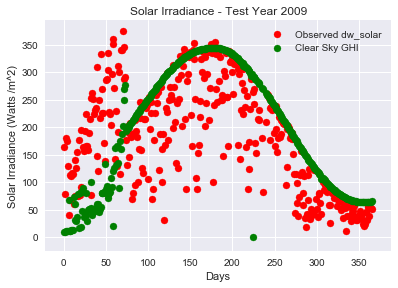

In [45]:
fig = plt.figure()

axes1 = fig.add_axes([0.1,0.1,0.8,0.8])
#axes2 = fig.add_axes([0.1,0.1,0.8,0.8])

axes1.scatter(j_day,dw_solar_everyday,label='Observed dw_solar',color='red')
axes1.scatter(j_day, ghi_everyday, label='Clear Sky GHI',color='green')

axes1.set_xlabel('Days')
axes1.set_ylabel('Solar Irradiance (Watts /m^2)')
axes1.set_title('Solar Irradiance - Test Year 2009')
axes1.legend(loc='best')

fig.savefig('Figure2a.png', bbox_inches = 'tight')

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


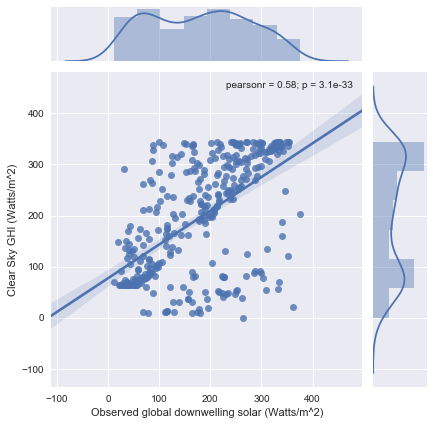

In [46]:
sns.jointplot(x=dw_solar_everyday,y=ghi_everyday,kind='reg')
#plt.title('observed dw_solar vs clear sky ghi')
plt.xlabel('Observed global downwelling solar (Watts/m^2)')
plt.ylabel('Clear Sky GHI (Watts/m^2)')
plt.savefig('Figure3a.png', bbox_inches='tight')

### making the Kt (clear sky index at time t) column by first removing rows with ghi==0

In [47]:
df_train = df_train[df_train['ghi']!=0]
df_test = df_test[df_test['ghi']!=0]
df_train['Kt'] = df_train['dw_solar']/df_train['ghi']
df_test['Kt'] = df_test['dw_solar']/df_test['ghi']

In [48]:
df_train.reset_index(inplace=True)
df_test.reset_index(inplace=True)

In [49]:
print("test Kt max: "+str(df_test['Kt'].max()))
print("test Kt min: "+str(df_test['Kt'].min()))
print("test Kt mean: "+str(df_test['Kt'].mean()))
print("\n")
print("train Kt max: "+str(df_train['Kt'].max()))
print("train Kt min: "+str(df_train['Kt'].min()))
print("train Kt mean: "+str(df_train['Kt'].mean()))

test Kt max: 6708504.1476219045
test Kt min: -760.2171477048815
test Kt mean: 32.49910713059261


train Kt max: 2638590.5112375193
train Kt min: -1423.5534672678295
train Kt mean: 8.408929323818732


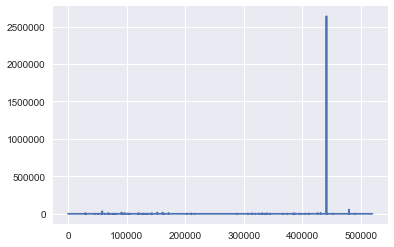

In [50]:
plt.plot(df_train['Kt'])

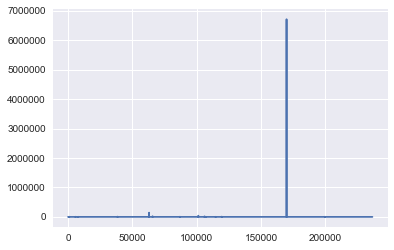

In [51]:
plt.plot(df_test['Kt'])

In [52]:
df_train= df_train[df_train['Kt']< 5000]
df_train= df_train[df_train['Kt']> -1000]
df_test= df_test[df_test['Kt']< 5000]
df_test= df_test[df_test['Kt']> -1000]

#### Group the data (train dataframe)

In [53]:
zen = df_train.groupby(['year','month','day','hour'])['zen'].mean()
dw_solar = df_train.groupby(['year','month','day','hour'])['dw_solar'].mean()
uw_solar = df_train.groupby(['year','month','day','hour'])['uw_solar'].mean()
direct_n = df_train.groupby(['year','month','day','hour'])['direct_n'].mean()
diffuse = df_train.groupby(['year','month','day','hour'])['diffuse'].mean()
dw_ir = df_train.groupby(['year','month','day','hour'])['dw_ir'].mean()
dw_casetemp = df_train.groupby(['year','month','day','hour'])['dw_casetemp'].mean()
dw_dometemp = df_train.groupby(['year','month','day','hour'])['dw_dometemp'].mean()
uw_ir = df_train.groupby(['year','month','day','hour'])['uw_ir'].mean()
uw_casetemp = df_train.groupby(['year','month','day','hour'])['uw_casetemp'].mean()
uw_dometemp = df_train.groupby(['year','month','day','hour'])['uw_dometemp'].mean()
uvb = df_train.groupby(['year','month','day','hour'])['uvb'].mean()
par = df_train.groupby(['year','month','day','hour'])['par'].mean()
netsolar = df_train.groupby(['year','month','day','hour'])['netsolar'].mean()
netir = df_train.groupby(['year','month','day','hour'])['netir'].mean()
totalnet = df_train.groupby(['year','month','day','hour'])['totalnet'].mean()
temp = df_train.groupby(['year','month','day','hour'])['temp'].mean()
rh = df_train.groupby(['year','month','day','hour'])['rh'].mean()
windspd = df_train.groupby(['year','month','day','hour'])['windspd'].mean()
winddir = df_train.groupby(['year','month','day','hour'])['winddir'].mean()
pressure = df_train.groupby(['year','month','day','hour'])['pressure'].mean()
ghi = df_train.groupby(['year','month','day','hour'])['ghi'].mean()
Kt = df_train.groupby(['year','month','day','hour'])['Kt'].mean()

In [54]:
df_new_train = pd.concat([zen,dw_solar,uw_solar,direct_n,diffuse,dw_ir,dw_casetemp,dw_dometemp,uw_ir,uw_casetemp,uw_dometemp,
                    uvb,par,netsolar,netir,totalnet,temp,rh,windspd,winddir,pressure,ghi,Kt], axis=1)

In [55]:
df_new_train.head()

zen  dw_solar  uw_solar  direct_n   diffuse  \
year   month day hour                                                       
2010.0 1.0   1.0 7.0   152.500000 -2.550000  0.500000  0.100000  0.500000   
                 8.0   149.438333 -2.245000  0.513333  1.445000  0.243333   
                 9.0   141.688000 -2.595000 -0.056667  1.825000  0.251667   
                 10.0  132.410667 -2.341667  0.215000  1.508333  0.281667   
                 11.0  122.550500 -2.611667  0.143333  1.915000  0.248333   

                            dw_ir  dw_casetemp  dw_dometemp       uw_ir  \
year   month day hour                                                     
2010.0 1.0   1.0 7.0   152.500000   248.050000   247.800000  195.450000   
                 8.0   149.576667   246.816667   246.593333  190.816667   
                 9.0   148.300000   244.931667   244.778333  187.660000   
                 10.0  147.040000   243.778333   243.615000  184.533333   
                 11.0  146.465000   243.041667   242.920000  182.806667   

                       uw_casetemp    ...     netsolar      netir   totalnet  \
year   month day hour                 ...                                      
2010.0 1.0   1.0 7.0    247.250000    ...          0.0 -42.950000 -42.950000   
                 8.0    245.775000    ...          0.0 -41.231667 -41.231667   
                 9.0    244.426667    ...          0.0 -39.358333 -39.358333   
                 10.0   243.090000    ...          0.0 -37.488333 -37.488333   
                 11.0   242.098333    ...          0.0 -36.341667 -36.341667   

                            temp         rh   windspd     winddir    pressure  \
year   month day hour                                                           
2010.0 1.0   1.0 7.0  -25.900000  80.250000  4.250000  348.000000  958.950000   
                 8.0  -27.401667  80.756667  3.488333  315.585000  959.703333   
                 9.0  -28.131667  80.201667  3.893333  341.580000  960.186667   
                 10.0 -29.798333  79.325000  3.816667  341.220000  960.108333   
                 11.0 -30.808333  78.328333  3.310000  304.276667  959.655000   

                              ghi        Kt  
year   month day hour                        
2010.0 1.0   1.0 7.0     5.054489 -2.210247  
                 8.0    47.742733 -0.062791  
                 9.0   147.117239 -0.018213  
                 10.0  240.573050 -0.009789  
                 11.0  295.936982 -0.008846  

[5 rows x 23 columns]

#### Groupdata - test dataframe

In [56]:
test_zen = df_test.groupby(['month','day','hour'])['zen'].mean()
test_dw_solar = df_test.groupby(['month','day','hour'])['dw_solar'].mean()
test_uw_solar = df_test.groupby(['month','day','hour'])['uw_solar'].mean()
test_direct_n = df_test.groupby(['month','day','hour'])['direct_n'].mean()
test_diffuse = df_test.groupby(['month','day','hour'])['diffuse'].mean()
test_dw_ir = df_test.groupby(['month','day','hour'])['dw_ir'].mean()
test_dw_casetemp = df_test.groupby(['month','day','hour'])['dw_casetemp'].mean()
test_dw_dometemp = df_test.groupby(['month','day','hour'])['dw_dometemp'].mean()
test_uw_ir = df_test.groupby(['month','day','hour'])['uw_ir'].mean()
test_uw_casetemp = df_test.groupby(['month','day','hour'])['uw_casetemp'].mean()
test_uw_dometemp = df_test.groupby(['month','day','hour'])['uw_dometemp'].mean()
test_uvb = df_test.groupby(['month','day','hour'])['uvb'].mean()
test_par = df_test.groupby(['month','day','hour'])['par'].mean()
test_netsolar = df_test.groupby(['month','day','hour'])['netsolar'].mean()
test_netir = df_test.groupby(['month','day','hour'])['netir'].mean()
test_totalnet = df_test.groupby(['month','day','hour'])['totalnet'].mean()
test_temp = df_test.groupby(['month','day','hour'])['temp'].mean()
test_rh = df_test.groupby(['month','day','hour'])['rh'].mean()
test_windspd = df_test.groupby(['month','day','hour'])['windspd'].mean()
test_winddir = df_test.groupby(['month','day','hour'])['winddir'].mean()
test_pressure = df_test.groupby(['month','day','hour'])['pressure'].mean()
test_ghi = df_test.groupby(['month','day','hour'])['ghi'].mean()
test_Kt = df_test.groupby(['month','day','hour'])['Kt'].mean()

In [57]:
df_new_test = pd.concat([test_zen,test_dw_solar,test_uw_solar,test_direct_n,test_diffuse,test_dw_ir,
                         test_dw_casetemp,test_dw_dometemp,test_uw_ir,test_uw_casetemp,test_uw_dometemp,
                    test_uvb,test_par,test_netsolar,test_netir,test_totalnet,test_temp,test_rh,
                         test_windspd,test_winddir,test_pressure,test_ghi,test_Kt], axis=1)

In [58]:
df_new_test.loc[2].xs(17,level='day')

,zen,dw_solar,uw_solar,direct_n,diffuse,dw_ir,dw_casetemp,dw_dometemp,uw_ir,uw_casetemp,...,netsolar,netir,totalnet,temp,rh,windspd,winddir,pressure,ghi,Kt
hour,,,,,,,,,,,,,,,,,,,,,
13.0,93.876897,-5.324138,0.296552,3.444828,0.796552,263.427586,264.431034,264.241379,268.458621,261.768966,...,0.389655,-5.044828,-4.658621,-11.031034,93.793103,3.441379,186.258621,933.775862,454.397482,-0.011699
14.0,86.859792,11.529167,15.887500,2.856250,19.741667,266.177083,265.522917,265.304167,271.779167,262.820833,...,4.114583,-5.600000,0.353241,-10.216667,94.195833,4.133333,11.343750,933.754167,387.795068,0.033291
15.0,77.951000,82.070000,76.600000,2.671667,99.445000,266.750000,266.643333,266.485000,274.400000,263.601667,...,23.411667,-7.645000,15.760000,-9.826667,94.228333,4.073333,167.686667,934.028333,258.552442,0.342809
16.0,70.364167,170.833333,151.813333,3.088333,196.435000,270.118333,268.296667,268.248333,278.895000,264.901667,...,45.646667,-8.785000,36.868333,-8.786667,94.641667,2.905000,339.636667,934.480000,112.367516,1.876063
17.0,65.665161,257.512903,223.258065,4.993548,288.264516,272.490323,269.638710,269.654839,282.845161,265.922581,...,67.074194,-10.354839,56.725806,-8.000000,95.009677,3.212903,325.225806,934.738710,24.827779,44.603082


### Shifting Kt values to make 1 hour ahead forecast

#### Train dataset

In [59]:
levels_index= []
for m in df_new_train.index.levels:
    levels_index.append(m)

In [60]:
for i in levels_index[0]:
    for j in levels_index[1]:
        df_new_train.loc[i].loc[j]['Kt'] = df_new_train.loc[i].loc[j]['Kt'].shift(-2)

In [61]:
df_new_train = df_new_train[~(df_new_train['Kt'].isnull())]

#### Test dataset

In [62]:
levels_index2= []
for m in df_new_test.index.levels:
    levels_index2.append(m)

In [63]:
for i in levels_index2[0]:
    for j in levels_index2[1]:
        df_new_test.loc[i].loc[j]['Kt'] = df_new_test.loc[i].loc[j]['Kt'].shift(-2)

In [64]:
df_new_test = df_new_test[~(df_new_test['Kt'].isnull())]

In [65]:
df_new_test[df_new_test['Kt']==df_new_test['Kt'].max()]

,,,zen,dw_solar,uw_solar,direct_n,diffuse,dw_ir,dw_casetemp,dw_dometemp,uw_ir,uw_casetemp,...,netsolar,netir,totalnet,temp,rh,windspd,winddir,pressure,ghi,Kt
month,day,hour,,,,,,,,,,,,,,,,,,,,,
7.0,13.0,19.0,27.187667,793.233333,85.248333,532.675,315.425,459.573333,303.546667,303.263333,498.631667,298.21,...,704.886667,-39.055,665.828333,23.848333,67.153333,8.091667,122.663333,937.735,161.08563,1801.738697


### Normalize train and test dataframe

In [66]:
train_norm = (df_new_train - df_new_train.mean()) / (df_new_train.max() - df_new_train.min())
test_norm =  (df_new_test - df_new_test.mean()) / (df_new_test.max() - df_new_test.min())

In [67]:
train_norm.reset_index(inplace=True,drop=True)
test_norm.reset_index(inplace=True,drop=True)

### Making train and test sets with train_norm and test_norm

#### finding the gcf (greatest common factor) of train and test dataset's length and chop off the extra rows to make it divisible with the batchsize

In [68]:
from fractions import gcd
gcd(train_norm.shape[0],test_norm.shape[0])

C:\Users\s269596\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: fractions.gcd() is deprecated. Use math.gcd() instead.
  


1

In [69]:
import math
def roundup(x):
    return int(math.ceil(x / 100.0)) * 100

In [70]:
train_lim = roundup(train_norm.shape[0])
test_lim = roundup(test_norm.shape[0])

train_random = train_norm.sample(train_lim-train_norm.shape[0])
test_random = test_norm.sample(test_lim-test_norm.shape[0])

train_norm = train_norm.append(train_random)
test_norm = test_norm.append(test_random)

In [71]:
X1 = train_norm.drop('Kt',axis=1)
y1 = train_norm['Kt']

X2 = test_norm.drop('Kt',axis=1)
y2 = test_norm['Kt']

In [72]:
print("X1_train shape is {}".format(X1.shape))
print("y1_train shape is {}".format(y1.shape))
print("X2_test shape is {}".format(X2.shape))
print("y2_test shape is {}".format(y2.shape))

X1_train shape is (9500, 22)
y1_train shape is (9500,)
X2_test shape is (3600, 22)
y2_test shape is (3600,)


In [73]:
X_train = np.array(X1)
y_train  = np.array(y1)
X_test = np.array(X2)
y_test = np.array(y2)

### start of RNN

In [74]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.datasets as dsets
from torch.autograd import Variable

In [75]:
class RNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim):
        super(RNNModel, self).__init__()
        #Hidden Dimension
        self.hidden_dim = hidden_dim
        
        # Number of hidden layers
        self.layer_dim = layer_dim
        
        #Building the RNN
        self.rnn = nn.RNN(input_dim, hidden_dim, layer_dim, batch_first=True, nonlinearity='relu')
        
        # Readout layer
        self.fc = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x):
        # Initializing the hidden state with zeros
        # (layer_dim, batch_size, hidden_dim)
        h0 = Variable(torch.zeros(self.layer_dim, x.size(0), self.hidden_dim))
        
        #One time step (the last one perhaps?)
        out, hn = self.rnn(x, h0)
        
        # Indexing hidden state of the last time step
        # out.size() --> ??
        #out[:,-1,:] --> is it going to be 100,100
        out = self.fc(out[:,-1,:])
        # out.size() --> 100,1
        return out
        

In [76]:
# Instantiating Model Class
input_dim = 22
hidden_dim = 15
layer_dim = 1
output_dim = 1
batch_size = 100

model = RNNModel(input_dim, hidden_dim, layer_dim, output_dim)

# Instantiating Loss Class
criterion = nn.MSELoss()

# Instantiate Optimizer Class
learning_rate = 0.001
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

# converting numpy array to torch tensor
X_train = torch.from_numpy(X_train)
y_train = torch.from_numpy(y_train)
X_test = torch.from_numpy(X_test)
y_test = torch.from_numpy(y_test)

# initializing lists to store losses over epochs:
train_loss = []
test_loss = []
train_iter = []
test_iter = []

In [77]:
# Training the model
seq_dim = 1

n_iter =0
num_samples = len(X_train)
test_samples = len(X_test)
batch_size = 100
num_epochs = 1000
feat_dim = X_train.shape[1]

X_train = X_train.type(torch.FloatTensor)
y_train = y_train.type(torch.FloatTensor)
X_test = X_test.type(torch.FloatTensor)
y_test = y_test.type(torch.FloatTensor)

for epoch in range(num_epochs):
    for i in range(0, int(num_samples/batch_size -1)):
        
        
        features = Variable(X_train[i*batch_size:(i+1)*batch_size, :]).view(-1, seq_dim, feat_dim)
        Kt_value = Variable(y_train[i*batch_size:(i+1)*batch_size])
        
        #print("Kt_value={}".format(Kt_value))
        
        optimizer.zero_grad()
        
        outputs = model(features)
        #print("outputs ={}".format(outputs))
        
        loss = criterion(outputs, Kt_value)
        
        train_loss.append(loss.data[0])
        train_iter.append(n_iter)

        #print("loss = {}".format(loss))
        loss.backward()
        
        optimizer.step()
        
       
            
        if n_iter%100 == 0:
            for i in range(0,int(test_samples/batch_size -1)):
                features = Variable(X_test[i*batch_size:(i+1)*batch_size, :]).view(-1, seq_dim, feat_dim)
                Kt_test = Variable(y_test[i*batch_size:(i+1)*batch_size])
                
                outputs = model(features)
                
                mse = np.sqrt(np.mean((Kt_test.data.numpy() - outputs.data.numpy().squeeze())**2)/num_samples)
                
                test_iter.append(n_iter)
                test_loss.append(mse)
                
        print('Epoch: {} Iteration: {}. Train_MSE: {}. Test_MSE: {}'.format(epoch, n_iter, loss.data[0], mse))
         
        n_iter += 1  

Epoch: 0 Iteration: 0. Train_MSE: 0.0068067326210439205. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 1. Train_MSE: 0.009141813032329082. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 2. Train_MSE: 0.01226811297237873. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 3. Train_MSE: 0.008969646878540516. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 4. Train_MSE: 0.009237474761903286. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 5. Train_MSE: 0.010404999367892742. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 6. Train_MSE: 0.014125440269708633. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 7. Train_MSE: 0.014688334427773952. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 8. Train_MSE: 0.016344157978892326. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 9. Train_MSE: 0.016006454825401306. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 10. Train_MSE: 0.015950072556734085. Test_MSE: 0.0008547720773399315
Epoch: 0 Iteration: 11. Train_M

Epoch: 1 Iteration: 140. Train_MSE: 0.0028721594717353582. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 141. Train_MSE: 0.0032759103924036026. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 142. Train_MSE: 0.0023902670945972204. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 143. Train_MSE: 0.0051852925680577755. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 144. Train_MSE: 0.003019202733412385. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 145. Train_MSE: 0.005781091284006834. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 146. Train_MSE: 0.0028272331692278385. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 147. Train_MSE: 0.0033319154754281044. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 148. Train_MSE: 0.004512637387961149. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 149. Train_MSE: 0.006534222979098558. Test_MSE: 0.0005093926341937045
Epoch: 1 Iteration: 150. Train_MSE: 0.006295572500675917. Test_MSE: 0.0005093926341937045
Epoc

Epoch: 3 Iteration: 300. Train_MSE: 0.00731059443205595. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 301. Train_MSE: 0.013294967822730541. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 302. Train_MSE: 0.004412602633237839. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 303. Train_MSE: 0.004805622156709433. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 304. Train_MSE: 0.0047485255636274815. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 305. Train_MSE: 0.003791235154494643. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 306. Train_MSE: 0.00489279767498374. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 307. Train_MSE: 0.006002775393426418. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 308. Train_MSE: 0.005063770338892937. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 309. Train_MSE: 0.004180918447673321. Test_MSE: 0.00017339478619503835
Epoch: 3 Iteration: 310. Train_MSE: 0.00278450851328671. Test_MSE: 0.00017339478619503835
E

Epoch: 4 Iteration: 440. Train_MSE: 0.001688050921075046. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 441. Train_MSE: 0.003081719856709242. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 442. Train_MSE: 0.003940642345696688. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 443. Train_MSE: 0.0024912322405725718. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 444. Train_MSE: 0.0028032343834638596. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 445. Train_MSE: 0.003848035354167223. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 446. Train_MSE: 0.0033259885385632515. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 447. Train_MSE: 0.002718876814469695. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 448. Train_MSE: 0.002588527509942651. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 449. Train_MSE: 0.002139428863301873. Test_MSE: 0.00017820253134802677
Epoch: 4 Iteration: 450. Train_MSE: 0.002497513312846422. Test_MSE: 0.00017820253134802

Epoch: 6 Iteration: 600. Train_MSE: 0.0008548612822778523. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 601. Train_MSE: 0.0006559284520335495. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 602. Train_MSE: 0.0006269555306062102. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 603. Train_MSE: 0.0005796956829726696. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 604. Train_MSE: 0.0014958216343075037. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 605. Train_MSE: 0.0007422486087307334. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 606. Train_MSE: 0.0003067360958084464. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 607. Train_MSE: 0.0005379099166020751. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 608. Train_MSE: 0.0004271036304999143. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 609. Train_MSE: 0.0007636041264049709. Test_MSE: 0.00026715292663255464
Epoch: 6 Iteration: 610. Train_MSE: 0.000547931354958564. Test_MSE: 0.0002671529

Epoch: 8 Iteration: 760. Train_MSE: 0.0009575043804943562. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 761. Train_MSE: 0.0013033864088356495. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 762. Train_MSE: 0.0014786996180191636. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 763. Train_MSE: 0.0015269559808075428. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 764. Train_MSE: 0.0021629580296576023. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 765. Train_MSE: 0.003493505995720625. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 766. Train_MSE: 0.002455956069752574. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 767. Train_MSE: 0.002146274084225297. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 768. Train_MSE: 0.0010510118445381522. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 769. Train_MSE: 0.002609873190522194. Test_MSE: 0.0002964400032104751
Epoch: 8 Iteration: 770. Train_MSE: 0.0030865687876939774. Test_MSE: 0.0002964400032104751
Epo

Epoch: 9 Iteration: 907. Train_MSE: 0.0012790007749572396. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 908. Train_MSE: 0.0013616853393614292. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 909. Train_MSE: 0.0014743551146239042. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 910. Train_MSE: 0.0006116898730397224. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 911. Train_MSE: 0.001572567387484014. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 912. Train_MSE: 0.0020299877505749464. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 913. Train_MSE: 0.0013638569507747889. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 914. Train_MSE: 0.001710286596789956. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 915. Train_MSE: 0.0021724957041442394. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 916. Train_MSE: 0.002444618847221136. Test_MSE: 0.00032203880797132225
Epoch: 9 Iteration: 917. Train_MSE: 0.0015332645270973444. Test_MSE: 0.000322038807

Epoch: 11 Iteration: 1066. Train_MSE: 0.0011386554688215256. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1067. Train_MSE: 0.0009828527690842748. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1068. Train_MSE: 0.0011538977269083261. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1069. Train_MSE: 0.0004902646178379655. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1070. Train_MSE: 0.0006079765153117478. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1071. Train_MSE: 0.0006643994129262865. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1072. Train_MSE: 0.0005809550057165325. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1073. Train_MSE: 0.0008520471164956689. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1074. Train_MSE: 0.001144010224379599. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1075. Train_MSE: 0.0007469888078048825. Test_MSE: 0.0003311974468314905
Epoch: 11 Iteration: 1076. Train_MSE: 0.0003287313156761229. Test_MSE: 

Epoch: 12 Iteration: 1209. Train_MSE: 0.0009141791379079223. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1210. Train_MSE: 0.001312383683398366. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1211. Train_MSE: 0.0007462045759893954. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1212. Train_MSE: 0.0007372937398031354. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1213. Train_MSE: 0.0006556941661983728. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1214. Train_MSE: 0.0004203646385576576. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1215. Train_MSE: 0.000506519281771034. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1216. Train_MSE: 0.0006584145012311637. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1217. Train_MSE: 0.0007944657118059695. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1218. Train_MSE: 0.0005917332600802183. Test_MSE: 0.00034027063596164857
Epoch: 12 Iteration: 1219. Train_MSE: 0.000528946053236723. Te

Epoch: 14 Iteration: 1373. Train_MSE: 0.0006639163475483656. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1374. Train_MSE: 0.0009599920595064759. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1375. Train_MSE: 0.000759630580432713. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1376. Train_MSE: 0.0034191953018307686. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1377. Train_MSE: 0.0010739662684500217. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1378. Train_MSE: 0.0011231160024181008. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1379. Train_MSE: 0.00133587047457695. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1380. Train_MSE: 0.00046837623813189566. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1381. Train_MSE: 0.0013074418529868126. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1382. Train_MSE: 0.0016561116790398955. Test_MSE: 0.000340543974624785
Epoch: 14 Iteration: 1383. Train_MSE: 0.001191795221529901. Test_MSE: 0.0003405439

Epoch: 16 Iteration: 1520. Train_MSE: 0.0008402802050113678. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1521. Train_MSE: 0.0018856136593967676. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1522. Train_MSE: 0.0022419143933802843. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1523. Train_MSE: 0.010239151306450367. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1524. Train_MSE: 0.002143273828551173. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1525. Train_MSE: 0.0014531179331243038. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1526. Train_MSE: 0.0018248189007863402. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1527. Train_MSE: 0.00106877984944731. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1528. Train_MSE: 0.0013182669645175338. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1529. Train_MSE: 0.0036646148655563593. Test_MSE: 0.0003325380120734889
Epoch: 16 Iteration: 1530. Train_MSE: 0.0014829224674031138. Test_MSE: 0.0

Epoch: 17 Iteration: 1678. Train_MSE: 0.0008899472886696458. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1679. Train_MSE: 0.0008442224352620542. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1680. Train_MSE: 0.0012738205259665847. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1681. Train_MSE: 0.0007133638137020171. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1682. Train_MSE: 0.0007398461457341909. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1683. Train_MSE: 0.0006539473542943597. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1684. Train_MSE: 0.0003973350685555488. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1685. Train_MSE: 0.0005048769526183605. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1686. Train_MSE: 0.0006351552437990904. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1687. Train_MSE: 0.0007599840173497796. Test_MSE: 0.0003244424156099928
Epoch: 17 Iteration: 1688. Train_MSE: 0.0005551149952225387. Test_MSE:

Epoch: 19 Iteration: 1823. Train_MSE: 0.0006628399132750928. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1824. Train_MSE: 0.0005651344545185566. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1825. Train_MSE: 0.0008779589552432299. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1826. Train_MSE: 0.0010213046334683895. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1827. Train_MSE: 0.0007205508882179856. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1828. Train_MSE: 0.00030945174512453377. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1829. Train_MSE: 0.0006108998786658049. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1830. Train_MSE: 0.0006695242482237518. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1831. Train_MSE: 0.001109288539737463. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1832. Train_MSE: 0.0007184940041042864. Test_MSE: 0.00031746261960094403
Epoch: 19 Iteration: 1833. Train_MSE: 0.0006969564128667116.

Epoch: 21 Iteration: 1974. Train_MSE: 0.0015451819635927677. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1975. Train_MSE: 0.0005316982278600335. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1976. Train_MSE: 0.0010416768491268158. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1977. Train_MSE: 0.0006862642476335168. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1978. Train_MSE: 0.0008688049856573343. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1979. Train_MSE: 0.0006034927209839225. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1980. Train_MSE: 0.0005797600606456399. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1981. Train_MSE: 0.0007038278854452074. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1982. Train_MSE: 0.0006360020488500595. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1983. Train_MSE: 0.0008721085032448173. Test_MSE: 0.00031527630988487576
Epoch: 21 Iteration: 1984. Train_MSE: 0.0010365102207288146.

Epoch: 22 Iteration: 2120. Train_MSE: 0.0009691856103017926. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2121. Train_MSE: 0.0010554988402873278. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2122. Train_MSE: 0.0019531078869476914. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2123. Train_MSE: 0.0009116325527429581. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2124. Train_MSE: 0.0005426768912002444. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2125. Train_MSE: 0.0005876824143342674. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2126. Train_MSE: 0.0008396703051403165. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2127. Train_MSE: 0.000670138280838728. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2128. Train_MSE: 0.003367713652551174. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2129. Train_MSE: 0.0009492470999248326. Test_MSE: 0.0003088844816498621
Epoch: 22 Iteration: 2130. Train_MSE: 0.0009788816096261144. Test_MSE: 0

Epoch: 24 Iteration: 2277. Train_MSE: 0.001315950183197856. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2278. Train_MSE: 0.0016941218636929989. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2279. Train_MSE: 0.0009737556683830917. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2280. Train_MSE: 0.001142382505349815. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2281. Train_MSE: 0.003551293397322297. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2282. Train_MSE: 0.001292556175030768. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2283. Train_MSE: 0.0009760859538801014. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2284. Train_MSE: 0.0006146918749436736. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2285. Train_MSE: 0.0007344678742811084. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2286. Train_MSE: 0.000994756119325757. Test_MSE: 0.0003041387304322086
Epoch: 24 Iteration: 2287. Train_MSE: 0.000673101341817528. Test_MSE: 0.000

Epoch: 25 Iteration: 2425. Train_MSE: 0.0008624106412753463. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2426. Train_MSE: 0.0006709630251862109. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2427. Train_MSE: 0.0007602365803904831. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2428. Train_MSE: 0.0009719356312416494. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2429. Train_MSE: 0.0007831510156393051. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2430. Train_MSE: 0.0008683877531439066. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2431. Train_MSE: 0.0007701481808908284. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2432. Train_MSE: 0.0012132846750319004. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2433. Train_MSE: 0.0006589552504010499. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2434. Train_MSE: 0.0007136298809200525. Test_MSE: 0.0002889297562603882
Epoch: 25 Iteration: 2435. Train_MSE: 0.0006256316555663943. Test_MSE:

Epoch: 27 Iteration: 2583. Train_MSE: 0.0009188397089019418. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2584. Train_MSE: 0.0006082874024286866. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2585. Train_MSE: 0.0005887820734642446. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2586. Train_MSE: 0.0007965402328409255. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2587. Train_MSE: 0.0004861676716245711. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2588. Train_MSE: 0.001386607880704105. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2589. Train_MSE: 0.0010965797118842602. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2590. Train_MSE: 0.0008797190967015922. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2591. Train_MSE: 0.000991546199657023. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2592. Train_MSE: 0.0018809587927535176. Test_MSE: 0.00028256524487347054
Epoch: 27 Iteration: 2593. Train_MSE: 0.0008779432391747832. T

Epoch: 29 Iteration: 2734. Train_MSE: 0.0005957307876087725. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2735. Train_MSE: 0.0007881011115387082. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2736. Train_MSE: 0.0009430426871404052. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2737. Train_MSE: 0.0010322864400222898. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2738. Train_MSE: 0.0016475286101922393. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2739. Train_MSE: 0.0022663732524961233. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2740. Train_MSE: 0.0015138665912672877. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2741. Train_MSE: 0.0014648708747699857. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2742. Train_MSE: 0.0007109828875400126. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2743. Train_MSE: 0.0015589348040521145. Test_MSE: 0.0002771707908150802
Epoch: 29 Iteration: 2744. Train_MSE: 0.0018908212659880519. Test_MSE:

Epoch: 30 Iteration: 2895. Train_MSE: 0.0008069619652815163. Test_MSE: 0.00027362329581200664
Epoch: 30 Iteration: 2896. Train_MSE: 0.0006411531358025968. Test_MSE: 0.00027362329581200664
Epoch: 30 Iteration: 2897. Train_MSE: 0.0007200705003924668. Test_MSE: 0.00027362329581200664
Epoch: 30 Iteration: 2898. Train_MSE: 0.0009254704928025603. Test_MSE: 0.00027362329581200664
Epoch: 30 Iteration: 2899. Train_MSE: 0.0007615310605615377. Test_MSE: 0.00027362329581200664
Epoch: 30 Iteration: 2900. Train_MSE: 0.0008520979317836463. Test_MSE: 0.0002693757596912425
Epoch: 30 Iteration: 2901. Train_MSE: 0.0007306917104870081. Test_MSE: 0.0002693757596912425
Epoch: 30 Iteration: 2902. Train_MSE: 0.0011747824028134346. Test_MSE: 0.0002693757596912425
Epoch: 30 Iteration: 2903. Train_MSE: 0.0006271546590141952. Test_MSE: 0.0002693757596912425
Epoch: 30 Iteration: 2904. Train_MSE: 0.0006951296236366034. Test_MSE: 0.0002693757596912425
Epoch: 30 Iteration: 2905. Train_MSE: 0.000606828834861517. Test_

Epoch: 32 Iteration: 3041. Train_MSE: 0.0006934805423952639. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3042. Train_MSE: 0.0008052244666032493. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3043. Train_MSE: 0.00042051239870488644. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3044. Train_MSE: 0.00048791346489451826. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3045. Train_MSE: 0.000601962034124881. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3046. Train_MSE: 0.0005008623120374978. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3047. Train_MSE: 0.0007805131608620286. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3048. Train_MSE: 0.0008951553609222174. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3049. Train_MSE: 0.0006310264579951763. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3050. Train_MSE: 0.00024290691362693906. Test_MSE: 0.0002646117534094573
Epoch: 32 Iteration: 3051. Train_MSE: 0.0004688844783231616. Test_MS

Epoch: 33 Iteration: 3191. Train_MSE: 0.0006138041499070823. Test_MSE: 0.00025852264235121585
Epoch: 33 Iteration: 3192. Train_MSE: 0.0004047642578370869. Test_MSE: 0.00025852264235121585
Epoch: 33 Iteration: 3193. Train_MSE: 0.00038721467717550695. Test_MSE: 0.00025852264235121585
Epoch: 33 Iteration: 3194. Train_MSE: 0.0006976071163080633. Test_MSE: 0.00025852264235121585
Epoch: 33 Iteration: 3195. Train_MSE: 0.0004847637319471687. Test_MSE: 0.00025852264235121585
Epoch: 34 Iteration: 3196. Train_MSE: 0.0012065800838172436. Test_MSE: 0.00025852264235121585
Epoch: 34 Iteration: 3197. Train_MSE: 0.00040222477400675416. Test_MSE: 0.00025852264235121585
Epoch: 34 Iteration: 3198. Train_MSE: 0.0008708009263500571. Test_MSE: 0.00025852264235121585
Epoch: 34 Iteration: 3199. Train_MSE: 0.0005193215329200029. Test_MSE: 0.00025852264235121585
Epoch: 34 Iteration: 3200. Train_MSE: 0.0007042527431622148. Test_MSE: 0.00025111346140877877
Epoch: 34 Iteration: 3201. Train_MSE: 0.000495568092446774

Epoch: 35 Iteration: 3344. Train_MSE: 0.0017707720398902893. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3345. Train_MSE: 0.0008256704895757139. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3346. Train_MSE: 0.00048529927153140306. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3347. Train_MSE: 0.0005117222317494452. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3348. Train_MSE: 0.0007287471671588719. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3349. Train_MSE: 0.0005846512503921986. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3350. Train_MSE: 0.0032883433159440756. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3351. Train_MSE: 0.0008214456029236317. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3352. Train_MSE: 0.0008310659322887659. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3353. Train_MSE: 0.001085734344087541. Test_MSE: 0.0002479792533167928
Epoch: 35 Iteration: 3354. Train_MSE: 0.000311582931317389. Test_MSE: 

Epoch: 37 Iteration: 3500. Train_MSE: 0.0015390687622129917. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3501. Train_MSE: 0.0008702490013092756. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3502. Train_MSE: 0.0009519411833025515. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3503. Train_MSE: 0.003411561017856002. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3504. Train_MSE: 0.0010824628407135606. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3505. Train_MSE: 0.0008288462413474917. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3506. Train_MSE: 0.0005348228150978684. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3507. Train_MSE: 0.000616293225903064. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3508. Train_MSE: 0.0008478749659843743. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3509. Train_MSE: 0.0006148038664832711. Test_MSE: 0.0002449710300811106
Epoch: 37 Iteration: 3510. Train_MSE: 0.0008954571676440537. Test_MSE: 0

Epoch: 38 Iteration: 3664. Train_MSE: 0.0006414320087060332. Test_MSE: 0.00024240224978243238
Epoch: 38 Iteration: 3665. Train_MSE: 0.0004385672800708562. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3666. Train_MSE: 0.001102854497730732. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3667. Train_MSE: 0.0003640705836005509. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3668. Train_MSE: 0.0008176908595487475. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3669. Train_MSE: 0.0004691618960350752. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3670. Train_MSE: 0.0006529250531457365. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3671. Train_MSE: 0.00046118817408569157. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3672. Train_MSE: 0.0004951003356836736. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3673. Train_MSE: 0.0005862130783498287. Test_MSE: 0.00024240224978243238
Epoch: 39 Iteration: 3674. Train_MSE: 0.0005535511299967766.

Epoch: 40 Iteration: 3814. Train_MSE: 0.001706602401100099. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3815. Train_MSE: 0.0007942028460092843. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3816. Train_MSE: 0.0004645241715479642. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3817. Train_MSE: 0.0004880725173279643. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3818. Train_MSE: 0.0006955253193154931. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3819. Train_MSE: 0.0005575128016062081. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3820. Train_MSE: 0.0032608553301542997. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3821. Train_MSE: 0.0007816196302883327. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3822. Train_MSE: 0.0007852278649806976. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3823. Train_MSE: 0.0010393381817266345. Test_MSE: 0.00023515913893256972
Epoch: 40 Iteration: 3824. Train_MSE: 0.00028841407038271427.

Epoch: 42 Iteration: 3975. Train_MSE: 0.0007822857005521655. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3976. Train_MSE: 0.0005097080720588565. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3977. Train_MSE: 0.0005794982425868511. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3978. Train_MSE: 0.0008009978337213397. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3979. Train_MSE: 0.0005968008190393448. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3980. Train_MSE: 0.0008656212012283504. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3981. Train_MSE: 0.0006192088476382196. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3982. Train_MSE: 0.0007179196109063923. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3983. Train_MSE: 0.00038504821714013815. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3984. Train_MSE: 0.00044653486111201346. Test_MSE: 0.00022940130345779324
Epoch: 42 Iteration: 3985. Train_MSE: 0.000557771651074290

Epoch: 43 Iteration: 4128. Train_MSE: 0.0003017321869265288. Test_MSE: 0.00022054807975201097
Epoch: 43 Iteration: 4129. Train_MSE: 0.00038292966200970113. Test_MSE: 0.00022054807975201097
Epoch: 43 Iteration: 4130. Train_MSE: 0.0004186143632978201. Test_MSE: 0.00022054807975201097
Epoch: 43 Iteration: 4131. Train_MSE: 0.0005439618253149092. Test_MSE: 0.00022054807975201097
Epoch: 43 Iteration: 4132. Train_MSE: 0.0003405041934456676. Test_MSE: 0.00022054807975201097
Epoch: 43 Iteration: 4133. Train_MSE: 0.000327762623783201. Test_MSE: 0.00022054807975201097
Epoch: 43 Iteration: 4134. Train_MSE: 0.0005919027025811374. Test_MSE: 0.00022054807975201097
Epoch: 43 Iteration: 4135. Train_MSE: 0.0003984508803114295. Test_MSE: 0.00022054807975201097
Epoch: 44 Iteration: 4136. Train_MSE: 0.0010116558987647295. Test_MSE: 0.00022054807975201097
Epoch: 44 Iteration: 4137. Train_MSE: 0.0003312680055387318. Test_MSE: 0.00022054807975201097
Epoch: 44 Iteration: 4138. Train_MSE: 0.0007701822905801237.

Epoch: 45 Iteration: 4300. Train_MSE: 0.0019574526231735945. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4301. Train_MSE: 0.0009660265641286969. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4302. Train_MSE: 0.0014643624890595675. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4303. Train_MSE: 0.0007205401198007166. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4304. Train_MSE: 0.0007943458622321486. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4305. Train_MSE: 0.0006720410310663283. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4306. Train_MSE: 0.0005674215499311686. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4307. Train_MSE: 0.0006229185964912176. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4308. Train_MSE: 0.0008079083054326475. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4309. Train_MSE: 0.0007033965084701777. Test_MSE: 0.00021652761030782223
Epoch: 45 Iteration: 4310. Train_MSE: 0.0008041898836381733.

Epoch: 47 Iteration: 4471. Train_MSE: 0.000783295719884336. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4472. Train_MSE: 0.0016228188760578632. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4473. Train_MSE: 0.0007519429782405496. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4474. Train_MSE: 0.0004368523368611932. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4475. Train_MSE: 0.00045851097092963755. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4476. Train_MSE: 0.0006547727389261127. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4477. Train_MSE: 0.0005233702249825001. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4478. Train_MSE: 0.003224743530154228. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4479. Train_MSE: 0.0007318343850784004. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4480. Train_MSE: 0.0007282786536961794. Test_MSE: 0.00021343988439505407
Epoch: 47 Iteration: 4481. Train_MSE: 0.000979269971139729. T

Epoch: 49 Iteration: 4639. Train_MSE: 0.0005750211421400309. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4640. Train_MSE: 0.0006658430211246014. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4641. Train_MSE: 0.00036299071507528424. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4642. Train_MSE: 0.00042032598867081106. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4643. Train_MSE: 0.0005291774868965149. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4644. Train_MSE: 0.00042648217640817165. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4645. Train_MSE: 0.0006716655334457755. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4646. Train_MSE: 0.0007627281011082232. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4647. Train_MSE: 0.0005338552873581648. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4648. Train_MSE: 0.00018875043315347284. Test_MSE: 0.0002058369001088085
Epoch: 49 Iteration: 4649. Train_MSE: 0.0003478708094917238. Test_

Epoch: 51 Iteration: 4803. Train_MSE: 0.0006291873869486153. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4804. Train_MSE: 0.0007633945206180215. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4805. Train_MSE: 0.000831672630738467. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4806. Train_MSE: 0.0014629774959757924. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4807. Train_MSE: 0.0018635642481967807. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4808. Train_MSE: 0.001238821423612535. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4809. Train_MSE: 0.0012175990268588066. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4810. Train_MSE: 0.0005864983540959656. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4811. Train_MSE: 0.0012034490937367082. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4812. Train_MSE: 0.0015336382202804089. Test_MSE: 0.0001965048277848193
Epoch: 51 Iteration: 4813. Train_MSE: 0.009793954901397228. Test_MSE: 0.

Epoch: 52 Iteration: 4977. Train_MSE: 0.0004923625383526087. Test_MSE: 0.00019494578323069823
Epoch: 52 Iteration: 4978. Train_MSE: 0.0002967412583529949. Test_MSE: 0.00019494578323069823
Epoch: 52 Iteration: 4979. Train_MSE: 0.0002852564211934805. Test_MSE: 0.00019494578323069823
Epoch: 52 Iteration: 4980. Train_MSE: 0.0005167360068298876. Test_MSE: 0.00019494578323069823
Epoch: 52 Iteration: 4981. Train_MSE: 0.0003385866293683648. Test_MSE: 0.00019494578323069823
Epoch: 53 Iteration: 4982. Train_MSE: 0.0008733466384001076. Test_MSE: 0.00019494578323069823
Epoch: 53 Iteration: 4983. Train_MSE: 0.00028289895271882415. Test_MSE: 0.00019494578323069823
Epoch: 53 Iteration: 4984. Train_MSE: 0.0006962117040529847. Test_MSE: 0.00019494578323069823
Epoch: 53 Iteration: 4985. Train_MSE: 0.00036032788921147585. Test_MSE: 0.00019494578323069823
Epoch: 53 Iteration: 4986. Train_MSE: 0.0005374610191211104. Test_MSE: 0.00019494578323069823
Epoch: 53 Iteration: 4987. Train_MSE: 0.000382886646548286

Epoch: 54 Iteration: 5145. Train_MSE: 0.0011792122386395931. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5146. Train_MSE: 0.0018797032535076141. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5147. Train_MSE: 0.000903455016668886. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5148. Train_MSE: 0.001399204251356423. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5149. Train_MSE: 0.0006806282908655703. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5150. Train_MSE: 0.0007325378246605396. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5151. Train_MSE: 0.0006069000228308141. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5152. Train_MSE: 0.0005308454274199903. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5153. Train_MSE: 0.000576552003622055. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5154. Train_MSE: 0.0007491984870284796. Test_MSE: 0.00019307089335953922
Epoch: 54 Iteration: 5155. Train_MSE: 0.0006714758346788585. Te

Epoch: 56 Iteration: 5311. Train_MSE: 0.00035151041811332107. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5312. Train_MSE: 0.000456255889730528. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5313. Train_MSE: 0.0003618890477810055. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5314. Train_MSE: 0.0008908005547709763. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5315. Train_MSE: 0.000804021256044507. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5316. Train_MSE: 0.0005357596674002707. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5317. Train_MSE: 0.0007109506987035275. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5318. Train_MSE: 0.0015247981064021587. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5319. Train_MSE: 0.0007010955596342683. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5320. Train_MSE: 0.00040396221447736025. Test_MSE: 0.0001885063892494631
Epoch: 56 Iteration: 5321. Train_MSE: 0.00042555361869744956. Test_MSE

Epoch: 58 Iteration: 5487. Train_MSE: 0.0003375365340616554. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5488. Train_MSE: 0.0003900031733792275. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5489. Train_MSE: 0.000495122279971838. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5490. Train_MSE: 0.0003924013290088624. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5491. Train_MSE: 0.0006239242502488196. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5492. Train_MSE: 0.0007035798043943942. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5493. Train_MSE: 0.0004910558927804232. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5494. Train_MSE: 0.00016985779802780598. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5495. Train_MSE: 0.00030355999479070306. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5496. Train_MSE: 0.0002931843337137252. Test_MSE: 0.000185197689193727
Epoch: 58 Iteration: 5497. Train_MSE: 0.0004724149766843766. Test_MSE: 0.000185

Epoch: 60 Iteration: 5655. Train_MSE: 0.0011374491732567549. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5656. Train_MSE: 0.0005521384882740676. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5657. Train_MSE: 0.0010939372004941106. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5658. Train_MSE: 0.001425939379259944. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5659. Train_MSE: 0.009732603095471859. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5660. Train_MSE: 0.0018394091166555882. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5661. Train_MSE: 0.0009205582900904119. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5662. Train_MSE: 0.0013386569917201996. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5663. Train_MSE: 0.0007471303688362241. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5664. Train_MSE: 0.0007296480471268296. Test_MSE: 0.00017671222132077845
Epoch: 60 Iteration: 5665. Train_MSE: 0.003229533787816763. Te

Epoch: 62 Iteration: 5834. Train_MSE: 0.00040804524905979633. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5835. Train_MSE: 0.00048176798736676574. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5836. Train_MSE: 0.00047427217941731215. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5837. Train_MSE: 0.0005723819485865533. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5838. Train_MSE: 0.0006983711500652134. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5839. Train_MSE: 0.0007539892685599625. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5840. Train_MSE: 0.0013885643566027284. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5841. Train_MSE: 0.001701711444184184. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5842. Train_MSE: 0.0011315795127302408. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5843. Train_MSE: 0.00112090480979532. Test_MSE: 0.00017412454316121216
Epoch: 62 Iteration: 5844. Train_MSE: 0.0005453161429613829.

Epoch: 63 Iteration: 6006. Train_MSE: 0.0005837223143316805. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6007. Train_MSE: 0.0005054772482253611. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6008. Train_MSE: 0.00025167420972138643. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6009. Train_MSE: 0.00031349045457318425. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6010. Train_MSE: 0.0003169857372995466. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6011. Train_MSE: 0.0004400819889269769. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6012. Train_MSE: 0.0002560873981565237. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6013. Train_MSE: 0.00024370921892113984. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6014. Train_MSE: 0.00044391368282958865. Test_MSE: 0.00016968956551836547
Epoch: 63 Iteration: 6015. Train_MSE: 0.00028168290737085044. Test_MSE: 0.00016968956551836547
Epoch: 64 Iteration: 6016. Train_MSE: 0.000739245500881

Epoch: 65 Iteration: 6188. Train_MSE: 0.0006864304305054247. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6189. Train_MSE: 0.0006353568751364946. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6190. Train_MSE: 0.0007448412943631411. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6191. Train_MSE: 0.0005239992751739919. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6192. Train_MSE: 0.0009208509582094848. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6193. Train_MSE: 0.0004540917288977653. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6194. Train_MSE: 0.0005777364713139832. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6195. Train_MSE: 0.0005003564874641597. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6196. Train_MSE: 0.00024742205278016627. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6197. Train_MSE: 0.00030755356419831514. Test_MSE: 0.00016661770823820865
Epoch: 65 Iteration: 6198. Train_MSE: 0.000308916205540299

Epoch: 67 Iteration: 6354. Train_MSE: 0.0003679146175272763. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6355. Train_MSE: 0.0003914656408596784. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6356. Train_MSE: 0.0005644895136356354. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6357. Train_MSE: 0.0004456699243746698. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6358. Train_MSE: 0.0031350499484688044. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6359. Train_MSE: 0.0006180045893415809. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6360. Train_MSE: 0.0006002552690915763. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6361. Train_MSE: 0.0008335956372320652. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6362. Train_MSE: 0.0002044743305305019. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6363. Train_MSE: 0.0006891884841024876. Test_MSE: 0.000160050829127328
Epoch: 67 Iteration: 6364. Train_MSE: 0.0008209326188080013. Test_MSE: 0.0001600

Epoch: 69 Iteration: 6521. Train_MSE: 0.000310275936499238. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6522. Train_MSE: 0.0003573176509235054. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6523. Train_MSE: 0.0004570994642563164. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6524. Train_MSE: 0.0003549739485606551. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6525. Train_MSE: 0.0005727020907215774. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6526. Train_MSE: 0.0006398556288331747. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6527. Train_MSE: 0.00044521133531816304. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6528. Train_MSE: 0.00015259752399288118. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6529. Train_MSE: 0.00026132387574762106. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6530. Train_MSE: 0.00024157148436643183. Test_MSE: 0.00015758401672296766
Epoch: 69 Iteration: 6531. Train_MSE: 0.00038518410292454

Epoch: 71 Iteration: 6699. Train_MSE: 0.003161602420732379. Test_MSE: 0.0001566103875750085
Epoch: 71 Iteration: 6700. Train_MSE: 0.0007431468111462891. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6701. Train_MSE: 0.0005785853136330843. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6702. Train_MSE: 0.0004020404885523021. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6703. Train_MSE: 0.0004251285281497985. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6704. Train_MSE: 0.0005955958622507751. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6705. Train_MSE: 0.0005188300274312496. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6706. Train_MSE: 0.0007301512523554265. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6707. Train_MSE: 0.0004664394655264914. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6708. Train_MSE: 0.0005377531051635742. Test_MSE: 0.00015520628956517622
Epoch: 71 Iteration: 6709. Train_MSE: 0.00030572377727366984. 

Epoch: 73 Iteration: 6871. Train_MSE: 0.0005256836302578449. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6872. Train_MSE: 0.0006438845884986222. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6873. Train_MSE: 0.0006871707737445831. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6874. Train_MSE: 0.0013230432523414493. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6875. Train_MSE: 0.0015605969820171595. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6876. Train_MSE: 0.0010390507522970438. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6877. Train_MSE: 0.0010369423544034362. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6878. Train_MSE: 0.0005119999987073243. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6879. Train_MSE: 0.000961922574788332. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6880. Train_MSE: 0.0012960550375282764. Test_MSE: 0.0001533328842686152
Epoch: 73 Iteration: 6881. Train_MSE: 0.009661516174674034. Test_MSE: 0

Epoch: 74 Iteration: 7040. Train_MSE: 0.0005518962861970067. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7041. Train_MSE: 0.00047840221668593585. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7042. Train_MSE: 0.00022971243015490472. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7043. Train_MSE: 0.0002827279095072299. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7044. Train_MSE: 0.00027618580497801304. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7045. Train_MSE: 0.00039704193477518857. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7046. Train_MSE: 0.0002255646832054481. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7047. Train_MSE: 0.0002107723121298477. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7048. Train_MSE: 0.0003863358579110354. Test_MSE: 0.00014885955239748953
Epoch: 74 Iteration: 7049. Train_MSE: 0.00023787519603502005. Test_MSE: 0.00014885955239748953
Epoch: 75 Iteration: 7050. Train_MSE: 0.000633761286735

Epoch: 76 Iteration: 7208. Train_MSE: 0.0001871715357992798. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7209. Train_MSE: 0.0006327982991933823. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7210. Train_MSE: 0.0007493679295293987. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7211. Train_MSE: 0.0007091269362717867. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7212. Train_MSE: 0.0011643434409052134. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7213. Train_MSE: 0.0009675178444013. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7214. Train_MSE: 0.0017215423285961151. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7215. Train_MSE: 0.0007858710596337914. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7216. Train_MSE: 0.0012640329077839851. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7217. Train_MSE: 0.0006093166884966195. Test_MSE: 0.0001433962971409407
Epoch: 76 Iteration: 7218. Train_MSE: 0.0006207490223459899. Test_MSE: 0.

Epoch: 78 Iteration: 7379. Train_MSE: 0.0002612452080938965. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7380. Train_MSE: 0.0003259108925703913. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7381. Train_MSE: 0.0003007720806635916. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7382. Train_MSE: 0.0006729353335686028. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7383. Train_MSE: 0.0006509125232696533. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7384. Train_MSE: 0.0003944230847992003. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7385. Train_MSE: 0.0005724663496948779. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7386. Train_MSE: 0.0013251128839328885. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7387. Train_MSE: 0.0005938197136856616. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7388. Train_MSE: 0.00033622849150560796. Test_MSE: 0.0001427391907169107
Epoch: 78 Iteration: 7389. Train_MSE: 0.0003626949619501829. Test_MSE

Epoch: 80 Iteration: 7553. Train_MSE: 0.0004317901039030403. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7554. Train_MSE: 0.0004971199668943882. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7555. Train_MSE: 0.00028663562261499465. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7556. Train_MSE: 0.00032887133420445025. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7557. Train_MSE: 0.0004228396574035287. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7558. Train_MSE: 0.00032199372071772814. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7559. Train_MSE: 0.000528167060110718. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7560. Train_MSE: 0.0005842023529112339. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7561. Train_MSE: 0.0004054198507219553. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7562. Train_MSE: 0.00013989585568197072. Test_MSE: 0.00013981277564927317
Epoch: 80 Iteration: 7563. Train_MSE: 0.00022873227135278

Epoch: 82 Iteration: 7716. Train_MSE: 0.00042133554234169424. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7717. Train_MSE: 0.0004930860013701022. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7718. Train_MSE: 0.0006054516998119652. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7719. Train_MSE: 0.0006394115625880659. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7720. Train_MSE: 0.001275325077585876. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7721. Train_MSE: 0.0014583681477233768. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7722. Train_MSE: 0.0009723891853354871. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7723. Train_MSE: 0.0009761041146703064. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7724. Train_MSE: 0.000488861056510359. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7725. Train_MSE: 0.0008851296734064817. Test_MSE: 0.00013559601969179773
Epoch: 82 Iteration: 7726. Train_MSE: 0.0012200658675283194. 

Epoch: 83 Iteration: 7894. Train_MSE: 0.00034763451549224555. Test_MSE: 0.00013353441705077227
Epoch: 83 Iteration: 7895. Train_MSE: 0.00020928896265104413. Test_MSE: 0.00013353441705077227
Epoch: 84 Iteration: 7896. Train_MSE: 0.0005635290872305632. Test_MSE: 0.00013353441705077227
Epoch: 84 Iteration: 7897. Train_MSE: 0.00018170847033616155. Test_MSE: 0.00013353441705077227
Epoch: 84 Iteration: 7898. Train_MSE: 0.0005179254803806543. Test_MSE: 0.00013353441705077227
Epoch: 84 Iteration: 7899. Train_MSE: 0.00021931796800345182. Test_MSE: 0.00013353441705077227
Epoch: 84 Iteration: 7900. Train_MSE: 0.0003761477710213512. Test_MSE: 0.00013086067459018493
Epoch: 84 Iteration: 7901. Train_MSE: 0.00027031006175093353. Test_MSE: 0.00013086067459018493
Epoch: 84 Iteration: 7902. Train_MSE: 0.0003431765071582049. Test_MSE: 0.00013086067459018493
Epoch: 84 Iteration: 7903. Train_MSE: 0.0004092311719432473. Test_MSE: 0.00013086067459018493
Epoch: 84 Iteration: 7904. Train_MSE: 0.000416710710851

Epoch: 85 Iteration: 8065. Train_MSE: 0.00044223482836969197. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8066. Train_MSE: 0.0004329121729824692. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8067. Train_MSE: 0.00045893315109424293. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8068. Train_MSE: 0.000592064403463155. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8069. Train_MSE: 0.0005785497487522662. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8070. Train_MSE: 0.0006914008408784866. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8071. Train_MSE: 0.00044227493344806135. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8072. Train_MSE: 0.0008001074311323464. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8073. Train_MSE: 0.00038397955358959734. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8074. Train_MSE: 0.0005227766814641654. Test_MSE: 0.00013006325898762698
Epoch: 85 Iteration: 8075. Train_MSE: 0.00045374230830930

Epoch: 87 Iteration: 8234. Train_MSE: 0.00031331152422353625. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8235. Train_MSE: 0.00034192964085377753. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8236. Train_MSE: 0.000498997513204813. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8237. Train_MSE: 0.0003889940562658012. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8238. Train_MSE: 0.003062944393604994. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8239. Train_MSE: 0.0005329441046342254. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8240. Train_MSE: 0.0005076446104794741. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8241. Train_MSE: 0.0007192098419182003. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8242. Train_MSE: 0.00017072510672733188. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8243. Train_MSE: 0.0005735087324865162. Test_MSE: 0.00012921360913948948
Epoch: 87 Iteration: 8244. Train_MSE: 0.0006746428553014994

Epoch: 89 Iteration: 8408. Train_MSE: 0.00013198546366766095. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8409. Train_MSE: 0.00020737685554195195. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8410. Train_MSE: 0.00017644127365201712. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8411. Train_MSE: 0.00027525483164936304. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8412. Train_MSE: 0.00023355596931651235. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8413. Train_MSE: 0.00023058649094309658. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8414. Train_MSE: 0.00028165557887405157. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8415. Train_MSE: 0.00027689398848451674. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8416. Train_MSE: 0.0005935542867518961. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8417. Train_MSE: 0.0005899746902287006. Test_MSE: 0.00012679713526898007
Epoch: 89 Iteration: 8418. Train_MSE: 0.000344718369

Epoch: 91 Iteration: 8591. Train_MSE: 0.00039211136754602194. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8592. Train_MSE: 0.0002930788032244891. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8593. Train_MSE: 0.0004892922006547451. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8594. Train_MSE: 0.0005354813765734434. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8595. Train_MSE: 0.00037049344973638654. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8596. Train_MSE: 0.00013046660751570016. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8597. Train_MSE: 0.0002031609765253961. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8598. Train_MSE: 0.00017141543503385037. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8599. Train_MSE: 0.0002668117522262037. Test_MSE: 0.00012502319312327463
Epoch: 91 Iteration: 8600. Train_MSE: 0.0002284240472363308. Test_MSE: 0.0001231595680949745
Epoch: 91 Iteration: 8601. Train_MSE: 0.00022573703608941

Epoch: 93 Iteration: 8764. Train_MSE: 0.0011454783380031586. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8765. Train_MSE: 0.0006371489143930376. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8766. Train_MSE: 0.0005397938075475395. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8767. Train_MSE: 0.0030502520967274904. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8768. Train_MSE: 0.0006063993787392974. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8769. Train_MSE: 0.0004754898836836219. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8770. Train_MSE: 0.00034700630931183696. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8771. Train_MSE: 0.00034959788899868727. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8772. Train_MSE: 0.0004909169510938227. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8773. Train_MSE: 0.00047614783397875726. Test_MSE: 0.00012137619738093115
Epoch: 93 Iteration: 8774. Train_MSE: 0.00065853312844410

Epoch: 95 Iteration: 8937. Train_MSE: 0.00037979637272655964. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8938. Train_MSE: 0.0003929744416382164. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8939. Train_MSE: 0.0004526888078544289. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8940. Train_MSE: 0.0005574647802859545. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8941. Train_MSE: 0.0005795740289613605. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8942. Train_MSE: 0.0012141255429014564. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8943. Train_MSE: 0.0013285294407978654. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8944. Train_MSE: 0.0008879269589670002. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8945. Train_MSE: 0.0008982708095572889. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8946. Train_MSE: 0.00046015463885851204. Test_MSE: 0.00011950227250774447
Epoch: 95 Iteration: 8947. Train_MSE: 0.000790874939411878

Epoch: 96 Iteration: 9100. Train_MSE: 0.00040572017314843833. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9101. Train_MSE: 0.000427921797381714. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9102. Train_MSE: 0.0005491259507834911. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9103. Train_MSE: 0.0005506161251105368. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9104. Train_MSE: 0.0006638604681938887. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9105. Train_MSE: 0.0004049119015689939. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9106. Train_MSE: 0.0007423838833346963. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9107. Train_MSE: 0.0003518209559842944. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9108. Train_MSE: 0.0004961525555700064. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9109. Train_MSE: 0.00043110945262014866. Test_MSE: 0.00011731910661582217
Epoch: 96 Iteration: 9110. Train_MSE: 0.0001948989374795928

Epoch: 98 Iteration: 9284. Train_MSE: 0.001157098449766636. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9285. Train_MSE: 0.000560843211133033. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9286. Train_MSE: 0.0005432324251160026. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9287. Train_MSE: 0.00039262662176042795. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9288. Train_MSE: 0.0004011492128483951. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9289. Train_MSE: 0.00042272915015928447. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9290. Train_MSE: 0.0005418960936367512. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9291. Train_MSE: 0.0005458043306134641. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9292. Train_MSE: 0.0006589812110178173. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9293. Train_MSE: 0.00039862890844233334. Test_MSE: 0.0001157900144359054
Epoch: 98 Iteration: 9294. Train_MSE: 0.0007325421320274472. Test_MSE

Epoch: 100 Iteration: 9465. Train_MSE: 0.0005146924522705376. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9466. Train_MSE: 0.0006009913049638271. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9467. Train_MSE: 0.0006227655103430152. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9468. Train_MSE: 0.001091587939299643. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9469. Train_MSE: 0.0007998034125193954. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9470. Train_MSE: 0.0015890042996034026. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9471. Train_MSE: 0.0006939029553905129. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9472. Train_MSE: 0.0011485449504107237. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9473. Train_MSE: 0.0005571666988544166. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9474. Train_MSE: 0.0005373331368900836. Test_MSE: 0.00011270425733586697
Epoch: 100 Iteration: 9475. Train_MSE: 0.0003857548

Epoch: 102 Iteration: 9637. Train_MSE: 0.0002529758494347334. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9638. Train_MSE: 0.0005176088307052851. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9639. Train_MSE: 0.0005284657818265259. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9640. Train_MSE: 0.00029800584889017045. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9641. Train_MSE: 0.00046461515012197196. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9642. Train_MSE: 0.0011594052193686366. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9643. Train_MSE: 0.0005026079597882926. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9644. Train_MSE: 0.0002806033589877188. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9645. Train_MSE: 0.00031269172905012965. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9646. Train_MSE: 0.00045995585969649255. Test_MSE: 0.00011103353270285045
Epoch: 102 Iteration: 9647. Train_MSE: 0.00035

Epoch: 104 Iteration: 9804. Train_MSE: 0.0003252489259466529. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9805. Train_MSE: 0.0003201846848241985. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9806. Train_MSE: 0.00044936538324691355. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9807. Train_MSE: 0.0004582397232297808. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9808. Train_MSE: 0.000629617425147444. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9809. Train_MSE: 0.000358320539817214. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9810. Train_MSE: 0.00041150584002025425. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9811. Train_MSE: 0.0002451356849633157. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9812. Train_MSE: 0.00027882657013833523. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9813. Train_MSE: 0.00035961970570497215. Test_MSE: 0.00011042858685132153
Epoch: 104 Iteration: 9814. Train_MSE: 0.0002634

Epoch: 106 Iteration: 9981. Train_MSE: 0.0007237216923385859. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9982. Train_MSE: 0.0010575782507658005. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9983. Train_MSE: 0.009538648650050163. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9984. Train_MSE: 0.0016691512428224087. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9985. Train_MSE: 0.0006381437415257096. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9986. Train_MSE: 0.0010889326222240925. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9987. Train_MSE: 0.0006059105508029461. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9988. Train_MSE: 0.0004884926020167768. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9989. Train_MSE: 0.002996205585077405. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9990. Train_MSE: 0.0005432559410110116. Test_MSE: 0.0001096081280455822
Epoch: 106 Iteration: 9991. Train_MSE: 0.00042811260209418833.

Epoch: 107 Iteration: 10151. Train_MSE: 0.00015518662985414267. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10152. Train_MSE: 0.0004259724519215524. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10153. Train_MSE: 0.00014138116966933012. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10154. Train_MSE: 0.0004282898153178394. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10155. Train_MSE: 0.00015988941595423967. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10156. Train_MSE: 0.0003017737763002515. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10157. Train_MSE: 0.0002169396757381037. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10158. Train_MSE: 0.000288844428723678. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10159. Train_MSE: 0.0003495063865557313. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10160. Train_MSE: 0.0003684641851577908. Test_MSE: 0.00010756004467548341
Epoch: 108 Iteration: 10161. Train_MSE

Epoch: 109 Iteration: 10318. Train_MSE: 0.0011121822753921151. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10319. Train_MSE: 0.0005417566280812025. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10320. Train_MSE: 0.0005125988973304629. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10321. Train_MSE: 0.0003570130211301148. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10322. Train_MSE: 0.0003778371319640428. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10323. Train_MSE: 0.0003962670161854476. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10324. Train_MSE: 0.0005049345199950039. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10325. Train_MSE: 0.0005205151974223554. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10326. Train_MSE: 0.0006332777556963265. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10327. Train_MSE: 0.0003665746480692178. Test_MSE: 0.00010514564648584382
Epoch: 109 Iteration: 10328. Train_MSE: 

Epoch: 111 Iteration: 10500. Train_MSE: 0.0005480645340867341. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10501. Train_MSE: 0.0005921958945691586. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10502. Train_MSE: 0.0010649366304278374. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10503. Train_MSE: 0.0007390843238681555. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10504. Train_MSE: 0.0015392954228445888. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10505. Train_MSE: 0.000660705438349396. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10506. Train_MSE: 0.0011045491555705667. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10507. Train_MSE: 0.0005386069533415139. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10508. Train_MSE: 0.0005074772052466869. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10509. Train_MSE: 0.0003510810201987624. Test_MSE: 0.00010440375601097763
Epoch: 111 Iteration: 10510. Train_MSE: 0

Epoch: 113 Iteration: 10669. Train_MSE: 0.000183505195309408. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10670. Train_MSE: 0.00021419748372863978. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10671. Train_MSE: 0.00023575332306791097. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10672. Train_MSE: 0.0004652388161048293. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10673. Train_MSE: 0.0004838552267756313. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10674. Train_MSE: 0.00026618127594701946. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10675. Train_MSE: 0.0004259082779753953. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10676. Train_MSE: 0.001097636646591127. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10677. Train_MSE: 0.0004682789440266788. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10678. Train_MSE: 0.0002603970642667264. Test_MSE: 0.00010357645689798208
Epoch: 113 Iteration: 10679. Train_MSE:

Epoch: 115 Iteration: 10835. Train_MSE: 0.002962769940495491. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10836. Train_MSE: 0.000505582254845649. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10837. Train_MSE: 0.0003998171887360513. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10838. Train_MSE: 0.00030628987587988377. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10839. Train_MSE: 0.00029481027740985155. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10840. Train_MSE: 0.0004135089984629303. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10841. Train_MSE: 0.0004420996701810509. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10842. Train_MSE: 0.0006043248577043414. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10843. Train_MSE: 0.00033164964406751096. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10844. Train_MSE: 0.0003806928580161184. Test_MSE: 0.00010164884198197161
Epoch: 115 Iteration: 10845. Train_MSE:

Epoch: 117 Iteration: 11000. Train_MSE: 0.0004017124592792243. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11001. Train_MSE: 0.00014397036284208298. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11002. Train_MSE: 0.0002807235869113356. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11003. Train_MSE: 0.00020172340737190098. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11004. Train_MSE: 0.00027202372439205647. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11005. Train_MSE: 0.00033091625664383173. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11006. Train_MSE: 0.00035349788959138095. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11007. Train_MSE: 0.0003984782088082284. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11008. Train_MSE: 0.0004918284248560667. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11009. Train_MSE: 0.0004979202640242875. Test_MSE: 0.00010001330423804836
Epoch: 117 Iteration: 11010. Train_

Epoch: 118 Iteration: 11181. Train_MSE: 0.0002832892641890794. Test_MSE: 9.948256391710334e-05
Epoch: 118 Iteration: 11182. Train_MSE: 0.00016084984235931188. Test_MSE: 9.948256391710334e-05
Epoch: 118 Iteration: 11183. Train_MSE: 0.00013134813343640417. Test_MSE: 9.948256391710334e-05
Epoch: 118 Iteration: 11184. Train_MSE: 0.0002466904988978058. Test_MSE: 9.948256391710334e-05
Epoch: 118 Iteration: 11185. Train_MSE: 0.00013799055886920542. Test_MSE: 9.948256391710334e-05
Epoch: 119 Iteration: 11186. Train_MSE: 0.00038031753501854837. Test_MSE: 9.948256391710334e-05
Epoch: 119 Iteration: 11187. Train_MSE: 0.00012898836575914174. Test_MSE: 9.948256391710334e-05
Epoch: 119 Iteration: 11188. Train_MSE: 0.00039622781332582235. Test_MSE: 9.948256391710334e-05
Epoch: 119 Iteration: 11189. Train_MSE: 0.0001407892268616706. Test_MSE: 9.948256391710334e-05
Epoch: 119 Iteration: 11190. Train_MSE: 0.00027645588852465153. Test_MSE: 9.948256391710334e-05
Epoch: 119 Iteration: 11191. Train_MSE: 0.0

Epoch: 120 Iteration: 11343. Train_MSE: 0.0005792335141450167. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11344. Train_MSE: 0.00014133928925730288. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11345. Train_MSE: 0.0004426477535162121. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11346. Train_MSE: 0.0005101459682919085. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11347. Train_MSE: 0.0005703827482648194. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11348. Train_MSE: 0.0010455965530127287. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11349. Train_MSE: 0.0006954182172194123. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11350. Train_MSE: 0.0015025691827759147. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11351. Train_MSE: 0.0006367972237057984. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11352. Train_MSE: 0.0010720640420913696. Test_MSE: 9.913911156854691e-05
Epoch: 120 Iteration: 11353. Train_MSE: 0.0005257

Epoch: 122 Iteration: 11514. Train_MSE: 0.00017047043365892023. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11515. Train_MSE: 0.00017086495063267648. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11516. Train_MSE: 0.00019608995353337377. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11517. Train_MSE: 0.00022337233531288803. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11518. Train_MSE: 0.00042885993025265634. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11519. Train_MSE: 0.00045161598245613277. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11520. Train_MSE: 0.00024429798941127956. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11521. Train_MSE: 0.0003981912159360945. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11522. Train_MSE: 0.0010525297839194536. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11523. Train_MSE: 0.00044315558625385165. Test_MSE: 9.802972361376286e-05
Epoch: 122 Iteration: 11524. Train_MSE: 0.

Epoch: 124 Iteration: 11700. Train_MSE: 0.00011321216879878193. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11701. Train_MSE: 0.0001697966072242707. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11702. Train_MSE: 0.0001677882974036038. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11703. Train_MSE: 0.00016832862456794828. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11704. Train_MSE: 0.0001924654352478683. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11705. Train_MSE: 0.00022080626513343304. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11706. Train_MSE: 0.00042145405313931406. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11707. Train_MSE: 0.0004449157859198749. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11708. Train_MSE: 0.00023986487940419465. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11709. Train_MSE: 0.000392451707739383. Test_MSE: 9.695096045804946e-05
Epoch: 124 Iteration: 11710. Train_MSE: 0.0010

Epoch: 126 Iteration: 11860. Train_MSE: 0.00040641878149472177. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11861. Train_MSE: 0.000624922919087112. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11862. Train_MSE: 0.0009545761859044433. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11863. Train_MSE: 0.009489021264016628. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11864. Train_MSE: 0.0016195174539461732. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11865. Train_MSE: 0.0005611330270767212. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11866. Train_MSE: 0.0010163956321775913. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11867. Train_MSE: 0.0005665292264893651. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11868. Train_MSE: 0.0004257210821378976. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11869. Train_MSE: 0.0029258907306939363. Test_MSE: 9.632158900503083e-05
Epoch: 126 Iteration: 11870. Train_MSE: 0.000465164

Epoch: 127 Iteration: 12018. Train_MSE: 0.0005953740910626948. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12019. Train_MSE: 0.0003217532066628337. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12020. Train_MSE: 0.000608338916208595. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12021. Train_MSE: 0.00027851821505464613. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12022. Train_MSE: 0.0004330202646087855. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12023. Train_MSE: 0.00037603825330734253. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12024. Train_MSE: 0.00016032047278713435. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12025. Train_MSE: 0.00018282057135365903. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12026. Train_MSE: 0.00016049154510255903. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12027. Train_MSE: 0.00026773850549943745. Test_MSE: 9.562895403430799e-05
Epoch: 127 Iteration: 12028. Train_MSE: 0.000

Epoch: 129 Iteration: 12196. Train_MSE: 0.00146906403824687. Test_MSE: 9.528447206998944e-05
Epoch: 129 Iteration: 12197. Train_MSE: 0.0006152588757686317. Test_MSE: 9.528447206998944e-05
Epoch: 129 Iteration: 12198. Train_MSE: 0.0010423957137390971. Test_MSE: 9.528447206998944e-05
Epoch: 129 Iteration: 12199. Train_MSE: 0.0005141680012457073. Test_MSE: 9.528447206998944e-05
Epoch: 129 Iteration: 12200. Train_MSE: 0.00046660893713124096. Test_MSE: 9.480678193431793e-05
Epoch: 129 Iteration: 12201. Train_MSE: 0.0003040575538761914. Test_MSE: 9.480678193431793e-05
Epoch: 129 Iteration: 12202. Train_MSE: 0.0003422849695198238. Test_MSE: 9.480678193431793e-05
Epoch: 129 Iteration: 12203. Train_MSE: 0.00035574816865846515. Test_MSE: 9.480678193431793e-05
Epoch: 129 Iteration: 12204. Train_MSE: 0.00044818781316280365. Test_MSE: 9.480678193431793e-05
Epoch: 129 Iteration: 12205. Train_MSE: 0.0004805713251698762. Test_MSE: 9.480678193431793e-05
Epoch: 129 Iteration: 12206. Train_MSE: 0.0005914

Epoch: 131 Iteration: 12338. Train_MSE: 0.0004124416154809296. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12339. Train_MSE: 0.0029104009736329317. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12340. Train_MSE: 0.00044855871237814426. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12341. Train_MSE: 0.00035704512265510857. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12342. Train_MSE: 0.00028266050503589213. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12343. Train_MSE: 0.0002638955193106085. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12344. Train_MSE: 0.00036985089536756277. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12345. Train_MSE: 0.0004209250910207629. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12346. Train_MSE: 0.0005730513948947191. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12347. Train_MSE: 0.00029866365366615355. Test_MSE: 9.431823611494338e-05
Epoch: 131 Iteration: 12348. Train_MSE: 0.000

Epoch: 133 Iteration: 12505. Train_MSE: 0.00012151186092523858. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12506. Train_MSE: 0.0002501166018191725. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12507. Train_MSE: 0.0001793251867638901. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12508. Train_MSE: 0.0002459061797708273. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12509. Train_MSE: 0.00030173512641340494. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12510. Train_MSE: 0.0003302279219496995. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12511. Train_MSE: 0.00036766912671737373. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12512. Train_MSE: 0.00045316971954889596. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12513. Train_MSE: 0.00045033323112875223. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12514. Train_MSE: 0.001071750302799046. Test_MSE: 9.358103840343759e-05
Epoch: 133 Iteration: 12515. Train_MSE: 0.0010

Epoch: 134 Iteration: 12681. Train_MSE: 0.000365065032383427. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12682. Train_MSE: 0.00015420964336954057. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12683. Train_MSE: 0.00017392834706697613. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12684. Train_MSE: 0.00015140656614676118. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12685. Train_MSE: 0.0002568861236795783. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12686. Train_MSE: 0.00015012046787887812. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12687. Train_MSE: 0.00011497054947540164. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12688. Train_MSE: 0.00021717695926781744. Test_MSE: 9.318049124048595e-05
Epoch: 134 Iteration: 12689. Train_MSE: 0.00011877121141878888. Test_MSE: 9.318049124048595e-05
Epoch: 135 Iteration: 12690. Train_MSE: 0.00032747333170846105. Test_MSE: 9.318049124048595e-05
Epoch: 135 Iteration: 12691. Train_MSE: 0.0

Epoch: 136 Iteration: 12842. Train_MSE: 0.00039219247992150486. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12843. Train_MSE: 0.00030074777896516025. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12844. Train_MSE: 0.0029389369301497936. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12845. Train_MSE: 0.0003946670040022582. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12846. Train_MSE: 0.00036516544059850276. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12847. Train_MSE: 0.0005272353300824761. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12848. Train_MSE: 0.0001335290289716795. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12849. Train_MSE: 0.00039722994551993906. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12850. Train_MSE: 0.00045263487845659256. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12851. Train_MSE: 0.0005373617168515921. Test_MSE: 9.284272225399801e-05
Epoch: 136 Iteration: 12852. Train_MSE: 0.001

Epoch: 138 Iteration: 13001. Train_MSE: 0.00025220192037522793. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13002. Train_MSE: 0.00035344454227015376. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13003. Train_MSE: 0.00041235267417505383. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13004. Train_MSE: 0.0005610498483292758. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13005. Train_MSE: 0.00028602423844859004. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13006. Train_MSE: 0.00032849120907485485. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13007. Train_MSE: 0.00020295946160331368. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13008. Train_MSE: 0.00022783438907936215. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13009. Train_MSE: 0.00029112727497704327. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13010. Train_MSE: 0.00020419522479642183. Test_MSE: 9.237305068139795e-05
Epoch: 138 Iteration: 13011. Train_MSE: 0

Epoch: 140 Iteration: 13164. Train_MSE: 0.0002389643486822024. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13165. Train_MSE: 0.00017108979227486998. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13166. Train_MSE: 0.00023579956905450672. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13167. Train_MSE: 0.0002904432185459882. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13168. Train_MSE: 0.0003212046576663852. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13169. Train_MSE: 0.0003558124299161136. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13170. Train_MSE: 0.00043813028605654836. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13171. Train_MSE: 0.00043199025094509125. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13172. Train_MSE: 0.0010504532838240266. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13173. Train_MSE: 0.0010009058751165867. Test_MSE: 9.213657935365203e-05
Epoch: 140 Iteration: 13174. Train_MSE: 0.0006

Epoch: 141 Iteration: 13303. Train_MSE: 0.00020144660084042698. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13304. Train_MSE: 0.00036697470932267606. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13305. Train_MSE: 0.0003942634502891451. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13306. Train_MSE: 0.0002074201183859259. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13307. Train_MSE: 0.0003489416849333793. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13308. Train_MSE: 0.0009709982550702989. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13309. Train_MSE: 0.00039759313222020864. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13310. Train_MSE: 0.00022051192354410887. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13311. Train_MSE: 0.0002592130040284246. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13312. Train_MSE: 0.0003839330456685275. Test_MSE: 9.168005756548956e-05
Epoch: 141 Iteration: 13313. Train_MSE: 0.0002

Epoch: 143 Iteration: 13451. Train_MSE: 0.00035098750959150493. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13452. Train_MSE: 0.0004319777654018253. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13453. Train_MSE: 0.0004245357995387167. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13454. Train_MSE: 0.0010417090961709619. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13455. Train_MSE: 0.0009841379942372441. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13456. Train_MSE: 0.0006633911398239434. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13457. Train_MSE: 0.0006844521849416196. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13458. Train_MSE: 0.00038309633964672685. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13459. Train_MSE: 0.0005587107152678072. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13460. Train_MSE: 0.0008828826830722392. Test_MSE: 9.14620485735817e-05
Epoch: 143 Iteration: 13461. Train_MSE: 0.0094562796875834

Epoch: 144 Iteration: 13600. Train_MSE: 0.00013052606664132327. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13601. Train_MSE: 0.0003777117235586047. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13602. Train_MSE: 0.00042779595241881907. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13603. Train_MSE: 0.0005231579416431487. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13604. Train_MSE: 0.0010022723581641912. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13605. Train_MSE: 0.0006002369336783886. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13606. Train_MSE: 0.0014199785655364394. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13607. Train_MSE: 0.0005831824382767081. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13608. Train_MSE: 0.000997761613689363. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13609. Train_MSE: 0.0004970298032276332. Test_MSE: 9.111895191330505e-05
Epoch: 144 Iteration: 13610. Train_MSE: 0.0004382

Epoch: 146 Iteration: 13745. Train_MSE: 0.0005003958358429372. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13746. Train_MSE: 0.0009584866347722709. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13747. Train_MSE: 0.0005349705461412668. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13748. Train_MSE: 0.0003771104966290295. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13749. Train_MSE: 0.002867945935577154. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13750. Train_MSE: 0.0004040558123961091. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13751. Train_MSE: 0.0003237646888010204. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13752. Train_MSE: 0.0002636670833453536. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13753. Train_MSE: 0.00023993579088710248. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13754. Train_MSE: 0.00033632031409069896. Test_MSE: 9.094814981590432e-05
Epoch: 146 Iteration: 13755. Train_MSE: 0.0004029

Epoch: 147 Iteration: 13900. Train_MSE: 0.0005399334477260709. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13901. Train_MSE: 0.0002422645629849285. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13902. Train_MSE: 0.00040000342414714396. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13903. Train_MSE: 0.0003458535938989371. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13904. Train_MSE: 0.0001441593049094081. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13905. Train_MSE: 0.000159277900820598. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13906. Train_MSE: 0.0001369055826216936. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13907. Train_MSE: 0.00023901197710074484. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13908. Train_MSE: 0.00014399921928998083. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13909. Train_MSE: 0.00010469767585163936. Test_MSE: 9.079073973361909e-05
Epoch: 147 Iteration: 13910. Train_MSE: 0.00019

Epoch: 149 Iteration: 14041. Train_MSE: 0.00019220887043047696. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14042. Train_MSE: 0.0002149377833120525. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14043. Train_MSE: 0.0002730602864176035. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14044. Train_MSE: 0.00018924297182820737. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14045. Train_MSE: 0.00034931578557007015. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14046. Train_MSE: 0.00035954147460870445. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14047. Train_MSE: 0.000245635281316936. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14048. Train_MSE: 0.00010861040937015787. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14049. Train_MSE: 0.00012993138807360083. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14050. Train_MSE: 8.901982801035047e-05. Test_MSE: 9.075698614038517e-05
Epoch: 149 Iteration: 14051. Train_MSE: 0.000

Epoch: 150 Iteration: 14189. Train_MSE: 0.00023528732708655298. Test_MSE: 9.06827355307817e-05
Epoch: 150 Iteration: 14190. Train_MSE: 0.00014284990902524441. Test_MSE: 9.06827355307817e-05
Epoch: 150 Iteration: 14191. Train_MSE: 0.00010263760486850515. Test_MSE: 9.06827355307817e-05
Epoch: 150 Iteration: 14192. Train_MSE: 0.00019406106730457395. Test_MSE: 9.06827355307817e-05
Epoch: 150 Iteration: 14193. Train_MSE: 0.00010463222133694217. Test_MSE: 9.06827355307817e-05
Epoch: 151 Iteration: 14194. Train_MSE: 0.0002867058792617172. Test_MSE: 9.06827355307817e-05
Epoch: 151 Iteration: 14195. Train_MSE: 0.00010605608258629218. Test_MSE: 9.06827355307817e-05
Epoch: 151 Iteration: 14196. Train_MSE: 0.00032486242707818747. Test_MSE: 9.06827355307817e-05
Epoch: 151 Iteration: 14197. Train_MSE: 0.0001027811667881906. Test_MSE: 9.06827355307817e-05
Epoch: 151 Iteration: 14198. Train_MSE: 0.00022365726181305945. Test_MSE: 9.06827355307817e-05
Epoch: 151 Iteration: 14199. Train_MSE: 0.0001597232

Epoch: 152 Iteration: 14331. Train_MSE: 0.00012776846415363252. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14332. Train_MSE: 8.68325587362051e-05. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14333. Train_MSE: 0.0001265186001546681. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14334. Train_MSE: 0.00013863164349459112. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14335. Train_MSE: 0.000140699339681305. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14336. Train_MSE: 0.00015318236546590924. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14337. Train_MSE: 0.0001909237471409142. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14338. Train_MSE: 0.0003383080766070634. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14339. Train_MSE: 0.0003664907126221806. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14340. Train_MSE: 0.00019052087736781687. Test_MSE: 9.043732681379846e-05
Epoch: 152 Iteration: 14341. Train_MSE: 0.000325

Epoch: 154 Iteration: 14481. Train_MSE: 0.000156921218149364. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14482. Train_MSE: 0.00021762952383141965. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14483. Train_MSE: 0.0002701203338801861. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14484. Train_MSE: 0.00030493095982819796. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14485. Train_MSE: 0.0003345420118421316. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14486. Train_MSE: 0.0004108803695999086. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14487. Train_MSE: 0.00039899456896819174. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14488. Train_MSE: 0.0010116167832165956. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14489. Train_MSE: 0.0009267840650863945. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14490. Train_MSE: 0.0006255850894376636. Test_MSE: 9.015327105754384e-05
Epoch: 154 Iteration: 14491. Train_MSE: 0.000647

Epoch: 155 Iteration: 14624. Train_MSE: 0.0009207669645547867. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14625. Train_MSE: 0.0003694765327963978. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14626. Train_MSE: 0.00020544063590932637. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14627. Train_MSE: 0.0002453785273246467. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14628. Train_MSE: 0.000362578546628356. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14629. Train_MSE: 0.00027848395984619856. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14630. Train_MSE: 0.0029050966259092093. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14631. Train_MSE: 0.00035785880754701793. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14632. Train_MSE: 0.0003290347522124648. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14633. Train_MSE: 0.00047566238208673894. Test_MSE: 9.007040683764724e-05
Epoch: 155 Iteration: 14634. Train_MSE: 0.00012

Epoch: 157 Iteration: 14769. Train_MSE: 0.00039249975816346705. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14770. Train_MSE: 0.0010038923937827349. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14771. Train_MSE: 0.0009121815674006939. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14772. Train_MSE: 0.0006159245385788381. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14773. Train_MSE: 0.0006381249404512346. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14774. Train_MSE: 0.0003662049421109259. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14775. Train_MSE: 0.0005133777158334851. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14776. Train_MSE: 0.0008321216446347535. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14777. Train_MSE: 0.009433818981051445. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14778. Train_MSE: 0.001560961944051087. Test_MSE: 9.009965323458527e-05
Epoch: 157 Iteration: 14779. Train_MSE: 0.000472586

Epoch: 158 Iteration: 14911. Train_MSE: 0.00027539581060409546. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14912. Train_MSE: 0.0029003212694078684. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14913. Train_MSE: 0.0003526418295223266. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14914. Train_MSE: 0.0003239756333641708. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14915. Train_MSE: 0.000468329933937639. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14916. Train_MSE: 0.00012629722186829895. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14917. Train_MSE: 0.0003477558493614197. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14918. Train_MSE: 0.0003894912370014936. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14919. Train_MSE: 0.0005011949106119573. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14920. Train_MSE: 0.0009815110825002193. Test_MSE: 9.009786386583569e-05
Epoch: 158 Iteration: 14921. Train_MSE: 0.0005561

Epoch: 160 Iteration: 15062. Train_MSE: 0.0009245535475201905. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15063. Train_MSE: 0.0005149360513314605. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15064. Train_MSE: 0.0003492708201520145. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15065. Train_MSE: 0.002832994796335697. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15066. Train_MSE: 0.00036862771958112717. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15067. Train_MSE: 0.00029748622910119593. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15068. Train_MSE: 0.0002483094285707921. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15069. Train_MSE: 0.0002209496742580086. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15070. Train_MSE: 0.0003098810848314315. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15071. Train_MSE: 0.0003876248374581337. Test_MSE: 9.013886591505268e-05
Epoch: 160 Iteration: 15072. Train_MSE: 0.0005287

Epoch: 161 Iteration: 15203. Train_MSE: 0.0005476323422044516. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15204. Train_MSE: 0.0013729637721553445. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15205. Train_MSE: 0.0005524371517822146. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15206. Train_MSE: 0.0009520711610093713. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15207. Train_MSE: 0.00048011820763349533. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15208. Train_MSE: 0.00041068208520300686. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15209. Train_MSE: 0.00024230373674072325. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15210. Train_MSE: 0.0002982713922392577. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15211. Train_MSE: 0.00030548780341632664. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15212. Train_MSE: 0.00037792042712680995. Test_MSE: 8.984391462869642e-05
Epoch: 161 Iteration: 15213. Train_MSE: 0.000

Epoch: 163 Iteration: 15355. Train_MSE: 0.000247835909249261. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15356. Train_MSE: 0.0002852510951925069. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15357. Train_MSE: 0.00018005976744461805. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15358. Train_MSE: 0.00020046789722982794. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15359. Train_MSE: 0.0002524604497011751. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15360. Train_MSE: 0.0001726019399939105. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15361. Train_MSE: 0.00032688144710846245. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15362. Train_MSE: 0.0003311608743388206. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15363. Train_MSE: 0.0002257246378576383. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15364. Train_MSE: 0.00010685791494324803. Test_MSE: 8.993610432614547e-05
Epoch: 163 Iteration: 15365. Train_MSE: 0.00012

Epoch: 164 Iteration: 15504. Train_MSE: 0.00012179242185084149. Test_MSE: 9.04305558020948e-05
Epoch: 164 Iteration: 15505. Train_MSE: 0.000219609122723341. Test_MSE: 9.04305558020948e-05
Epoch: 164 Iteration: 15506. Train_MSE: 0.00013851278345100582. Test_MSE: 9.04305558020948e-05
Epoch: 164 Iteration: 15507. Train_MSE: 9.431689250050113e-05. Test_MSE: 9.04305558020948e-05
Epoch: 164 Iteration: 15508. Train_MSE: 0.00017781184578780085. Test_MSE: 9.04305558020948e-05
Epoch: 164 Iteration: 15509. Train_MSE: 9.530618990538642e-05. Test_MSE: 9.04305558020948e-05
Epoch: 165 Iteration: 15510. Train_MSE: 0.00025856849970296025. Test_MSE: 9.04305558020948e-05
Epoch: 165 Iteration: 15511. Train_MSE: 0.00010009126708609983. Test_MSE: 9.04305558020948e-05
Epoch: 165 Iteration: 15512. Train_MSE: 0.0003010655054822564. Test_MSE: 9.04305558020948e-05
Epoch: 165 Iteration: 15513. Train_MSE: 9.172141290036961e-05. Test_MSE: 9.04305558020948e-05
Epoch: 165 Iteration: 15514. Train_MSE: 0.00020741712069

Epoch: 166 Iteration: 15670. Train_MSE: 0.00037011821405030787. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15671. Train_MSE: 0.0004900835920125246. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15672. Train_MSE: 0.0009708781726658344. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15673. Train_MSE: 0.0005340116331353784. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15674. Train_MSE: 0.0013606986030936241. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15675. Train_MSE: 0.0005443260888569057. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15676. Train_MSE: 0.000939634395763278. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15677. Train_MSE: 0.0004755568807013333. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15678. Train_MSE: 0.0004032995493616909. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15679. Train_MSE: 0.0002345658140257001. Test_MSE: 9.048571272345191e-05
Epoch: 166 Iteration: 15680. Train_MSE: 0.00029248

Epoch: 168 Iteration: 15819. Train_MSE: 0.0002841843815986067. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15820. Train_MSE: 0.00024039405980147421. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15821. Train_MSE: 0.0002112095826305449. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15822. Train_MSE: 0.00029651037766598165. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15823. Train_MSE: 0.0003793553914874792. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15824. Train_MSE: 0.0005186668131500483. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15825. Train_MSE: 0.00024129131634254009. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15826. Train_MSE: 0.0002778738271445036. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15827. Train_MSE: 0.00017608184134587646. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15828. Train_MSE: 0.00019576076010707766. Test_MSE: 9.054992907538901e-05
Epoch: 168 Iteration: 15829. Train_MSE: 0.000

Epoch: 169 Iteration: 15979. Train_MSE: 9.251860319636762e-05. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15980. Train_MSE: 0.00024989465600810945. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15981. Train_MSE: 9.837288234848529e-05. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15982. Train_MSE: 0.00029341140179894865. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15983. Train_MSE: 8.836641791276634e-05. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15984. Train_MSE: 0.00020235058036632836. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15985. Train_MSE: 0.00014381807704921812. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15986. Train_MSE: 0.00019970467837993056. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15987. Train_MSE: 0.0002500432019587606. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15988. Train_MSE: 0.0002887192531488836. Test_MSE: 9.016712602968223e-05
Epoch: 170 Iteration: 15989. Train_MSE: 0.000

Epoch: 171 Iteration: 16126. Train_MSE: 0.00016706838505342603. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16127. Train_MSE: 0.0002903288695961237. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16128. Train_MSE: 0.000871714495588094. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16129. Train_MSE: 0.00034197993227280676. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16130. Train_MSE: 0.00019127862469758838. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16131. Train_MSE: 0.00023171991051640362. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16132. Train_MSE: 0.0003408347547519952. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16133. Train_MSE: 0.00026341056218370795. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16134. Train_MSE: 0.002881281776353717. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16135. Train_MSE: 0.0003316775837447494. Test_MSE: 9.020090081424553e-05
Epoch: 171 Iteration: 16136. Train_MSE: 0.00030

Epoch: 173 Iteration: 16279. Train_MSE: 0.00046957001904956996. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16280. Train_MSE: 0.000781491631641984. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16281. Train_MSE: 0.00941209215670824. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16282. Train_MSE: 0.0015371611807495356. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16283. Train_MSE: 0.00043801168794743717. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16284. Train_MSE: 0.0008970305207185447. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16285. Train_MSE: 0.0004985909326933324. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16286. Train_MSE: 0.0003268528380431235. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16287. Train_MSE: 0.00280409655533731. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16288. Train_MSE: 0.0003399515408091247. Test_MSE: 9.043239363776239e-05
Epoch: 173 Iteration: 16289. Train_MSE: 0.00027642428

Epoch: 174 Iteration: 16431. Train_MSE: 0.00022303238802123815. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16432. Train_MSE: 0.00028363766614347696. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16433. Train_MSE: 0.0002888929157052189. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16434. Train_MSE: 0.00035466038389131427. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16435. Train_MSE: 0.000410381326219067. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16436. Train_MSE: 0.0005140789435245097. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16437. Train_MSE: 0.00023834897729102522. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16438. Train_MSE: 0.00046508817467838526. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16439. Train_MSE: 0.0002037355734501034. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16440. Train_MSE: 0.0003627572441473603. Test_MSE: 9.062313911658269e-05
Epoch: 174 Iteration: 16441. Train_MSE: 0.0003

Epoch: 176 Iteration: 16592. Train_MSE: 0.00013143187970854342. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16593. Train_MSE: 0.00017198633577208966. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16594. Train_MSE: 0.0002893306955229491. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16595. Train_MSE: 0.00031649431912228465. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16596. Train_MSE: 0.00016184209380298853. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16597. Train_MSE: 0.0002823634713422507. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16598. Train_MSE: 0.0008579642162658274. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16599. Train_MSE: 0.00033426936715841293. Test_MSE: 9.073083862249411e-05
Epoch: 176 Iteration: 16600. Train_MSE: 0.00018742492829915136. Test_MSE: 9.089738122497915e-05
Epoch: 176 Iteration: 16601. Train_MSE: 0.0002279166510561481. Test_MSE: 9.089738122497915e-05
Epoch: 176 Iteration: 16602. Train_MSE: 0.00

Epoch: 177 Iteration: 16731. Train_MSE: 8.855690975906327e-05. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16732. Train_MSE: 0.00023730531393084675. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16733. Train_MSE: 9.599777695257217e-05. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16734. Train_MSE: 0.0002819794462993741. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16735. Train_MSE: 8.355336467502639e-05. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16736. Train_MSE: 0.00019495454034768045. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16737. Train_MSE: 0.00013827193470206112. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16738. Train_MSE: 0.0001917229383252561. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16739. Train_MSE: 0.00024103034229483455. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16740. Train_MSE: 0.0002814466424752027. Test_MSE: 9.060322971206457e-05
Epoch: 178 Iteration: 16741. Train_MSE: 0.0003

Epoch: 179 Iteration: 16883. Train_MSE: 0.0002257278247270733. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16884. Train_MSE: 0.00033087332849390805. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16885. Train_MSE: 0.000256793515291065. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16886. Train_MSE: 0.002870735479518771. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16887. Train_MSE: 0.0003200162318535149. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16888. Train_MSE: 0.00029267912032082677. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16889. Train_MSE: 0.0004222730058245361. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16890. Train_MSE: 0.00012160858750576153. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16891. Train_MSE: 0.00031090877018868923. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16892. Train_MSE: 0.0003420301654841751. Test_MSE: 9.068198807242258e-05
Epoch: 179 Iteration: 16893. Train_MSE: 0.000474

Epoch: 181 Iteration: 17030. Train_MSE: 0.000341105303959921. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17031. Train_MSE: 0.0004503248492255807. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17032. Train_MSE: 0.0007587021682411432. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17033. Train_MSE: 0.009402559138834476. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17034. Train_MSE: 0.0015265669208019972. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17035. Train_MSE: 0.0004229325568303466. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17036. Train_MSE: 0.0008817410562187433. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17037. Train_MSE: 0.0004893768345937133. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17038. Train_MSE: 0.0003145173832308501. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17039. Train_MSE: 0.0027878121472895145. Test_MSE: 9.154152383264018e-05
Epoch: 181 Iteration: 17040. Train_MSE: 0.0003240555

Epoch: 182 Iteration: 17183. Train_MSE: 0.00021248037228360772. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17184. Train_MSE: 0.0002751990396063775. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17185. Train_MSE: 0.00027953891549259424. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17186. Train_MSE: 0.0003416243998799473. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17187. Train_MSE: 0.000400157761760056. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17188. Train_MSE: 0.0005022583645768464. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17189. Train_MSE: 0.00022756407270208. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17190. Train_MSE: 0.0004460781055968255. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17191. Train_MSE: 0.00019411597168073058. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17192. Train_MSE: 0.00035308863152749836. Test_MSE: 9.193181728139651e-05
Epoch: 182 Iteration: 17193. Train_MSE: 0.0003007

Epoch: 184 Iteration: 17327. Train_MSE: 0.0003637949121184647. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17328. Train_MSE: 0.0005006877472624183. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17329. Train_MSE: 0.00022232448100112379. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17330. Train_MSE: 0.0002565883914940059. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17331. Train_MSE: 0.00016445911023765802. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17332. Train_MSE: 0.00018211183487437665. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17333. Train_MSE: 0.00022566299594473094. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17334. Train_MSE: 0.00015178561443462968. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17335. Train_MSE: 0.0002987222105730325. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17336. Train_MSE: 0.00029535070643760264. Test_MSE: 9.222870704734196e-05
Epoch: 184 Iteration: 17337. Train_MSE: 0.00

Epoch: 185 Iteration: 17480. Train_MSE: 0.00013444115757010877. Test_MSE: 9.195287164630094e-05
Epoch: 185 Iteration: 17481. Train_MSE: 8.504537254339084e-05. Test_MSE: 9.195287164630094e-05
Epoch: 185 Iteration: 17482. Train_MSE: 0.00015859617269597948. Test_MSE: 9.195287164630094e-05
Epoch: 185 Iteration: 17483. Train_MSE: 8.513042848790064e-05. Test_MSE: 9.195287164630094e-05
Epoch: 186 Iteration: 17484. Train_MSE: 0.00022612893371842802. Test_MSE: 9.195287164630094e-05
Epoch: 186 Iteration: 17485. Train_MSE: 9.402063733432442e-05. Test_MSE: 9.195287164630094e-05
Epoch: 186 Iteration: 17486. Train_MSE: 0.0002714566944632679. Test_MSE: 9.195287164630094e-05
Epoch: 186 Iteration: 17487. Train_MSE: 7.934237510198727e-05. Test_MSE: 9.195287164630094e-05
Epoch: 186 Iteration: 17488. Train_MSE: 0.00018833726062439382. Test_MSE: 9.195287164630094e-05
Epoch: 186 Iteration: 17489. Train_MSE: 0.00013328953355085105. Test_MSE: 9.195287164630094e-05
Epoch: 186 Iteration: 17490. Train_MSE: 0.000

Epoch: 187 Iteration: 17622. Train_MSE: 6.874131213407964e-05. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17623. Train_MSE: 9.724977280711755e-05. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17624. Train_MSE: 0.0001165700814453885. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17625. Train_MSE: 0.00011954307410633191. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17626. Train_MSE: 0.00012386588787194341. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17627. Train_MSE: 0.00016479194164276123. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17628. Train_MSE: 0.00027171027613803744. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17629. Train_MSE: 0.0002977185940835625. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17630. Train_MSE: 0.00015147714293561876. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17631. Train_MSE: 0.00026621948927640915. Test_MSE: 9.159370392426118e-05
Epoch: 187 Iteration: 17632. Train_MSE: 0.00

Epoch: 189 Iteration: 17775. Train_MSE: 0.00029253234970383346. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17776. Train_MSE: 0.0003561365301720798. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17777. Train_MSE: 0.00033332110615447164. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17778. Train_MSE: 0.0009320224053226411. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17779. Train_MSE: 0.0007797064026817679. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17780. Train_MSE: 0.0005273681017570198. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17781. Train_MSE: 0.0005495332297869027. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17782. Train_MSE: 0.0003336336521897465. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17783. Train_MSE: 0.0004326095513533801. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17784. Train_MSE: 0.0007373822736553848. Test_MSE: 9.185547299327802e-05
Epoch: 189 Iteration: 17785. Train_MSE: 0.009393

Epoch: 190 Iteration: 17921. Train_MSE: 0.0003054056141991168. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17922. Train_MSE: 0.0002787159464787692. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17923. Train_MSE: 0.0004013553261756897. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17924. Train_MSE: 0.00011965219164267182. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17925. Train_MSE: 0.0002947805623989552. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17926. Train_MSE: 0.0003211137664038688. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17927. Train_MSE: 0.0004620395484380424. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17928. Train_MSE: 0.0009433888480998576. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17929. Train_MSE: 0.0004782233736477792. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17930. Train_MSE: 0.0013095444301143289. Test_MSE: 9.244125439616763e-05
Epoch: 190 Iteration: 17931. Train_MSE: 0.0005090

Epoch: 192 Iteration: 18071. Train_MSE: 0.0004776175192091614. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18072. Train_MSE: 0.00029914159676991403. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18073. Train_MSE: 0.0027670348063111305. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18074. Train_MSE: 0.0003041368327103555. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18075. Train_MSE: 0.0002502824063412845. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18076. Train_MSE: 0.00021966610802337527. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18077. Train_MSE: 0.00018622513744048774. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18078. Train_MSE: 0.0002625877386890352. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18079. Train_MSE: 0.00035640428541228175. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18080. Train_MSE: 0.0004926187684759498. Test_MSE: 9.249770050540525e-05
Epoch: 192 Iteration: 18081. Train_MSE: 0.0002

Epoch: 193 Iteration: 18213. Train_MSE: 0.0005050675827078521. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18214. Train_MSE: 0.0008806863916106522. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18215. Train_MSE: 0.00045350490836426616. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18216. Train_MSE: 0.00036808132426813245. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18217. Train_MSE: 0.0001994271733565256. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18218. Train_MSE: 0.00026439205976203084. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18219. Train_MSE: 0.000267577386694029. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18220. Train_MSE: 0.0003247685090173036. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18221. Train_MSE: 0.00038696653791703284. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18222. Train_MSE: 0.00048676758888177574. Test_MSE: 9.257559587406018e-05
Epoch: 193 Iteration: 18223. Train_MSE: 0.0002

Epoch: 195 Iteration: 18365. Train_MSE: 0.00015731506573501974. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18366. Train_MSE: 0.00017381753423251212. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18367. Train_MSE: 0.00021328995353542268. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18368. Train_MSE: 0.00014251192624215037. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18369. Train_MSE: 0.0002861627144739032. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18370. Train_MSE: 0.00027924616006202996. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18371. Train_MSE: 0.00018950263620354235. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18372. Train_MSE: 0.00010484640370123088. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18373. Train_MSE: 0.00010500341886654496. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18374. Train_MSE: 6.6026346758008e-05. Test_MSE: 9.256071131007594e-05
Epoch: 195 Iteration: 18375. Train_MSE: 9.28

Epoch: 196 Iteration: 18507. Train_MSE: 0.00017891796596813947. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18508. Train_MSE: 0.0003375255619175732. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18509. Train_MSE: 0.0002849675074685365. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18510. Train_MSE: 0.00011739970068447292. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18511. Train_MSE: 0.0001202307830681093. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18512. Train_MSE: 0.00010164321429328993. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18513. Train_MSE: 0.0001918901689350605. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18514. Train_MSE: 0.0001331037492491305. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18515. Train_MSE: 8.136713586281985e-05. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18516. Train_MSE: 0.00015041216101963073. Test_MSE: 9.322724805093088e-05
Epoch: 196 Iteration: 18517. Train_MSE: 8.1152

Epoch: 198 Iteration: 18658. Train_MSE: 0.000111632703919895. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18659. Train_MSE: 0.00011471094330772758. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18660. Train_MSE: 0.00011743353388737887. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18661. Train_MSE: 0.00015833367069717497. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18662. Train_MSE: 0.00025645067216828465. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18663. Train_MSE: 0.00028103720978833735. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18664. Train_MSE: 0.00014245435886550695. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18665. Train_MSE: 0.0002517899265512824. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18666. Train_MSE: 0.0008047388400882483. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18667. Train_MSE: 0.0003044994082301855. Test_MSE: 9.385325971322449e-05
Epoch: 198 Iteration: 18668. Train_MSE: 0.000

Epoch: 200 Iteration: 18805. Train_MSE: 0.0001257349649677053. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18806. Train_MSE: 0.00017257285071536899. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18807. Train_MSE: 0.0002195898850914091. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18808. Train_MSE: 0.0002638162113726139. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18809. Train_MSE: 0.0002818936773110181. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18810. Train_MSE: 0.00034210592275485396. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18811. Train_MSE: 0.0003164668451063335. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18812. Train_MSE: 0.0009111725375987589. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18813. Train_MSE: 0.0007423206698149443. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18814. Train_MSE: 0.0005020314711146057. Test_MSE: 9.439119295474974e-05
Epoch: 200 Iteration: 18815. Train_MSE: 0.000523

Epoch: 201 Iteration: 18957. Train_MSE: 0.00038230131031014025. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18958. Train_MSE: 0.00011792097939178348. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18959. Train_MSE: 0.00028038633172400296. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18960. Train_MSE: 0.00030237153987400234. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18961. Train_MSE: 0.0004513636522460729. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18962. Train_MSE: 0.0009326266590505838. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18963. Train_MSE: 0.00045624710037373006. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18964. Train_MSE: 0.0012897647684440017. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18965. Train_MSE: 0.0004948675050400198. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18966. Train_MSE: 0.0008655458805151284. Test_MSE: 9.451128897259745e-05
Epoch: 201 Iteration: 18967. Train_MSE: 0.000

Epoch: 203 Iteration: 19100. Train_MSE: 0.0007031645509414375. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19101. Train_MSE: 0.009380132891237736. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19102. Train_MSE: 0.001501174527220428. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19103. Train_MSE: 0.0003875961119774729. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19104. Train_MSE: 0.0008451128960587084. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19105. Train_MSE: 0.0004667862958740443. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19106. Train_MSE: 0.00028538756305351853. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19107. Train_MSE: 0.002747948747128248. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19108. Train_MSE: 0.00028625366394408047. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19109. Train_MSE: 0.00023742120538372546. Test_MSE: 9.355107517266218e-05
Epoch: 203 Iteration: 19110. Train_MSE: 0.00021143

Epoch: 204 Iteration: 19249. Train_MSE: 0.0004455361922737211. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19250. Train_MSE: 0.00035559057141654193. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19251. Train_MSE: 0.0001877022150438279. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19252. Train_MSE: 0.0002541937865316868. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19253. Train_MSE: 0.0002565517497714609. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19254. Train_MSE: 0.00030935785616748035. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19255. Train_MSE: 0.0003747108858078718. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19256. Train_MSE: 0.0004721598234027624. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19257. Train_MSE: 0.0002015322243096307. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19258. Train_MSE: 0.0003999423352070153. Test_MSE: 9.389067634436282e-05
Epoch: 204 Iteration: 19259. Train_MSE: 0.000171

Epoch: 206 Iteration: 19400. Train_MSE: 0.00016628434241283685. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19401. Train_MSE: 0.0002019316889345646. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19402. Train_MSE: 0.00013419013703241944. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19403. Train_MSE: 0.0002748893457464874. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19404. Train_MSE: 0.00026469083968549967. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19405. Train_MSE: 0.00017937224765773863. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19406. Train_MSE: 0.00010449242836330086. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19407. Train_MSE: 0.00010092131560668349. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19408. Train_MSE: 6.289286102401093e-05. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19409. Train_MSE: 8.786247781245038e-05. Test_MSE: 9.463694635908004e-05
Epoch: 206 Iteration: 19410. Train_MSE: 0.00

Epoch: 207 Iteration: 19545. Train_MSE: 0.00011402111704228446. Test_MSE: 9.477751733184368e-05
Epoch: 207 Iteration: 19546. Train_MSE: 9.652906737755984e-05. Test_MSE: 9.477751733184368e-05
Epoch: 207 Iteration: 19547. Train_MSE: 0.00018441103748045862. Test_MSE: 9.477751733184368e-05
Epoch: 207 Iteration: 19548. Train_MSE: 0.00013214745558798313. Test_MSE: 9.477751733184368e-05
Epoch: 207 Iteration: 19549. Train_MSE: 7.832812843844295e-05. Test_MSE: 9.477751733184368e-05
Epoch: 207 Iteration: 19550. Train_MSE: 0.00014323909999802709. Test_MSE: 9.477751733184368e-05
Epoch: 207 Iteration: 19551. Train_MSE: 7.78782123234123e-05. Test_MSE: 9.477751733184368e-05
Epoch: 208 Iteration: 19552. Train_MSE: 0.0002013522171182558. Test_MSE: 9.477751733184368e-05
Epoch: 208 Iteration: 19553. Train_MSE: 9.016671538120136e-05. Test_MSE: 9.477751733184368e-05
Epoch: 208 Iteration: 19554. Train_MSE: 0.00024668770493008196. Test_MSE: 9.477751733184368e-05
Epoch: 208 Iteration: 19555. Train_MSE: 7.0269

Epoch: 209 Iteration: 19695. Train_MSE: 0.0001525171537650749. Test_MSE: 9.492281417452291e-05
Epoch: 209 Iteration: 19696. Train_MSE: 0.00024309605942107737. Test_MSE: 9.492281417452291e-05
Epoch: 209 Iteration: 19697. Train_MSE: 0.00026608057669363916. Test_MSE: 9.492281417452291e-05
Epoch: 209 Iteration: 19698. Train_MSE: 0.00013455429871100932. Test_MSE: 9.492281417452291e-05
Epoch: 209 Iteration: 19699. Train_MSE: 0.0002388775028521195. Test_MSE: 9.492281417452291e-05
Epoch: 209 Iteration: 19700. Train_MSE: 0.0007820536266081035. Test_MSE: 9.518714729119792e-05
Epoch: 209 Iteration: 19701. Train_MSE: 0.00029181205900385976. Test_MSE: 9.518714729119792e-05
Epoch: 209 Iteration: 19702. Train_MSE: 0.0001673221995588392. Test_MSE: 9.518714729119792e-05
Epoch: 209 Iteration: 19703. Train_MSE: 0.0002071773196803406. Test_MSE: 9.518714729119792e-05
Epoch: 209 Iteration: 19704. Train_MSE: 0.00029803498182445765. Test_MSE: 9.518714729119792e-05
Epoch: 209 Iteration: 19705. Train_MSE: 0.000

Epoch: 211 Iteration: 19837. Train_MSE: 6.926753849256784e-05. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19838. Train_MSE: 0.0001717681298032403. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19839. Train_MSE: 0.0001206950910273008. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19840. Train_MSE: 0.00016432696429546922. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19841. Train_MSE: 0.00021017002291046083. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19842. Train_MSE: 0.00025605972041375935. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19843. Train_MSE: 0.00027216385933570564. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19844. Train_MSE: 0.00032926868880167603. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19845. Train_MSE: 0.0003011435328517109. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19846. Train_MSE: 0.0008918751846067607. Test_MSE: 9.488676911447058e-05
Epoch: 211 Iteration: 19847. Train_MSE: 0.000

Epoch: 212 Iteration: 19989. Train_MSE: 0.00028045030194334686. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19990. Train_MSE: 0.000254701153608039. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19991. Train_MSE: 0.0003648843558039516. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19992. Train_MSE: 0.00011635245027719066. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19993. Train_MSE: 0.00026746056391857564. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19994. Train_MSE: 0.00028548258705995977. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19995. Train_MSE: 0.00044177501695230603. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19996. Train_MSE: 0.0009228079579770565. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19997. Train_MSE: 0.0004365671193227172. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19998. Train_MSE: 0.0012723015388473868. Test_MSE: 9.481785278092716e-05
Epoch: 212 Iteration: 19999. Train_MSE: 0.0004

Epoch: 214 Iteration: 20123. Train_MSE: 0.00020774584845639765. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20124. Train_MSE: 0.00025405798805877566. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20125. Train_MSE: 0.00026966643054038286. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20126. Train_MSE: 0.0003259674704167992. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20127. Train_MSE: 0.00029720476595684886. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20128. Train_MSE: 0.0008868657751008868. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20129. Train_MSE: 0.000699465861544013. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20130. Train_MSE: 0.00047277804696932435. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20131. Train_MSE: 0.0004940170329064131. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20132. Train_MSE: 0.00031205342384055257. Test_MSE: 9.590347620846313e-05
Epoch: 214 Iteration: 20133. Train_MSE: 0.000

Epoch: 215 Iteration: 20281. Train_MSE: 0.0004784771299455315. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20282. Train_MSE: 0.000841115543153137. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20283. Train_MSE: 0.00043805045424960554. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20284. Train_MSE: 0.00034398914431221783. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20285. Train_MSE: 0.00017722182383295149. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20286. Train_MSE: 0.0002446334110572934. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20287. Train_MSE: 0.00024636334273964167. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20288. Train_MSE: 0.0002952380455099046. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20289. Train_MSE: 0.00036330390139482915. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20290. Train_MSE: 0.0004583404224831611. Test_MSE: 9.668839179457185e-05
Epoch: 215 Iteration: 20291. Train_MSE: 0.0001

Epoch: 217 Iteration: 20422. Train_MSE: 0.00026980231632478535. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20423. Train_MSE: 0.0027258757036179304. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20424. Train_MSE: 0.0002660598256625235. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20425. Train_MSE: 0.0002228578960057348. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20426. Train_MSE: 0.00020184721506666392. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20427. Train_MSE: 0.00016549136489629745. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20428. Train_MSE: 0.00023508386220782995. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20429. Train_MSE: 0.0003350037441123277. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20430. Train_MSE: 0.00047063836245797575. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20431. Train_MSE: 0.00019057531608268619. Test_MSE: 9.692570160343843e-05
Epoch: 217 Iteration: 20432. Train_MSE: 0.00

Epoch: 218 Iteration: 20574. Train_MSE: 0.00037469289964064956. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20575. Train_MSE: 0.00015869675553403795. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20576. Train_MSE: 0.0003160166088491678. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20577. Train_MSE: 0.0002624108165036887. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20578. Train_MSE: 0.00010925123206106946. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20579. Train_MSE: 0.00010849000682355836. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20580. Train_MSE: 9.211239375872537e-05. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20581. Train_MSE: 0.0001776882418198511. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20582. Train_MSE: 0.00013149480218999088. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20583. Train_MSE: 7.583490514662117e-05. Test_MSE: 9.684067619347486e-05
Epoch: 218 Iteration: 20584. Train_MSE: 0.000

Epoch: 220 Iteration: 20720. Train_MSE: 0.0002481028495822102. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20721. Train_MSE: 0.00016789384244475514. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20722. Train_MSE: 0.00010418954479973763. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20723. Train_MSE: 9.643391967983916e-05. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20724. Train_MSE: 5.9724679886130616e-05. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20725. Train_MSE: 8.278859604615718e-05. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20726. Train_MSE: 0.00010362837201682851. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20727. Train_MSE: 0.0001068041383405216. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20728. Train_MSE: 0.0001071989318006672. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20729. Train_MSE: 0.0001472610019845888. Test_MSE: 9.62202867425375e-05
Epoch: 220 Iteration: 20730. Train_MSE: 0.00023140672419

Epoch: 222 Iteration: 20878. Train_MSE: 0.00031752281938679516. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20879. Train_MSE: 0.0002871604810934514. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20880. Train_MSE: 0.0008739912300370634. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20881. Train_MSE: 0.0006771186017431319. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20882. Train_MSE: 0.0004574288032017648. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20883. Train_MSE: 0.00047828780952841043. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20884. Train_MSE: 0.0003056910936720669. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20885. Train_MSE: 0.00037254561902955174. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20886. Train_MSE: 0.0006621780339628458. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20887. Train_MSE: 0.009364438243210316. Test_MSE: 9.65677674253426e-05
Epoch: 222 Iteration: 20888. Train_MSE: 0.0014829359715804

Epoch: 223 Iteration: 21021. Train_MSE: 0.00022778735728934407. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21022. Train_MSE: 0.002825523726642132. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21023. Train_MSE: 0.00026959023671224713. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21024. Train_MSE: 0.00024432368809357285. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21025. Train_MSE: 0.0003490211383905262. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21026. Train_MSE: 0.00011489890312077478. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21027. Train_MSE: 0.00025583268143236637. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21028. Train_MSE: 0.0002702506317291409. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21029. Train_MSE: 0.00043314628419466317. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21030. Train_MSE: 0.0009138312889263034. Test_MSE: 9.746980750976982e-05
Epoch: 223 Iteration: 21031. Train_MSE: 0.000

Epoch: 225 Iteration: 21172. Train_MSE: 0.0008151499787345529. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21173. Train_MSE: 0.00044790402171202004. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21174. Train_MSE: 0.00026176273240707815. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21175. Train_MSE: 0.0027142493054270744. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21176. Train_MSE: 0.0002555994433350861. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21177. Train_MSE: 0.0002153199166059494. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21178. Train_MSE: 0.0001967645948752761. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21179. Train_MSE: 0.00015974785492289811. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21180. Train_MSE: 0.0002275903825648129. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21181. Train_MSE: 0.000328651862218976. Test_MSE: 9.739166260794868e-05
Epoch: 225 Iteration: 21182. Train_MSE: 0.000464

Epoch: 226 Iteration: 21313. Train_MSE: 0.000414400506997481. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21314. Train_MSE: 0.0012524788035079837. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21315. Train_MSE: 0.0004667628090828657. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21316. Train_MSE: 0.0008236334542743862. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21317. Train_MSE: 0.00043100921902805567. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21318. Train_MSE: 0.0003332028863951564. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21319. Train_MSE: 0.00016792489623185247. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21320. Train_MSE: 0.0002357848861720413. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21321. Train_MSE: 0.0002369353751419112. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21322. Train_MSE: 0.0002822699898388237. Test_MSE: 9.776543016500458e-05
Epoch: 226 Iteration: 21323. Train_MSE: 0.0003526

Epoch: 228 Iteration: 21467. Train_MSE: 0.00013924222730565816. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21468. Train_MSE: 0.0001531459274701774. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21469. Train_MSE: 0.00018185614317189902. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21470. Train_MSE: 0.00011992597865173593. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21471. Train_MSE: 0.0002555545070208609. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21472. Train_MSE: 0.00023950243485160172. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21473. Train_MSE: 0.00016196019714698195. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21474. Train_MSE: 0.00010406923684058711. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21475. Train_MSE: 9.41716498346068e-05. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21476. Train_MSE: 5.8242487284587696e-05. Test_MSE: 9.727789811844974e-05
Epoch: 228 Iteration: 21477. Train_MSE: 8.04

Epoch: 229 Iteration: 21611. Train_MSE: 0.00025204577832482755. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21612. Train_MSE: 0.00010581254173303023. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21613. Train_MSE: 0.00010356547136325389. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21614. Train_MSE: 8.828892168821767e-05. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21615. Train_MSE: 0.00017162447329610586. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21616. Train_MSE: 0.00013107224367558956. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21617. Train_MSE: 7.378591544693336e-05. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21618. Train_MSE: 0.000131297972984612. Test_MSE: 9.814586295762397e-05
Epoch: 229 Iteration: 21619. Train_MSE: 7.294147508218884e-05. Test_MSE: 9.814586295762397e-05
Epoch: 230 Iteration: 21620. Train_MSE: 0.00018320464005228132. Test_MSE: 9.814586295762397e-05
Epoch: 230 Iteration: 21621. Train_MSE: 8.795

Epoch: 231 Iteration: 21759. Train_MSE: 7.962121890159324e-05. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21760. Train_MSE: 0.00010035256127594039. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21761. Train_MSE: 0.00010353666584705934. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21762. Train_MSE: 0.00010311012738384306. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21763. Train_MSE: 0.0001424865477019921. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21764. Train_MSE: 0.0002211370738223195. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21765. Train_MSE: 0.00024058435519691557. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21766. Train_MSE: 0.00012137212615925819. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21767. Train_MSE: 0.00021683078375644982. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21768. Train_MSE: 0.0007430450059473515. Test_MSE: 9.897665601325912e-05
Epoch: 231 Iteration: 21769. Train_MSE: 0.00

Epoch: 232 Iteration: 21900. Train_MSE: 0.00012987219088245183. Test_MSE: 9.938160146604994e-05
Epoch: 232 Iteration: 21901. Train_MSE: 7.240095874294639e-05. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21902. Train_MSE: 0.00018112895486410707. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21903. Train_MSE: 8.774708840064704e-05. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21904. Train_MSE: 0.0002242707269033417. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21905. Train_MSE: 6.311242759693414e-05. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21906. Train_MSE: 0.0001611168700037524. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21907. Train_MSE: 0.00011248435475863516. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21908. Train_MSE: 0.00014997152902651578. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21909. Train_MSE: 0.00019340681319590658. Test_MSE: 9.938160146604994e-05
Epoch: 233 Iteration: 21910. Train_MSE: 0.000

Epoch: 234 Iteration: 22055. Train_MSE: 0.00022203031403478235. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22056. Train_MSE: 0.0028169697616249323. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22057. Train_MSE: 0.0002596489794086665. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22058. Train_MSE: 0.00023486556892748922. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22059. Train_MSE: 0.0003345190780237317. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22060. Train_MSE: 0.00011352387082297355. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22061. Train_MSE: 0.0002453411871101707. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22062. Train_MSE: 0.00025646534049883485. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22063. Train_MSE: 0.00042535000829957426. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22064. Train_MSE: 0.0009055949631147087. Test_MSE: 9.968995194021014e-05
Epoch: 234 Iteration: 22065. Train_MSE: 0.000

Epoch: 236 Iteration: 22200. Train_MSE: 0.0002952638897113502. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22201. Train_MSE: 0.0003520992468111217. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22202. Train_MSE: 0.0006354408687911928. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22203. Train_MSE: 0.009354645386338234. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22204. Train_MSE: 0.001471382682211697. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22205. Train_MSE: 0.0003474369877949357. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22206. Train_MSE: 0.0008022107649594545. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22207. Train_MSE: 0.00043948309030383825. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22208. Train_MSE: 0.00025160954101011157. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22209. Train_MSE: 0.002699312288314104. Test_MSE: 9.878430524769506e-05
Epoch: 236 Iteration: 22210. Train_MSE: 0.000242334

Epoch: 237 Iteration: 22358. Train_MSE: 0.00043305809958837926. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22359. Train_MSE: 0.00017012431635521352. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22360. Train_MSE: 0.0003444715985096991. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22361. Train_MSE: 0.00014404303510673344. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22362. Train_MSE: 0.0002998664858750999. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22363. Train_MSE: 0.00024486068286933005. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22364. Train_MSE: 0.00010352175740990788. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22365. Train_MSE: 0.00010031872079707682. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22366. Train_MSE: 8.5827661678195e-05. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22367. Train_MSE: 0.0001675745443208143. Test_MSE: 9.884779870861212e-05
Epoch: 237 Iteration: 22368. Train_MSE: 0.0001

Epoch: 239 Iteration: 22501. Train_MSE: 0.00013411149848252535. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22502. Train_MSE: 0.0001473945885663852. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22503. Train_MSE: 0.00017295060388278216. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22504. Train_MSE: 0.0001137737708631903. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22505. Train_MSE: 0.0002472578489687294. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22506. Train_MSE: 0.00022859360615257174. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22507. Train_MSE: 0.0001544524566270411. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22508. Train_MSE: 0.00010392774129286408. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22509. Train_MSE: 9.136045991908759e-05. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22510. Train_MSE: 5.6525175750721246e-05. Test_MSE: 9.970377220071212e-05
Epoch: 239 Iteration: 22511. Train_MSE: 7.768

Epoch: 241 Iteration: 22656. Train_MSE: 0.00021809911413583905. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22657. Train_MSE: 6.135323201306164e-05. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22658. Train_MSE: 0.00015790358884260058. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22659. Train_MSE: 0.00011000473750755191. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22660. Train_MSE: 0.000145365804200992. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22661. Train_MSE: 0.0001879199844552204. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22662. Train_MSE: 0.00023783491633366793. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22663. Train_MSE: 0.00024963024770841. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22664. Train_MSE: 0.0002993358939420432. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22665. Train_MSE: 0.00026573584182187915. Test_MSE: 0.00010006677643387127
Epoch: 241 Iteration: 22666. Train_MSE

Epoch: 242 Iteration: 22800. Train_MSE: 0.00011585110769374296. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22801. Train_MSE: 0.00020738803141284734. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22802. Train_MSE: 0.0007262112339958549. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22803. Train_MSE: 0.00026061301468871534. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22804. Train_MSE: 0.00015408452600240707. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22805. Train_MSE: 0.000192015286302194. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22806. Train_MSE: 0.00026836167671717703. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22807. Train_MSE: 0.0002181077579734847. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22808. Train_MSE: 0.0028112619183957577. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22809. Train_MSE: 0.0002529369085095823. Test_MSE: 0.00010001233934001883
Epoch: 242 Iteration: 22810. Train_M

Epoch: 244 Iteration: 22948. Train_MSE: 0.0008419182850047946. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22949. Train_MSE: 0.0006219801725819707. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22950. Train_MSE: 0.0004196547670289874. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22951. Train_MSE: 0.00043937403825111687. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22952. Train_MSE: 0.0002894159115385264. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22953. Train_MSE: 0.00034148263512179255. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22954. Train_MSE: 0.0006212784210219979. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22955. Train_MSE: 0.009349641390144825. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22956. Train_MSE: 0.001465389970690012. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22957. Train_MSE: 0.0003394631203263998. Test_MSE: 9.995818674657093e-05
Epoch: 244 Iteration: 22958. Train_MSE: 0.00079350

Epoch: 245 Iteration: 23097. Train_MSE: 0.00041827670065686107. Test_MSE: 9.992142869401225e-05
Epoch: 245 Iteration: 23098. Train_MSE: 0.0008979865815490484. Test_MSE: 9.992142869401225e-05
Epoch: 245 Iteration: 23099. Train_MSE: 0.00038860709173604846. Test_MSE: 9.992142869401225e-05
Epoch: 245 Iteration: 23100. Train_MSE: 0.0012291788589209318. Test_MSE: 0.00010005997580874874
Epoch: 245 Iteration: 23101. Train_MSE: 0.000448525242973119. Test_MSE: 0.00010005997580874874
Epoch: 245 Iteration: 23102. Train_MSE: 0.0007964640972204506. Test_MSE: 0.00010005997580874874
Epoch: 245 Iteration: 23103. Train_MSE: 0.00041970357415266335. Test_MSE: 0.00010005997580874874
Epoch: 245 Iteration: 23104. Train_MSE: 0.0003161431523039937. Test_MSE: 0.00010005997580874874
Epoch: 245 Iteration: 23105. Train_MSE: 0.00015402889403048903. Test_MSE: 0.00010005997580874874
Epoch: 245 Iteration: 23106. Train_MSE: 0.00022187638387549669. Test_MSE: 0.00010005997580874874
Epoch: 245 Iteration: 23107. Train_MSE:

Epoch: 247 Iteration: 23244. Train_MSE: 0.00023021780361887068. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23245. Train_MSE: 0.00019712753419298679. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23246. Train_MSE: 0.00018411157361697406. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23247. Train_MSE: 0.00014585809549316764. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23248. Train_MSE: 0.00020932842744514346. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23249. Train_MSE: 0.0003122470807284117. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23250. Train_MSE: 0.0004493015876505524. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23251. Train_MSE: 0.00016821682220324874. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23252. Train_MSE: 0.00019719990086741745. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23253. Train_MSE: 0.00013060803757980466. Test_MSE: 0.00010087384026794667
Epoch: 247 Iteration: 23254. Tra

Epoch: 248 Iteration: 23400. Train_MSE: 8.282500493805856e-05. Test_MSE: 0.00010210529204782264
Epoch: 248 Iteration: 23401. Train_MSE: 0.0001624331925995648. Test_MSE: 0.00010210529204782264
Epoch: 248 Iteration: 23402. Train_MSE: 0.00013073834998067468. Test_MSE: 0.00010210529204782264
Epoch: 248 Iteration: 23403. Train_MSE: 7.107044802978635e-05. Test_MSE: 0.00010210529204782264
Epoch: 248 Iteration: 23404. Train_MSE: 0.0001229527115356177. Test_MSE: 0.00010210529204782264
Epoch: 248 Iteration: 23405. Train_MSE: 6.993275019340217e-05. Test_MSE: 0.00010210529204782264
Epoch: 249 Iteration: 23406. Train_MSE: 0.00017140920681413263. Test_MSE: 0.00010210529204782264
Epoch: 249 Iteration: 23407. Train_MSE: 8.68936040205881e-05. Test_MSE: 0.00010210529204782264
Epoch: 249 Iteration: 23408. Train_MSE: 0.00021234582527540624. Test_MSE: 0.00010210529204782264
Epoch: 249 Iteration: 23409. Train_MSE: 5.981309732305817e-05. Test_MSE: 0.00010210529204782264
Epoch: 249 Iteration: 23410. Train_MSE

Epoch: 250 Iteration: 23550. Train_MSE: 0.00020616580150090158. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23551. Train_MSE: 0.00022240486578084528. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23552. Train_MSE: 0.00011221177555853501. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23553. Train_MSE: 0.00020109029719606042. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23554. Train_MSE: 0.0007149316370487213. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23555. Train_MSE: 0.0002543110167607665. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23556. Train_MSE: 0.00015160837210714817. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23557. Train_MSE: 0.0001889505365397781. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23558. Train_MSE: 0.00026200091815553606. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23559. Train_MSE: 0.00021440927230287343. Test_MSE: 0.00010205288796950923
Epoch: 250 Iteration: 23560. Trai

Epoch: 252 Iteration: 23698. Train_MSE: 0.0002898842212744057. Test_MSE: 0.00010211110889608414
Epoch: 252 Iteration: 23699. Train_MSE: 0.00025467752129770815. Test_MSE: 0.00010211110889608414
Epoch: 252 Iteration: 23700. Train_MSE: 0.0008313488215208054. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23701. Train_MSE: 0.00060403993120417. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23702. Train_MSE: 0.0004073454183526337. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23703. Train_MSE: 0.0004266519972588867. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23704. Train_MSE: 0.00028373044915497303. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23705. Train_MSE: 0.000331565854139626. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23706. Train_MSE: 0.0006079425220377743. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23707. Train_MSE: 0.009345038793981075. Test_MSE: 0.00010169633320211473
Epoch: 252 Iteration: 23708. Train_MSE: 0.

Epoch: 253 Iteration: 23857. Train_MSE: 0.00014888860459905118. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23858. Train_MSE: 0.0002164720935979858. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23859. Train_MSE: 0.00021648056281264871. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23860. Train_MSE: 0.00025447775260545313. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23861. Train_MSE: 0.00032925003324635327. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23862. Train_MSE: 0.00041626181337051094. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23863. Train_MSE: 0.0001577486254973337. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23864. Train_MSE: 0.00032208699849434197. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23865. Train_MSE: 0.00013335622497834265. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23866. Train_MSE: 0.0002877146180253476. Test_MSE: 0.00010089310833471243
Epoch: 253 Iteration: 23867. Trai

Epoch: 255 Iteration: 24000. Train_MSE: 0.00020343871437944472. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24001. Train_MSE: 0.00030666100792586803. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24002. Train_MSE: 0.0004443383077159524. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24003. Train_MSE: 0.0001630735641811043. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24004. Train_MSE: 0.00019169345614500344. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24005. Train_MSE: 0.00012728825095109642. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24006. Train_MSE: 0.00013984215911477804. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24007. Train_MSE: 0.00016115006292238832. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24008. Train_MSE: 0.00010581297829048708. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24009. Train_MSE: 0.00023654235701542348. Test_MSE: 0.00010179253202616977
Epoch: 255 Iteration: 24010. Tra

Epoch: 256 Iteration: 24157. Train_MSE: 6.891867087688297e-05. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24158. Train_MSE: 0.00016729178605601192. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24159. Train_MSE: 8.660613821120933e-05. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24160. Train_MSE: 0.00020697378204204142. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24161. Train_MSE: 5.8469078794587404e-05. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24162. Train_MSE: 0.00015239098866004497. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24163. Train_MSE: 0.00010568597645033151. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24164. Train_MSE: 0.00013698768452741206. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24165. Train_MSE: 0.00017789563571568578. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24166. Train_MSE: 0.00022961918148212135. Test_MSE: 0.00010229331863899786
Epoch: 257 Iteration: 24167. Tra

Epoch: 258 Iteration: 24300. Train_MSE: 9.52518530539237e-05. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24301. Train_MSE: 0.00013238313840702176. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24302. Train_MSE: 0.00020074010535608977. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24303. Train_MSE: 0.00021561341418419033. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24304. Train_MSE: 0.00010885581286856905. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24305. Train_MSE: 0.00019522869843058288. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24306. Train_MSE: 0.0007043905789032578. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24307. Train_MSE: 0.0002484215656295419. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24308. Train_MSE: 0.00014936579100321978. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24309. Train_MSE: 0.0001860848133219406. Test_MSE: 0.00010236068123616966
Epoch: 258 Iteration: 24310. Train_

Epoch: 260 Iteration: 24450. Train_MSE: 0.00028347744955681264. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24451. Train_MSE: 0.00024717816268093884. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24452. Train_MSE: 0.0008213017717935145. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24453. Train_MSE: 0.0005871497560292482. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24454. Train_MSE: 0.00039570312947034836. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24455. Train_MSE: 0.00041460819193162024. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24456. Train_MSE: 0.00027824495919048786. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24457. Train_MSE: 0.0003222880477551371. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24458. Train_MSE: 0.0005953368963673711. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24459. Train_MSE: 0.0093408627435565. Test_MSE: 0.000102597464395663
Epoch: 260 Iteration: 24460. Train_MSE: 0.0014544713776558

Epoch: 261 Iteration: 24603. Train_MSE: 0.0003700714441947639. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24604. Train_MSE: 0.0012123018968850374. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24605. Train_MSE: 0.00043508681119419634. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24606. Train_MSE: 0.0007760452572256327. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24607. Train_MSE: 0.0004109681467525661. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24608. Train_MSE: 0.0003031302767340094. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24609. Train_MSE: 0.0001441207277821377. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24610. Train_MSE: 0.00021131790708750486. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24611. Train_MSE: 0.00021109057706780732. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24612. Train_MSE: 0.00024719868088141084. Test_MSE: 0.00010210377308703977
Epoch: 261 Iteration: 24613. Train_M

Epoch: 263 Iteration: 24764. Train_MSE: 0.00010364818444941193. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24765. Train_MSE: 8.625473856227472e-05. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24766. Train_MSE: 5.3796913562109694e-05. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24767. Train_MSE: 7.328990614041686e-05. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24768. Train_MSE: 9.273013711208478e-05. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24769. Train_MSE: 9.579696779837832e-05. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24770. Train_MSE: 9.406635217601433e-05. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24771. Train_MSE: 0.00013073095760773867. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24772. Train_MSE: 0.00019757603877224028. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24773. Train_MSE: 0.00021160214964766055. Test_MSE: 0.00010268857907634965
Epoch: 263 Iteration: 24774. Train_

Epoch: 264 Iteration: 24907. Train_MSE: 6.940119783394039e-05. Test_MSE: 0.0001042657140960073
Epoch: 264 Iteration: 24908. Train_MSE: 0.00011702918709488586. Test_MSE: 0.0001042657140960073
Epoch: 264 Iteration: 24909. Train_MSE: 6.802587449783459e-05. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24910. Train_MSE: 0.00016357270942535251. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24911. Train_MSE: 8.639234874863178e-05. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24912. Train_MSE: 0.00020196064724586904. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24913. Train_MSE: 5.729731128667481e-05. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24914. Train_MSE: 0.00015003277803771198. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24915. Train_MSE: 0.00010381310130469501. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24916. Train_MSE: 0.0001331734238192439. Test_MSE: 0.0001042657140960073
Epoch: 265 Iteration: 24917. Train_MSE: 0.000

Epoch: 266 Iteration: 25058. Train_MSE: 0.0006945284549146891. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25059. Train_MSE: 0.0002429143205517903. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25060. Train_MSE: 0.00014733505668118596. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25061. Train_MSE: 0.00018339790403842926. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25062. Train_MSE: 0.0002501615963410586. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25063. Train_MSE: 0.00020759958715643734. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25064. Train_MSE: 0.0027966864872723818. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25065. Train_MSE: 0.0002350913709960878. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25066. Train_MSE: 0.0002116706600645557. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25067. Train_MSE: 0.0002985023020301014. Test_MSE: 0.00010417870633787951
Epoch: 266 Iteration: 25068. Train_MS

Epoch: 268 Iteration: 25200. Train_MSE: 0.00022441678447648883. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25201. Train_MSE: 0.00023330542899202555. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25202. Train_MSE: 0.00027740656514652073. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25203. Train_MSE: 0.0002400946686975658. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25204. Train_MSE: 0.000811732024885714. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25205. Train_MSE: 0.0005712081911042333. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25206. Train_MSE: 0.0003846790932584554. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25207. Train_MSE: 0.00040317681850865483. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25208. Train_MSE: 0.00027298121131025255. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25209. Train_MSE: 0.0003135860024485737. Test_MSE: 0.00010404743627885954
Epoch: 268 Iteration: 25210. Train_M

Epoch: 269 Iteration: 25354. Train_MSE: 0.0008834502077661455. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25355. Train_MSE: 0.00036173974513076246. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25356. Train_MSE: 0.0012047369964420795. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25357. Train_MSE: 0.0004289312637411058. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25358. Train_MSE: 0.000766558398026973. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25359. Train_MSE: 0.0004068403213750571. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25360. Train_MSE: 0.0002970311907120049. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25361. Train_MSE: 0.00013969323481433094. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25362. Train_MSE: 0.00020638349815271795. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25363. Train_MSE: 0.00020596206013578922. Test_MSE: 0.00010331604847327543
Epoch: 269 Iteration: 25364. Train_MS

Epoch: 271 Iteration: 25501. Train_MSE: 0.00018052583618555218. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25502. Train_MSE: 0.00017218413995578885. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25503. Train_MSE: 0.00013354478869587183. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25504. Train_MSE: 0.00019273153156973422. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25505. Train_MSE: 0.0002960689889732748. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25506. Train_MSE: 0.000435193331213668. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25507. Train_MSE: 0.0001536303898319602. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25508. Train_MSE: 0.00018176059529650956. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25509. Train_MSE: 0.00012113812408642843. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25510. Train_MSE: 0.00013312138617038727. Test_MSE: 0.00010377447567293119
Epoch: 271 Iteration: 25511. Train

Epoch: 272 Iteration: 25652. Train_MSE: 0.0002748131810221821. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25653. Train_MSE: 0.00021652186114806682. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25654. Train_MSE: 9.53521957853809e-05. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25655. Train_MSE: 8.874249760992825e-05. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25656. Train_MSE: 7.753181853331625e-05. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25657. Train_MSE: 0.00015265066758729517. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25658. Train_MSE: 0.00013067619875073433. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25659. Train_MSE: 6.872884841868654e-05. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25660. Train_MSE: 0.00011436993372626603. Test_MSE: 0.00010438141962683873
Epoch: 272 Iteration: 25661. Train_MSE: 6.723621481796727e-05. Test_MSE: 0.00010438141962683873
Epoch: 273 Iteration: 25662. Train_MS

Epoch: 274 Iteration: 25800. Train_MSE: 5.289001273922622e-05. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25801. Train_MSE: 7.182054105214775e-05. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25802. Train_MSE: 9.0606372395996e-05. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25803. Train_MSE: 9.360528201796114e-05. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25804. Train_MSE: 9.169307304546237e-05. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25805. Train_MSE: 0.00012729925219900906. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25806. Train_MSE: 0.00019115714530926198. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25807. Train_MSE: 0.00020335261069703847. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25808. Train_MSE: 0.000102871039416641. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25809. Train_MSE: 0.00018468027701601386. Test_MSE: 0.00010449911885344959
Epoch: 274 Iteration: 25810. Train_MSE:

Epoch: 276 Iteration: 25948. Train_MSE: 0.00014716149598825723. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25949. Train_MSE: 0.00010148698493139818. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25950. Train_MSE: 0.00012829576735384762. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25951. Train_MSE: 0.00016731124196667224. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25952. Train_MSE: 0.00022083998192101717. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25953. Train_MSE: 0.00022920581977814436. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25954. Train_MSE: 0.0002716521848924458. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25955. Train_MSE: 0.00023339827021118253. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25956. Train_MSE: 0.0008026103023439646. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25957. Train_MSE: 0.0005561502184718847. Test_MSE: 0.00010446950486971761
Epoch: 276 Iteration: 25958. Trai

Epoch: 277 Iteration: 26100. Train_MSE: 0.00020491465693339705. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26101. Train_MSE: 0.0002878270170185715. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26102. Train_MSE: 0.0001085497933672741. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26103. Train_MSE: 0.00021260353969410062. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26104. Train_MSE: 0.00021343112166505307. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26105. Train_MSE: 0.00040114636067301035. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26106. Train_MSE: 0.0008791419677436352. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26107. Train_MSE: 0.0003539595054462552. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26108. Train_MSE: 0.0011976807145401835. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26109. Train_MSE: 0.0004230882623232901. Test_MSE: 0.00010413270764270656
Epoch: 277 Iteration: 26110. Train_M

Epoch: 279 Iteration: 26242. Train_MSE: 0.00026604245067574084. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26243. Train_MSE: 0.00030246892129071057. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26244. Train_MSE: 0.0005678011220879853. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26245. Train_MSE: 0.009332114830613136. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26246. Train_MSE: 0.0014431144809350371. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26247. Train_MSE: 0.0003104897332377732. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26248. Train_MSE: 0.0007615537033416331. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26249. Train_MSE: 0.00041215508827008307. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26250. Train_MSE: 0.00021998588636051863. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26251. Train_MSE: 0.002649916335940361. Test_MSE: 0.000104379067957363
Epoch: 279 Iteration: 26252. Train_MSE: 0.0002005404676310

Epoch: 280 Iteration: 26399. Train_MSE: 0.00030912403599359095. Test_MSE: 0.00010510763852258713
Epoch: 280 Iteration: 26400. Train_MSE: 0.0003906126949004829. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26401. Train_MSE: 0.00014024402480572462. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26402. Train_MSE: 0.00028953509172424674. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26403. Train_MSE: 0.00011816857295343652. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26404. Train_MSE: 0.00026982268900610507. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26405. Train_MSE: 0.00021070375805720687. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26406. Train_MSE: 9.37891672947444e-05. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26407. Train_MSE: 8.656304271426052e-05. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26408. Train_MSE: 7.607893348904327e-05. Test_MSE: 0.0001059960845972215
Epoch: 280 Iteration: 26409. Train_MSE: 0.00

Epoch: 282 Iteration: 26545. Train_MSE: 0.00014397152699530125. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26546. Train_MSE: 9.443159797228873e-05. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26547. Train_MSE: 0.0002215346903540194. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26548. Train_MSE: 0.0001941081864060834. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26549. Train_MSE: 0.0001308531645918265. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26550. Train_MSE: 0.00010338894935557619. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26551. Train_MSE: 8.304470975417644e-05. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26552. Train_MSE: 5.2337622037157416e-05. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26553. Train_MSE: 7.091503357514739e-05. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26554. Train_MSE: 8.918534877011552e-05. Test_MSE: 0.00010652969580768126
Epoch: 282 Iteration: 26555. Train_MS

Epoch: 284 Iteration: 26699. Train_MSE: 5.51019620615989e-05. Test_MSE: 0.00010617316734128463
Epoch: 284 Iteration: 26700. Train_MSE: 0.00014531315537169576. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26701. Train_MSE: 9.997208690037951e-05. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26702. Train_MSE: 0.00012499424337875098. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26703. Train_MSE: 0.00016323332965839654. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26704. Train_MSE: 0.00021742559329140931. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26705. Train_MSE: 0.00022531241120304912. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26706. Train_MSE: 0.0002661721664480865. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26707. Train_MSE: 0.00022706254094373435. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26708. Train_MSE: 0.00079390371683985. Test_MSE: 0.0001064044286120813
Epoch: 284 Iteration: 26709. Train_MSE: 0.0005

Epoch: 285 Iteration: 26845. Train_MSE: 0.0002311857824679464. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26846. Train_MSE: 0.000143252284033224. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26847. Train_MSE: 0.0001776831632014364. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26848. Train_MSE: 0.00023734496789984405. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26849. Train_MSE: 0.00020036601927131414. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26850. Train_MSE: 0.0027873171493411064. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26851. Train_MSE: 0.0002229621313745156. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26852. Train_MSE: 0.00020032514294143766. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26853. Train_MSE: 0.0002805521944537759. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26854. Train_MSE: 0.00010765875776996836. Test_MSE: 0.00010585749641023265
Epoch: 285 Iteration: 26855. Train_MS

Epoch: 287 Iteration: 26997. Train_MSE: 0.009328866377472878. Test_MSE: 0.00010534949079944606
Epoch: 287 Iteration: 26998. Train_MSE: 0.0014387964038178325. Test_MSE: 0.00010534949079944606
Epoch: 287 Iteration: 26999. Train_MSE: 0.00030495342798531055. Test_MSE: 0.00010534949079944606
Epoch: 287 Iteration: 27000. Train_MSE: 0.000755404878873378. Test_MSE: 0.00010545399603418434
Epoch: 287 Iteration: 27001. Train_MSE: 0.00040785392047837377. Test_MSE: 0.00010545399603418434
Epoch: 287 Iteration: 27002. Train_MSE: 0.00021520881273318082. Test_MSE: 0.00010545399603418434
Epoch: 287 Iteration: 27003. Train_MSE: 0.002642117440700531. Test_MSE: 0.00010545399603418434
Epoch: 287 Iteration: 27004. Train_MSE: 0.00019417789008002728. Test_MSE: 0.00010545399603418434
Epoch: 287 Iteration: 27005. Train_MSE: 0.0001710248034214601. Test_MSE: 0.00010545399603418434
Epoch: 287 Iteration: 27006. Train_MSE: 0.00016507934196852148. Test_MSE: 0.00010545399603418434
Epoch: 287 Iteration: 27007. Train_MSE

Epoch: 288 Iteration: 27143. Train_MSE: 0.00041550290188752115. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27144. Train_MSE: 0.0007458280306309462. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27145. Train_MSE: 0.0003975322179030627. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27146. Train_MSE: 0.00028348248451948166. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27147. Train_MSE: 0.00013032225251663476. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27148. Train_MSE: 0.00019526593678165227. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27149. Train_MSE: 0.0001946986885741353. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27150. Train_MSE: 0.00022521954088006169. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27151. Train_MSE: 0.0003036622074432671. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27152. Train_MSE: 0.00038358979509212077. Test_MSE: 0.00010593507896917843
Epoch: 288 Iteration: 27153. Train

Epoch: 290 Iteration: 27295. Train_MSE: 0.00011459191591711715. Test_MSE: 0.00010637316706399029
Epoch: 290 Iteration: 27296. Train_MSE: 0.000126056547742337. Test_MSE: 0.00010637316706399029
Epoch: 290 Iteration: 27297. Train_MSE: 0.00013944270904175937. Test_MSE: 0.00010637316706399029
Epoch: 290 Iteration: 27298. Train_MSE: 9.148284880211577e-05. Test_MSE: 0.00010637316706399029
Epoch: 290 Iteration: 27299. Train_MSE: 0.0002177053247578442. Test_MSE: 0.00010637316706399029
Epoch: 290 Iteration: 27300. Train_MSE: 0.0001888720435090363. Test_MSE: 0.00010666199306290304
Epoch: 290 Iteration: 27301. Train_MSE: 0.00012723723193630576. Test_MSE: 0.00010666199306290304
Epoch: 290 Iteration: 27302. Train_MSE: 0.0001032610671245493. Test_MSE: 0.00010666199306290304
Epoch: 290 Iteration: 27303. Train_MSE: 8.185196929844096e-05. Test_MSE: 0.00010666199306290304
Epoch: 290 Iteration: 27304. Train_MSE: 5.1864157285308465e-05. Test_MSE: 0.00010666199306290304
Epoch: 290 Iteration: 27305. Train_MS

Epoch: 291 Iteration: 27437. Train_MSE: 0.0001127904761233367. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27438. Train_MSE: 0.0002633421099744737. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27439. Train_MSE: 0.00020305890939198434. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27440. Train_MSE: 9.179970948025584e-05. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27441. Train_MSE: 8.382005762541667e-05. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27442. Train_MSE: 7.428786193486303e-05. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27443. Train_MSE: 0.00014603468298446387. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27444. Train_MSE: 0.00013079789641778916. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27445. Train_MSE: 6.749084423063323e-05. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27446. Train_MSE: 0.00010872344137169421. Test_MSE: 0.00010642749183851472
Epoch: 291 Iteration: 27447. Train_M

Epoch: 293 Iteration: 27591. Train_MSE: 0.00012195056478958577. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27592. Train_MSE: 0.00018160253239329904. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27593. Train_MSE: 0.00019074392912443727. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27594. Train_MSE: 9.681980009190738e-05. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27595. Train_MSE: 0.00017389979620929807. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27596. Train_MSE: 0.0006656023324467242. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27597. Train_MSE: 0.0002267519012093544. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27598. Train_MSE: 0.000141803189762868. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27599. Train_MSE: 0.0001755195262376219. Test_MSE: 0.00010637265226041062
Epoch: 293 Iteration: 27600. Train_MSE: 0.00023232125386130065. Test_MSE: 0.00010628030731164968
Epoch: 293 Iteration: 27601. Train_M

Epoch: 295 Iteration: 27732. Train_MSE: 0.0001859402982518077. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27733. Train_MSE: 5.414879706222564e-05. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27734. Train_MSE: 0.0001430871052434668. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27735. Train_MSE: 9.80966942734085e-05. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27736. Train_MSE: 0.00012076194980181754. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27737. Train_MSE: 0.00015796523075550795. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27738. Train_MSE: 0.00021295338228810579. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27739. Train_MSE: 0.00022034622088540345. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27740. Train_MSE: 0.0002590751391835511. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27741. Train_MSE: 0.00021889533672947437. Test_MSE: 0.00010619682890451988
Epoch: 295 Iteration: 27742. Train_M

Epoch: 296 Iteration: 27885. Train_MSE: 0.00021661340724676847. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27886. Train_MSE: 0.00019442496704868972. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27887. Train_MSE: 0.00027116117416881025. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27888. Train_MSE: 0.00010643905989127234. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27889. Train_MSE: 0.00020133517682552338. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27890. Train_MSE: 0.0001985834533115849. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27891. Train_MSE: 0.00039289603591896594. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27892. Train_MSE: 0.0008697696612216532. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27893. Train_MSE: 0.00033741985680535436. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27894. Train_MSE: 0.0011827300768345594. Test_MSE: 0.00010635377560858611
Epoch: 296 Iteration: 27895. Trai

Epoch: 298 Iteration: 28032. Train_MSE: 0.0014332527061924338. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28033. Train_MSE: 0.00029791833367198706. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28034. Train_MSE: 0.0007475204183720052. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28035. Train_MSE: 0.0004022365319542587. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28036. Train_MSE: 0.0002090946218231693. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28037. Train_MSE: 0.0026319758035242558. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28038. Train_MSE: 0.00018605995865073055. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28039. Train_MSE: 0.00016509660053998232. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28040. Train_MSE: 0.00016043170762713999. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28041. Train_MSE: 0.00012212377623654902. Test_MSE: 0.00010800788711838629
Epoch: 298 Iteration: 28042. Train_

Epoch: 299 Iteration: 28184. Train_MSE: 0.00021730495791416615. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28185. Train_MSE: 0.0002965168096125126. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28186. Train_MSE: 0.0003743178676813841. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28187. Train_MSE: 0.0001299468713114038. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28188. Train_MSE: 0.0002699120086617768. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28189. Train_MSE: 0.0001091392186935991. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28190. Train_MSE: 0.00025889070820994675. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28191. Train_MSE: 0.00019775140390265733. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28192. Train_MSE: 9.045642946148291e-05. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28193. Train_MSE: 8.199080912163481e-05. Test_MSE: 0.00010834313554913346
Epoch: 299 Iteration: 28194. Train_MS

Epoch: 301 Iteration: 28328. Train_MSE: 0.0001659470290178433. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28329. Train_MSE: 0.00011113192158518359. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28330. Train_MSE: 0.00012236100155860186. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28331. Train_MSE: 0.00013358854630496353. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28332. Train_MSE: 8.77158745424822e-05. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28333. Train_MSE: 0.00021283661772031337. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28334. Train_MSE: 0.0001821711048251018. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28335. Train_MSE: 0.000122596335131675. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28336. Train_MSE: 0.0001030563362292014. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28337. Train_MSE: 8.033315680222586e-05. Test_MSE: 0.00010813398117715011
Epoch: 301 Iteration: 28338. Train_MSE

Epoch: 302 Iteration: 28480. Train_MSE: 0.00010582378308754414. Test_MSE: 0.0001076514092412478
Epoch: 302 Iteration: 28481. Train_MSE: 6.497398862848058e-05. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28482. Train_MSE: 0.00015047828492242843. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28483. Train_MSE: 8.603314927313477e-05. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28484. Train_MSE: 0.00018225383246317506. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28485. Train_MSE: 5.3577754442812875e-05. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28486. Train_MSE: 0.00014167862536851317. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28487. Train_MSE: 9.686786506790668e-05. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28488. Train_MSE: 0.00011789074051193893. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28489. Train_MSE: 0.00015435861132573336. Test_MSE: 0.0001076514092412478
Epoch: 303 Iteration: 28490. Train_MSE: 0.0

Epoch: 304 Iteration: 28619. Train_MSE: 7.994465704541653e-05. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28620. Train_MSE: 5.1192888349760324e-05. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28621. Train_MSE: 6.898565334267914e-05. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28622. Train_MSE: 8.571014768676832e-05. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28623. Train_MSE: 8.847473509376869e-05. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28624. Train_MSE: 8.655812416691333e-05. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28625. Train_MSE: 0.00011912360787391663. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28626. Train_MSE: 0.00017682058387435973. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28627. Train_MSE: 0.00018428085604682565. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28628. Train_MSE: 9.374992805533111e-05. Test_MSE: 0.00010733814133097624
Epoch: 304 Iteration: 28629. Train_M

Epoch: 306 Iteration: 28770. Train_MSE: 0.00011685671051964164. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28771. Train_MSE: 0.00015305100532714278. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28772. Train_MSE: 0.0002087411266984418. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28773. Train_MSE: 0.0002157575509045273. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28774. Train_MSE: 0.0002524757001083344. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28775. Train_MSE: 0.00021130364621058106. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28776. Train_MSE: 0.0007719163550063968. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28777. Train_MSE: 0.0005065384902991354. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28778. Train_MSE: 0.00033951213117688894. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28779. Train_MSE: 0.00035604825825430453. Test_MSE: 0.00010777895785833682
Epoch: 306 Iteration: 28780. Train_

Epoch: 307 Iteration: 28916. Train_MSE: 0.00022403497132472694. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28917. Train_MSE: 0.00019311552750878036. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28918. Train_MSE: 0.0027785105630755424. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28919. Train_MSE: 0.00021071312949061394. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28920. Train_MSE: 0.00018895608081948012. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28921. Train_MSE: 0.00026237222482450306. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28922. Train_MSE: 0.00010522641969146207. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28923. Train_MSE: 0.00019549636635929346. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28924. Train_MSE: 0.00019091207650490105. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28925. Train_MSE: 0.0003886116319335997. Test_MSE: 0.00010818972607231668
Epoch: 307 Iteration: 28926. Tra

Epoch: 309 Iteration: 29067. Train_MSE: 0.00029147430905140936. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29068. Train_MSE: 0.0007402520859614015. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29069. Train_MSE: 0.00039695127634331584. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29070. Train_MSE: 0.00020344724180176854. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29071. Train_MSE: 0.002622500993311405. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29072. Train_MSE: 0.00017852781456895173. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29073. Train_MSE: 0.00015961824101395905. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29074. Train_MSE: 0.00015605424414388835. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29075. Train_MSE: 0.0001180865365313366. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29076. Train_MSE: 0.00017160575953312218. Test_MSE: 0.00010811019455228153
Epoch: 309 Iteration: 29077. Train

Epoch: 310 Iteration: 29209. Train_MSE: 0.00032675862894393504. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29210. Train_MSE: 0.0011730376863852143. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29211. Train_MSE: 0.0004017924075014889. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29212. Train_MSE: 0.0007246102904900908. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29213. Train_MSE: 0.00038760603638365865. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29214. Train_MSE: 0.00026922032702714205. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29215. Train_MSE: 0.00012119176972191781. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29216. Train_MSE: 0.000183536481927149. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29217. Train_MSE: 0.0001830562250688672. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29218. Train_MSE: 0.00020991612109355628. Test_MSE: 0.00010782961259483951
Epoch: 310 Iteration: 29219. Train_M

Epoch: 312 Iteration: 29361. Train_MSE: 0.00013360385491978377. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29362. Train_MSE: 0.000160910640261136. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29363. Train_MSE: 0.00010788247891468927. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29364. Train_MSE: 0.00011892171460203826. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29365. Train_MSE: 0.0001281336444662884. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29366. Train_MSE: 8.425495616393164e-05. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29367. Train_MSE: 0.000208382960408926. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29368. Train_MSE: 0.000175992347067222. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29369. Train_MSE: 0.00011831606389023364. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29370. Train_MSE: 0.00010283311712555587. Test_MSE: 0.00010773432217809197
Epoch: 312 Iteration: 29371. Train_MSE

Epoch: 313 Iteration: 29503. Train_MSE: 0.00012331406469456851. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29504. Train_MSE: 0.0002569274802226573. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29505. Train_MSE: 0.0001032357758958824. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29506. Train_MSE: 0.0002515940577723086. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29507. Train_MSE: 0.00018894100503530353. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29508. Train_MSE: 8.829393482301384e-05. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29509. Train_MSE: 7.9088713391684e-05. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29510. Train_MSE: 7.130859739845619e-05. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29511. Train_MSE: 0.00013937635230831802. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29512. Train_MSE: 0.00013102569209877402. Test_MSE: 0.00010904950827445606
Epoch: 313 Iteration: 29513. Train_MSE

Epoch: 315 Iteration: 29660. Train_MSE: 0.0001724961184663698. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29661. Train_MSE: 0.0001783541520126164. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29662. Train_MSE: 9.096450230572373e-05. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29663. Train_MSE: 0.00016344436153303832. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29664. Train_MSE: 0.0006461486918851733. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29665. Train_MSE: 0.00021588252275250852. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29666. Train_MSE: 0.000138489282107912. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29667. Train_MSE: 0.00017016219499055296. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29668. Train_MSE: 0.00021955482952762395. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29669. Train_MSE: 0.0001907071127789095. Test_MSE: 0.00010987823716363212
Epoch: 315 Iteration: 29670. Train_MS

Epoch: 317 Iteration: 29812. Train_MSE: 0.0003283123660366982. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29813. Train_MSE: 0.00034432695247232914. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29814. Train_MSE: 0.00024413905339315534. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29815. Train_MSE: 0.00027039600536227226. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29816. Train_MSE: 0.0005211582174524665. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29817. Train_MSE: 0.009318716824054718. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29818. Train_MSE: 0.001424646470695734. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29819. Train_MSE: 0.00028711927006952465. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29820. Train_MSE: 0.0007353504188358784. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29821. Train_MSE: 0.00039332255255430937. Test_MSE: 0.00010957094108087376
Epoch: 317 Iteration: 29822. Train_MS

Epoch: 318 Iteration: 29970. Train_MSE: 0.0002048448077403009. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29971. Train_MSE: 0.00028507833485491574. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29972. Train_MSE: 0.0003592482826206833. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29973. Train_MSE: 0.00012109951057936996. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29974. Train_MSE: 0.0002525628951843828. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29975. Train_MSE: 0.00010126762936124578. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29976. Train_MSE: 0.0002491314080543816. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29977. Train_MSE: 0.0001859376934589818. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29978. Train_MSE: 8.757944306125864e-05. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29979. Train_MSE: 7.813653064658865e-05. Test_MSE: 0.00010936235955565856
Epoch: 318 Iteration: 29980. Train_MS

Epoch: 320 Iteration: 30121. Train_MSE: 0.00011539828847162426. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30122. Train_MSE: 0.00010265033779432997. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30123. Train_MSE: 7.803423795849085e-05. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30124. Train_MSE: 5.062461787019856e-05. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30125. Train_MSE: 6.79746808600612e-05. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30126. Train_MSE: 8.352851727977395e-05. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30127. Train_MSE: 8.617802814114839e-05. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30128. Train_MSE: 8.445420098723844e-05. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30129. Train_MSE: 0.00011533411452546716. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30130. Train_MSE: 0.000170667000929825. Test_MSE: 0.00010863741203130453
Epoch: 320 Iteration: 30131. Train_MSE:

Epoch: 322 Iteration: 30274. Train_MSE: 0.00011169671051902696. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30275. Train_MSE: 0.00014646322233602405. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30276. Train_MSE: 0.00020309101091697812. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30277. Train_MSE: 0.00020964370924048126. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30278. Train_MSE: 0.00024372020561713725. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30279. Train_MSE: 0.00020117803069297224. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30280. Train_MSE: 0.0007575232302770019. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30281. Train_MSE: 0.00048385956324636936. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30282. Train_MSE: 0.0003234545874875039. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30283. Train_MSE: 0.00033924065064638853. Test_MSE: 0.0001090948028337772
Epoch: 322 Iteration: 30284. Train_MSE: 0.

Epoch: 323 Iteration: 30419. Train_MSE: 0.00016840381431393325. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30420. Train_MSE: 0.00021524108888115734. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30421. Train_MSE: 0.00018840355915017426. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30422. Train_MSE: 0.002773153129965067. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30423. Train_MSE: 0.00020292194676585495. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30424. Train_MSE: 0.00018168726819567382. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30425. Train_MSE: 0.00025054681464098394. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30426. Train_MSE: 0.00010347918578190729. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30427. Train_MSE: 0.00018776755314320326. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30428. Train_MSE: 0.0001807852677302435. Test_MSE: 0.00010998489455662884
Epoch: 323 Iteration: 30429. Trai

Epoch: 325 Iteration: 30573. Train_MSE: 0.00038983821286819875. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30574. Train_MSE: 0.00019598523795139045. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30575. Train_MSE: 0.0026098513044416904. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30576. Train_MSE: 0.00016855422290973365. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30577. Train_MSE: 0.00015234276361297816. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30578. Train_MSE: 0.00015013704251032323. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30579. Train_MSE: 0.00011271295079495758. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30580. Train_MSE: 0.00016431785479653627. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30581. Train_MSE: 0.0002643814077600837. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30582. Train_MSE: 0.00041044835234060884. Test_MSE: 0.00010964560275965856
Epoch: 325 Iteration: 30583. Tra

Epoch: 326 Iteration: 30724. Train_MSE: 0.00035326211946085095. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30725. Train_MSE: 0.00011771362915169448. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30726. Train_MSE: 0.0002458582166582346. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30727. Train_MSE: 9.825977758737281e-05. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30728. Train_MSE: 0.00024533775285817683. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30729. Train_MSE: 0.0001812745031202212. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30730. Train_MSE: 8.649145456729457e-05. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30731. Train_MSE: 7.669511978747323e-05. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30732. Train_MSE: 6.985657091718167e-05. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30733. Train_MSE: 0.00013585714623332024. Test_MSE: 0.00010979542602664
Epoch: 326 Iteration: 30734. Train_MSE: 0.00013115847832523286. Te

Epoch: 328 Iteration: 30883. Train_MSE: 0.0001719627034617588. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30884. Train_MSE: 8.799736679065973e-05. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30885. Train_MSE: 0.00015811313642188907. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30886. Train_MSE: 0.0006360812694765627. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30887. Train_MSE: 0.00021025186288170516. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30888. Train_MSE: 0.0001369187666568905. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30889. Train_MSE: 0.0001673521619522944. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30890. Train_MSE: 0.00021262586233206093. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30891. Train_MSE: 0.00018701118824537843. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30892. Train_MSE: 0.0027716278564184904. Test_MSE: 0.00010912201055128106
Epoch: 328 Iteration: 30893. Train_M

Epoch: 330 Iteration: 31034. Train_MSE: 0.00031597059569321573. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31035. Train_MSE: 0.00033139530569314957. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31036. Train_MSE: 0.00023751260596327484. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31037. Train_MSE: 0.00026122224517166615. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31038. Train_MSE: 0.0005074443179182708. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31039. Train_MSE: 0.009315208531916142. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31040. Train_MSE: 0.0014193857787176967. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31041. Train_MSE: 0.0002806101692840457. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31042. Train_MSE: 0.0007279383135028183. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31043. Train_MSE: 0.0003877286217175424. Test_MSE: 0.00011009960522987096
Epoch: 330 Iteration: 31044. Train_MS

Epoch: 331 Iteration: 31188. Train_MSE: 0.00025689159519970417. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31189. Train_MSE: 0.00011367122351657599. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31190. Train_MSE: 0.00017346323875244707. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31191. Train_MSE: 0.00017316268349532038. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31192. Train_MSE: 0.00019709592743311077. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31193. Train_MSE: 0.00027786404825747013. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31194. Train_MSE: 0.0003496227436698973. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31195. Train_MSE: 0.00011568719492061064. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31196. Train_MSE: 0.00024183260393328965. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31197. Train_MSE: 9.646555554354563e-05. Test_MSE: 0.00011096264178136992
Epoch: 331 Iteration: 31198. Tra

Epoch: 333 Iteration: 31330. Train_MSE: 0.000147282553371042. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31331. Train_MSE: 0.00011022055696230382. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31332. Train_MSE: 0.00016096587933134288. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31333. Train_MSE: 0.0002601946471258998. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31334. Train_MSE: 0.00040742120472714305. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31335. Train_MSE: 0.00012520233576651663. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31336. Train_MSE: 0.00015217546024359763. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31337. Train_MSE: 0.00010221402772003785. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31338. Train_MSE: 0.00011298713070573285. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31339. Train_MSE: 0.00011872181494254619. Test_MSE: 0.0001109237961031977
Epoch: 333 Iteration: 31340. Train_MSE: 7.8

Epoch: 334 Iteration: 31478. Train_MSE: 0.00023948412854224443. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31479. Train_MSE: 9.541855251882225e-05. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31480. Train_MSE: 0.00024171610129997134. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31481. Train_MSE: 0.00017678776930551976. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31482. Train_MSE: 8.546151366317645e-05. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31483. Train_MSE: 7.535031181760132e-05. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31484. Train_MSE: 6.905767804710194e-05. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31485. Train_MSE: 0.00013382472388911992. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31486. Train_MSE: 0.00013123179087415338. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31487. Train_MSE: 6.599035987164825e-05. Test_MSE: 0.00011109906687697812
Epoch: 334 Iteration: 31488. Train_

Epoch: 336 Iteration: 31618. Train_MSE: 0.00015101308235898614. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31619. Train_MSE: 0.00010145579290110618. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31620. Train_MSE: 0.00011220047599636018. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31621. Train_MSE: 0.00011747435928555205. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31622. Train_MSE: 7.759142317809165e-05. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31623. Train_MSE: 0.00019991914450656623. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31624. Train_MSE: 0.00016404976486228406. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31625. Train_MSE: 0.00010999186633853242. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31626. Train_MSE: 0.00010227198072243482. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31627. Train_MSE: 7.63710995670408e-05. Test_MSE: 0.00010999087960379165
Epoch: 336 Iteration: 31628. Trai

Epoch: 337 Iteration: 31770. Train_MSE: 9.807033347897232e-05. Test_MSE: 0.00011012281261200918
Epoch: 337 Iteration: 31771. Train_MSE: 6.320365355350077e-05. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31772. Train_MSE: 0.00014310354890767485. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31773. Train_MSE: 8.619773871032521e-05. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31774. Train_MSE: 0.00016850883548613638. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31775. Train_MSE: 5.202444299357012e-05. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31776. Train_MSE: 0.00013704060984309763. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31777. Train_MSE: 9.264746040571481e-05. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31778. Train_MSE: 0.00010708573245210573. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31779. Train_MSE: 0.00014045648276805878. Test_MSE: 0.00011012281261200918
Epoch: 338 Iteration: 31780. Train_

Epoch: 339 Iteration: 31918. Train_MSE: 8.572958176955581e-05. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31919. Train_MSE: 0.00015401322161778808. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31920. Train_MSE: 0.000628269393928349. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31921. Train_MSE: 0.0002058793616015464. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31922. Train_MSE: 0.00013578073412645608. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31923. Train_MSE: 0.0001651427592150867. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31924. Train_MSE: 0.00020701962057501078. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31925. Train_MSE: 0.0001840577315306291. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31926. Train_MSE: 0.002768490696325898. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31927. Train_MSE: 0.0001959024230018258. Test_MSE: 0.0001110241892009102
Epoch: 339 Iteration: 31928. Train_MSE: 0.0001751

Epoch: 341 Iteration: 32068. Train_MSE: 0.00030621446785517037. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32069. Train_MSE: 0.0003211416769772768. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32070. Train_MSE: 0.00023219514696393162. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32071. Train_MSE: 0.000254023470915854. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32072. Train_MSE: 0.0004964726977050304. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32073. Train_MSE: 0.009312529116868973. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32074. Train_MSE: 0.0014153043739497662. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32075. Train_MSE: 0.00027557677822187543. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32076. Train_MSE: 0.0007221398991532624. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32077. Train_MSE: 0.0003832537913694978. Test_MSE: 0.00011122887981174115
Epoch: 341 Iteration: 32078. Train_MSE:

Epoch: 342 Iteration: 32212. Train_MSE: 0.00010142447717953473. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32213. Train_MSE: 0.00017957121599465609. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32214. Train_MSE: 0.00017011679301504046. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32215. Train_MSE: 0.00037728677853010595. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32216. Train_MSE: 0.0008512649219483137. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32217. Train_MSE: 0.0003062691248487681. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32218. Train_MSE: 0.0011532773496583104. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32219. Train_MSE: 0.00038488226709887385. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32220. Train_MSE: 0.0006974294083192945. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32221. Train_MSE: 0.00037467869697138667. Test_MSE: 0.0001107974207562
Epoch: 342 Iteration: 32222. Train_MSE: 0.00025088663096539676. Test_MSE: 

Epoch: 344 Iteration: 32367. Train_MSE: 0.00025463663041591644. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32368. Train_MSE: 0.00040348328184336424. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32369. Train_MSE: 0.00012120086466893554. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32370. Train_MSE: 0.00014801249199081212. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32371. Train_MSE: 9.949067316483706e-05. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32372. Train_MSE: 0.00011017133510904387. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32373. Train_MSE: 0.00011425418051658198. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32374. Train_MSE: 7.561228994745761e-05. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32375. Train_MSE: 0.0001974310289369896. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32376. Train_MSE: 0.00016049030818976462. Test_MSE: 0.00011069441768539839
Epoch: 344 Iteration: 32377. Trai

Epoch: 345 Iteration: 32506. Train_MSE: 0.00016730018251109868. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32507. Train_MSE: 0.00016712855722289532. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32508. Train_MSE: 0.0001893720036605373. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32509. Train_MSE: 0.00027059594867751. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32510. Train_MSE: 0.0003398234839551151. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32511. Train_MSE: 0.0001103663889807649. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32512. Train_MSE: 0.0002312387659912929. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32513. Train_MSE: 9.175649756798521e-05. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32514. Train_MSE: 0.0002369946741964668. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32515. Train_MSE: 0.00017088842287193984. Test_MSE: 0.00011073364815723583
Epoch: 345 Iteration: 32516. Train_MSE:

Epoch: 347 Iteration: 32658. Train_MSE: 0.00015920295845717192. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32659. Train_MSE: 0.00010658126120688394. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32660. Train_MSE: 0.00010198574454989284. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32661. Train_MSE: 7.534786709584296e-05. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32662. Train_MSE: 4.999577868147753e-05. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32663. Train_MSE: 6.677350756945089e-05. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32664. Train_MSE: 8.033455378608778e-05. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32665. Train_MSE: 8.289350080303848e-05. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32666. Train_MSE: 8.164464816218242e-05. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32667. Train_MSE: 0.00010968407877953723. Test_MSE: 0.00011156462317325423
Epoch: 347 Iteration: 32668. Train_M

Epoch: 348 Iteration: 32800. Train_MSE: 6.781028787372634e-05. Test_MSE: 0.00011255828898990699
Epoch: 348 Iteration: 32801. Train_MSE: 0.00013048818800598383. Test_MSE: 0.00011255828898990699
Epoch: 348 Iteration: 32802. Train_MSE: 0.00013132588355802. Test_MSE: 0.00011255828898990699
Epoch: 348 Iteration: 32803. Train_MSE: 6.572480197064579e-05. Test_MSE: 0.00011255828898990699
Epoch: 348 Iteration: 32804. Train_MSE: 9.595087612979114e-05. Test_MSE: 0.00011255828898990699
Epoch: 348 Iteration: 32805. Train_MSE: 6.276941712712869e-05. Test_MSE: 0.00011255828898990699
Epoch: 349 Iteration: 32806. Train_MSE: 0.00014139602717477828. Test_MSE: 0.00011255828898990699
Epoch: 349 Iteration: 32807. Train_MSE: 8.625850023236126e-05. Test_MSE: 0.00011255828898990699
Epoch: 349 Iteration: 32808. Train_MSE: 0.00016486961976625025. Test_MSE: 0.00011255828898990699
Epoch: 349 Iteration: 32809. Train_MSE: 5.178671926842071e-05. Test_MSE: 0.00011255828898990699
Epoch: 349 Iteration: 32810. Train_MSE:

Epoch: 350 Iteration: 32952. Train_MSE: 8.365525718545541e-05. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32953. Train_MSE: 0.00015025211905594915. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32954. Train_MSE: 0.0006210352876223624. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32955. Train_MSE: 0.00020183695596642792. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32956. Train_MSE: 0.00013478520850185305. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32957. Train_MSE: 0.0001630785845918581. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32958. Train_MSE: 0.00020171204232610762. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32959. Train_MSE: 0.00018126890063285828. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32960. Train_MSE: 0.0027656606398522854. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32961. Train_MSE: 0.0001914606400532648. Test_MSE: 0.00011223843997130419
Epoch: 350 Iteration: 32962. Train_

Epoch: 352 Iteration: 33100. Train_MSE: 0.0007335267146117985. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33101. Train_MSE: 0.0004469740088097751. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33102. Train_MSE: 0.00029709452064707875. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33103. Train_MSE: 0.00031150845461525023. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33104. Train_MSE: 0.0002271201810799539. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33105. Train_MSE: 0.00024726157425902784. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33106. Train_MSE: 0.000486117962282151. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33107. Train_MSE: 0.009310130029916763. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33108. Train_MSE: 0.001411508652381599. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33109. Train_MSE: 0.0002709123073145747. Test_MSE: 0.00011170359047375298
Epoch: 352 Iteration: 33110. Train_MSE: 

Epoch: 353 Iteration: 33241. Train_MSE: 0.0001805347274057567. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33242. Train_MSE: 0.002764942590147257. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33243. Train_MSE: 0.00019029942632187158. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33244. Train_MSE: 0.00016984941612463444. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33245. Train_MSE: 0.00023102080740500242. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33246. Train_MSE: 0.0001002443241304718. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33247. Train_MSE: 0.00017524724535178393. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33248. Train_MSE: 0.00016453616262879223. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33249. Train_MSE: 0.0003743527049664408. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33250. Train_MSE: 0.0008475027279928327. Test_MSE: 0.00011088046094326223
Epoch: 353 Iteration: 33251. Train_M

Epoch: 355 Iteration: 33394. Train_MSE: 0.00018398481188341975. Test_MSE: 0.00011141545013659132
Epoch: 355 Iteration: 33395. Train_MSE: 0.002588900737464428. Test_MSE: 0.00011141545013659132
Epoch: 355 Iteration: 33396. Train_MSE: 0.0001523965474916622. Test_MSE: 0.00011141545013659132
Epoch: 355 Iteration: 33397. Train_MSE: 0.0001405489310855046. Test_MSE: 0.00011141545013659132
Epoch: 355 Iteration: 33398. Train_MSE: 0.0001399613101966679. Test_MSE: 0.00011141545013659132
Epoch: 355 Iteration: 33399. Train_MSE: 0.00010397613368695602. Test_MSE: 0.00011141545013659132
Epoch: 355 Iteration: 33400. Train_MSE: 0.00015259017527569085. Test_MSE: 0.00011184527147433456
Epoch: 355 Iteration: 33401. Train_MSE: 0.00024931004736572504. Test_MSE: 0.00011184527147433456
Epoch: 355 Iteration: 33402. Train_MSE: 0.00039977498818188906. Test_MSE: 0.00011184527147433456
Epoch: 355 Iteration: 33403. Train_MSE: 0.00011745595111278817. Test_MSE: 0.00011184527147433456
Epoch: 355 Iteration: 33404. Train_

Epoch: 356 Iteration: 33533. Train_MSE: 0.0002986667677760124. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33534. Train_MSE: 0.0011454190826043487. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33535. Train_MSE: 0.000378109427401796. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33536. Train_MSE: 0.0006865024333819747. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33537. Train_MSE: 0.0003694981278385967. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33538. Train_MSE: 0.00024364051932934672. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33539. Train_MSE: 0.00010606562864268199. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33540. Train_MSE: 0.00016272487118840218. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33541. Train_MSE: 0.00016269180923700333. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33542. Train_MSE: 0.00018372591875959188. Test_MSE: 0.00011228442964134428
Epoch: 356 Iteration: 33543. Train_M

Epoch: 358 Iteration: 33685. Train_MSE: 0.00011648557119769976. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33686. Train_MSE: 0.00014310002734418958. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33687. Train_MSE: 9.624959784559906e-05. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33688. Train_MSE: 0.00010684490553103387. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33689. Train_MSE: 0.00010898423352045938. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33690. Train_MSE: 7.23917837603949e-05. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33691. Train_MSE: 0.00019343072199262679. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33692. Train_MSE: 0.00015469845675397664. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33693. Train_MSE: 0.0001034063461702317. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33694. Train_MSE: 0.00010167591972276568. Test_MSE: 0.00011212328763704488
Epoch: 358 Iteration: 33695. Train

Epoch: 359 Iteration: 33827. Train_MSE: 0.000105517145129852. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33828. Train_MSE: 0.00022149331925902516. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33829. Train_MSE: 8.746638195589185e-05. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33830. Train_MSE: 0.00023139228869695216. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33831. Train_MSE: 0.00016381414025090635. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33832. Train_MSE: 8.257768786279485e-05. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33833. Train_MSE: 7.169187301769853e-05. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33834. Train_MSE: 6.694650073768571e-05. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33835. Train_MSE: 0.00012804038124158978. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33836. Train_MSE: 0.00013137335190549493. Test_MSE: 0.00011216381420193103
Epoch: 359 Iteration: 33837. Train_M

Epoch: 361 Iteration: 33978. Train_MSE: 4.978262950317003e-05. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33979. Train_MSE: 6.632665463257581e-05. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33980. Train_MSE: 7.887950778240338e-05. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33981. Train_MSE: 8.139204874169081e-05. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33982. Train_MSE: 8.04780502221547e-05. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33983. Train_MSE: 0.00010705675231292844. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33984. Train_MSE: 0.00015819986583665013. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33985. Train_MSE: 0.0001582678232807666. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33986. Train_MSE: 8.175803668564186e-05. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33987. Train_MSE: 0.0001467987458454445. Test_MSE: 0.00011165758449342286
Epoch: 361 Iteration: 33988. Train_MSE:

Epoch: 363 Iteration: 34122. Train_MSE: 0.00013953096640761942. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34123. Train_MSE: 8.63334716996178e-05. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34124. Train_MSE: 0.00016062740178313106. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34125. Train_MSE: 5.1616254495456815e-05. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34126. Train_MSE: 0.00013485045928973705. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34127. Train_MSE: 9.051283996086568e-05. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34128. Train_MSE: 0.00010082510561915115. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34129. Train_MSE: 0.0001322153548244387. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34130. Train_MSE: 0.00019053589494433254. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34131. Train_MSE: 0.0001962747483048588. Test_MSE: 0.00011214559135305625
Epoch: 363 Iteration: 34132. Train_

Epoch: 364 Iteration: 34273. Train_MSE: 0.00016063959628809243. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34274. Train_MSE: 0.00019539817003533244. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34275. Train_MSE: 0.0001779396116035059. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34276. Train_MSE: 0.002762529533356428. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34277. Train_MSE: 0.000186217061127536. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34278. Train_MSE: 0.00016602953837718815. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34279. Train_MSE: 0.0002246699295938015. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34280. Train_MSE: 9.90788103081286e-05. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34281. Train_MSE: 0.0001712096418486908. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34282. Train_MSE: 0.00015935339615680277. Test_MSE: 0.00011282045613843611
Epoch: 364 Iteration: 34283. Train_MSE:

Epoch: 366 Iteration: 34416. Train_MSE: 0.0007234911900013685. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34417. Train_MSE: 0.0004319039871916175. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34418. Train_MSE: 0.00028639842639677227. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34419. Train_MSE: 0.0003000740543939173. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34420. Train_MSE: 0.0002210066159022972. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34421. Train_MSE: 0.0002392154565313831. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34422. Train_MSE: 0.0004737833223771304. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34423. Train_MSE: 0.009307476691901684. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34424. Train_MSE: 0.0014070558827370405. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34425. Train_MSE: 0.0002654484414961189. Test_MSE: 0.00011325466648158145
Epoch: 366 Iteration: 34426. Train_MSE: 

Epoch: 367 Iteration: 34567. Train_MSE: 0.00029320153407752514. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34568. Train_MSE: 0.0011397214839234948. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34569. Train_MSE: 0.00037301500560715795. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34570. Train_MSE: 0.0006784541183151305. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34571. Train_MSE: 0.00036568904761224985. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34572. Train_MSE: 0.0002382647799095139. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34573. Train_MSE: 0.00010317766282241791. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34574. Train_MSE: 0.00015836732927709818. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34575. Train_MSE: 0.00015849369810894132. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34576. Train_MSE: 0.0001784258201951161. Test_MSE: 0.00011309936964410739
Epoch: 367 Iteration: 34577. Train

Epoch: 369 Iteration: 34706. Train_MSE: 0.0014061533147469163. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34707. Train_MSE: 0.0002643402258399874. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34708. Train_MSE: 0.0007093024905771017. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34709. Train_MSE: 0.0003727012372110039. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34710. Train_MSE: 0.00017915615171659738. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34711. Train_MSE: 0.00258020986802876. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34712. Train_MSE: 0.0001458017504774034. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34713. Train_MSE: 0.00013575368211604655. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34714. Train_MSE: 0.0001357026194455102. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34715. Train_MSE: 0.00010042668145615608. Test_MSE: 0.00011213555164406007
Epoch: 369 Iteration: 34716. Train_MSE:

Epoch: 370 Iteration: 34860. Train_MSE: 0.000323688582284376. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34861. Train_MSE: 0.00010200440738117322. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34862. Train_MSE: 0.0002143891470041126. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34863. Train_MSE: 8.436074131168425e-05. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34864. Train_MSE: 0.0002272847923450172. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34865. Train_MSE: 0.00015857824473641813. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34866. Train_MSE: 8.144449384417385e-05. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34867. Train_MSE: 7.030793494777754e-05. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34868. Train_MSE: 6.617046892642975e-05. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34869. Train_MSE: 0.00012569600949063897. Test_MSE: 0.00011217351340934759
Epoch: 370 Iteration: 34870. Train_MSE

Epoch: 372 Iteration: 35007. Train_MSE: 0.00018982660549227148. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35008. Train_MSE: 0.00014941167319193482. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35009. Train_MSE: 9.96689050225541e-05. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35010. Train_MSE: 0.00010125520930159837. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35011. Train_MSE: 7.332872337428853e-05. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35012. Train_MSE: 4.965548578184098e-05. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35013. Train_MSE: 6.603605288546532e-05. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35014. Train_MSE: 7.781447493471205e-05. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35015. Train_MSE: 8.02942959126085e-05. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35016. Train_MSE: 7.967262354213744e-05. Test_MSE: 0.00011320482228676783
Epoch: 372 Iteration: 35017. Train_MSE:

Epoch: 374 Iteration: 35165. Train_MSE: 0.0001931770530063659. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35166. Train_MSE: 0.00022008900123182684. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35167. Train_MSE: 0.00017436081543564796. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35168. Train_MSE: 0.0007180614629760385. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35169. Train_MSE: 0.0004238127439748496. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35170. Train_MSE: 0.0002806689008139074. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35171. Train_MSE: 0.0002939268888439983. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35172. Train_MSE: 0.00021767974249087274. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35173. Train_MSE: 0.00023491328465752304. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35174. Train_MSE: 0.00046712608309462667. Test_MSE: 0.00011343890092225831
Epoch: 374 Iteration: 35175. Train_

Epoch: 375 Iteration: 35311. Train_MSE: 0.0001823803613660857. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35312. Train_MSE: 0.0001624507422093302. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35313. Train_MSE: 0.00021870745695196092. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35314. Train_MSE: 9.793292701942846e-05. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35315. Train_MSE: 0.00016742944717407227. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35316. Train_MSE: 0.00015452630759682506. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35317. Train_MSE: 0.00036908549373038113. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35318. Train_MSE: 0.0008406612323597074. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35319. Train_MSE: 0.00028947831015102565. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35320. Train_MSE: 0.0011358230840414762. Test_MSE: 0.00011286870920280577
Epoch: 375 Iteration: 35321. Train_

Epoch: 377 Iteration: 35462. Train_MSE: 0.00017658363503869623. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35463. Train_MSE: 0.0025755276437848806. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35464. Train_MSE: 0.00014230697706807405. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35465. Train_MSE: 0.00013318989658728242. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35466. Train_MSE: 0.0001333969848928973. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35467. Train_MSE: 9.853009396465495e-05. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35468. Train_MSE: 0.0001452870201319456. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35469. Train_MSE: 0.00023935444187372923. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35470. Train_MSE: 0.00039297196781262755. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35471. Train_MSE: 0.00011070295295212418. Test_MSE: 0.00011314107307337308
Epoch: 377 Iteration: 35472. Train

Epoch: 378 Iteration: 35604. Train_MSE: 0.0006708480650559068. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35605. Train_MSE: 0.0003620702482294291. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35606. Train_MSE: 0.0002331533469259739. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35607. Train_MSE: 0.00010051235585706308. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35608. Train_MSE: 0.00015421498392242938. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35609. Train_MSE: 0.000154520632349886. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35610. Train_MSE: 0.00017344490333925933. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35611. Train_MSE: 0.0002552690857555717. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35612. Train_MSE: 0.0003188627306371927. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35613. Train_MSE: 9.959949238691479e-05. Test_MSE: 0.0001126755321759487
Epoch: 378 Iteration: 35614. Train_MSE: 0.000209

Epoch: 380 Iteration: 35760. Train_MSE: 0.00014658919826615602. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35761. Train_MSE: 9.766933362698182e-05. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35762. Train_MSE: 0.00010099154314957559. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35763. Train_MSE: 7.2761598858051e-05. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35764. Train_MSE: 4.957886994816363e-05. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35765. Train_MSE: 6.584922084584832e-05. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35766. Train_MSE: 7.707588520133868e-05. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35767. Train_MSE: 7.953298336360604e-05. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35768. Train_MSE: 7.914282468846068e-05. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35769. Train_MSE: 0.00010375953570473939. Test_MSE: 0.00011338489579035098
Epoch: 380 Iteration: 35770. Train_MSE:

Epoch: 382 Iteration: 35938. Train_MSE: 0.00014375345199368894. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35939. Train_MSE: 0.00023721184697933495. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35940. Train_MSE: 0.0003915334527846426. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35941. Train_MSE: 0.00010927764378720894. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35942. Train_MSE: 0.00013557363126892596. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35943. Train_MSE: 9.122039773501456e-05. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35944. Train_MSE: 0.00010168452718062326. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35945. Train_MSE: 0.0001009016195894219. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35946. Train_MSE: 6.752282934030518e-05. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35947. Train_MSE: 0.0001874717272585258. Test_MSE: 0.00011458883263294815
Epoch: 382 Iteration: 35948. Train_

Epoch: 384 Iteration: 36116. Train_MSE: 0.0014018904184922576. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36117. Train_MSE: 0.00025910232216119766. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36118. Train_MSE: 0.0007033854490146041. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36119. Train_MSE: 0.00036757945781573653. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36120. Train_MSE: 0.00017443092656321824. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36121. Train_MSE: 0.002571592340245843. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36122. Train_MSE: 0.0001393885468132794. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36123. Train_MSE: 0.00013104002573527396. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36124. Train_MSE: 0.0001314513065153733. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36125. Train_MSE: 9.694248728919774e-05. Test_MSE: 0.00011413652192699504
Epoch: 384 Iteration: 36126. Train_MS

Epoch: 386 Iteration: 36300. Train_MSE: 0.00021290307631716132. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36301. Train_MSE: 0.00022883087513037026. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36302. Train_MSE: 0.00045763581874780357. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36303. Train_MSE: 0.0093043502420187. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36304. Train_MSE: 0.0014013509498909116. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36305. Train_MSE: 0.0002584406465757638. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36306. Train_MSE: 0.0007026411476545036. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36307. Train_MSE: 0.00036692089634016156. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36308. Train_MSE: 0.00017383279919158667. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36309. Train_MSE: 0.0025704922154545784. Test_MSE: 0.00011302525810093638
Epoch: 386 Iteration: 36310. Train_MSE

Epoch: 388 Iteration: 36483. Train_MSE: 0.00016843322373460978. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36484. Train_MSE: 0.0007090712897479534. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36485. Train_MSE: 0.00041051037260331213. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36486. Train_MSE: 0.00027135611162520945. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36487. Train_MSE: 0.0002838185173459351. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36488. Train_MSE: 0.00021213092259131372. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36489. Train_MSE: 0.00022785909823141992. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36490. Train_MSE: 0.0004561141540762037. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36491. Train_MSE: 0.009304079227149487. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36492. Train_MSE: 0.0014008175348863006. Test_MSE: 0.00011317642380818034
Epoch: 388 Iteration: 36493. Train_M

Epoch: 389 Iteration: 36636. Train_MSE: 0.0011294572614133358. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36637. Train_MSE: 0.00036369904410094023. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36638. Train_MSE: 0.0006636559846810997. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36639. Train_MSE: 0.00035861151991412044. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36640. Train_MSE: 0.00022828690998721868. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36641. Train_MSE: 9.804527508094907e-05. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36642. Train_MSE: 0.00015026195615064353. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36643. Train_MSE: 0.00015075586270540953. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36644. Train_MSE: 0.0001687598560238257. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36645. Train_MSE: 0.00025062778149731457. Test_MSE: 0.00011403527227718173
Epoch: 389 Iteration: 36646. Train

Epoch: 391 Iteration: 36789. Train_MSE: 8.949008042691275e-05. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36790. Train_MSE: 9.988069359678775e-05. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36791. Train_MSE: 9.814323857426643e-05. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36792. Train_MSE: 6.588066025869921e-05. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36793. Train_MSE: 0.00018549316155258566. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36794. Train_MSE: 0.00014292716514319181. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36795. Train_MSE: 9.506531205261126e-05. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36796. Train_MSE: 0.00010061135253636166. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36797. Train_MSE: 7.203660061350092e-05. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36798. Train_MSE: 4.949730646330863e-05. Test_MSE: 0.00011416855911203996
Epoch: 391 Iteration: 36799. Train_MS

Epoch: 392 Iteration: 36930. Train_MSE: 0.00020145346934441477. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36931. Train_MSE: 7.87829703767784e-05. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36932. Train_MSE: 0.00021976922289468348. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36933. Train_MSE: 0.00014890104648657143. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36934. Train_MSE: 7.937199552543461e-05. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36935. Train_MSE: 6.785876757930964e-05. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36936. Train_MSE: 6.481979653472081e-05. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36937. Train_MSE: 0.00012139575846958905. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36938. Train_MSE: 0.00013137850328348577. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36939. Train_MSE: 6.535425927722827e-05. Test_MSE: 0.00011366835714820986
Epoch: 392 Iteration: 36940. Train_M

Epoch: 394 Iteration: 37080. Train_MSE: 4.947846900904551e-05. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37081. Train_MSE: 6.556195876328275e-05. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37082. Train_MSE: 7.583605474792421e-05. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37083. Train_MSE: 7.827611989341676e-05. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37084. Train_MSE: 7.831391849322245e-05. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37085. Train_MSE: 0.00010150649904971942. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37086. Train_MSE: 0.0001505707623437047. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37087. Train_MSE: 0.0001473826850997284. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37088. Train_MSE: 7.695858948864043e-05. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37089. Train_MSE: 0.0001380167668685317. Test_MSE: 0.00011357154566399457
Epoch: 394 Iteration: 37090. Train_MSE:

Epoch: 395 Iteration: 37221. Train_MSE: 6.534605199703947e-05. Test_MSE: 0.0001135830565441354
Epoch: 395 Iteration: 37222. Train_MSE: 8.840486407279968e-05. Test_MSE: 0.0001135830565441354
Epoch: 395 Iteration: 37223. Train_MSE: 6.116579606896266e-05. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37224. Train_MSE: 0.00013611670874524862. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37225. Train_MSE: 8.645166963106021e-05. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37226. Train_MSE: 0.0001520374062238261. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37227. Train_MSE: 5.16603140567895e-05. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37228. Train_MSE: 0.00013291607319843024. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37229. Train_MSE: 8.849520236253738e-05. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37230. Train_MSE: 9.398435213370249e-05. Test_MSE: 0.0001135830565441354
Epoch: 396 Iteration: 37231. Train_MSE: 0.0001231

Epoch: 397 Iteration: 37375. Train_MSE: 0.00015550348325632513. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37376. Train_MSE: 0.00018202897626906633. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37377. Train_MSE: 0.00017091563495341688. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37378. Train_MSE: 0.002756681991741061. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37379. Train_MSE: 0.0001753780379658565. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37380. Train_MSE: 0.00015594229626003653. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37381. Train_MSE: 0.00020779216720256954. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37382. Train_MSE: 9.569249232299626e-05. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37383. Train_MSE: 0.0001606955920578912. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37384. Train_MSE: 0.00014586132601834834. Test_MSE: 0.00011437434887131573
Epoch: 397 Iteration: 37385. Train_

Epoch: 399 Iteration: 37518. Train_MSE: 0.0007025243248790503. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37519. Train_MSE: 0.00040074766729958355. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37520. Train_MSE: 0.00026451045414432883. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37521. Train_MSE: 0.00027638301253318787. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37522. Train_MSE: 0.00020799199410248548. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37523. Train_MSE: 0.000222694463445805. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37524. Train_MSE: 0.00044796225847676396. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37525. Train_MSE: 0.009302685037255287. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37526. Train_MSE: 0.0013980109943076968. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37527. Train_MSE: 0.00025433243717998266. Test_MSE: 0.00011522887162118132
Epoch: 399 Iteration: 37528. Train_M

Epoch: 400 Iteration: 37673. Train_MSE: 0.00035529176238924265. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37674. Train_MSE: 0.0002236381551483646. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37675. Train_MSE: 9.574861906003207e-05. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37676. Train_MSE: 0.00014648721844423562. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37677. Train_MSE: 0.00014718127204105258. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37678. Train_MSE: 0.00016434324788860977. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37679. Train_MSE: 0.0002459602546878159. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37680. Train_MSE: 0.0003062993928324431. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37681. Train_MSE: 9.35738135012798e-05. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37682. Train_MSE: 0.00019712411449290812. Test_MSE: 0.00011484132955001722
Epoch: 400 Iteration: 37683. Train_M

Epoch: 402 Iteration: 37828. Train_MSE: 0.0001394903229083866. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37829. Train_MSE: 9.262110688723624e-05. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37830. Train_MSE: 0.00010022534115705639. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37831. Train_MSE: 7.137074862839654e-05. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37832. Train_MSE: 4.943478052155115e-05. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37833. Train_MSE: 6.541675247717649e-05. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37834. Train_MSE: 7.515861943829805e-05. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37835. Train_MSE: 7.75950393290259e-05. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37836. Train_MSE: 7.788724906276911e-05. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37837. Train_MSE: 0.00010028278484242037. Test_MSE: 0.00011429665825786173
Epoch: 402 Iteration: 37838. Train_MSE:

Epoch: 404 Iteration: 37981. Train_MSE: 8.81122614373453e-05. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37982. Train_MSE: 9.252516611013561e-05. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37983. Train_MSE: 0.00012118087761336938. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37984. Train_MSE: 0.0001800886238925159. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37985. Train_MSE: 0.00018563195772003382. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37986. Train_MSE: 0.00020927409059368074. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37987. Train_MSE: 0.00016219887766055763. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37988. Train_MSE: 0.0006996834999881685. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37989. Train_MSE: 0.00039649949758313596. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37990. Train_MSE: 0.0002615236444398761. Test_MSE: 0.00011350153816560031
Epoch: 404 Iteration: 37991. Train_M

Epoch: 405 Iteration: 38121. Train_MSE: 0.00014425397966988385. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38122. Train_MSE: 7.561943493783474e-05. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38123. Train_MSE: 0.0001355306594632566. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38124. Train_MSE: 0.000591697113122791. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38125. Train_MSE: 0.00018559143063612282. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38126. Train_MSE: 0.00013145637058187276. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38127. Train_MSE: 0.00015438349510077387. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38128. Train_MSE: 0.00017906240827869624. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38129. Train_MSE: 0.00016936221800278872. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38130. Train_MSE: 0.0027555557899177074. Test_MSE: 0.00011444932337895849
Epoch: 405 Iteration: 38131. Train_

Epoch: 407 Iteration: 38277. Train_MSE: 0.00930178351700306. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38278. Train_MSE: 0.0013960908399894834. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38279. Train_MSE: 0.0002519568952266127. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38280. Train_MSE: 0.0006953842821530998. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38281. Train_MSE: 0.0003603377263061702. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38282. Train_MSE: 0.00016795119154267013. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38283. Train_MSE: 0.002559598069638014. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38284. Train_MSE: 0.00013060275523457676. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38285. Train_MSE: 0.0001245650346390903. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38286. Train_MSE: 0.00012548388622235507. Test_MSE: 0.00011484335027472167
Epoch: 407 Iteration: 38287. Train_MSE: 

Epoch: 408 Iteration: 38417. Train_MSE: 0.0001576439681230113. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38418. Train_MSE: 0.00014195794938132167. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38419. Train_MSE: 0.00036243724753148854. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38420. Train_MSE: 0.0008318806649185717. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38421. Train_MSE: 0.00027607320225797594. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38422. Train_MSE: 0.0011216535931453109. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38423. Train_MSE: 0.0003563067002687603. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38424. Train_MSE: 0.000652162590995431. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38425. Train_MSE: 0.0003529575187712908. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38426. Train_MSE: 0.00022038837778382003. Test_MSE: 0.0001144535325442932
Epoch: 408 Iteration: 38427. Train_MSE: 9.41306

Epoch: 410 Iteration: 38569. Train_MSE: 9.15785858524032e-05. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38570. Train_MSE: 0.00013593210314866155. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38571. Train_MSE: 0.00022591397282667458. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38572. Train_MSE: 0.0003841147990897298. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38573. Train_MSE: 0.00010196948278462514. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38574. Train_MSE: 0.0001279587158933282. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38575. Train_MSE: 8.608816278865561e-05. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38576. Train_MSE: 9.633973240852356e-05. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38577. Train_MSE: 9.27664150367491e-05. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38578. Train_MSE: 6.270603626035154e-05. Test_MSE: 0.00011463340499371319
Epoch: 410 Iteration: 38579. Train_MSE:

Epoch: 411 Iteration: 38712. Train_MSE: 0.00016017483721952885. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38713. Train_MSE: 0.00024151023535523564. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38714. Train_MSE: 0.00030033342773094773. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38715. Train_MSE: 9.08543006516993e-05. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38716. Train_MSE: 0.0001914694148581475. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38717. Train_MSE: 7.455845479853451e-05. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38718. Train_MSE: 0.00021393554925452918. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38719. Train_MSE: 0.00014130676572676748. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38720. Train_MSE: 7.774518599035218e-05. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38721. Train_MSE: 6.60456862533465e-05. Test_MSE: 0.0001140054952190957
Epoch: 411 Iteration: 38722. Train_MSE: 6.38333

Epoch: 413 Iteration: 38865. Train_MSE: 7.075819303281605e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38866. Train_MSE: 4.938640267937444e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38867. Train_MSE: 6.523539923364297e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38868. Train_MSE: 7.42672782507725e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38869. Train_MSE: 7.66994635341689e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38870. Train_MSE: 7.734847167739645e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38871. Train_MSE: 9.867220796877518e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38872. Train_MSE: 0.00014685298083350062. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38873. Train_MSE: 0.0001421153574483469. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38874. Train_MSE: 7.470975106116384e-05. Test_MSE: 0.00011458254967692276
Epoch: 413 Iteration: 38875. Train_MSE: 0

Epoch: 414 Iteration: 39005. Train_MSE: 0.00011757570609916002. Test_MSE: 0.00011591632833230529
Epoch: 414 Iteration: 39006. Train_MSE: 0.00013127429701853544. Test_MSE: 0.00011591632833230529
Epoch: 414 Iteration: 39007. Train_MSE: 6.531676626764238e-05. Test_MSE: 0.00011591632833230529
Epoch: 414 Iteration: 39008. Train_MSE: 8.583548333263025e-05. Test_MSE: 0.00011591632833230529
Epoch: 414 Iteration: 39009. Train_MSE: 6.058684448362328e-05. Test_MSE: 0.00011591632833230529
Epoch: 415 Iteration: 39010. Train_MSE: 0.00013462945935316384. Test_MSE: 0.00011591632833230529
Epoch: 415 Iteration: 39011. Train_MSE: 8.64544854266569e-05. Test_MSE: 0.00011591632833230529
Epoch: 415 Iteration: 39012. Train_MSE: 0.00014780509809497744. Test_MSE: 0.00011591632833230529
Epoch: 415 Iteration: 39013. Train_MSE: 5.188642171560787e-05. Test_MSE: 0.00011591632833230529
Epoch: 415 Iteration: 39014. Train_MSE: 0.00013208499876782298. Test_MSE: 0.00011591632833230529
Epoch: 415 Iteration: 39015. Train_M

Epoch: 416 Iteration: 39156. Train_MSE: 7.438063767040148e-05. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39157. Train_MSE: 0.00013323848543222994. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39158. Train_MSE: 0.000586936715990305. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39159. Train_MSE: 0.00018297872156836092. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39160. Train_MSE: 0.00013104054960422218. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39161. Train_MSE: 0.00015290352166630328. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39162. Train_MSE: 0.00017513414786662906. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39163. Train_MSE: 0.0001673097867751494. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39164. Train_MSE: 0.002754128072410822. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39165. Train_MSE: 0.00016995418991427869. Test_MSE: 0.00011551217737475825
Epoch: 416 Iteration: 39166. Train_M

Epoch: 418 Iteration: 39300. Train_MSE: 0.00017690517415758222. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39301. Train_MSE: 0.00018256083421874791. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39302. Train_MSE: 0.00020476469944696873. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39303. Train_MSE: 0.00015718424401711673. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39304. Train_MSE: 0.0006920657469891012. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39305. Train_MSE: 0.00038515846244990826. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39306. Train_MSE: 0.00025356243713758886. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39307. Train_MSE: 0.00026446665287949145. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39308. Train_MSE: 0.00020125714945606887. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39309. Train_MSE: 0.00021447708422783762. Test_MSE: 0.00011511471138991208
Epoch: 418 Iteration: 39310. Tr

Epoch: 419 Iteration: 39453. Train_MSE: 0.0003604911908041686. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39454. Train_MSE: 0.0008292694110423326. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39455. Train_MSE: 0.00027223589131608605. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39456. Train_MSE: 0.0011175210820510983. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39457. Train_MSE: 0.0003521835315041244. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39458. Train_MSE: 0.0006459624855779111. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39459. Train_MSE: 0.00034983220393769443. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39460. Train_MSE: 0.0002160822186851874. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39461. Train_MSE: 9.197674080496654e-05. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39462. Train_MSE: 0.00014037033542990685. Test_MSE: 0.00011438382380920911
Epoch: 419 Iteration: 39463. Train_MS

Epoch: 421 Iteration: 39600. Train_MSE: 0.00012578284076880664. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39601. Train_MSE: 0.00012103936751373112. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39602. Train_MSE: 0.00012213652371428907. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39603. Train_MSE: 8.953744691098109e-05. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39604. Train_MSE: 0.0001331819366896525. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39605. Train_MSE: 0.0002217904693679884. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39606. Train_MSE: 0.00038147662417031825. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39607. Train_MSE: 9.938063885783777e-05. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39608. Train_MSE: 0.00012525549391284585. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39609. Train_MSE: 8.426100976066664e-05. Test_MSE: 0.00011488651726641125
Epoch: 421 Iteration: 39610. Train_

Epoch: 422 Iteration: 39750. Train_MSE: 0.00018613460997585207. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39751. Train_MSE: 7.233393262140453e-05. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39752. Train_MSE: 0.0002108122716890648. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39753. Train_MSE: 0.00013720773858949542. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39754. Train_MSE: 7.686921890126541e-05. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39755. Train_MSE: 6.510607636300847e-05. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39756. Train_MSE: 6.332289194688201e-05. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39757. Train_MSE: 0.0001162739863502793. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39758. Train_MSE: 0.00013121182564646006. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39759. Train_MSE: 6.531360850203782e-05. Test_MSE: 0.0001154206550571596
Epoch: 422 Iteration: 39760. Train_MSE: 8.48197

Epoch: 424 Iteration: 39901. Train_MSE: 6.507064972538501e-05. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39902. Train_MSE: 7.341352466028184e-05. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39903. Train_MSE: 7.584423292428255e-05. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39904. Train_MSE: 7.685784657951444e-05. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39905. Train_MSE: 9.713266626931727e-05. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39906. Train_MSE: 0.00014488094893749803. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39907. Train_MSE: 0.0001393427955918014. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39908. Train_MSE: 7.353732507908717e-05. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39909. Train_MSE: 0.00013167812721803784. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39910. Train_MSE: 0.00058365537552163. Test_MSE: 0.00011516076947864411
Epoch: 424 Iteration: 39911. Train_MSE: 

Epoch: 426 Iteration: 40060. Train_MSE: 0.00019856574363075197. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40061. Train_MSE: 0.00021126189676579088. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40062. Train_MSE: 0.0004296003608033061. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40063. Train_MSE: 0.009299956262111664. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40064. Train_MSE: 0.0013918885961174965. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40065. Train_MSE: 0.0002467501617502421. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40066. Train_MSE: 0.000689527194481343. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40067. Train_MSE: 0.0003548569220583886. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40068. Train_MSE: 0.0001631964696571231. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40069. Train_MSE: 0.0025506457313895226. Test_MSE: 0.0001149807095459263
Epoch: 426 Iteration: 40070. Train_MSE: 0.00012415

Epoch: 427 Iteration: 40207. Train_MSE: 0.00026960516697727144. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40208. Train_MSE: 0.0011146767064929008. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40209. Train_MSE: 0.0003493106341920793. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40210. Train_MSE: 0.0006416501710191369. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40211. Train_MSE: 0.00034764327574521303. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40212. Train_MSE: 0.00021308459690771997. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40213. Train_MSE: 9.049572690855712e-05. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40214. Train_MSE: 0.00013793680409435183. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40215. Train_MSE: 0.00013912623398937285. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40216. Train_MSE: 0.00015452534717042. Test_MSE: 0.00011455741440690401
Epoch: 427 Iteration: 40217. Train_MS

Epoch: 429 Iteration: 40358. Train_MSE: 0.0003796418022830039. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40359. Train_MSE: 9.758152737049386e-05. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40360. Train_MSE: 0.0001233830553246662. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40361. Train_MSE: 8.299109322251752e-05. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40362. Train_MSE: 9.312108159065247e-05. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40363. Train_MSE: 8.793060987954959e-05. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40364. Train_MSE: 5.9863192291231826e-05. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40365. Train_MSE: 0.0001783871848601848. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40366. Train_MSE: 0.00013188736920710653. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40367. Train_MSE: 8.720756159164011e-05. Test_MSE: 0.00011478625611366516
Epoch: 429 Iteration: 40368. Train_MSE

Epoch: 430 Iteration: 40500. Train_MSE: 0.00029061464010737836. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40501. Train_MSE: 8.65572874317877e-05. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40502. Train_MSE: 0.00018244574312120676. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40503. Train_MSE: 7.08070510881953e-05. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40504. Train_MSE: 0.0002086484309984371. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40505. Train_MSE: 0.0001343520125374198. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40506. Train_MSE: 7.625926082255319e-05. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40507. Train_MSE: 6.446883344324306e-05. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40508. Train_MSE: 6.297804065980017e-05. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40509. Train_MSE: 0.00011501534027047455. Test_MSE: 0.00011622915679783238
Epoch: 430 Iteration: 40510. Train_MSE:

Epoch: 432 Iteration: 40650. Train_MSE: 9.906684863381088e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40651. Train_MSE: 6.980435136938468e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40652. Train_MSE: 4.932804949930869e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40653. Train_MSE: 6.495933484984562e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40654. Train_MSE: 7.281691796379164e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40655. Train_MSE: 7.524802640546113e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40656. Train_MSE: 7.652860949747264e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40657. Train_MSE: 9.605856757843867e-05. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40658. Train_MSE: 0.00014351733261719346. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40659. Train_MSE: 0.00013744299940299243. Test_MSE: 0.00011655758057279604
Epoch: 432 Iteration: 40660. Train_MSE

Epoch: 434 Iteration: 40802. Train_MSE: 8.763678488321602e-05. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40803. Train_MSE: 0.00011442057439126074. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40804. Train_MSE: 0.0001734810066409409. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40805. Train_MSE: 0.000179296315764077. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40806. Train_MSE: 0.00020000692165922374. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40807. Train_MSE: 0.00015188413090072572. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40808. Train_MSE: 0.0006839294219389558. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40809. Train_MSE: 0.00037314146175049245. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40810. Train_MSE: 0.00024514528922736645. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40811. Train_MSE: 0.00025528945843689144. Test_MSE: 0.00011603913204241573
Epoch: 434 Iteration: 40812. Train_

Epoch: 435 Iteration: 40982. Train_MSE: 8.324530790559947e-05. Test_MSE: 0.00011544690931099703
Epoch: 435 Iteration: 40983. Train_MSE: 5.9970934671582654e-05. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40984. Train_MSE: 0.00013326747284736484. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40985. Train_MSE: 8.637913560960442e-05. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40986. Train_MSE: 0.0001436282618669793. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40987. Train_MSE: 5.225205677561462e-05. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40988. Train_MSE: 0.00013135268818587065. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40989. Train_MSE: 8.687950321473181e-05. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40990. Train_MSE: 8.734095899853855e-05. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40991. Train_MSE: 0.00011400396033423021. Test_MSE: 0.00011544690931099703
Epoch: 436 Iteration: 40992. Train_M

Epoch: 437 Iteration: 41147. Train_MSE: 0.000266492017544806. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41148. Train_MSE: 0.001111306599341333. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41149. Train_MSE: 0.00034585193498060107. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41150. Train_MSE: 0.0006364815053530037. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41151. Train_MSE: 0.0003450114163570106. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41152. Train_MSE: 0.00020948523888364434. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41153. Train_MSE: 8.872150647221133e-05. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41154. Train_MSE: 0.00013500924978870898. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41155. Train_MSE: 0.00013638247037306428. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41156. Train_MSE: 0.0001512236485723406. Test_MSE: 0.00011511831075750067
Epoch: 437 Iteration: 41157. Train_MSE

Epoch: 439 Iteration: 41319. Train_MSE: 0.0001289701904170215. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41320. Train_MSE: 0.0005778893828392029. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41321. Train_MSE: 0.00017804253729991615. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41322. Train_MSE: 0.00013036132440902293. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41323. Train_MSE: 0.00015001343854237348. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41324. Train_MSE: 0.00016751552175264806. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41325. Train_MSE: 0.00016330793732777238. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41326. Train_MSE: 0.002751571126282215. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41327. Train_MSE: 0.00016410293756052852. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41328. Train_MSE: 0.00014558114344254136. Test_MSE: 0.00011593214505339039
Epoch: 439 Iteration: 41329. Train

Epoch: 441 Iteration: 41498. Train_MSE: 4.930753857479431e-05. Test_MSE: 0.0001160099551552565
Epoch: 441 Iteration: 41499. Train_MSE: 6.484001642093062e-05. Test_MSE: 0.0001160099551552565
Epoch: 441 Iteration: 41500. Train_MSE: 7.216701487777755e-05. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41501. Train_MSE: 7.460064807673916e-05. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41502. Train_MSE: 7.618150993948802e-05. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41503. Train_MSE: 9.48899396462366e-05. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41504. Train_MSE: 0.00014204729814082384. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41505. Train_MSE: 0.00013541289081331342. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41506. Train_MSE: 7.189099414972588e-05. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41507. Train_MSE: 0.00012862872972618788. Test_MSE: 0.00011559736630767725
Epoch: 441 Iteration: 41508. Train_MSE: 

Epoch: 443 Iteration: 41662. Train_MSE: 0.0013885459629818797. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41663. Train_MSE: 0.00024255360767710954. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41664. Train_MSE: 0.0006847950862720609. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41665. Train_MSE: 0.000350304355379194. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41666. Train_MSE: 0.00015934614930301905. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41667. Train_MSE: 0.0025432948023080826. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41668. Train_MSE: 0.00011894377530552447. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41669. Train_MSE: 0.00011594138049986213. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41670. Train_MSE: 0.00011727922537829727. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41671. Train_MSE: 8.581335714552552e-05. Test_MSE: 0.00011548695263381082
Epoch: 443 Iteration: 41672. Train_M

Epoch: 444 Iteration: 41815. Train_MSE: 0.00022935685410629958. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41816. Train_MSE: 0.0002838923828676343. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41817. Train_MSE: 8.368348062504083e-05. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41818. Train_MSE: 0.00017634412506595254. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41819. Train_MSE: 6.830911297583953e-05. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41820. Train_MSE: 0.00020506454166024923. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41821. Train_MSE: 0.00012960159801878035. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41822. Train_MSE: 7.52456471673213e-05. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41823. Train_MSE: 6.34414900559932e-05. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41824. Train_MSE: 6.242006929824129e-05. Test_MSE: 0.000115238867805261
Epoch: 444 Iteration: 41825. Train_MSE: 0.0001129065349232

Epoch: 446 Iteration: 41967. Train_MSE: 6.916792335687205e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41968. Train_MSE: 4.9297770601697266e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41969. Train_MSE: 6.477623537648469e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41970. Train_MSE: 7.181362161645666e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41971. Train_MSE: 7.425736839650199e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41972. Train_MSE: 7.599916716571897e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41973. Train_MSE: 9.425380267202854e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41974. Train_MSE: 0.00014126027235761285. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41975. Train_MSE: 0.00013433035928755999. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41976. Train_MSE: 7.143911352613941e-05. Test_MSE: 0.00011539943231933071
Epoch: 446 Iteration: 41977. Train_MS

Epoch: 447 Iteration: 42110. Train_MSE: 8.184092439478263e-05. Test_MSE: 0.0001168016908091273
Epoch: 447 Iteration: 42111. Train_MSE: 5.9621645050356165e-05. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42112. Train_MSE: 0.0001325885095866397. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42113. Train_MSE: 8.629252261016518e-05. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42114. Train_MSE: 0.00014145269233267754. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42115. Train_MSE: 5.249922469374724e-05. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42116. Train_MSE: 0.00013100574142299592. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42117. Train_MSE: 8.652185351820663e-05. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42118. Train_MSE: 8.563618757762015e-05. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42119. Train_MSE: 0.00011158399138366804. Test_MSE: 0.0001168016908091273
Epoch: 448 Iteration: 42120. Train_MSE: 0.0001

Epoch: 449 Iteration: 42262. Train_MSE: 0.00013013440184295177. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42263. Train_MSE: 0.00014884016127325594. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42264. Train_MSE: 0.00016441340267192572. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42265. Train_MSE: 0.00016167332069016993. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42266. Train_MSE: 0.002750621410086751. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42267. Train_MSE: 0.0001617650850676. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42268. Train_MSE: 0.0001434482983313501. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42269. Train_MSE: 0.00018649287812877446. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42270. Train_MSE: 9.06416607904248e-05. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42271. Train_MSE: 0.00014766198000870645. Test_MSE: 0.00011688253914584095
Epoch: 449 Iteration: 42272. Train_MSE:

Epoch: 451 Iteration: 42404. Train_MSE: 0.0001953451574081555. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42405. Train_MSE: 0.00014670667587779462. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42406. Train_MSE: 0.0006758937961421907. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42407. Train_MSE: 0.00036136526614427567. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42408. Train_MSE: 0.00023689560475759208. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42409. Train_MSE: 0.0002462995471432805. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42410. Train_MSE: 0.00019068598339799792. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42411. Train_MSE: 0.00020203256281092763. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42412. Train_MSE: 0.0004144734120927751. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42413. Train_MSE: 0.009298192337155342. Test_MSE: 0.00011645733096542672
Epoch: 451 Iteration: 42414. Train_M

Epoch: 452 Iteration: 42559. Train_MSE: 0.0003409254422876984. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42560. Train_MSE: 0.0006291765603236854. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42561. Train_MSE: 0.0003412713122088462. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42562. Train_MSE: 0.00020436226623132825. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42563. Train_MSE: 8.62264059833251e-05. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42564. Train_MSE: 0.00013084286183584481. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42565. Train_MSE: 0.00013249208859633654. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42566. Train_MSE: 0.00014658048166893423. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42567. Train_MSE: 0.0002266590454382822. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42568. Train_MSE: 0.000280210399068892. Test_MSE: 0.00011592715053249728
Epoch: 452 Iteration: 42569. Train_MSE

Epoch: 454 Iteration: 42700. Train_MSE: 0.00015703955432400107. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42701. Train_MSE: 0.0025388477370142937. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42702. Train_MSE: 0.00011582118168007582. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42703. Train_MSE: 0.00011355053720762953. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42704. Train_MSE: 0.00011502506822580472. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42705. Train_MSE: 8.411235467065126e-05. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42706. Train_MSE: 0.00012586955563165247. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42707. Train_MSE: 0.00021038389240857214. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42708. Train_MSE: 0.0003743537236005068. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42709. Train_MSE: 9.239514474757016e-05. Test_MSE: 0.00011569945330231699
Epoch: 454 Iteration: 42710. Train

Epoch: 455 Iteration: 42859. Train_MSE: 0.0001113288599299267. Test_MSE: 0.0001160906357651327
Epoch: 455 Iteration: 42860. Train_MSE: 0.00013082654913887382. Test_MSE: 0.0001160906357651327
Epoch: 455 Iteration: 42861. Train_MSE: 6.534285785164684e-05. Test_MSE: 0.0001160906357651327
Epoch: 455 Iteration: 42862. Train_MSE: 8.094003715086728e-05. Test_MSE: 0.0001160906357651327
Epoch: 455 Iteration: 42863. Train_MSE: 5.939087350270711e-05. Test_MSE: 0.0001160906357651327
Epoch: 456 Iteration: 42864. Train_MSE: 0.0001321554882451892. Test_MSE: 0.0001160906357651327
Epoch: 456 Iteration: 42865. Train_MSE: 8.621800952823833e-05. Test_MSE: 0.0001160906357651327
Epoch: 456 Iteration: 42866. Train_MSE: 0.00014007691061124206. Test_MSE: 0.0001160906357651327
Epoch: 456 Iteration: 42867. Train_MSE: 5.267271262709983e-05. Test_MSE: 0.0001160906357651327
Epoch: 456 Iteration: 42868. Train_MSE: 0.00013079056225251406. Test_MSE: 0.0001160906357651327
Epoch: 456 Iteration: 42869. Train_MSE: 8.63047

Epoch: 457 Iteration: 43008. Train_MSE: 0.00013958339695818722. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43009. Train_MSE: 0.0001320564333582297. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43010. Train_MSE: 7.04954145476222e-05. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43011. Train_MSE: 0.00012605376832652837. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43012. Train_MSE: 0.0005715588922612369. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43013. Train_MSE: 0.00017461719107814133. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43014. Train_MSE: 0.00012997986050322652. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43015. Train_MSE: 0.0001479383063269779. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43016. Train_MSE: 0.00016202130063902587. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43017. Train_MSE: 0.00016040979244280607. Test_MSE: 0.00011617734530892315
Epoch: 457 Iteration: 43018. Train_

Epoch: 459 Iteration: 43167. Train_MSE: 0.00023895082995295525. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43168. Train_MSE: 0.0006807012832723558. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43169. Train_MSE: 0.0003463063621893525. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43170. Train_MSE: 0.00015603018982801586. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43171. Train_MSE: 0.0025369017384946346. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43172. Train_MSE: 0.00011446201824583113. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43173. Train_MSE: 0.0001125077178585343. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43174. Train_MSE: 0.00011403633106965572. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43175. Train_MSE: 8.337126928381622e-05. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43176. Train_MSE: 0.00012486576451919973. Test_MSE: 0.00011600678618279387
Epoch: 459 Iteration: 43177. Train_

Epoch: 460 Iteration: 43308. Train_MSE: 0.0008207649225369096. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43309. Train_MSE: 0.00025999595527537167. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43310. Train_MSE: 0.0011042538098990917. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43311. Train_MSE: 0.0003384280134923756. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43312. Train_MSE: 0.0006254995823837817. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43313. Train_MSE: 0.0003393700753804296. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43314. Train_MSE: 0.0002017599908867851. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43315. Train_MSE: 8.498816896462813e-05. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43316. Train_MSE: 0.00012872571824118495. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43317. Train_MSE: 0.0001305217738263309. Test_MSE: 0.000115687908050821
Epoch: 460 Iteration: 43318. Train_MSE: 0.0001442503416910

Epoch: 462 Iteration: 43462. Train_MSE: 0.00011649049702100456. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43463. Train_MSE: 7.822936458978802e-05. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43464. Train_MSE: 8.814752072794363e-05. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43465. Train_MSE: 8.067492308327928e-05. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43466. Train_MSE: 5.560831050388515e-05. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43467. Train_MSE: 0.00017353313160128891. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43468. Train_MSE: 0.0001239541597897187. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43469. Train_MSE: 8.150041685439646e-05. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43470. Train_MSE: 9.776419028639793e-05. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43471. Train_MSE: 6.850417412351817e-05. Test_MSE: 0.00011557080162846041
Epoch: 462 Iteration: 43472. Train_MSE

Epoch: 463 Iteration: 43606. Train_MSE: 0.00020058859081473202. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43607. Train_MSE: 0.0001236222160514444. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43608. Train_MSE: 7.396090950351208e-05. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43609. Train_MSE: 6.218424823600799e-05. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43610. Train_MSE: 6.173847214085981e-05. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43611. Train_MSE: 0.00011022538092220202. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43612. Train_MSE: 0.0001307039347011596. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43613. Train_MSE: 6.535215652547777e-05. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43614. Train_MSE: 8.006722782738507e-05. Test_MSE: 0.00011671792552235903
Epoch: 463 Iteration: 43615. Train_MSE: 5.9162764955544844e-05. Test_MSE: 0.00011671792552235903
Epoch: 464 Iteration: 43616. Train_MS

Epoch: 465 Iteration: 43764. Train_MSE: 0.0005689309327863157. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43765. Train_MSE: 0.00017320533515885472. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43766. Train_MSE: 0.00012984864588361233. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43767. Train_MSE: 0.00014706516230944544. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43768. Train_MSE: 0.00015969602100085467. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43769. Train_MSE: 0.0001591794571140781. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43770. Train_MSE: 0.002749269362539053. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43771. Train_MSE: 0.00015824867296032608. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43772. Train_MSE: 0.00014025000564288348. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43773. Train_MSE: 0.00018096240819431841. Test_MSE: 0.00011735994686449981
Epoch: 465 Iteration: 43774. Train

Epoch: 467 Iteration: 43909. Train_MSE: 0.0001422131317667663. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43910. Train_MSE: 0.000668848108034581. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43911. Train_MSE: 0.0003511063114274293. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43912. Train_MSE: 0.0002297077444382012. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43913. Train_MSE: 0.00023847237753216177. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43914. Train_MSE: 0.00018604414071887732. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43915. Train_MSE: 0.00019670855544973165. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43916. Train_MSE: 0.00040569028351455927. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43917. Train_MSE: 0.00929745938628912. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43918. Train_MSE: 0.0013844018103554845. Test_MSE: 0.00011668263033735202
Epoch: 467 Iteration: 43919. Train_MSE:

Epoch: 468 Iteration: 44073. Train_MSE: 7.926151010906324e-05. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44074. Train_MSE: 0.0001668399345362559. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44075. Train_MSE: 6.449417560361326e-05. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44076. Train_MSE: 0.0001994782651308924. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44077. Train_MSE: 0.0001221314596477896. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44078. Train_MSE: 7.363816985161975e-05. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44079. Train_MSE: 6.187859980855137e-05. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44080. Train_MSE: 6.157285679364577e-05. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44081. Train_MSE: 0.00010955250763799995. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44082. Train_MSE: 0.0001306180056417361. Test_MSE: 0.00011650724304415017
Epoch: 468 Iteration: 44083. Train_MSE:

Epoch: 470 Iteration: 44226. Train_MSE: 7.020620978437364e-05. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44227. Train_MSE: 7.266360626090318e-05. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44228. Train_MSE: 7.518990605603904e-05. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44229. Train_MSE: 9.136044536717236e-05. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44230. Train_MSE: 0.00013769482029601932. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44231. Train_MSE: 0.0001295327820116654. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44232. Train_MSE: 6.946110806893557e-05. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44233. Train_MSE: 0.00012413616059347987. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44234. Train_MSE: 0.0005673412815667689. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44235. Train_MSE: 0.0001723543246043846. Test_MSE: 0.00011584941703673356
Epoch: 470 Iteration: 44236. Train_MSE

Epoch: 472 Iteration: 44400. Train_MSE: 0.00037091400008648634. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44401. Train_MSE: 8.903162233764306e-05. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44402. Train_MSE: 0.00011461720714578405. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44403. Train_MSE: 7.692629151279107e-05. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44404. Train_MSE: 8.678025915287435e-05. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44405. Train_MSE: 7.871973502915353e-05. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44406. Train_MSE: 5.446728027891368e-05. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44407. Train_MSE: 0.00017225522606167942. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44408. Train_MSE: 0.00012180900375824422. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44409. Train_MSE: 7.99457193352282e-05. Test_MSE: 0.00011679977609546291
Epoch: 472 Iteration: 44410. Train_MS

Epoch: 474 Iteration: 44556. Train_MSE: 0.00013123317330610007. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44557. Train_MSE: 8.600783621659502e-05. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44558. Train_MSE: 0.00013717261026613414. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44559. Train_MSE: 5.308237814460881e-05. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44560. Train_MSE: 0.0001303481840295717. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44561. Train_MSE: 8.588246419094503e-05. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44562. Train_MSE: 8.229953527916223e-05. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44563. Train_MSE: 0.00010678557009669021. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44564. Train_MSE: 0.00016576384950894862. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44565. Train_MSE: 0.00017205454059876502. Test_MSE: 0.00011694470070431305
Epoch: 474 Iteration: 44566. Train_

Epoch: 475 Iteration: 44730. Train_MSE: 0.0002702208294067532. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44731. Train_MSE: 7.807919610058889e-05. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44732. Train_MSE: 0.00016427444643341005. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44733. Train_MSE: 6.34777607046999e-05. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44734. Train_MSE: 0.0001979694643523544. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44735. Train_MSE: 0.00012009913916699588. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44736. Train_MSE: 7.319647556869313e-05. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44737. Train_MSE: 6.147125532152131e-05. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44738. Train_MSE: 6.134875729912892e-05. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44739. Train_MSE: 0.00010863162606256083. Test_MSE: 0.00011629558618023678
Epoch: 475 Iteration: 44740. Train_MSE

Epoch: 477 Iteration: 44903. Train_MSE: 0.00014188443310558796. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44904. Train_MSE: 0.00012234656605869532. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44905. Train_MSE: 0.00035197220859117806. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44906. Train_MSE: 0.0008177260169759393. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44907. Train_MSE: 0.00025571585865691304. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44908. Train_MSE: 0.0010995939373970032. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44909. Train_MSE: 0.00033337861532345414. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44910. Train_MSE: 0.0006180997588671744. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44911. Train_MSE: 0.00033549912041053176. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44912. Train_MSE: 0.00019650835020001978. Test_MSE: 0.00011589127747150089
Epoch: 477 Iteration: 44913. Trai

Epoch: 479 Iteration: 45073. Train_MSE: 7.209288742160425e-05. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45074. Train_MSE: 7.491440192097798e-05. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45075. Train_MSE: 9.032528032548726e-05. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45076. Train_MSE: 0.0001364437775919214. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45077. Train_MSE: 0.0001278832060052082. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45078. Train_MSE: 6.879334250697866e-05. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45079. Train_MSE: 0.0001228917681146413. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45080. Train_MSE: 0.0005645836354233325. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45081. Train_MSE: 0.0001708800409687683. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45082. Train_MSE: 0.00012966840586159378. Test_MSE: 0.00011611053825675397
Epoch: 479 Iteration: 45083. Train_MSE:

Epoch: 481 Iteration: 45232. Train_MSE: 0.0003984717186540365. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45233. Train_MSE: 0.009296994656324387. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45234. Train_MSE: 0.001382222049869597. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45235. Train_MSE: 0.00023447822604794055. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45236. Train_MSE: 0.0006756079383194447. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45237. Train_MSE: 0.00034121680073440075. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45238. Train_MSE: 0.00015185112715698779. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45239. Train_MSE: 0.0025288450997322798. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45240. Train_MSE: 0.00010888262477237731. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45241. Train_MSE: 0.00010821636533364654. Test_MSE: 0.00011747253803386512
Epoch: 481 Iteration: 45242. Train_MS

Epoch: 483 Iteration: 45411. Train_MSE: 0.00017057605145964772. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45412. Train_MSE: 0.00018753450422082096. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45413. Train_MSE: 0.00013804486661683768. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45414. Train_MSE: 0.0006622714572586119. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45415. Train_MSE: 0.0003415530954953283. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45416. Train_MSE: 0.00022302182333078235. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45417. Train_MSE: 0.0002312089200131595. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45418. Train_MSE: 0.00018167373491451144. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45419. Train_MSE: 0.0001917803310789168. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45420. Train_MSE: 0.0003974750288762152. Test_MSE: 0.00011704842624162755
Epoch: 483 Iteration: 45421. Train_

Epoch: 485 Iteration: 45600. Train_MSE: 0.00018708356947172433. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45601. Train_MSE: 0.0001375451683998108. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45602. Train_MSE: 0.0006614805897697806. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45603. Train_MSE: 0.000340407423209399. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45604. Train_MSE: 0.0002222196344519034. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45605. Train_MSE: 0.0002303381625097245. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45606. Train_MSE: 0.00018114328850060701. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45607. Train_MSE: 0.00019119010539725423. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45608. Train_MSE: 0.00039648686652071774. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45609. Train_MSE: 0.009296883828938007. Test_MSE: 0.0001166170256488477
Epoch: 485 Iteration: 45610. Train_MSE: 0.001381

Epoch: 486 Iteration: 45777. Train_MSE: 5.850872184964828e-05. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45778. Train_MSE: 0.00013060633500572294. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45779. Train_MSE: 8.581739530200139e-05. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45780. Train_MSE: 0.00013521831715479493. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45781. Train_MSE: 5.339181370800361e-05. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45782. Train_MSE: 0.0001300629082834348. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45783. Train_MSE: 8.56235419632867e-05. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45784. Train_MSE: 8.080538100330159e-05. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45785. Train_MSE: 0.00010458446195116267. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45786. Train_MSE: 0.00016346800839528441. Test_MSE: 0.00011613579901899752
Epoch: 487 Iteration: 45787. Train_MS

Epoch: 488 Iteration: 45946. Train_MSE: 0.0001933198218466714. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45947. Train_MSE: 8.109485497698188e-05. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45948. Train_MSE: 0.00012176536256447434. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45949. Train_MSE: 0.00012413154763635248. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45950. Train_MSE: 0.00013677058450412005. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45951. Train_MSE: 0.0002155585534637794. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45952. Train_MSE: 0.00026493598124943674. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45953. Train_MSE: 7.599575474159792e-05. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45954. Train_MSE: 0.00015974098641891032. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45955. Train_MSE: 6.169461994431913e-05. Test_MSE: 0.00011674378306955747
Epoch: 488 Iteration: 45956. Train_

Epoch: 490 Iteration: 46125. Train_MSE: 0.00013943017984274775. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46126. Train_MSE: 0.00011938287207158282. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46127. Train_MSE: 0.00035033439053222537. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46128. Train_MSE: 0.000815563602373004. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46129. Train_MSE: 0.00025270343758165836. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46130. Train_MSE: 0.0010962996166199446. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46131. Train_MSE: 0.0003297232324257493. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46132. Train_MSE: 0.0006127833039499819. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46133. Train_MSE: 0.0003326914447825402. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46134. Train_MSE: 0.00019275408703833818. Test_MSE: 0.00011711638550510067
Epoch: 490 Iteration: 46135. Train_M

Epoch: 492 Iteration: 46300. Train_MSE: 6.79024524288252e-05. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46301. Train_MSE: 0.0001212063361890614. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46302. Train_MSE: 0.0005608014180324972. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46303. Train_MSE: 0.00016887355013750494. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46304. Train_MSE: 0.00012955245620105416. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46305. Train_MSE: 0.0001443003275198862. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46306. Train_MSE: 0.0001523222163086757. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46307. Train_MSE: 0.0001552673929836601. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46308. Train_MSE: 0.002747421618551016. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46309. Train_MSE: 0.00015287043061107397. Test_MSE: 0.00011659179689021904
Epoch: 492 Iteration: 46310. Train_MSE:

Epoch: 494 Iteration: 46489. Train_MSE: 0.0001209579422720708. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46490. Train_MSE: 0.000560239830520004. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46491. Train_MSE: 0.00016857637092471123. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46492. Train_MSE: 0.00012953810801263899. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46493. Train_MSE: 0.00014410568110179156. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46494. Train_MSE: 0.0001518039352959022. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46495. Train_MSE: 0.0001549913577036932. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46496. Train_MSE: 0.0027473026420921087. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46497. Train_MSE: 0.00015249679563567042. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46498. Train_MSE: 0.00013504899106919765. Test_MSE: 0.00011653352195994505
Epoch: 494 Iteration: 46499. Train_M

Epoch: 496 Iteration: 46663. Train_MSE: 0.0001695029641268775. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46664. Train_MSE: 0.00011708159581758082. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46665. Train_MSE: 7.650644693057984e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46666. Train_MSE: 9.619744378142059e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46667. Train_MSE: 6.728371954523027e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46668. Train_MSE: 4.919116690871306e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46669. Train_MSE: 6.414556264644489e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46670. Train_MSE: 6.860425492050126e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46671. Train_MSE: 7.104340329533443e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46672. Train_MSE: 7.442288188030943e-05. Test_MSE: 0.00011651086512781512
Epoch: 496 Iteration: 46673. Train_MSE:

Epoch: 498 Iteration: 46833. Train_MSE: 0.00023135138326324522. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46834. Train_MSE: 0.0006720497622154653. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46835. Train_MSE: 0.00033755908953025937. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46836. Train_MSE: 0.00014894343621563166. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46837. Train_MSE: 0.00252314331009984. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46838. Train_MSE: 0.00010499032214283943. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46839. Train_MSE: 0.00010519318311708048. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46840. Train_MSE: 0.00010699675476644188. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46841. Train_MSE: 7.820531754987314e-05. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46842. Train_MSE: 0.00011784228263422847. Test_MSE: 0.00011782520898200345
Epoch: 498 Iteration: 46843. Train_

Epoch: 500 Iteration: 47005. Train_MSE: 8.539435657439753e-05. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47006. Train_MSE: 7.941743388073519e-05. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47007. Train_MSE: 0.0001025064557325095. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47008. Train_MSE: 0.00016127584967762232. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47009. Train_MSE: 0.00016791991947684437. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47010. Train_MSE: 0.0001838439202401787. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47011. Train_MSE: 0.0001339415175607428. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47012. Train_MSE: 0.000655745214316994. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47013. Train_MSE: 0.00033211440313607454. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47014. Train_MSE: 0.0002164125326089561. Test_MSE: 0.00011739883534396043
Epoch: 500 Iteration: 47015. Train_MSE

Epoch: 502 Iteration: 47200. Train_MSE: 0.000655005918815732. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47201. Train_MSE: 0.00033104841713793576. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47202. Train_MSE: 0.00021566615032497793. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47203. Train_MSE: 0.0002232462866231799. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47204. Train_MSE: 0.00017679583106655627. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47205. Train_MSE: 0.0001863998331828043. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47206. Train_MSE: 0.00038840409251861274. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47207. Train_MSE: 0.009296554140746593. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47208. Train_MSE: 0.0013792035169899464. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47209. Train_MSE: 0.0002306537498952821. Test_MSE: 0.00011689246598781647
Epoch: 502 Iteration: 47210. Train_MSE

Epoch: 504 Iteration: 47384. Train_MSE: 0.00016061948554124683. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47385. Train_MSE: 0.00016731442883610725. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47386. Train_MSE: 0.00018302659736946225. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47387. Train_MSE: 0.00013302161823958158. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47388. Train_MSE: 0.0006542725022882223. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47389. Train_MSE: 0.0003299916861578822. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47390. Train_MSE: 0.0002149266074411571. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47391. Train_MSE: 0.0002224450872745365. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47392. Train_MSE: 0.00017630109505262226. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47393. Train_MSE: 0.00018585957877803594. Test_MSE: 0.00011615895758431129
Epoch: 504 Iteration: 47394. Train

Epoch: 505 Iteration: 47554. Train_MSE: 0.00019205389253329486. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47555. Train_MSE: 0.00011206544149899855. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47556. Train_MSE: 7.141809328459203e-05. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47557. Train_MSE: 5.992595470161177e-05. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47558. Train_MSE: 6.047380520612933e-05. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47559. Train_MSE: 0.00010493645095266402. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47560. Train_MSE: 0.00012979944585822523. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47561. Train_MSE: 6.538592424476519e-05. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47562. Train_MSE: 7.59005342843011e-05. Test_MSE: 0.00011705829975910383
Epoch: 505 Iteration: 47563. Train_MSE: 5.7968929468188435e-05. Test_MSE: 0.00011705829975910383
Epoch: 506 Iteration: 47564. Train_M

Epoch: 507 Iteration: 47729. Train_MSE: 0.0003252082969993353. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47730. Train_MSE: 0.0006062511238269508. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47731. Train_MSE: 0.00032920893863774836. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47732. Train_MSE: 0.00018811739573720843. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47733. Train_MSE: 7.879597251303494e-05. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47734. Train_MSE: 0.00011743669165298343. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47735. Train_MSE: 0.00012023949238937348. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47736. Train_MSE: 0.00013223198766354471. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47737. Train_MSE: 0.0002103104634443298. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47738. Train_MSE: 0.00025764471502043307. Test_MSE: 0.00011707763870952923
Epoch: 507 Iteration: 47739. Train

Epoch: 509 Iteration: 47901. Train_MSE: 0.00016644783318042755. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47902. Train_MSE: 0.00012946213246323168. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47903. Train_MSE: 0.00014269213716033846. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47904. Train_MSE: 0.00014801106590311974. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47905. Train_MSE: 0.00015297492791432887. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47906. Train_MSE: 0.0027464956510812044. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47907. Train_MSE: 0.0001497964549344033. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47908. Train_MSE: 0.00013261160347610712. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47909. Train_MSE: 0.00016769181820563972. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47910. Train_MSE: 8.531034836778417e-05. Test_MSE: 0.00011711409663480623
Epoch: 509 Iteration: 47911. Trai

Epoch: 511 Iteration: 48088. Train_MSE: 0.0005556624964810908. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48089. Train_MSE: 0.0001661757123656571. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48090. Train_MSE: 0.00012945497292093933. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48091. Train_MSE: 0.00014250853564590216. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48092. Train_MSE: 0.00014751829439774156. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48093. Train_MSE: 0.000152713677380234. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48094. Train_MSE: 0.002746395068243146. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48095. Train_MSE: 0.00014944975555408746. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48096. Train_MSE: 0.00013229883916210383. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48097. Train_MSE: 0.00016714923549443483. Test_MSE: 0.0001166117911794745
Epoch: 511 Iteration: 48098. Train_MSE: 8.5141

Epoch: 513 Iteration: 48248. Train_MSE: 0.00010179758828599006. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48249. Train_MSE: 0.00010272184590576217. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48250. Train_MSE: 0.00010457757161930203. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48251. Train_MSE: 7.647346501471475e-05. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48252. Train_MSE: 0.00011546494351932779. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48253. Train_MSE: 0.00019311803043819964. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48254. Train_MSE: 0.0003640349314082414. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48255. Train_MSE: 8.234272536356002e-05. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48256. Train_MSE: 0.00010773963003885001. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48257. Train_MSE: 7.218577229650691e-05. Test_MSE: 0.000117029344241335
Epoch: 513 Iteration: 48258. Train_MSE: 8.172351226676

Epoch: 514 Iteration: 48402. Train_MSE: 7.091954466886818e-05. Test_MSE: 0.00011816654186128268
Epoch: 514 Iteration: 48403. Train_MSE: 5.9506161051103845e-05. Test_MSE: 0.00011816654186128268
Epoch: 514 Iteration: 48404. Train_MSE: 6.023300011293031e-05. Test_MSE: 0.00011816654186128268
Epoch: 514 Iteration: 48405. Train_MSE: 0.00010389964154455811. Test_MSE: 0.00011816654186128268
Epoch: 514 Iteration: 48406. Train_MSE: 0.00012957655417267233. Test_MSE: 0.00011816654186128268
Epoch: 514 Iteration: 48407. Train_MSE: 6.537870649481192e-05. Test_MSE: 0.00011816654186128268
Epoch: 514 Iteration: 48408. Train_MSE: 7.508535782108083e-05. Test_MSE: 0.00011816654186128268
Epoch: 514 Iteration: 48409. Train_MSE: 5.771051291958429e-05. Test_MSE: 0.00011816654186128268
Epoch: 515 Iteration: 48410. Train_MSE: 0.00012928825162816793. Test_MSE: 0.00011816654186128268
Epoch: 515 Iteration: 48411. Train_MSE: 8.532530046068132e-05. Test_MSE: 0.00011816654186128268
Epoch: 515 Iteration: 48412. Train_M

Epoch: 516 Iteration: 48571. Train_MSE: 0.00034734472865238786. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48572. Train_MSE: 0.0008116582175716758. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48573. Train_MSE: 0.0002472662308719009. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48574. Train_MSE: 0.001090437639504671. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48575. Train_MSE: 0.0003229223657399416. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48576. Train_MSE: 0.000602968328166753. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48577. Train_MSE: 0.00032744332565926015. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48578. Train_MSE: 0.00018577864102553576. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48579. Train_MSE: 7.77929526520893e-05. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48580. Train_MSE: 0.00011549437476787716. Test_MSE: 0.00011767174925668554
Epoch: 516 Iteration: 48581. Train_MSE:

Epoch: 518 Iteration: 48725. Train_MSE: 8.160890865838155e-05. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48726. Train_MSE: 0.00010697862308006734. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48727. Train_MSE: 7.166207069531083e-05. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48728. Train_MSE: 8.115798118524253e-05. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48729. Train_MSE: 7.091202860465273e-05. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48730. Train_MSE: 4.995432391297072e-05. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48731. Train_MSE: 0.0001673089136602357. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48732. Train_MSE: 0.00011319243640173227. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48733. Train_MSE: 7.366231147898361e-05. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48734. Train_MSE: 9.513928671367466e-05. Test_MSE: 0.00011728773410544769
Epoch: 518 Iteration: 48735. Train_MSE

Epoch: 520 Iteration: 48901. Train_MSE: 0.00022769840143155307. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48902. Train_MSE: 0.0006678790668956935. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48903. Train_MSE: 0.00033315515611320734. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48904. Train_MSE: 0.0001454947196180001. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48905. Train_MSE: 0.0025163537357002497. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48906. Train_MSE: 0.00010038146865554154. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48907. Train_MSE: 0.00010162922262679785. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48908. Train_MSE: 0.00010349804506404325. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48909. Train_MSE: 7.570910383947194e-05. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48910. Train_MSE: 0.00011441086098784581. Test_MSE: 0.00011665581382380796
Epoch: 520 Iteration: 48911. Train

Epoch: 522 Iteration: 49091. Train_MSE: 0.0003327720914967358. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49092. Train_MSE: 0.00014519880642183125. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49093. Train_MSE: 0.0025157686322927475. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49094. Train_MSE: 9.998600580729544e-05. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49095. Train_MSE: 0.00010132371244253591. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49096. Train_MSE: 0.00010319560533389449. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49097. Train_MSE: 7.549573638243601e-05. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49098. Train_MSE: 0.00011411631567170843. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49099. Train_MSE: 0.00019078556215390563. Test_MSE: 0.00011709696792541364
Epoch: 522 Iteration: 49100. Train_MSE: 0.00036269010161049664. Test_MSE: 0.00011756310793112847
Epoch: 522 Iteration: 49101. Train

Epoch: 524 Iteration: 49259. Train_MSE: 5.4269763495540246e-05. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49260. Train_MSE: 0.00012929862714372575. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49261. Train_MSE: 8.503181743435562e-05. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49262. Train_MSE: 7.710050704190508e-05. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49263. Train_MSE: 9.894110553432256e-05. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49264. Train_MSE: 0.00015747302677482367. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49265. Train_MSE: 0.0001644076401134953. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49266. Train_MSE: 0.00017910482711158693. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49267. Train_MSE: 0.00012866448378190398. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49268. Train_MSE: 0.0006472417735494673. Test_MSE: 0.0001176739101256986
Epoch: 524 Iteration: 49269. Train_MSE: 0.000

Epoch: 525 Iteration: 49433. Train_MSE: 5.728404357796535e-05. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49434. Train_MSE: 0.00018854350491892546. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49435. Train_MSE: 0.00010727491462603211. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49436. Train_MSE: 7.033175643300638e-05. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49437. Train_MSE: 5.902098200749606e-05. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49438. Train_MSE: 5.995157334837131e-05. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49439. Train_MSE: 0.0001026746176648885. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49440. Train_MSE: 0.00012930367665831. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49441. Train_MSE: 6.536458386108279e-05. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49442. Train_MSE: 7.412362174363807e-05. Test_MSE: 0.00011701631355704696
Epoch: 525 Iteration: 49443. Train_MSE: 

Epoch: 527 Iteration: 49604. Train_MSE: 0.00011191766679985449. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49605. Train_MSE: 0.000346183282090351. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49606. Train_MSE: 0.0008101538405753672. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49607. Train_MSE: 0.0002451773907523602. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49608. Train_MSE: 0.001088190358132124. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49609. Train_MSE: 0.00032023523817770183. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49610. Train_MSE: 0.0005991185316815972. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49611. Train_MSE: 0.00032536152866669. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49612. Train_MSE: 0.0001830293476814404. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49613. Train_MSE: 7.66358498367481e-05. Test_MSE: 0.0001166364574643473
Epoch: 527 Iteration: 49614. Train_MSE: 0.00011321133

Epoch: 529 Iteration: 49792. Train_MSE: 0.00011155070387758315. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49793. Train_MSE: 0.00034597847843542695. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49794. Train_MSE: 0.0008098881808109581. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49795. Train_MSE: 0.0002448094019200653. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49796. Train_MSE: 0.0010877962922677398. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49797. Train_MSE: 0.0003197586920578033. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49798. Train_MSE: 0.0005984378512948751. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49799. Train_MSE: 0.0003249921719543636. Test_MSE: 0.0001168468414143971
Epoch: 529 Iteration: 49800. Train_MSE: 0.0001825357467168942. Test_MSE: 0.00011747064729437003
Epoch: 529 Iteration: 49801. Train_MSE: 7.643309800187126e-05. Test_MSE: 0.00011747064729437003
Epoch: 529 Iteration: 49802. Train_MSE: 0.0001

Epoch: 531 Iteration: 49968. Train_MSE: 0.0005506252637133002. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49969. Train_MSE: 0.0001635993830859661. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49970. Train_MSE: 0.00012941275781486183. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49971. Train_MSE: 0.00014073355123400688. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49972. Train_MSE: 0.0001428224495612085. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49973. Train_MSE: 0.000150192528963089. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49974. Train_MSE: 0.0027456004172563553. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49975. Train_MSE: 0.00014614274550694972. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49976. Train_MSE: 0.00012932298704981804. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49977. Train_MSE: 0.00016198241792153567. Test_MSE: 0.00011813466828365067
Epoch: 531 Iteration: 49978. Train_M

Epoch: 533 Iteration: 50142. Train_MSE: 0.00011075235670432448. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50143. Train_MSE: 7.186665607150644e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50144. Train_MSE: 9.440442227059975e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50145. Train_MSE: 6.61710073472932e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50146. Train_MSE: 4.90941820316948e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50147. Train_MSE: 6.363695138134062e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50148. Train_MSE: 6.651131116086617e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50149. Train_MSE: 6.893359386594966e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50150. Train_MSE: 7.341468153754249e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50151. Train_MSE: 8.458739466732368e-05. Test_MSE: 0.0001176369941675234
Epoch: 533 Iteration: 50152. Train_MSE: 0.000129572

Epoch: 535 Iteration: 50312. Train_MSE: 0.0006652865558862686. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50313. Train_MSE: 0.00033035140950232744. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50314. Train_MSE: 0.00014333738363347948. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50315. Train_MSE: 0.0025120764039456844. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50316. Train_MSE: 9.750504978001118e-05. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50317. Train_MSE: 9.940627205651253e-05. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50318. Train_MSE: 0.00010128907160833478. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50319. Train_MSE: 7.41588810342364e-05. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50320. Train_MSE: 0.00011226776405237615. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50321. Train_MSE: 0.0001875494053820148. Test_MSE: 0.00011722967446119646
Epoch: 535 Iteration: 50322. Train_MS

Epoch: 537 Iteration: 50500. Train_MSE: 0.000664955354295671. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50501. Train_MSE: 0.00032998970709741116. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50502. Train_MSE: 0.00014306051889434457. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50503. Train_MSE: 0.002511526457965374. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50504. Train_MSE: 9.713736653793603e-05. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50505. Train_MSE: 9.912162931868806e-05. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50506. Train_MSE: 0.00010100469080498442. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50507. Train_MSE: 7.396075670840219e-05. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50508. Train_MSE: 0.00011199325672350824. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50509. Train_MSE: 0.00018706484115682542. Test_MSE: 0.0001169538560802112
Epoch: 537 Iteration: 50510. Train_MSE: 0.00036

Epoch: 539 Iteration: 50678. Train_MSE: 0.0006423111190088093. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50679. Train_MSE: 0.00031286757439374924. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50680. Train_MSE: 0.00020298415620345622. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50681. Train_MSE: 0.0002095000381814316. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50682. Train_MSE: 0.0001681953144725412. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50683. Train_MSE: 0.00017713828128762543. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50684. Train_MSE: 0.0003724338603205979. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50685. Train_MSE: 0.00929635763168335. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50686. Train_MSE: 0.0013728467747569084. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50687. Train_MSE: 0.00022484730288852006. Test_MSE: 0.0001173620873709169
Epoch: 539 Iteration: 50688. Train_MSE: 0.000664

Epoch: 540 Iteration: 50851. Train_MSE: 6.533065607072785e-05. Test_MSE: 0.00011767596681958854
Epoch: 540 Iteration: 50852. Train_MSE: 7.285657193278894e-05. Test_MSE: 0.00011767596681958854
Epoch: 540 Iteration: 50853. Train_MSE: 5.69582189200446e-05. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50854. Train_MSE: 0.00012805052392650396. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50855. Train_MSE: 8.47589471959509e-05. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50856. Train_MSE: 0.0001281273434869945. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50857. Train_MSE: 5.4655167332384735e-05. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50858. Train_MSE: 0.00012894706742372364. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50859. Train_MSE: 8.481161785311997e-05. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50860. Train_MSE: 7.56190565880388e-05. Test_MSE: 0.00011767596681958854
Epoch: 541 Iteration: 50861. Train_MSE: 

Epoch: 542 Iteration: 51027. Train_MSE: 0.0002015624922933057. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51028. Train_MSE: 0.00024542291066609323. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51029. Train_MSE: 6.868426862638444e-05. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51030. Train_MSE: 0.0001435892772860825. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51031. Train_MSE: 5.554554081754759e-05. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51032. Train_MSE: 0.00018580222968012094. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51033. Train_MSE: 0.00010351744276704267. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51034. Train_MSE: 6.946140638319775e-05. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51035. Train_MSE: 5.832161696162075e-05. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51036. Train_MSE: 5.953435174888e-05. Test_MSE: 0.00011716182013277093
Epoch: 542 Iteration: 51037. Train_MSE: 

Epoch: 544 Iteration: 51201. Train_MSE: 0.00013052052236162126. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51202. Train_MSE: 0.00010891232523135841. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51203. Train_MSE: 0.0003445869660936296. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51204. Train_MSE: 0.0008079672697931528. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51205. Train_MSE: 0.00024216921883635223. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51206. Train_MSE: 0.0010849547106772661. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51207. Train_MSE: 0.0003162972570862621. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51208. Train_MSE: 0.0005934951477684081. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51209. Train_MSE: 0.00032230556826107204. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51210. Train_MSE: 0.0001789309608284384. Test_MSE: 0.00011693293781032324
Epoch: 544 Iteration: 51211. Train_M

Epoch: 546 Iteration: 51393. Train_MSE: 0.00024183194909710437. Test_MSE: 0.00011709213428535086
Epoch: 546 Iteration: 51394. Train_MSE: 0.0010845926590263844. Test_MSE: 0.00011709213428535086
Epoch: 546 Iteration: 51395. Train_MSE: 0.00031585051328875124. Test_MSE: 0.00011709213428535086
Epoch: 546 Iteration: 51396. Train_MSE: 0.0005928585887886584. Test_MSE: 0.00011709213428535086
Epoch: 546 Iteration: 51397. Train_MSE: 0.00032195806852541864. Test_MSE: 0.00011709213428535086
Epoch: 546 Iteration: 51398. Train_MSE: 0.00017845937691163272. Test_MSE: 0.00011709213428535086
Epoch: 546 Iteration: 51399. Train_MSE: 7.479764462914318e-05. Test_MSE: 0.00011709213428535086
Epoch: 546 Iteration: 51400. Train_MSE: 0.000109493536001537. Test_MSE: 0.00011776069609607515
Epoch: 546 Iteration: 51401. Train_MSE: 0.00011319343320792541. Test_MSE: 0.00011776069609607515
Epoch: 546 Iteration: 51402. Train_MSE: 0.0001240723067894578. Test_MSE: 0.00011776069609607515
Epoch: 546 Iteration: 51403. Train_M

Epoch: 548 Iteration: 51558. Train_MSE: 6.571671838173643e-05. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51559. Train_MSE: 6.81416568113491e-05. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51560. Train_MSE: 7.301438745344058e-05. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51561. Train_MSE: 8.313130820170045e-05. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51562. Train_MSE: 0.0001278272975469008. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51563. Train_MSE: 0.00011747881944756955. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51564. Train_MSE: 6.472607492469251e-05. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51565. Train_MSE: 0.00011517650273162872. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51566. Train_MSE: 0.0005466380971483886. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51567. Train_MSE: 0.00016159904771484435. Test_MSE: 0.00011832609812518836
Epoch: 548 Iteration: 51568. Train_MSE

Epoch: 550 Iteration: 51726. Train_MSE: 9.482813038630411e-05. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51727. Train_MSE: 9.733338083606213e-05. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51728. Train_MSE: 9.920640150085092e-05. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51729. Train_MSE: 7.271830691024661e-05. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51730. Train_MSE: 0.00011026873107766733. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51731. Train_MSE: 0.00018399613327346742. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51732. Train_MSE: 0.0003588174295146018. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51733. Train_MSE: 7.728511263849214e-05. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51734. Train_MSE: 0.00010248291073367. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51735. Train_MSE: 6.856409163447097e-05. Test_MSE: 0.0001178426087974383
Epoch: 550 Iteration: 51736. Train_MSE: 7.78021130

Epoch: 552 Iteration: 51900. Train_MSE: 0.0006382516003213823. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51901. Train_MSE: 0.00030709803104400635. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51902. Train_MSE: 0.0001989770826185122. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51903. Train_MSE: 0.00020516449876595289. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51904. Train_MSE: 0.00016544462414458394. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51905. Train_MSE: 0.00017421900702174753. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51906. Train_MSE: 0.0003673558821901679. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51907. Train_MSE: 0.00929641630500555. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51908. Train_MSE: 0.0013708547921851277. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51909. Train_MSE: 0.00022303567675407976. Test_MSE: 0.00011736534373720958
Epoch: 552 Iteration: 51910. Train_MS

Epoch: 554 Iteration: 52088. Train_MSE: 0.0006376442033797503. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52089. Train_MSE: 0.0003062353061977774. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52090. Train_MSE: 0.0001983788242796436. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52091. Train_MSE: 0.0002045175206148997. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52092. Train_MSE: 0.0001650325139053166. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52093. Train_MSE: 0.00017378393386024982. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52094. Train_MSE: 0.00036659781471826136. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52095. Train_MSE: 0.009296434931457043. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52096. Train_MSE: 0.0013705582823604345. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52097. Train_MSE: 0.0002227659715572372. Test_MSE: 0.00011666016659254275
Epoch: 554 Iteration: 52098. Train_MSE:

Epoch: 555 Iteration: 52259. Train_MSE: 9.953233529813588e-05. Test_MSE: 0.00011753594494158684
Epoch: 555 Iteration: 52260. Train_MSE: 0.00012846126628573984. Test_MSE: 0.00011753594494158684
Epoch: 555 Iteration: 52261. Train_MSE: 6.528005906147882e-05. Test_MSE: 0.00011753594494158684
Epoch: 555 Iteration: 52262. Train_MSE: 7.163820555433631e-05. Test_MSE: 0.00011753594494158684
Epoch: 555 Iteration: 52263. Train_MSE: 5.6516346376156434e-05. Test_MSE: 0.00011753594494158684
Epoch: 556 Iteration: 52264. Train_MSE: 0.0001273186644539237. Test_MSE: 0.00011753594494158684
Epoch: 556 Iteration: 52265. Train_MSE: 8.439084194833413e-05. Test_MSE: 0.00011753594494158684
Epoch: 556 Iteration: 52266. Train_MSE: 0.00012639310443773866. Test_MSE: 0.00011753594494158684
Epoch: 556 Iteration: 52267. Train_MSE: 5.497856909641996e-05. Test_MSE: 0.00011753594494158684
Epoch: 556 Iteration: 52268. Train_MSE: 0.0001286280748900026. Test_MSE: 0.00011753594494158684
Epoch: 556 Iteration: 52269. Train_MS

Epoch: 557 Iteration: 52430. Train_MSE: 0.0005894390633329749. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52431. Train_MSE: 0.0003200914361514151. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52432. Train_MSE: 0.00017593098164070398. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52433. Train_MSE: 7.381836621789262e-05. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52434. Train_MSE: 0.00010745893814601004. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52435. Train_MSE: 0.00011139562411699444. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52436. Train_MSE: 0.00012201978825032711. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52437. Train_MSE: 0.00019815420091617852. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52438. Train_MSE: 0.00024062789452727884. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52439. Train_MSE: 6.698396464344114e-05. Test_MSE: 0.00011750410236899264
Epoch: 557 Iteration: 52440. Train

Epoch: 559 Iteration: 52600. Train_MSE: 0.0005441934335976839. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52601. Train_MSE: 0.0001603879063623026. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52602. Train_MSE: 0.00012945437629241496. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52603. Train_MSE: 0.00013840918836649507. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52604. Train_MSE: 0.0001368010853184387. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52605. Train_MSE: 0.00014690715761389583. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52606. Train_MSE: 0.0027448544278740883. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52607. Train_MSE: 0.00014193446259014308. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52608. Train_MSE: 0.000125564489280805. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52609. Train_MSE: 0.00015545968199148774. Test_MSE: 0.00011756357047506355
Epoch: 559 Iteration: 52610. Train_M

Epoch: 561 Iteration: 52771. Train_MSE: 6.504968041554093e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52772. Train_MSE: 4.658569014281966e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52773. Train_MSE: 0.00016372083337046206. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52774. Train_MSE: 0.00010658542305463925. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52775. Train_MSE: 6.878963176859543e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52776. Train_MSE: 9.300841338699684e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52777. Train_MSE: 6.541448965435848e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52778. Train_MSE: 4.897215330856852e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52779. Train_MSE: 6.320179818430915e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52780. Train_MSE: 6.50463771307841e-05. Test_MSE: 0.00011707325566853565
Epoch: 561 Iteration: 52781. Train_MSE:

Epoch: 563 Iteration: 52949. Train_MSE: 9.564748324919492e-05. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52950. Train_MSE: 9.748985758051276e-05. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52951. Train_MSE: 7.155666389735416e-05. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52952. Train_MSE: 0.00010864194337045774. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52953. Train_MSE: 0.00018111935060005635. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52954. Train_MSE: 0.000357155135134235. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52955. Train_MSE: 7.56941590225324e-05. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52956. Train_MSE: 0.00010083838424179703. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52957. Train_MSE: 6.741619290551171e-05. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52958. Train_MSE: 7.655094668734819e-05. Test_MSE: 0.00011747277926395651
Epoch: 563 Iteration: 52959. Train_MSE:

Epoch: 564 Iteration: 53100. Train_MSE: 0.0001825520594138652. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53101. Train_MSE: 9.903640602715313e-05. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53102. Train_MSE: 6.83888210915029e-05. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53103. Train_MSE: 5.7495763030601665e-05. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53104. Train_MSE: 5.90021263633389e-05. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53105. Train_MSE: 9.864036837825552e-05. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53106. Train_MSE: 0.00012818258255720139. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53107. Train_MSE: 6.5238491515629e-05. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53108. Train_MSE: 7.093192107276991e-05. Test_MSE: 0.00011852891489999969
Epoch: 564 Iteration: 53109. Train_MSE: 5.6247503380291164e-05. Test_MSE: 0.00011852891489999969
Epoch: 565 Iteration: 53110. Train_MSE: 0

Epoch: 566 Iteration: 53262. Train_MSE: 0.0001353852858301252. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53263. Train_MSE: 0.00014612490485887975. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53264. Train_MSE: 0.0027447098400443792. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53265. Train_MSE: 0.0001409494288964197. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53266. Train_MSE: 0.00012469058856368065. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53267. Train_MSE: 0.00015394826186820865. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53268. Train_MSE: 8.077379607129842e-05. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53269. Train_MSE: 0.00012738379882648587. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53270. Train_MSE: 0.00010535752517171204. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53271. Train_MSE: 0.0003427292685955763. Test_MSE: 0.0001180074902750581
Epoch: 566 Iteration: 53272. Train_MSE: 0.000

Epoch: 568 Iteration: 53425. Train_MSE: 7.510485011152923e-05. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53426. Train_MSE: 0.0001002275021164678. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53427. Train_MSE: 6.699011282762513e-05. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53428. Train_MSE: 7.608471059938893e-05. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53429. Train_MSE: 6.420245335903019e-05. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53430. Train_MSE: 4.609899770002812e-05. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53431. Train_MSE: 0.00016321449948009104. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53432. Train_MSE: 0.00010561152157606557. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53433. Train_MSE: 6.806524470448494e-05. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53434. Train_MSE: 9.26540233194828e-05. Test_MSE: 0.00011764608264799227
Epoch: 568 Iteration: 53435. Train_MSE:

Epoch: 570 Iteration: 53600. Train_MSE: 0.0013682848075404763. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53601. Train_MSE: 0.00022069278929848224. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53602. Train_MSE: 0.0006599334883503616. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53603. Train_MSE: 0.0003243907121941447. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53604. Train_MSE: 0.00013883449719287455. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53605. Train_MSE: 0.002503163181245327. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53606. Train_MSE: 9.15447817533277e-05. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53607. Train_MSE: 9.477907588006929e-05. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53608. Train_MSE: 9.660126670496538e-05. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53609. Train_MSE: 7.096173067111522e-05. Test_MSE: 0.00011703918010531376
Epoch: 570 Iteration: 53610. Train_MSE: 

Epoch: 572 Iteration: 53781. Train_MSE: 0.0002987576008308679. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53782. Train_MSE: 0.00019319313287269324. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53783. Train_MSE: 0.00019881110347341746. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53784. Train_MSE: 0.00016145339759532362. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53785. Train_MSE: 0.00017002839013002813. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53786. Train_MSE: 0.0003600289928726852. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53787. Train_MSE: 0.009296681731939316. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53788. Train_MSE: 0.001368011930026114. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53789. Train_MSE: 0.00022044373326934874. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53790. Train_MSE: 0.0006596542079932988. Test_MSE: 0.00011747192517681045
Epoch: 572 Iteration: 53791. Train_MS

Epoch: 573 Iteration: 53954. Train_MSE: 7.024313526926562e-05. Test_MSE: 0.00011799299680510277
Epoch: 573 Iteration: 53955. Train_MSE: 5.5976281146286055e-05. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53956. Train_MSE: 0.00012641900684684515. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53957. Train_MSE: 8.390947914449498e-05. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53958. Train_MSE: 0.00012442743172869086. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53959. Train_MSE: 5.535364107345231e-05. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53960. Train_MSE: 0.00012825281010009348. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53961. Train_MSE: 8.443557453574613e-05. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53962. Train_MSE: 7.307180931093171e-05. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53963. Train_MSE: 9.249595314031467e-05. Test_MSE: 0.00011799299680510277
Epoch: 574 Iteration: 53964. Train_M

Epoch: 575 Iteration: 54120. Train_MSE: 0.0010797909926623106. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54121. Train_MSE: 0.00030972622334957123. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54122. Train_MSE: 0.0005841954261995852. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54123. Train_MSE: 0.00031719502294436097. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54124. Train_MSE: 0.00017200983711518347. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54125. Train_MSE: 7.233505311887711e-05. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54126. Train_MSE: 0.00010430657130200416. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54127. Train_MSE: 0.00010861480404855683. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54128. Train_MSE: 0.00011886998981935903. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54129. Train_MSE: 0.00019430782413110137. Test_MSE: 0.00011733925111365355
Epoch: 575 Iteration: 54130. Trai

Epoch: 577 Iteration: 54294. Train_MSE: 0.0001295312977163121. Test_MSE: 0.0001176936229689528
Epoch: 577 Iteration: 54295. Train_MSE: 0.00013700123236048967. Test_MSE: 0.0001176936229689528
Epoch: 577 Iteration: 54296. Train_MSE: 0.00013321998994797468. Test_MSE: 0.0001176936229689528
Epoch: 577 Iteration: 54297. Train_MSE: 0.00014492477930616587. Test_MSE: 0.0001176936229689528
Epoch: 577 Iteration: 54298. Train_MSE: 0.002744512865319848. Test_MSE: 0.0001176936229689528
Epoch: 577 Iteration: 54299. Train_MSE: 0.00013945240061730146. Test_MSE: 0.0001176936229689528
Epoch: 577 Iteration: 54300. Train_MSE: 0.00012336579675320536. Test_MSE: 0.00011698768807927796
Epoch: 577 Iteration: 54301. Train_MSE: 0.00015164216165430844. Test_MSE: 0.00011698768807927796
Epoch: 577 Iteration: 54302. Train_MSE: 7.995642954483628e-05. Test_MSE: 0.00011698768807927796
Epoch: 577 Iteration: 54303. Train_MSE: 0.00012590641563292593. Test_MSE: 0.00011698768807927796
Epoch: 577 Iteration: 54304. Train_MSE: 

Epoch: 579 Iteration: 54459. Train_MSE: 7.384904893115163e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54460. Train_MSE: 9.892620437312871e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54461. Train_MSE: 6.608173134736717e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54462. Train_MSE: 7.50882099964656e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54463. Train_MSE: 6.292551552178338e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54464. Train_MSE: 4.5364202378550544e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54465. Train_MSE: 0.0001624566939426586. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54466. Train_MSE: 0.00010413231939310208. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54467. Train_MSE: 6.696256605209783e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54468. Train_MSE: 9.209744894178584e-05. Test_MSE: 0.00011719108929491293
Epoch: 579 Iteration: 54469. Train_MSE:

Epoch: 581 Iteration: 54626. Train_MSE: 0.000629852176643908. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54627. Train_MSE: 0.00029520344105549157. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54628. Train_MSE: 0.00019073231669608504. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54629. Train_MSE: 0.00019607768626883626. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54630. Train_MSE: 0.00015974159759934992. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54631. Train_MSE: 0.00016825026250444353. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54632. Train_MSE: 0.00035690245567820966. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54633. Train_MSE: 0.009296849370002747. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54634. Train_MSE: 0.0013668121537193656. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54635. Train_MSE: 0.00021934988035354763. Test_MSE: 0.00011841431414130318
Epoch: 581 Iteration: 54636. Train_

Epoch: 582 Iteration: 54801. Train_MSE: 5.570553184952587e-05. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54802. Train_MSE: 0.00012595058069564402. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54803. Train_MSE: 8.365654502995312e-05. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54804. Train_MSE: 0.00012348363816272467. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54805. Train_MSE: 5.553356822929345e-05. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54806. Train_MSE: 0.00012806145241484046. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54807. Train_MSE: 8.43418383738026e-05. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54808. Train_MSE: 7.244560401886702e-05. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54809. Train_MSE: 9.14614720386453e-05. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54810. Train_MSE: 0.00014923527487553656. Test_MSE: 0.00011786333962747583
Epoch: 583 Iteration: 54811. Train_MSE

Epoch: 584 Iteration: 54989. Train_MSE: 5.564452294493094e-05. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54990. Train_MSE: 0.00012584654905367643. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54991. Train_MSE: 8.35985119920224e-05. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54992. Train_MSE: 0.00012327714648563415. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54993. Train_MSE: 5.5573302233824506e-05. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54994. Train_MSE: 0.00012801887351088226. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54995. Train_MSE: 8.432161848759279e-05. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54996. Train_MSE: 7.230958726722747e-05. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54997. Train_MSE: 9.123550989897922e-05. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54998. Train_MSE: 0.00014897853543516248. Test_MSE: 0.00011802874371237009
Epoch: 585 Iteration: 54999. Train_M

Epoch: 586 Iteration: 55168. Train_MSE: 0.00017959976685233414. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55169. Train_MSE: 9.494378173258156e-05. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55170. Train_MSE: 6.737206422258168e-05. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55171. Train_MSE: 5.674497515428811e-05. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55172. Train_MSE: 5.8487341448199004e-05. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55173. Train_MSE: 9.655044414103031e-05. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55174. Train_MSE: 0.00012745487038046122. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55175. Train_MSE: 6.510723324026912e-05. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55176. Train_MSE: 6.927928188815713e-05. Test_MSE: 0.00011703378782450212
Epoch: 586 Iteration: 55177. Train_MSE: 5.558349585044198e-05. Test_MSE: 0.00011703378782450212
Epoch: 587 Iteration: 55178. Train_MS

Epoch: 588 Iteration: 55337. Train_MSE: 0.00012448319466784596. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55338. Train_MSE: 0.00010220344120170921. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55339. Train_MSE: 0.00034103996586054564. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55340. Train_MSE: 0.0008031790493987501. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55341. Train_MSE: 0.00023542431881651282. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55342. Train_MSE: 0.001077878288924694. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55343. Train_MSE: 0.00030717707704752684. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55344. Train_MSE: 0.0005806295666843653. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55345. Train_MSE: 0.0003152201243210584. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55346. Train_MSE: 0.00016932128346525133. Test_MSE: 0.00011762360105088541
Epoch: 588 Iteration: 55347. Train_

Epoch: 590 Iteration: 55506. Train_MSE: 6.360325642162934e-05. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55507. Train_MSE: 6.599128391826525e-05. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55508. Train_MSE: 7.185779395513237e-05. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55509. Train_MSE: 7.931878644740209e-05. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55510. Train_MSE: 0.00012317283835727721. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55511. Train_MSE: 0.00011263798660365865. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55512. Train_MSE: 6.283244147198275e-05. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55513. Train_MSE: 0.00011163621820742264. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55514. Train_MSE: 0.0005378136411309242. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55515. Train_MSE: 0.00015730236191302538. Test_MSE: 0.00011788973204116317
Epoch: 590 Iteration: 55516. Train_M

Epoch: 592 Iteration: 55684. Train_MSE: 7.395725697278976e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55685. Train_MSE: 6.149972614366561e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55686. Train_MSE: 4.454160443856381e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55687. Train_MSE: 0.00016161779058165848. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55688. Train_MSE: 0.00010246004967484623. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55689. Train_MSE: 6.571663834620267e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55690. Train_MSE: 9.143658826360479e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55691. Train_MSE: 6.456989649450406e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55692. Train_MSE: 4.878788240603171e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55693. Train_MSE: 6.266926357056946e-05. Test_MSE: 0.0001174651444172857
Epoch: 592 Iteration: 55694. Train_MSE: 6.350667

Epoch: 594 Iteration: 55854. Train_MSE: 0.00035256039700470865. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55855. Train_MSE: 0.009297153912484646. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55856. Train_MSE: 0.0013651615008711815. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55857. Train_MSE: 0.00021784189448226243. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55858. Train_MSE: 0.0006567637901753187. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55859. Train_MSE: 0.00032071059104055166. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55860. Train_MSE: 0.00013614150520879775. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55861. Train_MSE: 0.0024978925939649343. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55862. Train_MSE: 8.798271301202476e-05. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55863. Train_MSE: 9.197870531352237e-05. Test_MSE: 0.00011738026704975594
Epoch: 594 Iteration: 55864. Train_MS

Epoch: 595 Iteration: 56018. Train_MSE: 5.8281915698898956e-05. Test_MSE: 0.00011733833730983235
Epoch: 595 Iteration: 56019. Train_MSE: 9.573064744472504e-05. Test_MSE: 0.00011733833730983235
Epoch: 595 Iteration: 56020. Train_MSE: 0.00012713739124592394. Test_MSE: 0.00011733833730983235
Epoch: 595 Iteration: 56021. Train_MSE: 6.504325574496761e-05. Test_MSE: 0.00011733833730983235
Epoch: 595 Iteration: 56022. Train_MSE: 6.863122689537704e-05. Test_MSE: 0.00011733833730983235
Epoch: 595 Iteration: 56023. Train_MSE: 5.530945782084018e-05. Test_MSE: 0.00011733833730983235
Epoch: 596 Iteration: 56024. Train_MSE: 0.00012526119826361537. Test_MSE: 0.00011733833730983235
Epoch: 596 Iteration: 56025. Train_MSE: 8.327408431796357e-05. Test_MSE: 0.00011733833730983235
Epoch: 596 Iteration: 56026. Train_MSE: 0.00012216050527058542. Test_MSE: 0.00011733833730983235
Epoch: 596 Iteration: 56027. Train_MSE: 5.5782427807571366e-05. Test_MSE: 0.00011733833730983235
Epoch: 596 Iteration: 56028. Train_

Epoch: 597 Iteration: 56183. Train_MSE: 0.00012335687642917037. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56184. Train_MSE: 0.0001010349951684475. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56185. Train_MSE: 0.00034038705052807927. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56186. Train_MSE: 0.0008023077971301973. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56187. Train_MSE: 0.00023420873912982643. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56188. Train_MSE: 0.0010766246123239398. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56189. Train_MSE: 0.0003054735716432333. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56190. Train_MSE: 0.0005782611551694572. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56191. Train_MSE: 0.0003139027103316039. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56192. Train_MSE: 0.00016748039342928678. Test_MSE: 0.00011797247703057403
Epoch: 597 Iteration: 56193. Train_M

Epoch: 599 Iteration: 56341. Train_MSE: 6.452409434132278e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56342. Train_MSE: 7.336826820392162e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56343. Train_MSE: 6.076680438127369e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56344. Train_MSE: 4.411861300468445e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56345. Train_MSE: 0.0001611896004760638. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56346. Train_MSE: 0.00010159156227018684. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56347. Train_MSE: 6.507010402856395e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56348. Train_MSE: 9.108093217946589e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56349. Train_MSE: 6.43831372144632e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56350. Train_MSE: 4.87389879708644e-05. Test_MSE: 0.00011844903513043104
Epoch: 599 Iteration: 56351. Train_MSE: 6

Epoch: 601 Iteration: 56500. Train_MSE: 7.126702985260636e-05. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56501. Train_MSE: 8.948596951086074e-05. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56502. Train_MSE: 0.00014697550795972347. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56503. Train_MSE: 0.00015485963376704603. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56504. Train_MSE: 0.00016680211410857737. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56505. Train_MSE: 0.00011499787797220051. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56506. Train_MSE: 0.0006245271652005613. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56507. Train_MSE: 0.00028770024073310196. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56508. Train_MSE: 0.00018555150018073618. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56509. Train_MSE: 0.00019034143770113587. Test_MSE: 0.00011805160229831376
Epoch: 601 Iteration: 56510. Trai

Epoch: 603 Iteration: 56684. Train_MSE: 0.00012146628432674333. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56685. Train_MSE: 5.590881846728735e-05. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56686. Train_MSE: 0.00012761182733811438. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56687. Train_MSE: 8.414201147388667e-05. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56688. Train_MSE: 7.114205800462514e-05. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56689. Train_MSE: 8.92743410076946e-05. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56690. Train_MSE: 0.00014673094847239554. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56691. Train_MSE: 0.0001546393323224038. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56692. Train_MSE: 0.00016653213242534548. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56693. Train_MSE: 0.00011469393939478323. Test_MSE: 0.00011753073184861672
Epoch: 603 Iteration: 56694. Train_M

Epoch: 604 Iteration: 56852. Train_MSE: 9.963205229723826e-05. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56853. Train_MSE: 0.00010449672117829323. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56854. Train_MSE: 0.00011427966092014685. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56855. Train_MSE: 0.00018860770796891302. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56856. Train_MSE: 0.00022710146731697023. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56857. Train_MSE: 6.239367212401703e-05. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56858. Train_MSE: 0.00012920278823003173. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56859. Train_MSE: 5.040313408244401e-05. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56860. Train_MSE: 0.0001773851690813899. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56861. Train_MSE: 9.1852831246797e-05. Test_MSE: 0.00011737156255847432
Epoch: 604 Iteration: 56862. Train_MS

Epoch: 606 Iteration: 57021. Train_MSE: 0.00013486001989804208. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57022. Train_MSE: 0.00012785528087988496. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57023. Train_MSE: 0.00014192778326105326. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57024. Train_MSE: 0.0027441552374511957. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57025. Train_MSE: 0.00013572520401794463. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57026. Train_MSE: 0.0001201005361508578. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57027. Train_MSE: 0.00014598091365769506. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57028. Train_MSE: 7.787044160068035e-05. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57029. Train_MSE: 0.00012226395483594388. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57030. Train_MSE: 9.990952821681276e-05. Test_MSE: 0.0001179684388691611
Epoch: 606 Iteration: 57031. Train_MSE: 0.00

Epoch: 608 Iteration: 57200. Train_MSE: 7.133930193958804e-05. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57201. Train_MSE: 7.780792657285929e-05. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57202. Train_MSE: 0.000121260505693499. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57203. Train_MSE: 0.00011081565025961027. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57204. Train_MSE: 6.211117579368874e-05. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57205. Train_MSE: 0.00011029517190763727. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57206. Train_MSE: 0.0005344107048586011. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57207. Train_MSE: 0.00015570265532005578. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57208. Train_MSE: 0.0001297379203606397. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57209. Train_MSE: 0.00013471717829816043. Test_MSE: 0.00011748116985102998
Epoch: 608 Iteration: 57210. Train_MS

Epoch: 610 Iteration: 57399. Train_MSE: 0.00014152908988762647. Test_MSE: 0.00011771998186615346
Epoch: 610 Iteration: 57400. Train_MSE: 0.0027441242709755898. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57401. Train_MSE: 0.00013523494999390095. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57402. Train_MSE: 0.00011967640602961183. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57403. Train_MSE: 0.00014524678408633918. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57404. Train_MSE: 7.759115396765992e-05. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57405. Train_MSE: 0.00012178753240732476. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57406. Train_MSE: 9.941875759977847e-05. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57407. Train_MSE: 0.0003395146632101387. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57408. Train_MSE: 0.0008011104655452073. Test_MSE: 0.00011724413817507714
Epoch: 610 Iteration: 57409. Train_

Epoch: 612 Iteration: 57549. Train_MSE: 0.0002158816932933405. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57550. Train_MSE: 0.000654621806461364. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57551. Train_MSE: 0.0003181402862537652. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57552. Train_MSE: 0.0001342811738140881. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57553. Train_MSE: 0.0024942671880126. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57554. Train_MSE: 8.55541875353083e-05. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57555. Train_MSE: 9.00412633200176e-05. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57556. Train_MSE: 9.173175931209698e-05. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57557. Train_MSE: 6.777559610782191e-05. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57558. Train_MSE: 0.00010327677591703832. Test_MSE: 0.00011711930211500073
Epoch: 612 Iteration: 57559. Train_MSE: 0.000

Epoch: 613 Iteration: 57714. Train_MSE: 6.737712828908116e-05. Test_MSE: 0.0001181074422039409
Epoch: 613 Iteration: 57715. Train_MSE: 5.4756590543547645e-05. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57716. Train_MSE: 0.00012426589091774076. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57717. Train_MSE: 8.271974365925416e-05. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57718. Train_MSE: 0.00012039728608215228. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57719. Train_MSE: 5.60964472242631e-05. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57720. Train_MSE: 0.00012733951734844595. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57721. Train_MSE: 8.403576794080436e-05. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57722. Train_MSE: 7.047381950542331e-05. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57723. Train_MSE: 8.81314990692772e-05. Test_MSE: 0.0001181074422039409
Epoch: 614 Iteration: 57724. Train_MSE: 0.000145

Epoch: 615 Iteration: 57895. Train_MSE: 9.006873733596876e-05. Test_MSE: 0.00011861409384001925
Epoch: 615 Iteration: 57896. Train_MSE: 6.610723357880488e-05. Test_MSE: 0.00011861409384001925
Epoch: 615 Iteration: 57897. Train_MSE: 5.58529827685561e-05. Test_MSE: 0.00011861409384001925
Epoch: 615 Iteration: 57898. Train_MSE: 5.7831406593322754e-05. Test_MSE: 0.00011861409384001925
Epoch: 615 Iteration: 57899. Train_MSE: 9.396790846949443e-05. Test_MSE: 0.00011861409384001925
Epoch: 615 Iteration: 57900. Train_MSE: 0.00012638370390050113. Test_MSE: 0.0001180731461781508
Epoch: 615 Iteration: 57901. Train_MSE: 6.487906648544595e-05. Test_MSE: 0.0001180731461781508
Epoch: 615 Iteration: 57902. Train_MSE: 6.724093691445887e-05. Test_MSE: 0.0001180731461781508
Epoch: 615 Iteration: 57903. Train_MSE: 5.4694446589564905e-05. Test_MSE: 0.0001180731461781508
Epoch: 616 Iteration: 57904. Train_MSE: 0.00012415302626322955. Test_MSE: 0.0001180731461781508
Epoch: 616 Iteration: 57905. Train_MSE: 8.

Epoch: 617 Iteration: 58070. Train_MSE: 0.000573278812225908. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58071. Train_MSE: 0.0003111193364020437. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58072. Train_MSE: 0.00016359623987227678. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58073. Train_MSE: 6.937489524716511e-05. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58074. Train_MSE: 9.768688323674724e-05. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58075. Train_MSE: 0.00010278499394189566. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58076. Train_MSE: 0.00011239620653213933. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58077. Train_MSE: 0.0001862324570538476. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58078. Train_MSE: 0.00022371574596036226. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58079. Train_MSE: 6.128819950390607e-05. Test_MSE: 0.00011783461443102849
Epoch: 617 Iteration: 58080. Train_MS

Epoch: 619 Iteration: 58247. Train_MSE: 0.0001341563038295135. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58248. Train_MSE: 0.00011876302596647292. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58249. Train_MSE: 0.00014363434456754476. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58250. Train_MSE: 7.696836837567389e-05. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58251. Train_MSE: 0.00012073825928382576. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58252. Train_MSE: 9.833247167989612e-05. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58253. Train_MSE: 0.0003389384364709258. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58254. Train_MSE: 0.0008003204129636288. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58255. Train_MSE: 0.0002314408920938149. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58256. Train_MSE: 0.0010737666161730886. Test_MSE: 0.00011709182686171044
Epoch: 619 Iteration: 58257. Train_MS

Epoch: 621 Iteration: 58427. Train_MSE: 0.00010938281775452197. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58428. Train_MSE: 0.0005320712807588279. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58429. Train_MSE: 0.0001546240964671597. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58430. Train_MSE: 0.0001298439019592479. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58431. Train_MSE: 0.00013380384189076722. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58432. Train_MSE: 0.00012525160855147988. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58433. Train_MSE: 0.00014044795534573495. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58434. Train_MSE: 0.002744056051596999. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58435. Train_MSE: 0.0001339207374257967. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58436. Train_MSE: 0.0001185660221381113. Test_MSE: 0.00011757957598008872
Epoch: 621 Iteration: 58437. Train_MS

Epoch: 623 Iteration: 58602. Train_MSE: 9.875227988231927e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58603. Train_MSE: 6.295296043390408e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58604. Train_MSE: 8.985184831544757e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58605. Train_MSE: 6.375502562150359e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58606. Train_MSE: 4.854742292081937e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58607. Train_MSE: 6.206650141393766e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58608. Train_MSE: 6.202095391927287e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58609. Train_MSE: 6.43940584268421e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58610. Train_MSE: 7.089594146236777e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58611. Train_MSE: 7.658902904950082e-05. Test_MSE: 0.00011805337993073319
Epoch: 623 Iteration: 58612. Train_MSE: 0

Epoch: 625 Iteration: 58789. Train_MSE: 0.00015972480468917638. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58790. Train_MSE: 9.852332732407376e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58791. Train_MSE: 6.278297223616391e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58792. Train_MSE: 8.974848606158048e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58793. Train_MSE: 6.370368646457791e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58794. Train_MSE: 4.85305099573452e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58795. Train_MSE: 6.202482472872362e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58796. Train_MSE: 6.192536238813773e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58797. Train_MSE: 6.429938366636634e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58798. Train_MSE: 7.083620585035533e-05. Test_MSE: 0.00011757512696800104
Epoch: 625 Iteration: 58799. Train_MSE: 

Epoch: 627 Iteration: 58965. Train_MSE: 8.852687460603192e-05. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58966. Train_MSE: 9.014125680550933e-05. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58967. Train_MSE: 6.67780841467902e-05. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58968. Train_MSE: 0.00010183905396843329. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58969. Train_MSE: 0.00016878363385330886. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58970. Train_MSE: 0.00035008665872737765. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58971. Train_MSE: 6.892067176522687e-05. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58972. Train_MSE: 9.390228660777211e-05. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58973. Train_MSE: 6.252664024941623e-05. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58974. Train_MSE: 7.111095328582451e-05. Test_MSE: 0.00011778493971184894
Epoch: 627 Iteration: 58975. Train_MSE

Epoch: 629 Iteration: 59137. Train_MSE: 0.00011093947250628844. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59138. Train_MSE: 0.0006176277529448271. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59139. Train_MSE: 0.00027803162811324. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59140. Train_MSE: 0.0001788996742106974. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59141. Train_MSE: 0.00018302533135283738. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59142. Train_MSE: 0.0001512624294264242. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59143. Train_MSE: 0.00015973085828591138. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59144. Train_MSE: 0.0003420091816224158. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59145. Train_MSE: 0.00929827056825161. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59146. Train_MSE: 0.0013611549511551857. Test_MSE: 0.00011728296710003733
Epoch: 629 Iteration: 59147. Train_MSE: 0

Epoch: 630 Iteration: 59312. Train_MSE: 6.623879016842693e-05. Test_MSE: 0.00011844923557595106
Epoch: 630 Iteration: 59313. Train_MSE: 5.4225558415055275e-05. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59314. Train_MSE: 0.00012328960292506963. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59315. Train_MSE: 8.216736750910059e-05. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59316. Train_MSE: 0.00011878849181812257. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59317. Train_MSE: 5.634735498460941e-05. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59318. Train_MSE: 0.00012689338473137468. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59319. Train_MSE: 8.387514390051365e-05. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59320. Train_MSE: 6.950167153263465e-05. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59321. Train_MSE: 8.643545879749581e-05. Test_MSE: 0.00011844923557595106
Epoch: 631 Iteration: 59322. Train_M

Epoch: 632 Iteration: 59499. Train_MSE: 6.47047272650525e-05. Test_MSE: 0.0001186107426137416
Epoch: 632 Iteration: 59500. Train_MSE: 6.610727723455057e-05. Test_MSE: 0.00011785545064422597
Epoch: 632 Iteration: 59501. Train_MSE: 5.416173371486366e-05. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59502. Train_MSE: 0.0001231729838764295. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59503. Train_MSE: 8.209963561967015e-05. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59504. Train_MSE: 0.0001186019362648949. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59505. Train_MSE: 5.637496360577643e-05. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59506. Train_MSE: 0.0001268382475245744. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59507. Train_MSE: 8.385661203647032e-05. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59508. Train_MSE: 6.939144805073738e-05. Test_MSE: 0.00011785545064422597
Epoch: 633 Iteration: 59509. Train_MSE: 8.

Epoch: 634 Iteration: 59675. Train_MSE: 0.00018328377336729318. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59676. Train_MSE: 0.00021949043730273843. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59677. Train_MSE: 5.993531522108242e-05. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59678. Train_MSE: 0.00012347803567536175. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59679. Train_MSE: 4.844728755415417e-05. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59680. Train_MSE: 0.0001740520674502477. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59681. Train_MSE: 8.71575903147459e-05. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59682. Train_MSE: 6.530745304189622e-05. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59683. Train_MSE: 5.531628630706109e-05. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59684. Train_MSE: 5.7400658988626674e-05. Test_MSE: 0.00011803311722737513
Epoch: 634 Iteration: 59685. Train_MS

Epoch: 636 Iteration: 59847. Train_MSE: 0.00014070994802750647. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59848. Train_MSE: 7.581179670523852e-05. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59849. Train_MSE: 0.00011883152910741046. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59850. Train_MSE: 9.637228504288942e-05. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59851. Train_MSE: 0.0003379034751560539. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59852. Train_MSE: 0.0007989390287548304. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59853. Train_MSE: 0.00022948106925468892. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59854. Train_MSE: 0.001071759033948183. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59855. Train_MSE: 0.0002989089989569038. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59856. Train_MSE: 0.0005688677192665637. Test_MSE: 0.00011706898368112254
Epoch: 636 Iteration: 59857. Train_MSE

Epoch: 638 Iteration: 60007. Train_MSE: 6.179394404171035e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60008. Train_MSE: 7.027274114079773e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60009. Train_MSE: 5.707662057830021e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60010. Train_MSE: 4.1976436477852985e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60011. Train_MSE: 0.00015905284089967608. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60012. Train_MSE: 9.706705895951018e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60013. Train_MSE: 6.170504639158025e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60014. Train_MSE: 8.907469600671902e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60015. Train_MSE: 6.336649676086381e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60016. Train_MSE: 4.8416135541629046e-05. Test_MSE: 0.00011765125808063319
Epoch: 638 Iteration: 60017. Train_MS

Epoch: 640 Iteration: 60187. Train_MSE: 8.728410466574132e-05. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60188. Train_MSE: 8.882334805093706e-05. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60189. Train_MSE: 6.595650484086946e-05. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60190. Train_MSE: 0.00010066014510812238. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60191. Train_MSE: 0.000166577025083825. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60192. Train_MSE: 0.00034882608451880515. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60193. Train_MSE: 6.772467168048024e-05. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60194. Train_MSE: 9.268568101106212e-05. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60195. Train_MSE: 6.166368257254362e-05. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60196. Train_MSE: 7.012316928012297e-05. Test_MSE: 0.00011792767945954174
Epoch: 640 Iteration: 60197. Train_MSE:

Epoch: 642 Iteration: 60354. Train_MSE: 6.890834629302844e-05. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60355. Train_MSE: 8.538695692550391e-05. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60356. Train_MSE: 0.0001421831111656502. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60357. Train_MSE: 0.0001506921398686245. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60358. Train_MSE: 0.0001616388326510787. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60359. Train_MSE: 0.00010918925545411184. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60360. Train_MSE: 0.0006146362284198403. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60361. Train_MSE: 0.0002738507464528084. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60362. Train_MSE: 0.00017602801381144673. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60363. Train_MSE: 0.00017988905892707407. Test_MSE: 0.00011745883926372503
Epoch: 642 Iteration: 60364. Train_MS

Epoch: 643 Iteration: 60506. Train_MSE: 7.534493488492444e-05. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60507. Train_MSE: 0.00011807517148554325. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60508. Train_MSE: 9.559720638208091e-05. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60509. Train_MSE: 0.00033749573049135506. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60510. Train_MSE: 0.0007983988034538925. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60511. Train_MSE: 0.00022871606051921844. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60512. Train_MSE: 0.0010709920898079872. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60513. Train_MSE: 0.0002978550037369132. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60514. Train_MSE: 0.0005673153791576624. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60515. Train_MSE: 0.00030781642999500036. Test_MSE: 0.00011741027106443074
Epoch: 643 Iteration: 60516. Train_M

Epoch: 645 Iteration: 60662. Train_MSE: 0.00034835521364584565. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60663. Train_MSE: 6.728075095452368e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60664. Train_MSE: 9.22332692425698e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60665. Train_MSE: 6.134230352472514e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60666. Train_MSE: 6.975323776714504e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60667. Train_MSE: 5.64818037673831e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60668. Train_MSE: 4.162636469118297e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60669. Train_MSE: 0.00015870727656874806. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60670. Train_MSE: 9.630653948988765e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60671. Train_MSE: 6.114314601290971e-05. Test_MSE: 0.00011720385876464839
Epoch: 645 Iteration: 60672. Train_MSE: 

Epoch: 646 Iteration: 60809. Train_MSE: 8.542297291569412e-05. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60810. Train_MSE: 6.481724267359823e-05. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60811. Train_MSE: 5.499433245859109e-05. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60812. Train_MSE: 5.712952770409174e-05. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60813. Train_MSE: 9.138009772868827e-05. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60814. Train_MSE: 0.00012511415116023272. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60815. Train_MSE: 6.45439577056095e-05. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60816. Train_MSE: 6.520713213831186e-05. Test_MSE: 0.00011796571855067217
Epoch: 646 Iteration: 60817. Train_MSE: 5.371927909436636e-05. Test_MSE: 0.00011796571855067217
Epoch: 647 Iteration: 60818. Train_MSE: 0.00012233179586473852. Test_MSE: 0.00011796571855067217
Epoch: 647 Iteration: 60819. Train_MSE:

Epoch: 648 Iteration: 60970. Train_MSE: 0.00012088313815183938. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60971. Train_MSE: 0.00013787376519758254. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60972. Train_MSE: 0.002743988297879696. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60973. Train_MSE: 0.000130876200273633. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60974. Train_MSE: 0.00011605782492551953. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60975. Train_MSE: 0.0001387569063808769. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60976. Train_MSE: 7.50160834286362e-05. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60977. Train_MSE: 0.00011754562001442537. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60978. Train_MSE: 9.505613707005978e-05. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60979. Train_MSE: 0.0003372110368218273. Test_MSE: 0.00011846351159737893
Epoch: 648 Iteration: 60980. Train_MSE:

Epoch: 650 Iteration: 61115. Train_MSE: 0.00017804992967285216. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61116. Train_MSE: 0.00014800290227867663. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61117. Train_MSE: 0.0001564478880027309. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61118. Train_MSE: 0.00033630311372689903. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61119. Train_MSE: 0.00929913017898798. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61120. Train_MSE: 0.001359021058306098. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61121. Train_MSE: 0.00021216052118688822. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61122. Train_MSE: 0.0006506028585135937. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61123. Train_MSE: 0.00031318594119511545. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61124. Train_MSE: 0.00013073136506136507. Test_MSE: 0.00011790613498298932
Epoch: 650 Iteration: 61125. Train_MS

Epoch: 651 Iteration: 61271. Train_MSE: 9.865071478998289e-05. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61272. Train_MSE: 0.00010790368833113462. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61273. Train_MSE: 0.00018049997743219137. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61274. Train_MSE: 0.00021547362848650664. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61275. Train_MSE: 5.867885920451954e-05. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61276. Train_MSE: 0.00012052251258864999. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61277. Train_MSE: 4.7459812776651233e-05. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61278. Train_MSE: 0.00017233850667253137. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61279. Train_MSE: 8.472320041619241e-05. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61280. Train_MSE: 6.461653538281098e-05. Test_MSE: 0.00011800439441688353
Epoch: 651 Iteration: 61281. Train

Epoch: 653 Iteration: 61413. Train_MSE: 0.0001644548465264961. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61414. Train_MSE: 0.00034761306596919894. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61415. Train_MSE: 6.658792699454352e-05. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61416. Train_MSE: 9.152766142506152e-05. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61417. Train_MSE: 6.0839298384962603e-05. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61418. Train_MSE: 6.917121936567128e-05. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61419. Train_MSE: 5.5825759773142636e-05. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61420. Train_MSE: 4.1237679397454485e-05. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61421. Train_MSE: 0.00015832512872293591. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61422. Train_MSE: 9.545656939735636e-05. Test_MSE: 0.00011682789693703614
Epoch: 653 Iteration: 61423. Train_

Epoch: 654 Iteration: 61566. Train_MSE: 0.00012478319695219398. Test_MSE: 0.00011734554311248292
Epoch: 654 Iteration: 61567. Train_MSE: 6.444598693633452e-05. Test_MSE: 0.00011734554311248292
Epoch: 654 Iteration: 61568. Train_MSE: 6.470618973253295e-05. Test_MSE: 0.00011734554311248292
Epoch: 654 Iteration: 61569. Train_MSE: 5.3465271776076406e-05. Test_MSE: 0.00011734554311248292
Epoch: 655 Iteration: 61570. Train_MSE: 0.00012183840590296313. Test_MSE: 0.00011734554311248292
Epoch: 655 Iteration: 61571. Train_MSE: 8.13357182778418e-05. Test_MSE: 0.00011734554311248292
Epoch: 655 Iteration: 61572. Train_MSE: 0.00011659975280053914. Test_MSE: 0.00011734554311248292
Epoch: 655 Iteration: 61573. Train_MSE: 5.664260606863536e-05. Test_MSE: 0.00011734554311248292
Epoch: 655 Iteration: 61574. Train_MSE: 0.00012621584755834192. Test_MSE: 0.00011734554311248292
Epoch: 655 Iteration: 61575. Train_MSE: 8.364638051716611e-05. Test_MSE: 0.00011734554311248292
Epoch: 655 Iteration: 61576. Train_M

Epoch: 656 Iteration: 61713. Train_MSE: 7.403472409350798e-05. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61714. Train_MSE: 0.00011637294664978981. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61715. Train_MSE: 0.00010649371688487008. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61716. Train_MSE: 6.039497020537965e-05. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61717. Train_MSE: 0.00010711966024246067. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61718. Train_MSE: 0.0005262044724076986. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61719. Train_MSE: 0.0001520000514574349. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61720. Train_MSE: 0.00013015644799452275. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61721. Train_MSE: 0.00013146037235856056. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61722. Train_MSE: 0.00011968733451794833. Test_MSE: 0.00011790378349343872
Epoch: 656 Iteration: 61723. Train

Epoch: 658 Iteration: 61864. Train_MSE: 0.000611141265835613. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61865. Train_MSE: 0.0002689338580239564. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61866. Train_MSE: 0.0001726604823488742. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61867. Train_MSE: 0.00017626967746764421. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61868. Train_MSE: 0.0001468142436351627. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61869. Train_MSE: 0.00015525952039752156. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61870. Train_MSE: 0.00033424358116462827. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61871. Train_MSE: 0.009299484081566334. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61872. Train_MSE: 0.0013582545798271894. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61873. Train_MSE: 0.0002114397066179663. Test_MSE: 0.0001175592641857776
Epoch: 658 Iteration: 61874. Train_MSE: 0.0006498

Epoch: 659 Iteration: 62011. Train_MSE: 0.00011640631419140846. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62012. Train_MSE: 9.389957995153964e-05. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62013. Train_MSE: 0.00033660157350823283. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62014. Train_MSE: 0.0007972267922013998. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62015. Train_MSE: 0.00022705516312271357. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62016. Train_MSE: 0.001069321995601058. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62017. Train_MSE: 0.0002956693933811039. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62018. Train_MSE: 0.0005639067967422307. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62019. Train_MSE: 0.0003059325972571969. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62020. Train_MSE: 0.00015623045328538865. Test_MSE: 0.0001176700179293854
Epoch: 659 Iteration: 62021. Train_MSE: 6.69608

Epoch: 661 Iteration: 62165. Train_MSE: 0.00016318733105435967. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62166. Train_MSE: 0.000346892251400277. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62167. Train_MSE: 6.591268902411684e-05. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62168. Train_MSE: 9.083881741389632e-05. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62169. Train_MSE: 6.0348069382598624e-05. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62170. Train_MSE: 6.86014536768198e-05. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62171. Train_MSE: 5.5192915169755e-05. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62172. Train_MSE: 4.086137414560653e-05. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62173. Train_MSE: 0.00015795651415828615. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62174. Train_MSE: 9.4628005172126e-05. Test_MSE: 0.00011720804742276199
Epoch: 661 Iteration: 62175. Train_MSE: 5.9

Epoch: 662 Iteration: 62307. Train_MSE: 0.00017878366634249687. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62308. Train_MSE: 0.00021298762294463813. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62309. Train_MSE: 5.790880095446482e-05. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62310. Train_MSE: 0.00011871150491060689. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62311. Train_MSE: 4.6859615395078436e-05. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62312. Train_MSE: 0.00017129209300037473. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62313. Train_MSE: 8.32199802971445e-05. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62314. Train_MSE: 6.418171687982976e-05. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62315. Train_MSE: 5.458366285893135e-05. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62316. Train_MSE: 5.6772005336824805e-05. Test_MSE: 0.00011757768696184601
Epoch: 662 Iteration: 62317. Train_

Epoch: 664 Iteration: 62461. Train_MSE: 6.11516588833183e-05. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62462. Train_MSE: 6.0132726503070444e-05. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62463. Train_MSE: 6.246478005778044e-05. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62464. Train_MSE: 6.962243060115725e-05. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62465. Train_MSE: 7.34426430426538e-05. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62466. Train_MSE: 0.00011557902325876057. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62467. Train_MSE: 0.00010582349204923958. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62468. Train_MSE: 6.012689846102148e-05. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62469. Train_MSE: 0.00010663580178515986. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62470. Train_MSE: 0.0005249396781437099. Test_MSE: 0.00011802787418117211
Epoch: 664 Iteration: 62471. Train_MSE

Epoch: 666 Iteration: 62606. Train_MSE: 0.00011563291627680883. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62607. Train_MSE: 5.67554852750618e-05. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62608. Train_MSE: 0.0001258847041754052. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62609. Train_MSE: 8.35408573038876e-05. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62610. Train_MSE: 6.769972969777882e-05. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62611. Train_MSE: 8.326975512318313e-05. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62612. Train_MSE: 0.00013958396448288113. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62613. Train_MSE: 0.00014847055717837065. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62614. Train_MSE: 0.0001589626190252602. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62615. Train_MSE: 0.00010615820792736486. Test_MSE: 0.0001179459797547306
Epoch: 666 Iteration: 62616. Train_MSE: 0.000609

Epoch: 667 Iteration: 62760. Train_MSE: 0.00011442587856436148. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62761. Train_MSE: 0.00013584391854237765. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62762. Train_MSE: 7.378735608654097e-05. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62763. Train_MSE: 0.00011559672566363588. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62764. Train_MSE: 9.308393782703206e-05. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62765. Train_MSE: 0.00033617281587794423. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62766. Train_MSE: 0.0007966740522533655. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62767. Train_MSE: 0.00022626423742622137. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62768. Train_MSE: 0.0010685379384085536. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62769. Train_MSE: 0.000294631376164034. Test_MSE: 0.00011770903820727534
Epoch: 667 Iteration: 62770. Train_M

Epoch: 669 Iteration: 62900. Train_MSE: 0.00017043833213392645. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62901. Train_MSE: 0.00017389986896887422. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62902. Train_MSE: 0.00014522072160616517. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62903. Train_MSE: 0.00015367359446827322. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62904. Train_MSE: 0.0003314829373266548. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62905. Train_MSE: 0.00929998978972435. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62906. Train_MSE: 0.0013572460738942027. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62907. Train_MSE: 0.00021048588678240776. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62908. Train_MSE: 0.0006488218205049634. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62909. Train_MSE: 0.00031092314748093486. Test_MSE: 0.00011700500297718094
Epoch: 669 Iteration: 62910. Train_M

Epoch: 670 Iteration: 63050. Train_MSE: 0.001068250392563641. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63051. Train_MSE: 0.00029424706008285284. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63052. Train_MSE: 0.00056167267030105. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63053. Train_MSE: 0.0003046897181775421. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63054. Train_MSE: 0.00015445129247382283. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63055. Train_MSE: 6.639800267294049e-05. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63056. Train_MSE: 9.05520937521942e-05. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63057. Train_MSE: 9.653759479988366e-05. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63058. Train_MSE: 0.00010564521653577685. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63059. Train_MSE: 0.00017757601744960994. Test_MSE: 0.00011707167249995675
Epoch: 670 Iteration: 63060. Train_MSE: 

Epoch: 672 Iteration: 63200. Train_MSE: 0.00034593415330164135. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63201. Train_MSE: 6.501367897726595e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63202. Train_MSE: 8.991500362753868e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63203. Train_MSE: 5.969278572592884e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63204. Train_MSE: 6.783825665479526e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63205. Train_MSE: 5.435975253931247e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63206. Train_MSE: 4.035289748571813e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63207. Train_MSE: 0.0001574691414134577. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63208. Train_MSE: 9.351663902634755e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63209. Train_MSE: 5.908904131501913e-05. Test_MSE: 0.00011787836232648523
Epoch: 672 Iteration: 63210. Train_MSE:

Epoch: 673 Iteration: 63352. Train_MSE: 0.00012397610407788306. Test_MSE: 0.00011792267203514387
Epoch: 673 Iteration: 63353. Train_MSE: 6.41967635601759e-05. Test_MSE: 0.00011792267203514387
Epoch: 673 Iteration: 63354. Train_MSE: 6.355068762786686e-05. Test_MSE: 0.00011792267203514387
Epoch: 673 Iteration: 63355. Train_MSE: 5.285967927193269e-05. Test_MSE: 0.00011792267203514387
Epoch: 674 Iteration: 63356. Train_MSE: 0.00012062935275025666. Test_MSE: 0.00011792267203514387
Epoch: 674 Iteration: 63357. Train_MSE: 8.06269672466442e-05. Test_MSE: 0.00011792267203514387
Epoch: 674 Iteration: 63358. Train_MSE: 0.00011494343925733119. Test_MSE: 0.00011792267203514387
Epoch: 674 Iteration: 63359. Train_MSE: 5.6829059758456424e-05. Test_MSE: 0.00011792267203514387
Epoch: 674 Iteration: 63360. Train_MSE: 0.000125635284348391. Test_MSE: 0.00011792267203514387
Epoch: 674 Iteration: 63361. Train_MSE: 8.346322283614427e-05. Test_MSE: 0.00011792267203514387
Epoch: 674 Iteration: 63362. Train_MSE:

Epoch: 675 Iteration: 63500. Train_MSE: 0.00011449692829046398. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63501. Train_MSE: 0.00010493137961020693. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63502. Train_MSE: 5.9765934565803036e-05. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63503. Train_MSE: 0.00010598947119433433. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63504. Train_MSE: 0.0005232466501183808. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63505. Train_MSE: 0.00015072817041072994. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63506. Train_MSE: 0.00013034333824180067. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63507. Train_MSE: 0.00013024883810430765. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63508. Train_MSE: 0.00011693443229887635. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63509. Train_MSE: 0.00013545987894758582. Test_MSE: 0.00011728983022047079
Epoch: 675 Iteration: 63510. Tr

Epoch: 677 Iteration: 63643. Train_MSE: 8.343390072695911e-05. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63644. Train_MSE: 6.718269287375733e-05. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63645. Train_MSE: 8.23468726594001e-05. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63646. Train_MSE: 0.00013843525084666908. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63647. Train_MSE: 0.00014748690591659397. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63648. Train_MSE: 0.0001577986404299736. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63649. Train_MSE: 0.0001048444610205479. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63650. Train_MSE: 0.0006072239484637976. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63651. Train_MSE: 0.00026338326279073954. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63652. Train_MSE: 0.00016887497622519732. Test_MSE: 0.00011768623673409462
Epoch: 677 Iteration: 63653. Train_MS

Epoch: 678 Iteration: 63797. Train_MSE: 0.00011451225145719945. Test_MSE: 0.00011699557665868233
Epoch: 678 Iteration: 63798. Train_MSE: 9.199503983836621e-05. Test_MSE: 0.00011699557665868233
Epoch: 678 Iteration: 63799. Train_MSE: 0.0003355985973030329. Test_MSE: 0.00011699557665868233
Epoch: 678 Iteration: 63800. Train_MSE: 0.0007959388312883675. Test_MSE: 0.0001171867039615799
Epoch: 678 Iteration: 63801. Train_MSE: 0.00022521766368299723. Test_MSE: 0.0001171867039615799
Epoch: 678 Iteration: 63802. Train_MSE: 0.0010674998629838228. Test_MSE: 0.0001171867039615799
Epoch: 678 Iteration: 63803. Train_MSE: 0.0002932491770479828. Test_MSE: 0.0001171867039615799
Epoch: 678 Iteration: 63804. Train_MSE: 0.000560094544198364. Test_MSE: 0.0001171867039615799
Epoch: 678 Iteration: 63805. Train_MSE: 0.0003038095892407. Test_MSE: 0.0001171867039615799
Epoch: 678 Iteration: 63806. Train_MSE: 0.00015319359954446554. Test_MSE: 0.0001171867039615799
Epoch: 678 Iteration: 63807. Train_MSE: 6.600547

Epoch: 680 Iteration: 63941. Train_MSE: 0.00020956950902473181. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63942. Train_MSE: 0.0006478532450273633. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63943. Train_MSE: 0.00030967022757977247. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63944. Train_MSE: 0.00012823415454477072. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63945. Train_MSE: 0.0024826691951602697. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63946. Train_MSE: 7.794086559442803e-05. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63947. Train_MSE: 8.380276995012537e-05. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63948. Train_MSE: 8.51086515467614e-05. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63949. Train_MSE: 6.367244350258261e-05. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63950. Train_MSE: 9.737136133480817e-05. Test_MSE: 0.00011774446803378507
Epoch: 680 Iteration: 63951. Train_MSE

Epoch: 681 Iteration: 64097. Train_MSE: 4.58917893411126e-05. Test_MSE: 0.00011830172586974214
Epoch: 681 Iteration: 64098. Train_MSE: 0.00016959235654212534. Test_MSE: 0.00011830172586974214
Epoch: 681 Iteration: 64099. Train_MSE: 8.075690129771829e-05. Test_MSE: 0.00011830172586974214
Epoch: 681 Iteration: 64100. Train_MSE: 6.344704161165282e-05. Test_MSE: 0.00011843682024552359
Epoch: 681 Iteration: 64101. Train_MSE: 5.4110027122078463e-05. Test_MSE: 0.00011843682024552359
Epoch: 681 Iteration: 64102. Train_MSE: 5.634730769088492e-05. Test_MSE: 0.00011843682024552359
Epoch: 681 Iteration: 64103. Train_MSE: 8.863070979714394e-05. Test_MSE: 0.00011843682024552359
Epoch: 681 Iteration: 64104. Train_MSE: 0.00012363020505290478. Test_MSE: 0.00011843682024552359
Epoch: 681 Iteration: 64105. Train_MSE: 6.408296030713245e-05. Test_MSE: 0.00011843682024552359
Epoch: 681 Iteration: 64106. Train_MSE: 6.307646981440485e-05. Test_MSE: 0.00011843682024552359
Epoch: 681 Iteration: 64107. Train_MSE

Epoch: 683 Iteration: 64245. Train_MSE: 6.219710485311225e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64246. Train_MSE: 4.794187771040015e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64247. Train_MSE: 6.0694655985571444e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64248. Train_MSE: 5.9289031923981383e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64249. Train_MSE: 6.158940959721804e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64250. Train_MSE: 6.900035805301741e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64251. Train_MSE: 7.20741372788325e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64252. Train_MSE: 0.00011371697473805398. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64253. Train_MSE: 0.00010430046677356586. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64254. Train_MSE: 5.950807098997757e-05. Test_MSE: 0.00011767503610497089
Epoch: 683 Iteration: 64255. Train_MS

Epoch: 685 Iteration: 64396. Train_MSE: 6.681945524178445e-05. Test_MSE: 0.00011786497064463153
Epoch: 685 Iteration: 64397. Train_MSE: 8.16916290204972e-05. Test_MSE: 0.00011786497064463153
Epoch: 685 Iteration: 64398. Train_MSE: 0.00013761330046691. Test_MSE: 0.00011786497064463153
Epoch: 685 Iteration: 64399. Train_MSE: 0.00014678317529615015. Test_MSE: 0.00011786497064463153
Epoch: 685 Iteration: 64400. Train_MSE: 0.00015697476919740438. Test_MSE: 0.00011735562005090909
Epoch: 685 Iteration: 64401. Train_MSE: 0.00010391644900664687. Test_MSE: 0.00011735562005090909
Epoch: 685 Iteration: 64402. Train_MSE: 0.0006056398851796985. Test_MSE: 0.00011735562005090909
Epoch: 685 Iteration: 64403. Train_MSE: 0.00026114421780221164. Test_MSE: 0.00011735562005090909
Epoch: 685 Iteration: 64404. Train_MSE: 0.00016734703967813402. Test_MSE: 0.00011735562005090909
Epoch: 685 Iteration: 64405. Train_MSE: 0.00017061368271242827. Test_MSE: 0.00011735562005090909
Epoch: 685 Iteration: 64406. Train_MS

Epoch: 686 Iteration: 64544. Train_MSE: 0.002744104480370879. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64545. Train_MSE: 0.0001269675267394632. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64546. Train_MSE: 0.00011288328096270561. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64547. Train_MSE: 0.0001331180101260543. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64548. Train_MSE: 7.259388803504407e-05. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64549. Train_MSE: 0.0001137383806053549. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64550. Train_MSE: 9.122547635342926e-05. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64551. Train_MSE: 0.00033519393764436245. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64552. Train_MSE: 0.0007954267202876508. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64553. Train_MSE: 0.000224479561438784. Test_MSE: 0.00011692740307724221
Epoch: 686 Iteration: 64554. Train_MSE: 

Epoch: 688 Iteration: 64694. Train_MSE: 0.0006471773376688361. Test_MSE: 0.00011714318811717247
Epoch: 688 Iteration: 64695. Train_MSE: 0.0003087861987296492. Test_MSE: 0.00011714318811717247
Epoch: 688 Iteration: 64696. Train_MSE: 0.00012760754907503724. Test_MSE: 0.00011714318811717247
Epoch: 688 Iteration: 64697. Train_MSE: 0.002481491770595312. Test_MSE: 0.00011714318811717247
Epoch: 688 Iteration: 64698. Train_MSE: 7.718122651567683e-05. Test_MSE: 0.00011714318811717247
Epoch: 688 Iteration: 64699. Train_MSE: 8.3163809904363e-05. Test_MSE: 0.00011714318811717247
Epoch: 688 Iteration: 64700. Train_MSE: 8.442046237178147e-05. Test_MSE: 0.0001175018145330936
Epoch: 688 Iteration: 64701. Train_MSE: 6.325280264718458e-05. Test_MSE: 0.0001175018145330936
Epoch: 688 Iteration: 64702. Train_MSE: 9.676779882283881e-05. Test_MSE: 0.0001175018145330936
Epoch: 688 Iteration: 64703. Train_MSE: 0.00015912545495666564. Test_MSE: 0.0001175018145330936
Epoch: 688 Iteration: 64704. Train_MSE: 0.000

Epoch: 689 Iteration: 64834. Train_MSE: 0.0007952371379360557. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64835. Train_MSE: 0.00022420697496272624. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64836. Train_MSE: 0.0010665081208571792. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64837. Train_MSE: 0.0002919342659879476. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64838. Train_MSE: 0.0005579919670708477. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64839. Train_MSE: 0.0003026358608622104. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64840. Train_MSE: 0.0001515015319455415. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64841. Train_MSE: 6.548763485625386e-05. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64842. Train_MSE: 8.827747660689056e-05. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64843. Train_MSE: 9.4547365733888e-05. Test_MSE: 0.00011776169767474026
Epoch: 689 Iteration: 64844. Train_MSE: 0

Epoch: 691 Iteration: 64991. Train_MSE: 5.3001989726908505e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64992. Train_MSE: 3.95168099203147e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64993. Train_MSE: 0.00015667513071093708. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64994. Train_MSE: 9.167716052616015e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64995. Train_MSE: 5.7742367062019184e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64996. Train_MSE: 8.634067489765584e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64997. Train_MSE: 6.198437768034637e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64998. Train_MSE: 4.784619522979483e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 64999. Train_MSE: 6.0497561207739636e-05. Test_MSE: 0.00011769661637706998
Epoch: 691 Iteration: 65000. Train_MSE: 5.89342052990105e-05. Test_MSE: 0.00011728276466127228
Epoch: 691 Iteration: 65001. Train_MSE

Epoch: 692 Iteration: 65133. Train_MSE: 7.940388604765758e-05. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65134. Train_MSE: 6.302115070866421e-05. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65135. Train_MSE: 5.3840394684812054e-05. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65136. Train_MSE: 5.609929212369025e-05. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65137. Train_MSE: 8.78044666023925e-05. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65138. Train_MSE: 0.00012314766354393214. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65139. Train_MSE: 6.391870556399226e-05. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65140. Train_MSE: 6.243513053050265e-05. Test_MSE: 0.00011723631858386636
Epoch: 692 Iteration: 65141. Train_MSE: 5.2245934057282284e-05. Test_MSE: 0.00011723631858386636
Epoch: 693 Iteration: 65142. Train_MSE: 0.00011937708768527955. Test_MSE: 0.00011723631858386636
Epoch: 693 Iteration: 65143. Train_MS

Epoch: 694 Iteration: 65288. Train_MSE: 5.9160549426451325e-05. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65289. Train_MSE: 0.00010491850116522983. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65290. Train_MSE: 0.0005204292247071862. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65291. Train_MSE: 0.00014955236110836267. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65292. Train_MSE: 0.00013053687871433794. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65293. Train_MSE: 0.0001290762156713754. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65294. Train_MSE: 0.00011431864550104365. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65295. Train_MSE: 0.00013381766621023417. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65296. Train_MSE: 0.0027441498823463917. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65297. Train_MSE: 0.00012618990149348974. Test_MSE: 0.00011726698642321172
Epoch: 694 Iteration: 65298. Trai

Epoch: 696 Iteration: 65428. Train_MSE: 0.00012491225788835436. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65429. Train_MSE: 8.323855581693351e-05. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65430. Train_MSE: 6.633710290770978e-05. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65431. Train_MSE: 8.081535634119064e-05. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65432. Train_MSE: 0.00013650947948917747. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65433. Train_MSE: 0.000145841870107688. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65434. Train_MSE: 0.00015588129463139921. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65435. Train_MSE: 0.00010267899051541463. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65436. Train_MSE: 0.0006035226979292929. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65437. Train_MSE: 0.0002581599401310086. Test_MSE: 0.00011721486265730317
Epoch: 696 Iteration: 65438. Train_MS

Epoch: 697 Iteration: 65582. Train_MSE: 7.191729673650116e-05. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65583. Train_MSE: 0.00011269841343164444. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65584. Train_MSE: 9.020315337693319e-05. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65585. Train_MSE: 0.0003346507146488875. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65586. Train_MSE: 0.0007947399280965328. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65587. Train_MSE: 0.00022349324717652053. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65588. Train_MSE: 0.0010658074170351028. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65589. Train_MSE: 0.0002910000621341169. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65590. Train_MSE: 0.0005565015017054975. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65591. Train_MSE: 0.00030180264730006456. Test_MSE: 0.00011779062271303646
Epoch: 697 Iteration: 65592. Train_MS

Epoch: 699 Iteration: 65726. Train_MSE: 0.0013546987902373075. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65727. Train_MSE: 0.0002080650010611862. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65728. Train_MSE: 0.0006462771561928093. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65729. Train_MSE: 0.0003075963177252561. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65730. Train_MSE: 0.00012677226914092898. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65731. Train_MSE: 0.002479920629411936. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65732. Train_MSE: 7.618015661137179e-05. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65733. Train_MSE: 8.23182417661883e-05. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65734. Train_MSE: 8.34985839901492e-05. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65735. Train_MSE: 6.269643199630082e-05. Test_MSE: 0.00011815721468976117
Epoch: 699 Iteration: 65736. Train_MSE: 9.

Epoch: 700 Iteration: 65884. Train_MSE: 0.0001680107379797846. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65885. Train_MSE: 7.844963693059981e-05. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65886. Train_MSE: 6.271037273108959e-05. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65887. Train_MSE: 5.364824028220028e-05. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65888. Train_MSE: 5.5920580052770674e-05. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65889. Train_MSE: 8.721622725715861e-05. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65890. Train_MSE: 0.00012279469228815287. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65891. Train_MSE: 6.379510159604251e-05. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65892. Train_MSE: 6.19774655206129e-05. Test_MSE: 0.0001176794683233273
Epoch: 700 Iteration: 65893. Train_MSE: 5.1986546168336645e-05. Test_MSE: 0.0001176794683233273
Epoch: 701 Iteration: 65894. Train_MSE: 0.000118

Epoch: 702 Iteration: 66032. Train_MSE: 4.770943269249983e-05. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66033. Train_MSE: 6.022111847414635e-05. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66034. Train_MSE: 5.844702900503762e-05. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66035. Train_MSE: 6.071485040592961e-05. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66036. Train_MSE: 6.836222019046545e-05. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66037. Train_MSE: 7.072977314237505e-05. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66038. Train_MSE: 0.00011188983626198024. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66039. Train_MSE: 0.00010286310862284154. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66040. Train_MSE: 5.89115297771059e-05. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66041. Train_MSE: 0.00010448032844578847. Test_MSE: 0.0001172876557452812
Epoch: 702 Iteration: 66042. Train_MSE: 0.000519

Epoch: 704 Iteration: 66184. Train_MSE: 0.00013572315219789743. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66185. Train_MSE: 0.00014517265663016587. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66186. Train_MSE: 0.00015511407400481403. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66187. Train_MSE: 0.0001018043258227408. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66188. Train_MSE: 0.0006020247819833457. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66189. Train_MSE: 0.00025605206610634923. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66190. Train_MSE: 0.00016388083167839795. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66191. Train_MSE: 0.00016695169324520975. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66192. Train_MSE: 0.000140452801133506. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66193. Train_MSE: 0.00014886489952914417. Test_MSE: 0.00011664647747339968
Epoch: 704 Iteration: 66194. Train

Epoch: 705 Iteration: 66326. Train_MSE: 0.0001306499179918319. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66327. Train_MSE: 0.0001284148165723309. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66328. Train_MSE: 0.00011286602966720238. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66329. Train_MSE: 0.0001328870130237192. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66330. Train_MSE: 0.00274422625079751. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66331. Train_MSE: 0.0001251474895980209. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66332. Train_MSE: 0.00011142978473799303. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66333. Train_MSE: 0.00013055394811090082. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66334. Train_MSE: 7.14317720849067e-05. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66335. Train_MSE: 0.0001119590742746368. Test_MSE: 0.00011746449892073476
Epoch: 705 Iteration: 66336. Train_MSE: 

Epoch: 707 Iteration: 66481. Train_MSE: 0.0003067521611228585. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66482. Train_MSE: 0.00012618170876521617. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66483. Train_MSE: 0.0024788237642496824. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66484. Train_MSE: 7.547809218522161e-05. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66485. Train_MSE: 8.172216621460393e-05. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66486. Train_MSE: 8.284742216346785e-05. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66487. Train_MSE: 6.230467988643795e-05. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66488. Train_MSE: 9.539833263261244e-05. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66489. Train_MSE: 0.0001564338308526203. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66490. Train_MSE: 0.0003430854412727058. Test_MSE: 0.00011768665323896582
Epoch: 707 Iteration: 66491. Train_MSE:

Epoch: 708 Iteration: 66640. Train_MSE: 5.5740300012985244e-05. Test_MSE: 0.00011720152585895446
Epoch: 708 Iteration: 66641. Train_MSE: 8.663583867019042e-05. Test_MSE: 0.00011720152585895446
Epoch: 708 Iteration: 66642. Train_MSE: 0.00012243629316799343. Test_MSE: 0.00011720152585895446
Epoch: 708 Iteration: 66643. Train_MSE: 6.366486195474863e-05. Test_MSE: 0.00011720152585895446
Epoch: 708 Iteration: 66644. Train_MSE: 6.151909474283457e-05. Test_MSE: 0.00011720152585895446
Epoch: 708 Iteration: 66645. Train_MSE: 5.172531746211462e-05. Test_MSE: 0.00011720152585895446
Epoch: 709 Iteration: 66646. Train_MSE: 0.00011828834976768121. Test_MSE: 0.00011720152585895446
Epoch: 709 Iteration: 66647. Train_MSE: 7.921896758489311e-05. Test_MSE: 0.00011720152585895446
Epoch: 709 Iteration: 66648. Train_MSE: 0.00011196426930837333. Test_MSE: 0.00011720152585895446
Epoch: 709 Iteration: 66649. Train_MSE: 5.7067416491918266e-05. Test_MSE: 0.00011720152585895446
Epoch: 709 Iteration: 66650. Train_

Epoch: 710 Iteration: 66799. Train_MSE: 0.0001324688782915473. Test_MSE: 0.00011747084940935493
Epoch: 710 Iteration: 66800. Train_MSE: 0.0027442637365311384. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66801. Train_MSE: 0.000124682454043068. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66802. Train_MSE: 0.00011106068996014073. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66803. Train_MSE: 0.0001299032155657187. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66804. Train_MSE: 7.113286847015843e-05. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66805. Train_MSE: 0.00011150448699481785. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66806. Train_MSE: 8.903900743462145e-05. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66807. Train_MSE: 0.0003340313269291073. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66808. Train_MSE: 0.0007939686765894294. Test_MSE: 0.00011702387297050458
Epoch: 710 Iteration: 66809. Train_MSE:

Epoch: 712 Iteration: 66942. Train_MSE: 0.00016247951134573668. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66943. Train_MSE: 0.00016550168220419437. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66944. Train_MSE: 0.0001394277933286503. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66945. Train_MSE: 0.00014783065125811845. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66946. Train_MSE: 0.0003216195909772068. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66947. Train_MSE: 0.009302153252065182. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66948. Train_MSE: 0.0013536788756027818. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66949. Train_MSE: 0.0002070844202535227. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66950. Train_MSE: 0.000645266380161047. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66951. Train_MSE: 0.00030623533530160785. Test_MSE: 0.00011689649545538694
Epoch: 712 Iteration: 66952. Train_MSE

Epoch: 713 Iteration: 67097. Train_MSE: 6.443959864554927e-05. Test_MSE: 0.0001173819374030473
Epoch: 713 Iteration: 67098. Train_MSE: 8.557273395126686e-05. Test_MSE: 0.0001173819374030473
Epoch: 713 Iteration: 67099. Train_MSE: 9.219253115588799e-05. Test_MSE: 0.0001173819374030473
Epoch: 713 Iteration: 67100. Train_MSE: 0.0001011324638966471. Test_MSE: 0.00011780683141497752
Epoch: 713 Iteration: 67101. Train_MSE: 0.000171542982570827. Test_MSE: 0.00011780683141497752
Epoch: 713 Iteration: 67102. Train_MSE: 0.00020247112843208015. Test_MSE: 0.00011780683141497752
Epoch: 713 Iteration: 67103. Train_MSE: 5.474995487020351e-05. Test_MSE: 0.00011780683141497752
Epoch: 713 Iteration: 67104. Train_MSE: 0.000111212364572566. Test_MSE: 0.00011780683141497752
Epoch: 713 Iteration: 67105. Train_MSE: 4.443916623131372e-05. Test_MSE: 0.00011780683141497752
Epoch: 713 Iteration: 67106. Train_MSE: 0.0001669936755206436. Test_MSE: 0.00011780683141497752
Epoch: 713 Iteration: 67107. Train_MSE: 7.69

Epoch: 715 Iteration: 67238. Train_MSE: 8.221064490498975e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67239. Train_MSE: 6.192304863361642e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67240. Train_MSE: 9.484719339525327e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67241. Train_MSE: 0.00015534204430878162. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67242. Train_MSE: 0.00034247653093189. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67243. Train_MSE: 6.182770448504016e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67244. Train_MSE: 8.65849360707216e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67245. Train_MSE: 5.7338787883054465e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67246. Train_MSE: 6.505192868644372e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67247. Train_MSE: 5.1429982704576105e-05. Test_MSE: 0.0001182534909017067
Epoch: 715 Iteration: 67248. Train_MSE: 3.85374296

Epoch: 716 Iteration: 67392. Train_MSE: 5.556285032071173e-05. Test_MSE: 0.00011768733005623767
Epoch: 716 Iteration: 67393. Train_MSE: 8.60627624206245e-05. Test_MSE: 0.00011768733005623767
Epoch: 716 Iteration: 67394. Train_MSE: 0.000122078214189969. Test_MSE: 0.00011768733005623767
Epoch: 716 Iteration: 67395. Train_MSE: 6.353392382152379e-05. Test_MSE: 0.00011768733005623767
Epoch: 716 Iteration: 67396. Train_MSE: 6.106838554842398e-05. Test_MSE: 0.00011768733005623767
Epoch: 716 Iteration: 67397. Train_MSE: 5.1466860895743594e-05. Test_MSE: 0.00011768733005623767
Epoch: 717 Iteration: 67398. Train_MSE: 0.00011773423466365784. Test_MSE: 0.00011768733005623767
Epoch: 717 Iteration: 67399. Train_MSE: 7.888607069617137e-05. Test_MSE: 0.00011768733005623767
Epoch: 717 Iteration: 67400. Train_MSE: 0.00011129498307127506. Test_MSE: 0.00011745486169182558
Epoch: 717 Iteration: 67401. Train_MSE: 5.710003097192384e-05. Test_MSE: 0.00011745486169182558
Epoch: 717 Iteration: 67402. Train_MSE:

Epoch: 718 Iteration: 67534. Train_MSE: 8.495218935422599e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67535. Train_MSE: 6.126433436293155e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67536. Train_MSE: 4.749785512103699e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67537. Train_MSE: 5.980653077131137e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67538. Train_MSE: 5.77449900447391e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67539. Train_MSE: 5.997392872814089e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67540. Train_MSE: 6.781111733289436e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67541. Train_MSE: 6.963629857636988e-05. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67542. Train_MSE: 0.00011036841897293925. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67543. Train_MSE: 0.00010171586473006755. Test_MSE: 0.00011740459574626665
Epoch: 718 Iteration: 67544. Train_MSE:

Epoch: 720 Iteration: 67683. Train_MSE: 5.7111625210382044e-05. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67684. Train_MSE: 0.00012405485904309899. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67685. Train_MSE: 8.297764725284651e-05. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67686. Train_MSE: 6.534978456329554e-05. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67687. Train_MSE: 7.899395131971687e-05. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67688. Train_MSE: 0.00013418721209745854. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67689. Train_MSE: 0.00014385928807314485. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67690. Train_MSE: 0.0001536247000331059. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67691. Train_MSE: 0.00010011810809373856. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67692. Train_MSE: 0.0005991302896291018. Test_MSE: 0.00011678820190104347
Epoch: 720 Iteration: 67693. Train_

Epoch: 721 Iteration: 67826. Train_MSE: 5.833130853716284e-05. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67827. Train_MSE: 0.00010347217903472483. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67828. Train_MSE: 0.0005166084738448262. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67829. Train_MSE: 0.000148015606100671. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67830. Train_MSE: 0.00013081557699479163. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67831. Train_MSE: 0.00012746053107548505. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67832. Train_MSE: 0.00011080886179115623. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67833. Train_MSE: 0.0001315646804869175. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67834. Train_MSE: 0.0027443552389740944. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67835. Train_MSE: 0.0001236834650626406. Test_MSE: 0.00011726955967478757
Epoch: 721 Iteration: 67836. Train_MS

Epoch: 723 Iteration: 67977. Train_MSE: 0.00016355853585992008. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67978. Train_MSE: 0.00013804670015815645. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67979. Train_MSE: 0.0001464431406930089. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67980. Train_MSE: 0.00031927457894198596. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67981. Train_MSE: 0.00930273812264204. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67982. Train_MSE: 0.0013528455747291446. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67983. Train_MSE: 0.0002061090781353414. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67984. Train_MSE: 0.0006444427417591214. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67985. Train_MSE: 0.00030512126977555454. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67986. Train_MSE: 0.00012504131882451475. Test_MSE: 0.00011763851113320911
Epoch: 723 Iteration: 67987. Train_MS

Epoch: 724 Iteration: 68120. Train_MSE: 7.030563574517146e-05. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68121. Train_MSE: 0.00011025911953765899. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68122. Train_MSE: 8.785019599599764e-05. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68123. Train_MSE: 0.0003333856293465942. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68124. Train_MSE: 0.0007931672735139728. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68125. Train_MSE: 0.0002212300169048831. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68126. Train_MSE: 0.00106361776124686. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68127. Train_MSE: 0.00028799919527955353. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68128. Train_MSE: 0.0005517405807040632. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68129. Train_MSE: 0.0002991256187669933. Test_MSE: 0.00011719919944176771
Epoch: 724 Iteration: 68130. Train_MSE: 

Epoch: 726 Iteration: 68273. Train_MSE: 6.141669291537255e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68274. Train_MSE: 9.411411156179383e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68275. Train_MSE: 0.00015388002793770283. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68276. Train_MSE: 0.00034166788100264966. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68277. Train_MSE: 6.108082743594423e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68278. Train_MSE: 8.57997583807446e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68279. Train_MSE: 5.678558227373287e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68280. Train_MSE: 6.438698619604111e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68281. Train_MSE: 5.076010711491108e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68282. Train_MSE: 3.8114216295070946e-05. Test_MSE: 0.00011704929650559597
Epoch: 726 Iteration: 68283. Train_MSE

Epoch: 727 Iteration: 68415. Train_MSE: 9.089263767236844e-05. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68416. Train_MSE: 9.980481991078705e-05. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68417. Train_MSE: 0.00016973014862742275. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68418. Train_MSE: 0.00019982851517852396. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68419. Train_MSE: 5.3987685532774776e-05. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68420. Train_MSE: 0.00010936700709862635. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68421. Train_MSE: 4.3867585191037506e-05. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68422. Train_MSE: 0.00016594839689787477. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68423. Train_MSE: 7.542235107393935e-05. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68424. Train_MSE: 6.168658728711307e-05. Test_MSE: 0.00011678204383098505
Epoch: 727 Iteration: 68425. Train

Epoch: 729 Iteration: 68565. Train_MSE: 0.00015526017523370683. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68566. Train_MSE: 8.828641875879839e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68567. Train_MSE: 5.525520464289002e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68568. Train_MSE: 8.439080556854606e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68569. Train_MSE: 6.096788638387807e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68570. Train_MSE: 4.7346016799565405e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68571. Train_MSE: 5.950971899437718e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68572. Train_MSE: 5.726169911213219e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68573. Train_MSE: 5.9466819948283955e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68574. Train_MSE: 6.742522236891091e-05. Test_MSE: 0.0001169681247257131
Epoch: 729 Iteration: 68575. Train_MSE: 6.89050

Epoch: 730 Iteration: 68706. Train_MSE: 6.157466123113409e-05. Test_MSE: 0.0001180385741605435
Epoch: 730 Iteration: 68707. Train_MSE: 5.2956533181713894e-05. Test_MSE: 0.0001180385741605435
Epoch: 730 Iteration: 68708. Train_MSE: 5.5250297009479254e-05. Test_MSE: 0.0001180385741605435
Epoch: 730 Iteration: 68709. Train_MSE: 8.506605081493035e-05. Test_MSE: 0.0001180385741605435
Epoch: 730 Iteration: 68710. Train_MSE: 0.00012144190986873582. Test_MSE: 0.0001180385741605435
Epoch: 730 Iteration: 68711. Train_MSE: 6.32944647804834e-05. Test_MSE: 0.0001180385741605435
Epoch: 730 Iteration: 68712. Train_MSE: 6.029247379046865e-05. Test_MSE: 0.0001180385741605435
Epoch: 730 Iteration: 68713. Train_MSE: 5.100970156490803e-05. Test_MSE: 0.0001180385741605435
Epoch: 731 Iteration: 68714. Train_MSE: 0.00011675346468109637. Test_MSE: 0.0001180385741605435
Epoch: 731 Iteration: 68715. Train_MSE: 7.828391244402155e-05. Test_MSE: 0.0001180385741605435
Epoch: 731 Iteration: 68716. Train_MSE: 0.00011

Epoch: 732 Iteration: 68865. Train_MSE: 0.00012680812506005168. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68866. Train_MSE: 0.0001094394174288027. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68867. Train_MSE: 0.00013067995314486325. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68868. Train_MSE: 0.002744453027844429. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68869. Train_MSE: 0.00012271531159058213. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68870. Train_MSE: 0.00010949266288662329. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68871. Train_MSE: 0.00012716518540401012. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68872. Train_MSE: 6.984192441450432e-05. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68873. Train_MSE: 0.00010956639744108543. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68874. Train_MSE: 8.719728066353127e-05. Test_MSE: 0.00011815220402885801
Epoch: 732 Iteration: 68875. Train_

Epoch: 734 Iteration: 69011. Train_MSE: 0.00016168132424354553. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69012. Train_MSE: 0.00013670716725755483. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69013. Train_MSE: 0.00014510011533275247. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69014. Train_MSE: 0.0003170097479596734. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69015. Train_MSE: 0.009303338825702667. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69016. Train_MSE: 0.0013520435895770788. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69017. Train_MSE: 0.00020516369841061532. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69018. Train_MSE: 0.0006436511175706983. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69019. Train_MSE: 0.0003040415467694402. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69020. Train_MSE: 0.00012428636546246707. Test_MSE: 0.00011758859725211326
Epoch: 734 Iteration: 69021. Train_M

Epoch: 735 Iteration: 69160. Train_MSE: 0.001062795054167509. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69161. Train_MSE: 0.00028683661366812885. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69162. Train_MSE: 0.00054990837816149. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69163. Train_MSE: 0.00029809100669808686. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69164. Train_MSE: 0.00014494966308120638. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69165. Train_MSE: 6.356815720209852e-05. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69166. Train_MSE: 8.325917588081211e-05. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69167. Train_MSE: 9.017475531436503e-05. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69168. Train_MSE: 9.907574712997302e-05. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69169. Train_MSE: 0.00016872771084308624. Test_MSE: 0.00011709493376561683
Epoch: 735 Iteration: 69170. Train_MSE:

Epoch: 737 Iteration: 69303. Train_MSE: 0.0024749687872827053. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69304. Train_MSE: 7.299727440113202e-05. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69305. Train_MSE: 7.962532254168764e-05. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69306. Train_MSE: 8.053325291257352e-05. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69307. Train_MSE: 6.092871990404092e-05. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69308. Train_MSE: 9.340712858829647e-05. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69309. Train_MSE: 0.00015246396651491523. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69310. Train_MSE: 0.00034088362008333206. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69311. Train_MSE: 6.035904516465962e-05. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69312. Train_MSE: 8.503946446580812e-05. Test_MSE: 0.00011689950272359549
Epoch: 737 Iteration: 69313. Train_MSE

Epoch: 738 Iteration: 69459. Train_MSE: 5.277921081869863e-05. Test_MSE: 0.00011724512456933843
Epoch: 738 Iteration: 69460. Train_MSE: 5.507068635779433e-05. Test_MSE: 0.00011724512456933843
Epoch: 738 Iteration: 69461. Train_MSE: 8.45073809614405e-05. Test_MSE: 0.00011724512456933843
Epoch: 738 Iteration: 69462. Train_MSE: 0.00012108128430554643. Test_MSE: 0.00011724512456933843
Epoch: 738 Iteration: 69463. Train_MSE: 6.315321661531925e-05. Test_MSE: 0.00011724512456933843
Epoch: 738 Iteration: 69464. Train_MSE: 5.9855774452444166e-05. Test_MSE: 0.00011724512456933843
Epoch: 738 Iteration: 69465. Train_MSE: 5.0745791668305174e-05. Test_MSE: 0.00011724512456933843
Epoch: 739 Iteration: 69466. Train_MSE: 0.00011618385906331241. Test_MSE: 0.00011724512456933843
Epoch: 739 Iteration: 69467. Train_MSE: 7.793409895384684e-05. Test_MSE: 0.00011724512456933843
Epoch: 739 Iteration: 69468. Train_MSE: 0.00010948945418931544. Test_MSE: 0.00011724512456933843
Epoch: 739 Iteration: 69469. Train_M

Epoch: 740 Iteration: 69608. Train_MSE: 6.703316466882825e-05. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69609. Train_MSE: 6.818575639044866e-05. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69610. Train_MSE: 0.0001083030438167043. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69611. Train_MSE: 0.00010021916386904195. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69612. Train_MSE: 5.776754187536426e-05. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69613. Train_MSE: 0.00010249975457554683. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69614. Train_MSE: 0.0005140321445651352. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69615. Train_MSE: 0.0001470070710638538. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69616. Train_MSE: 0.00013100959768053144. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69617. Train_MSE: 0.00012633831647690386. Test_MSE: 0.00011741468718544411
Epoch: 740 Iteration: 69618. Train_M

Epoch: 742 Iteration: 69768. Train_MSE: 0.0013514827005565166. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69769. Train_MSE: 0.00020448998839128762. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69770. Train_MSE: 0.0006430974463000894. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69771. Train_MSE: 0.0003032777167391032. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69772. Train_MSE: 0.00012375022924970835. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69773. Train_MSE: 0.00247436692006886. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69774. Train_MSE: 7.260924030561e-05. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69775. Train_MSE: 7.92952996562235e-05. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69776. Train_MSE: 8.016606443561614e-05. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69777. Train_MSE: 6.071240204619244e-05. Test_MSE: 0.00011700827582682047
Epoch: 742 Iteration: 69778. Train_MSE: 9.30

Epoch: 743 Iteration: 69911. Train_MSE: 0.00021978933364152908. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69912. Train_MSE: 0.001062218565493822. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69913. Train_MSE: 0.00028600834775716066. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69914. Train_MSE: 0.0005486131994985044. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69915. Train_MSE: 0.0002973577647935599. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69916. Train_MSE: 0.00014388971612788737. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69917. Train_MSE: 6.326977018034086e-05. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69918. Train_MSE: 8.245448407251388e-05. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69919. Train_MSE: 8.94730692380108e-05. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69920. Train_MSE: 9.836685785558075e-05. Test_MSE: 0.00011702428528810362
Epoch: 743 Iteration: 69921. Train_MSE:

Epoch: 745 Iteration: 70066. Train_MSE: 6.32779992884025e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70067. Train_MSE: 4.9675880291033536e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70068. Train_MSE: 3.741800901480019e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70069. Train_MSE: 0.0001547283463878557. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70070. Train_MSE: 8.695018186699599e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70071. Train_MSE: 5.428145232144743e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70072. Train_MSE: 8.357482874998823e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70073. Train_MSE: 6.053496690583415e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70074. Train_MSE: 4.7114448534557596e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70075. Train_MSE: 5.90636336710304e-05. Test_MSE: 0.00011681143437938258
Epoch: 745 Iteration: 70076. Train_MSE: 

Epoch: 746 Iteration: 70211. Train_MSE: 5.260454418021254e-05. Test_MSE: 0.00011752087195429909
Epoch: 746 Iteration: 70212. Train_MSE: 5.4891614126972854e-05. Test_MSE: 0.00011752087195429909
Epoch: 746 Iteration: 70213. Train_MSE: 8.395787153858691e-05. Test_MSE: 0.00011752087195429909
Epoch: 746 Iteration: 70214. Train_MSE: 0.00012071521632606164. Test_MSE: 0.00011752087195429909
Epoch: 746 Iteration: 70215. Train_MSE: 6.300894892774522e-05. Test_MSE: 0.00011752087195429909
Epoch: 746 Iteration: 70216. Train_MSE: 5.942546340520494e-05. Test_MSE: 0.00011752087195429909
Epoch: 746 Iteration: 70217. Train_MSE: 5.0480324716772884e-05. Test_MSE: 0.00011752087195429909
Epoch: 747 Iteration: 70218. Train_MSE: 0.00011560423445189372. Test_MSE: 0.00011752087195429909
Epoch: 747 Iteration: 70219. Train_MSE: 7.758186256978661e-05. Test_MSE: 0.00011752087195429909
Epoch: 747 Iteration: 70220. Train_MSE: 0.00010884293442359194. Test_MSE: 0.00011752087195429909
Epoch: 747 Iteration: 70221. Train_

Epoch: 748 Iteration: 70363. Train_MSE: 9.969678649213165e-05. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70364. Train_MSE: 5.753474397351965e-05. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70365. Train_MSE: 0.00010209930769633502. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70366. Train_MSE: 0.0005129709606990218. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70367. Train_MSE: 0.00014660003944300115. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70368. Train_MSE: 0.00013108969142194837. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70369. Train_MSE: 0.00012587268429342657. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70370. Train_MSE: 0.00010750922228908166. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70371. Train_MSE: 0.00012941713794134557. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70372. Train_MSE: 0.0027446174062788486. Test_MSE: 0.00011796731569037158
Epoch: 748 Iteration: 70373. Train

Epoch: 750 Iteration: 70507. Train_MSE: 7.687543256906793e-05. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70508. Train_MSE: 0.0001314425462624058. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70509. Train_MSE: 0.0001414970465702936. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70510. Train_MSE: 0.0001509991125203669. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70511. Train_MSE: 9.713258623378351e-05. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70512. Train_MSE: 0.0005940444534644485. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70513. Train_MSE: 0.00024477834813296795. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70514. Train_MSE: 0.00015626271488144994. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70515. Train_MSE: 0.0001590723404660821. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70516. Train_MSE: 0.00013482829672284424. Test_MSE: 0.00011736836509446732
Epoch: 750 Iteration: 70517. Train_MS

Epoch: 751 Iteration: 70662. Train_MSE: 0.0007917284383438528. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70663. Train_MSE: 0.00021921143343206495. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70664. Train_MSE: 0.0010616565123200417. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70665. Train_MSE: 0.00028519582701846957. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70666. Train_MSE: 0.0005473470082506537. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70667. Train_MSE: 0.00029664189787581563. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70668. Train_MSE: 0.00014285536599345505. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70669. Train_MSE: 6.298181688180193e-05. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70670. Train_MSE: 8.167106716427952e-05. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70671. Train_MSE: 8.878851076588035e-05. Test_MSE: 0.00011750968163387137
Epoch: 751 Iteration: 70672. Train_M

Epoch: 753 Iteration: 70805. Train_MSE: 0.0003022552700713277. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70806. Train_MSE: 0.00012303503172006458. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70807. Train_MSE: 0.0024730779696255922. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70808. Train_MSE: 7.178200758062303e-05. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70809. Train_MSE: 7.859078323235735e-05. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70810. Train_MSE: 7.937898044474423e-05. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70811. Train_MSE: 6.025172842782922e-05. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70812. Train_MSE: 9.242282249033451e-05. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70813. Train_MSE: 0.00015047451597638428. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70814. Train_MSE: 0.0003397839027456939. Test_MSE: 0.00011637676637100423
Epoch: 753 Iteration: 70815. Train_MSE

Epoch: 754 Iteration: 70958. Train_MSE: 0.00010604460840113461. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70959. Train_MSE: 4.286102921469137e-05. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70960. Train_MSE: 0.00016408434021286666. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70961. Train_MSE: 7.26571015547961e-05. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70962. Train_MSE: 6.0698894230881706e-05. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70963. Train_MSE: 5.2433904784265906e-05. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70964. Train_MSE: 5.471348777064122e-05. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70965. Train_MSE: 8.341688953805715e-05. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70966. Train_MSE: 0.00012034469546051696. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70967. Train_MSE: 6.286263669608161e-05. Test_MSE: 0.00011689194181922381
Epoch: 754 Iteration: 70968. Train_M

Epoch: 756 Iteration: 71108. Train_MSE: 4.6948654926382005e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71109. Train_MSE: 5.8751316828420386e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71110. Train_MSE: 5.609517029370181e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71111. Train_MSE: 5.8249483117833734e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71112. Train_MSE: 6.644809764111415e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71113. Train_MSE: 6.716234929626808e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71114. Train_MSE: 0.00010681723506422713. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71115. Train_MSE: 9.918754949467257e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71116. Train_MSE: 5.730345219490118e-05. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71117. Train_MSE: 0.00010170392488362268. Test_MSE: 0.0001173887555908488
Epoch: 756 Iteration: 71118. Train_MSE: 0.000

Epoch: 758 Iteration: 71262. Train_MSE: 0.0001503385283285752. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71263. Train_MSE: 9.637708717491478e-05. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71264. Train_MSE: 0.0005927584134042263. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71265. Train_MSE: 0.00024295737966895103. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71266. Train_MSE: 0.00015504442853853106. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71267. Train_MSE: 0.0001578202354721725. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71268. Train_MSE: 0.0001339162845397368. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71269. Train_MSE: 0.0001423117209924385. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71270. Train_MSE: 0.00031231303000822663. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71271. Train_MSE: 0.009304683655500412. Test_MSE: 0.00011703628113085389
Epoch: 758 Iteration: 71272. Train_MSE

Epoch: 759 Iteration: 71407. Train_MSE: 0.00012045091716572642. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71408. Train_MSE: 0.0001076929911505431. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71409. Train_MSE: 0.0001240718993358314. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71410. Train_MSE: 6.832039798609912e-05. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71411. Train_MSE: 0.00010732332884799689. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71412. Train_MSE: 8.510366751579568e-05. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71413. Train_MSE: 0.0003318902163300663. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71414. Train_MSE: 0.0007913238368928432. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71415. Train_MSE: 0.00021864919108338654. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71416. Train_MSE: 0.0010611083125695586. Test_MSE: 0.0001171928276975799
Epoch: 759 Iteration: 71417. Train_MSE: 0.00028

Epoch: 761 Iteration: 71562. Train_MSE: 7.882108184276149e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71563. Train_MSE: 5.992590740788728e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71564. Train_MSE: 9.194925223710015e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71565. Train_MSE: 0.00014950877812225372. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71566. Train_MSE: 0.00033925118623301387. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71567. Train_MSE: 5.8869038184639066e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71568. Train_MSE: 8.346442336915061e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71569. Train_MSE: 5.514072108780965e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71570. Train_MSE: 6.237979687284678e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71571. Train_MSE: 4.882232315139845e-05. Test_MSE: 0.00011676045851036597
Epoch: 761 Iteration: 71572. Train_MS

Epoch: 762 Iteration: 71708. Train_MSE: 0.00019366225751582533. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71709. Train_MSE: 5.2250910812290385e-05. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71710. Train_MSE: 0.00010511471919016913. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71711. Train_MSE: 4.257779073668644e-05. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71712. Train_MSE: 0.00016356557898689061. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71713. Train_MSE: 7.188342715380713e-05. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71714. Train_MSE: 6.04146443947684e-05. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71715. Train_MSE: 5.226611756370403e-05. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71716. Train_MSE: 5.453571066027507e-05. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71717. Train_MSE: 8.288404933409765e-05. Test_MSE: 0.00011710774642043257
Epoch: 762 Iteration: 71718. Train_MS

Epoch: 764 Iteration: 71860. Train_MSE: 4.682518192566931e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71861. Train_MSE: 5.852134563610889e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71862. Train_MSE: 5.575473915087059e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71863. Train_MSE: 5.789907299913466e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71864. Train_MSE: 6.615047459490597e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71865. Train_MSE: 6.666097033303231e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71866. Train_MSE: 0.00010608077718643472. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71867. Train_MSE: 9.868850611383095e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71868. Train_MSE: 5.7074310461757705e-05. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71869. Train_MSE: 0.00010131033923244104. Test_MSE: 0.00011750989019938456
Epoch: 764 Iteration: 71870. Train_MS

Epoch: 766 Iteration: 72008. Train_MSE: 0.0001222274877363816. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72009. Train_MSE: 8.242932381108403e-05. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72010. Train_MSE: 6.365437002386898e-05. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72011. Train_MSE: 7.581298996228725e-05. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72012. Train_MSE: 0.00013004707579966635. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72013. Train_MSE: 0.00014028271834831685. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72014. Train_MSE: 0.0001496882614446804. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72015. Train_MSE: 9.564221545588225e-05. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72016. Train_MSE: 0.0005914999637752771. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72017. Train_MSE: 0.0002411694440525025. Test_MSE: 0.00011735755832649548
Epoch: 766 Iteration: 72018. Train_MSE

Epoch: 767 Iteration: 72161. Train_MSE: 0.00012319994857534766. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72162. Train_MSE: 6.788317114114761e-05. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72163. Train_MSE: 0.00010668365575838834. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72164. Train_MSE: 8.451469329884276e-05. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72165. Train_MSE: 0.00033156631980091333. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72166. Train_MSE: 0.0007909315172582865. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72167. Train_MSE: 0.000218100321944803. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72168. Train_MSE: 0.0010605824645608664. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72169. Train_MSE: 0.00028361909789964557. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72170. Train_MSE: 0.0005449000746011734. Test_MSE: 0.00011712929389604359
Epoch: 767 Iteration: 72171. Train_MS

Epoch: 769 Iteration: 72309. Train_MSE: 0.00030082196462899446. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72310. Train_MSE: 0.00012203075311845168. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72311. Train_MSE: 0.002471288200467825. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72312. Train_MSE: 7.063258090056479e-05. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72313. Train_MSE: 7.760214793961495e-05. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72314. Train_MSE: 7.82763963798061e-05. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72315. Train_MSE: 5.9608559240587056e-05. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72316. Train_MSE: 9.148646495305002e-05. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72317. Train_MSE: 0.00014856569760013372. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72318. Train_MSE: 0.0003387359029147774. Test_MSE: 0.00011649542940433196
Epoch: 769 Iteration: 72319. Train_MSE

Epoch: 770 Iteration: 72462. Train_MSE: 0.00010421024489914998. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72463. Train_MSE: 4.227128374623135e-05. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72464. Train_MSE: 0.00016306218458339572. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72465. Train_MSE: 7.113030005712062e-05. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72466. Train_MSE: 6.013207166688517e-05. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72467. Train_MSE: 5.2099916501902044e-05. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72468. Train_MSE: 5.435697312350385e-05. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72469. Train_MSE: 8.235672430600971e-05. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72470. Train_MSE: 0.00011958536924794316. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72471. Train_MSE: 6.255993503145874e-05. Test_MSE: 0.00011656953245940784
Epoch: 770 Iteration: 72472. Train_M

Epoch: 772 Iteration: 72606. Train_MSE: 3.649773861980066e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72607. Train_MSE: 0.0001538955548312515. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72608. Train_MSE: 8.478995732730255e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72609. Train_MSE: 5.27178417542018e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72610. Train_MSE: 8.22181100375019e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72611. Train_MSE: 5.979822526569478e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72612. Train_MSE: 4.669879490393214e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72613. Train_MSE: 5.828861321788281e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72614. Train_MSE: 5.541551217902452e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72615. Train_MSE: 5.7549714256310835e-05. Test_MSE: 0.00011732524302490058
Epoch: 772 Iteration: 72616. Train_MSE: 6

Epoch: 774 Iteration: 72759. Train_MSE: 5.714442886528559e-05. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72760. Train_MSE: 0.00012188741675345227. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72761. Train_MSE: 8.232505933847278e-05. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72762. Train_MSE: 6.337938248179853e-05. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72763. Train_MSE: 7.529680442530662e-05. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72764. Train_MSE: 0.00012936368875671178. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72765. Train_MSE: 0.0001396852603647858. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72766. Train_MSE: 0.0001490479480708018. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72767. Train_MSE: 9.492335084360093e-05. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72768. Train_MSE: 0.0005902659613639116. Test_MSE: 0.00011734297805410982
Epoch: 774 Iteration: 72769. Train_MSE

Epoch: 775 Iteration: 72900. Train_MSE: 0.00010507544357096776. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72901. Train_MSE: 9.801894339034334e-05. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72902. Train_MSE: 5.676257569575682e-05. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72903. Train_MSE: 0.00010077677870867774. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72904. Train_MSE: 0.0005094955558888614. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72905. Train_MSE: 0.00014529936015605927. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72906. Train_MSE: 0.00013134947221260518. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72907. Train_MSE: 0.0001243379374500364. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72908. Train_MSE: 0.00010440070036565885. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72909. Train_MSE: 0.00012736053031403571. Test_MSE: 0.0001167359824489327
Epoch: 775 Iteration: 72910. Train_MSE: 0.00

Epoch: 777 Iteration: 73057. Train_MSE: 0.009305770508944988. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73058. Train_MSE: 0.0013491915306076407. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73059. Train_MSE: 0.0002016901271417737. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73060. Train_MSE: 0.0006408130284398794. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73061. Train_MSE: 0.0003001273435074836. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73062. Train_MSE: 0.00012154409341746941. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73063. Train_MSE: 0.002470428356900811. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73064. Train_MSE: 7.007812382653356e-05. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73065. Train_MSE: 7.712577644269913e-05. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73066. Train_MSE: 7.774094410706311e-05. Test_MSE: 0.00011716874264250936
Epoch: 777 Iteration: 73067. Train_MSE: 5

Epoch: 778 Iteration: 73202. Train_MSE: 0.0010598842054605484. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73203. Train_MSE: 0.0002825687697622925. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73204. Train_MSE: 0.0005432795151136816. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73205. Train_MSE: 0.00029432697920128703. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73206. Train_MSE: 0.00013949640560895205. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73207. Train_MSE: 6.207443220773712e-05. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73208. Train_MSE: 7.916137838037685e-05. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73209. Train_MSE: 8.658214210299775e-05. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73210. Train_MSE: 9.548453817842528e-05. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73211. Train_MSE: 0.00016371288802474737. Test_MSE: 0.00011667684741960712
Epoch: 778 Iteration: 73212. Train_MS

Epoch: 780 Iteration: 73358. Train_MSE: 3.623924567364156e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73359. Train_MSE: 0.00015366314619313926. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73360. Train_MSE: 8.4173989307601e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73361. Train_MSE: 5.227078509051353e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73362. Train_MSE: 8.181850716937333e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73363. Train_MSE: 5.957633402431384e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73364. Train_MSE: 4.6570232370868325e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73365. Train_MSE: 5.8053989050677046e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73366. Train_MSE: 5.507857713382691e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73367. Train_MSE: 5.7202614698326215e-05. Test_MSE: 0.0001172013298143441
Epoch: 780 Iteration: 73368. Train_MSE: 6.554616

Epoch: 781 Iteration: 73506. Train_MSE: 5.763845911133103e-05. Test_MSE: 0.0001178020529079711
Epoch: 781 Iteration: 73507. Train_MSE: 4.929407805320807e-05. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73508. Train_MSE: 0.00011298854224151. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73509. Train_MSE: 7.60224720579572e-05. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73510. Train_MSE: 0.00010608498996589333. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73511. Train_MSE: 5.712400161428377e-05. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73512. Train_MSE: 0.00012154181604273617. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73513. Train_MSE: 8.221668394980952e-05. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73514. Train_MSE: 6.311113247647882e-05. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73515. Train_MSE: 7.479046325897798e-05. Test_MSE: 0.0001178020529079711
Epoch: 782 Iteration: 73516. Train_MSE: 0.000128692

Epoch: 783 Iteration: 73664. Train_MSE: 0.00010617970838211477. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73665. Train_MSE: 0.00012151654664194211. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73666. Train_MSE: 6.701962411170825e-05. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73667. Train_MSE: 0.00010542976815486327. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73668. Train_MSE: 8.337543113157153e-05. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73669. Train_MSE: 0.0003309357271064073. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73670. Train_MSE: 0.00079016835661605. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73671. Train_MSE: 0.0002170465886592865. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73672. Train_MSE: 0.0010595760541036725. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73673. Train_MSE: 0.0002821003145072609. Test_MSE: 0.0001170352995205195
Epoch: 783 Iteration: 73674. Train_MSE: 0.0005425

Epoch: 785 Iteration: 73813. Train_MSE: 0.00029944395646452904. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73814. Train_MSE: 0.00012106903886888176. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73815. Train_MSE: 0.002469586906954646. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73816. Train_MSE: 6.953685806365684e-05. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73817. Train_MSE: 7.666099554626271e-05. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73818. Train_MSE: 7.721722067799419e-05. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73819. Train_MSE: 5.89976116316393e-05. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73820. Train_MSE: 9.058805153472349e-05. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73821. Train_MSE: 0.00014673332043457776. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73822. Train_MSE: 0.0003377417742740363. Test_MSE: 0.00011676821814150443
Epoch: 785 Iteration: 73823. Train_MSE:

Epoch: 786 Iteration: 73968. Train_MSE: 0.0001620933908270672. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73969. Train_MSE: 6.965424108784646e-05. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73970. Train_MSE: 5.957637768005952e-05. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73971. Train_MSE: 5.1774019084405154e-05. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73972. Train_MSE: 5.400082591222599e-05. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73973. Train_MSE: 8.1324738857802e-05. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73974. Train_MSE: 0.0001188164169434458. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73975. Train_MSE: 6.223961099749431e-05. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73976. Train_MSE: 5.7390963775105774e-05. Test_MSE: 0.00011635846281753968
Epoch: 786 Iteration: 73977. Train_MSE: 4.9123846110887825e-05. Test_MSE: 0.00011635846281753968
Epoch: 787 Iteration: 73978. Train_MSE:

Epoch: 788 Iteration: 74113. Train_MSE: 5.182976383366622e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74114. Train_MSE: 8.141928992699832e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74115. Train_MSE: 5.935379158472642e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74116. Train_MSE: 4.643988359021023e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74117. Train_MSE: 5.7817596825771034e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74118. Train_MSE: 5.4743504733778536e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74119. Train_MSE: 5.685720680048689e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74120. Train_MSE: 6.524078344227746e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74121. Train_MSE: 6.519638554891571e-05. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74122. Train_MSE: 0.00010389788076281548. Test_MSE: 0.00011692163226590283
Epoch: 788 Iteration: 74123. Train_MS

Epoch: 790 Iteration: 74269. Train_MSE: 0.0001385411887895316. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74270. Train_MSE: 0.0001478065678384155. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74271. Train_MSE: 9.353092173114419e-05. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74272. Train_MSE: 0.0005878910305909812. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74273. Train_MSE: 0.00023603654699400067. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74274. Train_MSE: 0.0001504391839262098. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74275. Train_MSE: 0.00015306659042835236. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74276. Train_MSE: 0.00013044581282883883. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74277. Train_MSE: 0.00013885647058486938. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74278. Train_MSE: 0.000306459900457412. Test_MSE: 0.0001171551064111102
Epoch: 790 Iteration: 74279. Train_MSE: 0.00930

Epoch: 791 Iteration: 74411. Train_MSE: 0.000123430450912565. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74412. Train_MSE: 0.0001026382451527752. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74413. Train_MSE: 0.00012618185428436846. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74414. Train_MSE: 0.002745106816291809. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74415. Train_MSE: 0.0001179295068141073. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74416. Train_MSE: 0.00010569600271992385. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74417. Train_MSE: 0.00012070014781784266. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74418. Train_MSE: 6.6596687247511e-05. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74419. Train_MSE: 0.00010481636127224192. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74420. Train_MSE: 8.282694034278393e-05. Test_MSE: 0.00011666963313970538
Epoch: 791 Iteration: 74421. Train_MSE: 

Epoch: 793 Iteration: 74564. Train_MSE: 0.0006398592959158123. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74565. Train_MSE: 0.00029877357883378863. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74566. Train_MSE: 0.00012060553854098544. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74567. Train_MSE: 0.0024687654804438353. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74568. Train_MSE: 6.901135930093005e-05. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74569. Train_MSE: 7.620119140483439e-05. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74570. Train_MSE: 7.67095189075917e-05. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74571. Train_MSE: 5.8705132687464356e-05. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74572. Train_MSE: 9.015275281853974e-05. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74573. Train_MSE: 0.00014584655582439154. Test_MSE: 0.00011664398896695773
Epoch: 793 Iteration: 74574. Train_MS

Epoch: 794 Iteration: 74708. Train_MSE: 0.0005410065641626716. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74709. Train_MSE: 0.0002930237678810954. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74710. Train_MSE: 0.00013760320143774152. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74711. Train_MSE: 6.158376345410943e-05. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74712. Train_MSE: 7.775595440762118e-05. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74713. Train_MSE: 8.53432429721579e-05. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74714. Train_MSE: 9.42641927395016e-05. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74715. Train_MSE: 0.00016199566016439348. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74716. Train_MSE: 0.00018848772742785513. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74717. Train_MSE: 5.0844158977270126e-05. Test_MSE: 0.00011650013002221583
Epoch: 794 Iteration: 74718. Train_MSE

Epoch: 796 Iteration: 74866. Train_MSE: 8.102180436253548e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74867. Train_MSE: 5.913055792916566e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74868. Train_MSE: 4.630717376130633e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74869. Train_MSE: 5.757938924944028e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74870. Train_MSE: 5.441078610601835e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74871. Train_MSE: 5.6513854360673577e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74872. Train_MSE: 6.493277032859623e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74873. Train_MSE: 6.472173845395446e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74874. Train_MSE: 0.0001031789870467037. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74875. Train_MSE: 9.678607602836564e-05. Test_MSE: 0.00011665969390153654
Epoch: 796 Iteration: 74876. Train_MSE:

Epoch: 797 Iteration: 75007. Train_MSE: 8.063088898779824e-05. Test_MSE: 0.0001176134428818377
Epoch: 797 Iteration: 75008. Train_MSE: 0.00011828298011096194. Test_MSE: 0.0001176134428818377
Epoch: 797 Iteration: 75009. Train_MSE: 6.200995994731784e-05. Test_MSE: 0.0001176134428818377
Epoch: 797 Iteration: 75010. Train_MSE: 5.6851575209293514e-05. Test_MSE: 0.0001176134428818377
Epoch: 797 Iteration: 75011. Train_MSE: 4.8749603593023494e-05. Test_MSE: 0.0001176134428818377
Epoch: 798 Iteration: 75012. Train_MSE: 0.00011176380940014496. Test_MSE: 0.0001176134428818377
Epoch: 798 Iteration: 75013. Train_MSE: 7.530164293712005e-05. Test_MSE: 0.0001176134428818377
Epoch: 798 Iteration: 75014. Train_MSE: 0.00010484827362233773. Test_MSE: 0.0001176134428818377
Epoch: 798 Iteration: 75015. Train_MSE: 5.70681513636373e-05. Test_MSE: 0.0001176134428818377
Epoch: 798 Iteration: 75016. Train_MSE: 0.00012083618639735505. Test_MSE: 0.0001176134428818377
Epoch: 798 Iteration: 75017. Train_MSE: 8.199

Epoch: 799 Iteration: 75159. Train_MSE: 9.96356611722149e-05. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75160. Train_MSE: 0.0005065074074082077. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75161. Train_MSE: 0.00014421780360862613. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75162. Train_MSE: 0.00013156121713109314. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75163. Train_MSE: 0.0001229830813826993. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75164. Train_MSE: 0.00010177974763792008. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75165. Train_MSE: 0.00012560593313537538. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75166. Train_MSE: 0.002745199715718627. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75167. Train_MSE: 0.00011732056736946106. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75168. Train_MSE: 0.00010524165554670617. Test_MSE: 0.0001174769778921499
Epoch: 799 Iteration: 75169. Train_MSE: 0.0001

Epoch: 801 Iteration: 75304. Train_MSE: 0.00014698697486892343. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75305. Train_MSE: 9.260610386263579e-05. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75306. Train_MSE: 0.0005863258265890181. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75307. Train_MSE: 0.00023379104095511138. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75308. Train_MSE: 0.00014895509229972959. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75309. Train_MSE: 0.000151537184137851. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75310. Train_MSE: 0.0001293136301683262. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75311. Train_MSE: 0.00013773493992630392. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75312. Train_MSE: 0.0003045634366571903. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75313. Train_MSE: 0.009307161904871464. Test_MSE: 0.00011716108798317864
Epoch: 801 Iteration: 75314. Train_MSE

Epoch: 802 Iteration: 75458. Train_MSE: 0.0010584439150989056. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75459. Train_MSE: 0.00028037402080371976. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75460. Train_MSE: 0.0005399070214480162. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75461. Train_MSE: 0.00029239183641038835. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75462. Train_MSE: 0.00013668695464730263. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75463. Train_MSE: 6.134962313808501e-05. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75464. Train_MSE: 7.707670738454908e-05. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75465. Train_MSE: 8.474395872326568e-05. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75466. Train_MSE: 9.367844177177176e-05. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75467. Train_MSE: 0.0001611671905266121. Test_MSE: 0.00011665732385247625
Epoch: 802 Iteration: 75468. Train_MS

Epoch: 804 Iteration: 75607. Train_MSE: 0.00014465641288552433. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75608. Train_MSE: 0.00033661528141237795. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75609. Train_MSE: 5.64519468753133e-05. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75610. Train_MSE: 8.086175512289628e-05. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75611. Train_MSE: 5.332790169632062e-05. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75612. Train_MSE: 6.0118851251900196e-05. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75613. Train_MSE: 4.6709155867574736e-05. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75614. Train_MSE: 3.549760003807023e-05. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75615. Train_MSE: 0.00015299889491871. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75616. Train_MSE: 8.239025191869587e-05. Test_MSE: 0.00011655934156545042
Epoch: 804 Iteration: 75617. Train_MSE:

Epoch: 805 Iteration: 75760. Train_MSE: 0.0001178901075036265. Test_MSE: 0.00011683654360377432
Epoch: 805 Iteration: 75761. Train_MSE: 6.183850928209722e-05. Test_MSE: 0.00011683654360377432
Epoch: 805 Iteration: 75762. Train_MSE: 5.646449062624015e-05. Test_MSE: 0.00011683654360377432
Epoch: 805 Iteration: 75763. Train_MSE: 4.847640229854733e-05. Test_MSE: 0.00011683654360377432
Epoch: 806 Iteration: 75764. Train_MSE: 0.00011114333028672263. Test_MSE: 0.00011683654360377432
Epoch: 806 Iteration: 75765. Train_MSE: 7.493888551834971e-05. Test_MSE: 0.00011683654360377432
Epoch: 806 Iteration: 75766. Train_MSE: 0.00010422951891086996. Test_MSE: 0.00011683654360377432
Epoch: 806 Iteration: 75767. Train_MSE: 5.703125134459697e-05. Test_MSE: 0.00011683654360377432
Epoch: 806 Iteration: 75768. Train_MSE: 0.00012047454947605729. Test_MSE: 0.00011683654360377432
Epoch: 806 Iteration: 75769. Train_MSE: 8.188105857698247e-05. Test_MSE: 0.00011683654360377432
Epoch: 806 Iteration: 75770. Train_MS

Epoch: 807 Iteration: 75900. Train_MSE: 8.047427400015295e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75901. Train_MSE: 5.882043842575513e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75902. Train_MSE: 4.611994154402055e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75903. Train_MSE: 5.724798029405065e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75904. Train_MSE: 5.3955238399794325e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75905. Train_MSE: 5.6040138588286936e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75906. Train_MSE: 6.450444197980687e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75907. Train_MSE: 6.407740875147283e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75908. Train_MSE: 0.00010219689283985645. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75909. Train_MSE: 9.616524039302021e-05. Test_MSE: 0.00011667484532113347
Epoch: 807 Iteration: 75910. Train_MS

Epoch: 809 Iteration: 76053. Train_MSE: 7.315447874134406e-05. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76054. Train_MSE: 0.00012651128054130822. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76055. Train_MSE: 0.00013726242468692362. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76056. Train_MSE: 0.0001464053348172456. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76057. Train_MSE: 9.195156599162146e-05. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76058. Train_MSE: 0.0005852165049873292. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76059. Train_MSE: 0.00023219389549922198. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76060. Train_MSE: 0.00014790311979595572. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76061. Train_MSE: 0.00015045408508740366. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76062. Train_MSE: 0.0001285100297536701. Test_MSE: 0.00011655539243664608
Epoch: 809 Iteration: 76063. Train_

Epoch: 810 Iteration: 76200. Train_MSE: 0.0027453270740807056. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76201. Train_MSE: 0.00011649681255221367. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76202. Train_MSE: 0.00010463364742463455. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76203. Train_MSE: 0.00011883372644660994. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76204. Train_MSE: 6.561207555932924e-05. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76205. Train_MSE: 0.00010340006701881066. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76206. Train_MSE: 8.156253898050636e-05. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76207. Train_MSE: 0.00032993085915222764. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76208. Train_MSE: 0.0007889670669101179. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76209. Train_MSE: 0.00021539056615438312. Test_MSE: 0.00011643274513595268
Epoch: 810 Iteration: 76210. Train

Epoch: 812 Iteration: 76380. Train_MSE: 5.573790622293018e-05. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76381. Train_MSE: 9.90308981272392e-05. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76382. Train_MSE: 0.0005049282917752862. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76383. Train_MSE: 0.00014366014511324465. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76384. Train_MSE: 0.00013166762073524296. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76385. Train_MSE: 0.0001222602149937302. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76386. Train_MSE: 0.00010040982306236401. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76387. Train_MSE: 0.00012468505883589387. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76388. Train_MSE: 0.0027453494258224964. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76389. Train_MSE: 0.00011634969268925488. Test_MSE: 0.00011630361389697124
Epoch: 812 Iteration: 76390. Train_M

Epoch: 814 Iteration: 76523. Train_MSE: 7.28631202946417e-05. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76524. Train_MSE: 0.00012611971760634333. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76525. Train_MSE: 0.0001369329693261534. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76526. Train_MSE: 0.00014604652824345976. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76527. Train_MSE: 9.154953295364976e-05. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76528. Train_MSE: 0.0005845347768627107. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76529. Train_MSE: 0.0002312123979208991. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76530. Train_MSE: 0.00014725944492965937. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76531. Train_MSE: 0.00014979059051256627. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76532. Train_MSE: 0.00012801436241716146. Test_MSE: 0.00011715351127364586
Epoch: 814 Iteration: 76533. Train_M

Epoch: 815 Iteration: 76680. Train_MSE: 0.00105770630761981. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76681. Train_MSE: 0.0002792359155137092. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76682. Train_MSE: 0.0005381698720157146. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76683. Train_MSE: 0.00029139104299247265. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76684. Train_MSE: 0.00013523628877010196. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76685. Train_MSE: 6.098396625020541e-05. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76686. Train_MSE: 7.600391109008342e-05. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76687. Train_MSE: 8.378994971280918e-05. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76688. Train_MSE: 9.275870979763567e-05. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76689. Train_MSE: 0.00015986099606379867. Test_MSE: 0.00011755431925056489
Epoch: 815 Iteration: 76690. Train_MSE:

Epoch: 817 Iteration: 76822. Train_MSE: 0.00011927259038202465. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76823. Train_MSE: 0.0024664418306201696. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76824. Train_MSE: 6.751970067853108e-05. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76825. Train_MSE: 7.488544360967353e-05. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76826. Train_MSE: 7.525028195232153e-05. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76827. Train_MSE: 5.7872184697771445e-05. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76828. Train_MSE: 8.890780009096488e-05. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76829. Train_MSE: 0.0001432908175047487. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76830. Train_MSE: 0.000335878023179248. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76831. Train_MSE: 5.577720730798319e-05. Test_MSE: 0.00011675126172859674
Epoch: 817 Iteration: 76832. Train_MSE:

Epoch: 818 Iteration: 76974. Train_MSE: 9.923717880155891e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76975. Train_MSE: 4.061838990310207e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76976. Train_MSE: 0.0001603024866199121. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76977. Train_MSE: 6.687430141028017e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76978. Train_MSE: 5.849796798429452e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76979. Train_MSE: 5.114043960929848e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76980. Train_MSE: 5.32858248334378e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76981. Train_MSE: 7.93379804235883e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76982. Train_MSE: 0.0001172509728348814. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76983. Train_MSE: 6.15563039900735e-05. Test_MSE: 0.00011673968272420446
Epoch: 818 Iteration: 76984. Train_MSE: 5.5

Epoch: 820 Iteration: 77121. Train_MSE: 5.012712790630758e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77122. Train_MSE: 7.983371324371547e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77123. Train_MSE: 5.8454854297451675e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77124. Train_MSE: 4.589333548210561e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77125. Train_MSE: 5.685245560016483e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77126. Train_MSE: 5.3423154895426705e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77127. Train_MSE: 5.5482574680354446e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77128. Train_MSE: 6.399203994078562e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77129. Train_MSE: 6.333409692160785e-05. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77130. Train_MSE: 0.00010104328976012766. Test_MSE: 0.0001162241420916338
Epoch: 820 Iteration: 77131. Train_MSE: 9.5456

Epoch: 822 Iteration: 77274. Train_MSE: 6.185509846545756e-05. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77275. Train_MSE: 7.240267586894333e-05. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77276. Train_MSE: 0.00012549803068395704. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77277. Train_MSE: 0.00013640960969496518. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77278. Train_MSE: 0.0001454827724955976. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77279. Train_MSE: 9.091693937079981e-05. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77280. Train_MSE: 0.0005834625917486846. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77281. Train_MSE: 0.0002296535240020603. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77282. Train_MSE: 0.00014624556933995336. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77283. Train_MSE: 0.0001487489353166893. Test_MSE: 0.00011662393452599245
Epoch: 822 Iteration: 77284. Train_MS

Epoch: 823 Iteration: 77413. Train_MSE: 9.529627277515829e-05. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77414. Train_MSE: 5.543926090467721e-05. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77415. Train_MSE: 9.852586663328111e-05. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77416. Train_MSE: 0.0005036121001467109. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77417. Train_MSE: 0.00014320322952698916. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77418. Train_MSE: 0.00013175445201341063. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77419. Train_MSE: 0.00012165528460172936. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77420. Train_MSE: 9.92789791780524e-05. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77421. Train_MSE: 0.00012392029748298228. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77422. Train_MSE: 0.0027454793453216553. Test_MSE: 0.00011696546626652898
Epoch: 823 Iteration: 77423. Train_MS

Epoch: 825 Iteration: 77563. Train_MSE: 0.00022907629318069667. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77564. Train_MSE: 0.00014587066834792495. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77565. Train_MSE: 0.00014836415357422084. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77566. Train_MSE: 0.00012693712778855115. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77567. Train_MSE: 0.00013539288192987442. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77568. Train_MSE: 0.0003006056067533791. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77569. Train_MSE: 0.009308574721217155. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77570. Train_MSE: 0.001346428063698113. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77571. Train_MSE: 0.00019825503113679588. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77572. Train_MSE: 0.0006380973500199616. Test_MSE: 0.00011650832113526887
Epoch: 825 Iteration: 77573. Train_M

Epoch: 826 Iteration: 77707. Train_MSE: 0.00011733653082046658. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77708. Train_MSE: 6.47986089461483e-05. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77709. Train_MSE: 0.00010224881407339126. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77710. Train_MSE: 8.053921919781715e-05. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77711. Train_MSE: 0.0003293614718131721. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77712. Train_MSE: 0.0007883015205152333. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77713. Train_MSE: 0.00021447123435791582. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77714. Train_MSE: 0.0010571038583293557. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77715. Train_MSE: 0.0002782941737677902. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77716. Train_MSE: 0.0005367441335693002. Test_MSE: 0.00011682022649989524
Epoch: 826 Iteration: 77717. Train_MSE

Epoch: 828 Iteration: 77861. Train_MSE: 5.75176345591899e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77862. Train_MSE: 8.836519555188715e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77863. Train_MSE: 0.00014216774434316903. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77864. Train_MSE: 0.00033527190680615604. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77865. Train_MSE: 5.5222175433300436e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77866. Train_MSE: 7.953432213980705e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77867. Train_MSE: 5.2403058361960575e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77868. Train_MSE: 5.8940928283846006e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77869. Train_MSE: 4.565464405459352e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77870. Train_MSE: 3.480441228020936e-05. Test_MSE: 0.00011615560146103027
Epoch: 828 Iteration: 77871. Train_M

Epoch: 829 Iteration: 78006. Train_MSE: 0.0001832874258980155. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78007. Train_MSE: 4.9464866606285796e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78008. Train_MSE: 9.81980629148893e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78009. Train_MSE: 4.0280352550325915e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78010. Train_MSE: 0.00015973088738974184. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78011. Train_MSE: 6.597711762879044e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78012. Train_MSE: 5.812654853798449e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78013. Train_MSE: 5.092927676741965e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78014. Train_MSE: 5.303957004798576e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78015. Train_MSE: 7.867722888477147e-05. Test_MSE: 0.00011684602863483646
Epoch: 829 Iteration: 78016. Train_MSE

Epoch: 831 Iteration: 78158. Train_MSE: 4.5698205212829635e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78159. Train_MSE: 5.651536412187852e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78160. Train_MSE: 5.2977222367189825e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78161. Train_MSE: 5.501479245140217e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78162. Train_MSE: 6.355503137456253e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78163. Train_MSE: 6.271628808462992e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78164. Train_MSE: 0.00010007024684455246. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78165. Train_MSE: 9.487361967330799e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78166. Train_MSE: 5.522295396076515e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78167. Train_MSE: 9.816259262152016e-05. Test_MSE: 0.00011733029552932165
Epoch: 831 Iteration: 78168. Train_MS

Epoch: 832 Iteration: 78300. Train_MSE: 5.519509795703925e-05. Test_MSE: 0.00011664207166457157
Epoch: 832 Iteration: 78301. Train_MSE: 4.7557670768583193e-05. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78302. Train_MSE: 0.00010901103087235242. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78303. Train_MSE: 7.371368701569736e-05. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78304. Train_MSE: 0.0001021723510348238. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78305. Train_MSE: 5.686351141775958e-05. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78306. Train_MSE: 0.00011921537225134671. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78307. Train_MSE: 8.148409688146785e-05. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78308. Train_MSE: 6.153291906230152e-05. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78309. Train_MSE: 7.178311352618039e-05. Test_MSE: 0.00011664207166457157
Epoch: 833 Iteration: 78310. Train_MS

Epoch: 834 Iteration: 78457. Train_MSE: 0.0001147575894719921. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78458. Train_MSE: 0.00010335815022699535. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78459. Train_MSE: 0.00011661239841487259. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78460. Train_MSE: 6.439987919293344e-05. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78461. Train_MSE: 0.00010168636072194204. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78462. Train_MSE: 8.00417474238202e-05. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78463. Train_MSE: 0.0003290841996204108. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78464. Train_MSE: 0.000787983532063663. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78465. Train_MSE: 0.00021402796846814454. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78466. Train_MSE: 0.001056681852787733. Test_MSE: 0.00011686469491998184
Epoch: 834 Iteration: 78467. Train_MSE:

Epoch: 836 Iteration: 78600. Train_MSE: 0.00012588291428983212. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78601. Train_MSE: 0.00013436384324450046. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78602. Train_MSE: 0.00029888268909417093. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78603. Train_MSE: 0.00930923130363226. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78604. Train_MSE: 0.0013458509929478168. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78605. Train_MSE: 0.00019752673688344657. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78606. Train_MSE: 0.0006375349476002157. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78607. Train_MSE: 0.0002953956718556583. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78608. Train_MSE: 0.00011827224079752341. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78609. Train_MSE: 0.002464741002768278. Test_MSE: 0.00011599686938048726
Epoch: 836 Iteration: 78610. Train_MSE

Epoch: 837 Iteration: 78742. Train_MSE: 6.42521699774079e-05. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78743. Train_MSE: 0.00010147730790777132. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78744. Train_MSE: 7.985749107319862e-05. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78745. Train_MSE: 0.00032898172503337264. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78746. Train_MSE: 0.0007878675241954625. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78747. Train_MSE: 0.0002138645068043843. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78748. Train_MSE: 0.001056527253240347. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78749. Train_MSE: 0.00027737728669308126. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78750. Train_MSE: 0.0005353719461709261. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78751. Train_MSE: 0.00028977353940717876. Test_MSE: 0.00011623369027503923
Epoch: 837 Iteration: 78752. Train_MSE

Epoch: 839 Iteration: 78895. Train_MSE: 5.717364911106415e-05. Test_MSE: 0.00011655570784619255
Epoch: 839 Iteration: 78896. Train_MSE: 8.78394566825591e-05. Test_MSE: 0.00011655570784619255
Epoch: 839 Iteration: 78897. Train_MSE: 0.0001410784898325801. Test_MSE: 0.00011655570784619255
Epoch: 839 Iteration: 78898. Train_MSE: 0.0003346843586768955. Test_MSE: 0.00011655570784619255
Epoch: 839 Iteration: 78899. Train_MSE: 5.468373274197802e-05. Test_MSE: 0.00011655570784619255
Epoch: 839 Iteration: 78900. Train_MSE: 7.894398731878027e-05. Test_MSE: 0.0001167783580149713
Epoch: 839 Iteration: 78901. Train_MSE: 5.19980130775366e-05. Test_MSE: 0.0001167783580149713
Epoch: 839 Iteration: 78902. Train_MSE: 5.8413901570020244e-05. Test_MSE: 0.0001167783580149713
Epoch: 839 Iteration: 78903. Train_MSE: 4.520023139775731e-05. Test_MSE: 0.0001167783580149713
Epoch: 839 Iteration: 78904. Train_MSE: 3.45026383001823e-05. Test_MSE: 0.0001167783580149713
Epoch: 839 Iteration: 78905. Train_MSE: 0.00015

Epoch: 840 Iteration: 79036. Train_MSE: 7.404271309496835e-05. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79037. Train_MSE: 8.202421304304153e-05. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79038. Train_MSE: 9.109302482102066e-05. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79039. Train_MSE: 0.00015747587895020843. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79040. Train_MSE: 0.0001817491720430553. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79041. Train_MSE: 4.906392132397741e-05. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79042. Train_MSE: 9.719295485410839e-05. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79043. Train_MSE: 3.9956383261596784e-05. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79044. Train_MSE: 0.00015918044664431363. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79045. Train_MSE: 6.511007813969627e-05. Test_MSE: 0.0001166855971714243
Epoch: 840 Iteration: 79046. Train_MSE: 5.77579

Epoch: 842 Iteration: 79190. Train_MSE: 7.875754818087444e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79191. Train_MSE: 5.783473898191005e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79192. Train_MSE: 4.549778168438934e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79193. Train_MSE: 5.617386705125682e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79194. Train_MSE: 5.253451308817603e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79195. Train_MSE: 5.45487564522773e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79196. Train_MSE: 6.311071047093719e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79197. Train_MSE: 6.210731226019561e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79198. Train_MSE: 9.910234075505286e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79199. Train_MSE: 9.430470527149737e-05. Test_MSE: 0.00011629409779778378
Epoch: 842 Iteration: 79200. Train_MSE: 5

Epoch: 843 Iteration: 79327. Train_MSE: 6.487825157819316e-05. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79328. Train_MSE: 5.765921014244668e-05. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79329. Train_MSE: 5.066473386250436e-05. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79330. Train_MSE: 5.2725226851180196e-05. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79331. Train_MSE: 7.785101479385048e-05. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79332. Train_MSE: 0.00011600024299696088. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79333. Train_MSE: 6.099137317505665e-05. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79334. Train_MSE: 5.4691718105459586e-05. Test_MSE: 0.0001163661571107516
Epoch: 843 Iteration: 79335. Train_MSE: 4.718425770988688e-05. Test_MSE: 0.0001163661571107516
Epoch: 844 Iteration: 79336. Train_MSE: 0.00010812434629769996. Test_MSE: 0.0001163661571107516
Epoch: 844 Iteration: 79337. Train_MSE: 7.3212

Epoch: 845 Iteration: 79477. Train_MSE: 5.442246038001031e-05. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79478. Train_MSE: 6.298891821643338e-05. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79479. Train_MSE: 6.194336310727522e-05. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79480. Train_MSE: 9.883953316602856e-05. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79481. Train_MSE: 9.415161184733734e-05. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79482. Train_MSE: 5.484401845023967e-05. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79483. Train_MSE: 9.753184713190421e-05. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79484. Train_MSE: 0.0005010382737964392. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79485. Train_MSE: 0.00014233245747163892. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79486. Train_MSE: 0.0001319242874160409. Test_MSE: 0.00011615155947853791
Epoch: 845 Iteration: 79487. Train_MSE:

Epoch: 847 Iteration: 79619. Train_MSE: 7.307498890440911e-05. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79620. Train_MSE: 0.00010111983283422887. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79621. Train_MSE: 5.67488168599084e-05. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79622. Train_MSE: 0.00011855336197186261. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79623. Train_MSE: 8.126854663714767e-05. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79624. Train_MSE: 6.113480048952624e-05. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79625. Train_MSE: 7.10150197846815e-05. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79626. Train_MSE: 0.00012360612163320184. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79627. Train_MSE: 0.00013481079076882452. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79628. Train_MSE: 0.0001437867758795619. Test_MSE: 0.00011681972167568474
Epoch: 847 Iteration: 79629. Train_MSE

Epoch: 848 Iteration: 79775. Train_MSE: 0.00011537098907865584. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79776. Train_MSE: 6.371543713612482e-05. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79777. Train_MSE: 0.0001007203318295069. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79778. Train_MSE: 7.919515337562189e-05. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79779. Train_MSE: 0.00032861068029887974. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79780. Train_MSE: 0.000787444761954248. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79781. Train_MSE: 0.00021327771537471563. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79782. Train_MSE: 0.0010559681104496121. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79783. Train_MSE: 0.0002764805976767093. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79784. Train_MSE: 0.0005340445786714554. Test_MSE: 0.0001172267801975909
Epoch: 848 Iteration: 79785. Train_MSE: 0.000288

Epoch: 850 Iteration: 79920. Train_MSE: 0.0013451426057145. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79921. Train_MSE: 0.00019662841805256903. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79922. Train_MSE: 0.0006368415197357535. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79923. Train_MSE: 0.0002943747094832361. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79924. Train_MSE: 0.00011756577441701666. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79925. Train_MSE: 0.0024635554291307926. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79926. Train_MSE: 6.565390503965318e-05. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79927. Train_MSE: 7.319875294342637e-05. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79928. Train_MSE: 7.338607247220352e-05. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79929. Train_MSE: 5.684153802576475e-05. Test_MSE: 0.00011660413936796672
Epoch: 850 Iteration: 79930. Train_MSE: 8

Epoch: 851 Iteration: 80075. Train_MSE: 4.867719326284714e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80076. Train_MSE: 9.622028301237151e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80077. Train_MSE: 3.9645470678806305e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80078. Train_MSE: 0.00015864796296227723. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80079. Train_MSE: 6.427046173484996e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80080. Train_MSE: 5.739613334299065e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80081. Train_MSE: 5.051531479693949e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80082. Train_MSE: 5.254521602182649e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80083. Train_MSE: 7.738529529888183e-05. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80084. Train_MSE: 0.00011559340782696381. Test_MSE: 0.00011678175526595708
Epoch: 851 Iteration: 80085. Train_MS

Epoch: 853 Iteration: 80214. Train_MSE: 0.00033395818900316954. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80215. Train_MSE: 5.4022126278141513e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80216. Train_MSE: 7.821662438800558e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80217. Train_MSE: 5.149836579221301e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80218. Train_MSE: 5.775823592557572e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80219. Train_MSE: 4.464441735763103e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80220. Train_MSE: 3.413088052184321e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80221. Train_MSE: 0.00015178072499111295. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80222. Train_MSE: 7.898733019828796e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80223. Train_MSE: 4.848202661378309e-05. Test_MSE: 0.00011568209526911242
Epoch: 853 Iteration: 80224. Train_MS

Epoch: 854 Iteration: 80368. Train_MSE: 5.419533408712596e-05. Test_MSE: 0.00011619775365992522
Epoch: 854 Iteration: 80369. Train_MSE: 4.681183418142609e-05. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80370. Train_MSE: 0.00010723371815402061. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80371. Train_MSE: 7.270969217643142e-05. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80372. Train_MSE: 0.00010052414290839806. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80373. Train_MSE: 5.667635559802875e-05. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80374. Train_MSE: 0.00011817282211268321. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80375. Train_MSE: 8.114250522339717e-05. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80376. Train_MSE: 6.0913749621249735e-05. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80377. Train_MSE: 7.05877027940005e-05. Test_MSE: 0.00011619775365992522
Epoch: 855 Iteration: 80378. Train_MS

Epoch: 856 Iteration: 80510. Train_MSE: 5.197729478823021e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80511. Train_MSE: 5.3961579396855086e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80512. Train_MSE: 6.254055915633217e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80513. Train_MSE: 6.134917202871293e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80514. Train_MSE: 9.78878015303053e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80515. Train_MSE: 9.359810792375356e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80516. Train_MSE: 5.45367511222139e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80517. Train_MSE: 9.70389592112042e-05. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80518. Train_MSE: 0.0004997706855647266. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80519. Train_MSE: 0.00014191375521477312. Test_MSE: 0.00011664646434157891
Epoch: 856 Iteration: 80520. Train_MSE: 0

Epoch: 858 Iteration: 80669. Train_MSE: 0.0001323883334407583. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80670. Train_MSE: 0.00029558653477579355. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80671. Train_MSE: 0.009310540743172169. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80672. Train_MSE: 0.0013447500532492995. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80673. Train_MSE: 0.00019612882169894874. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80674. Train_MSE: 0.000636458455119282. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80675. Train_MSE: 0.0002938072138931602. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80676. Train_MSE: 0.00011717291636159644. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80677. Train_MSE: 0.002462900010868907. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80678. Train_MSE: 6.523087358800694e-05. Test_MSE: 0.00011629267525515793
Epoch: 858 Iteration: 80679. Train_MSE: 

Epoch: 859 Iteration: 80813. Train_MSE: 0.0003282480756752193. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80814. Train_MSE: 0.0007870351546443999. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80815. Train_MSE: 0.0002127100742654875. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80816. Train_MSE: 0.0010554291075095534. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80817. Train_MSE: 0.0002756060566753149. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80818. Train_MSE: 0.0005327535327523947. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80819. Train_MSE: 0.00028824445325881243. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80820. Train_MSE: 0.00013073549780528992. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80821. Train_MSE: 5.98586120759137e-05. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80822. Train_MSE: 7.26359648979269e-05. Test_MSE: 0.0001164846665760724
Epoch: 859 Iteration: 80823. Train_MSE: 8.07574542

Epoch: 861 Iteration: 80967. Train_MSE: 5.365344259189442e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80968. Train_MSE: 7.78121902840212e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80969. Train_MSE: 5.1219067245256156e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80970. Train_MSE: 5.739368134527467e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80971. Train_MSE: 4.433815774973482e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80972. Train_MSE: 3.39246034855023e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80973. Train_MSE: 0.0001515931508038193. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80974. Train_MSE: 7.846082735341042e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80975. Train_MSE: 4.80985181638971e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80976. Train_MSE: 7.784264016663656e-05. Test_MSE: 0.00011608209188561343
Epoch: 861 Iteration: 80977. Train_MSE: 5.

Epoch: 862 Iteration: 81105. Train_MSE: 8.056579099502414e-05. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81106. Train_MSE: 8.973232615971938e-05. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81107. Train_MSE: 0.00015550000534858555. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81108. Train_MSE: 0.00017878945800475776. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81109. Train_MSE: 4.830292527913116e-05. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81110. Train_MSE: 9.527925431029871e-05. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81111. Train_MSE: 3.93469090340659e-05. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81112. Train_MSE: 0.00015813928621355444. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81113. Train_MSE: 6.345582369249314e-05. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81114. Train_MSE: 5.704135764972307e-05. Test_MSE: 0.0001164150359131163
Epoch: 862 Iteration: 81115. Train_MSE: 5.031421

Epoch: 864 Iteration: 81260. Train_MSE: 4.508712299866602e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81261. Train_MSE: 5.5480049923062325e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81262. Train_MSE: 5.1661860197782516e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81263. Train_MSE: 5.362879528547637e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81264. Train_MSE: 6.221163494046777e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81265. Train_MSE: 6.0924456192879006e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81266. Train_MSE: 9.72020352492109e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81267. Train_MSE: 9.320305980509147e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81268. Train_MSE: 5.431296449387446e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81269. Train_MSE: 9.668269922258332e-05. Test_MSE: 0.00011677785956828882
Epoch: 864 Iteration: 81270. Train_MSE

Epoch: 865 Iteration: 81403. Train_MSE: 4.644257569452748e-05. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81404. Train_MSE: 0.00010632845805957913. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81405. Train_MSE: 7.22086479072459e-05. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81406. Train_MSE: 9.97108654701151e-05. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81407. Train_MSE: 5.656741268467158e-05. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81408. Train_MSE: 0.00011764023656724021. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81409. Train_MSE: 8.09652337920852e-05. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81410. Train_MSE: 6.061702879378572e-05. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81411. Train_MSE: 7.000836194492877e-05. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81412. Train_MSE: 0.00012222542136441916. Test_MSE: 0.00011657672665462681
Epoch: 866 Iteration: 81413. Train_MSE: 

Epoch: 867 Iteration: 81556. Train_MSE: 9.500683518126607e-05. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81557. Train_MSE: 0.00012098172737751156. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81558. Train_MSE: 0.0027460604906082153. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81559. Train_MSE: 0.00011251989781158045. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81560. Train_MSE: 0.00010170750465476885. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81561. Train_MSE: 0.00011376677139196545. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81562. Train_MSE: 6.28093330306001e-05. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81563. Train_MSE: 9.945192141458392e-05. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81564. Train_MSE: 7.809311500750482e-05. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81565. Train_MSE: 0.0003279899538028985. Test_MSE: 0.00011635916710676323
Epoch: 867 Iteration: 81566. Train_MS

Epoch: 869 Iteration: 81700. Train_MSE: 0.00014070855104364455. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81701. Train_MSE: 0.00014308225945569575. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81702. Train_MSE: 0.00012287106073927134. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81703. Train_MSE: 0.0001314378750976175. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81704. Train_MSE: 0.00029400570201687515. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81705. Train_MSE: 0.009311195462942123. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81706. Train_MSE: 0.001344223041087389. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81707. Train_MSE: 0.0001954581239260733. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81708. Train_MSE: 0.0006359479739330709. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81709. Train_MSE: 0.0002930497284978628. Test_MSE: 0.0001157811110088619
Epoch: 869 Iteration: 81710. Train_MSE: 0.000116

Epoch: 870 Iteration: 81848. Train_MSE: 0.0007866392261348665. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81849. Train_MSE: 0.00021215988090261817. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81850. Train_MSE: 0.001054908148944378. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81851. Train_MSE: 0.0002747537801042199. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81852. Train_MSE: 0.000531496130861342. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81853. Train_MSE: 0.0002875104546546936. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81854. Train_MSE: 0.0001296851842198521. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81855. Train_MSE: 5.960404087090865e-05. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81856. Train_MSE: 7.185313734225929e-05. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81857. Train_MSE: 8.006218558875844e-05. Test_MSE: 0.00011586251285476794
Epoch: 870 Iteration: 81858. Train_MSE: 8

Epoch: 872 Iteration: 82000. Train_MSE: 0.00033301126677542925. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82001. Train_MSE: 5.315703310770914e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82002. Train_MSE: 7.726844341959804e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82003. Train_MSE: 5.084328222437762e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82004. Train_MSE: 5.690141915692948e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82005. Train_MSE: 4.393074777908623e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82006. Train_MSE: 3.3647651434876025e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82007. Train_MSE: 0.00015134182467591017. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82008. Train_MSE: 7.774814730510116e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82009. Train_MSE: 4.7577545046806335e-05. Test_MSE: 0.0001165774099158358
Epoch: 872 Iteration: 82010. Train_MSE: 7.7316

Epoch: 873 Iteration: 82153. Train_MSE: 6.02715190325398e-05. Test_MSE: 0.00011657731793859862
Epoch: 873 Iteration: 82154. Train_MSE: 5.335550304153003e-05. Test_MSE: 0.00011657731793859862
Epoch: 873 Iteration: 82155. Train_MSE: 4.617307422449812e-05. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82156. Train_MSE: 0.00010567058779997751. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82157. Train_MSE: 7.184155401773751e-05. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82158. Train_MSE: 9.912361565511674e-05. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82159. Train_MSE: 5.648439400829375e-05. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82160. Train_MSE: 0.00011725052172550932. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82161. Train_MSE: 8.083590364549309e-05. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82162. Train_MSE: 6.0403832321753725e-05. Test_MSE: 0.00011657731793859862
Epoch: 874 Iteration: 82163. Train_MSE

Epoch: 875 Iteration: 82298. Train_MSE: 6.175758608151227e-05. Test_MSE: 0.00011612709358050135
Epoch: 875 Iteration: 82299. Train_MSE: 6.0345479141687974e-05. Test_MSE: 0.00011612709358050135
Epoch: 875 Iteration: 82300. Train_MSE: 9.626934479456395e-05. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82301. Train_MSE: 9.266992856282741e-05. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82302. Train_MSE: 5.400759619078599e-05. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82303. Train_MSE: 9.619916090741754e-05. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82304. Train_MSE: 0.0004976160707883537. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82305. Train_MSE: 0.0001412158162565902. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82306. Train_MSE: 0.00013212180056143552. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82307. Train_MSE: 0.00011888834706041962. Test_MSE: 0.00011599567428914843
Epoch: 875 Iteration: 82308. Train_MS

Epoch: 877 Iteration: 82443. Train_MSE: 8.078644168563187e-05. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82444. Train_MSE: 6.0324462538119406e-05. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82445. Train_MSE: 6.943697371752933e-05. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82446. Train_MSE: 0.00012144339416408911. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82447. Train_MSE: 0.0001329673978034407. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82448. Train_MSE: 0.0001418765023117885. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82449. Train_MSE: 8.689351670909673e-05. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82450. Train_MSE: 0.0005766394315287471. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82451. Train_MSE: 0.00021970306988805532. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82452. Train_MSE: 0.00013983368990011513. Test_MSE: 0.00011645840294208333
Epoch: 877 Iteration: 82453. Train_M

Epoch: 878 Iteration: 82599. Train_MSE: 0.0003276397765148431. Test_MSE: 0.00011580265400973722
Epoch: 878 Iteration: 82600. Train_MSE: 0.0007863559294492006. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82601. Train_MSE: 0.00021176965674385428. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82602. Train_MSE: 0.0010545398108661175. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82603. Train_MSE: 0.00027414486976340413. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82604. Train_MSE: 0.0005305858794599771. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82605. Train_MSE: 0.0002869865274988115. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82606. Train_MSE: 0.0001289361680392176. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82607. Train_MSE: 5.9424666687846184e-05. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82608. Train_MSE: 7.129581354092807e-05. Test_MSE: 0.00011597900775435663
Epoch: 878 Iteration: 82609. Train_MS

Epoch: 880 Iteration: 82741. Train_MSE: 0.0001948038989212364. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82742. Train_MSE: 0.0006354517536237836. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82743. Train_MSE: 0.00029231022926978767. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82744. Train_MSE: 0.00011612423986662179. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82745. Train_MSE: 0.002461186144500971. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82746. Train_MSE: 6.410686182789505e-05. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82747. Train_MSE: 7.179889507824555e-05. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82748. Train_MSE: 7.182089029811323e-05. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82749. Train_MSE: 5.598067946266383e-05. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82750. Train_MSE: 8.601175795774907e-05. Test_MSE: 0.00011647803218102311
Epoch: 880 Iteration: 82751. Train_MSE:

Epoch: 881 Iteration: 82896. Train_MSE: 9.372343629365787e-05. Test_MSE: 0.00011694297826093114
Epoch: 881 Iteration: 82897. Train_MSE: 3.885799378622323e-05. Test_MSE: 0.00011694297826093114
Epoch: 881 Iteration: 82898. Train_MSE: 0.00015730439918115735. Test_MSE: 0.00011694297826093114
Epoch: 881 Iteration: 82899. Train_MSE: 6.210491119418293e-05. Test_MSE: 0.00011694297826093114
Epoch: 881 Iteration: 82900. Train_MSE: 5.643527038046159e-05. Test_MSE: 0.00011700799436534938
Epoch: 881 Iteration: 82901. Train_MSE: 4.997050928068347e-05. Test_MSE: 0.00011700799436534938
Epoch: 881 Iteration: 82902. Train_MSE: 5.187615897739306e-05. Test_MSE: 0.00011700799436534938
Epoch: 881 Iteration: 82903. Train_MSE: 7.568777800770476e-05. Test_MSE: 0.00011700799436534938
Epoch: 881 Iteration: 82904. Train_MSE: 0.0001140708482125774. Test_MSE: 0.00011700799436534938
Epoch: 881 Iteration: 82905. Train_MSE: 6.007477713865228e-05. Test_MSE: 0.00011700799436534938
Epoch: 881 Iteration: 82906. Train_MSE:

Epoch: 883 Iteration: 83036. Train_MSE: 7.673740765312687e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83037. Train_MSE: 5.04760246258229e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83038. Train_MSE: 5.641525785904378e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83039. Train_MSE: 4.353708936832845e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83040. Train_MSE: 3.3378855732735246e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83041. Train_MSE: 0.00015109789092093706. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83042. Train_MSE: 7.705123425694183e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83043. Train_MSE: 4.706852269009687e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83044. Train_MSE: 7.679565896978602e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83045. Train_MSE: 5.667718141921796e-05. Test_MSE: 0.00011624268422315867
Epoch: 883 Iteration: 83046. Train_MSE:

Epoch: 884 Iteration: 83187. Train_MSE: 6.000135181238875e-05. Test_MSE: 0.0001164746129200577
Epoch: 884 Iteration: 83188. Train_MSE: 5.2879327995469794e-05. Test_MSE: 0.0001164746129200577
Epoch: 884 Iteration: 83189. Train_MSE: 4.5806020352756605e-05. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83190. Train_MSE: 0.00010475762246642262. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83191. Train_MSE: 7.133946928661317e-05. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83192. Train_MSE: 9.8316406365484e-05. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83193. Train_MSE: 5.636111745843664e-05. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83194. Train_MSE: 0.00011670526873786002. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83195. Train_MSE: 8.065324072958902e-05. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83196. Train_MSE: 6.011560981278308e-05. Test_MSE: 0.0001164746129200577
Epoch: 885 Iteration: 83197. Train_MSE: 6.903066

Epoch: 886 Iteration: 83327. Train_MSE: 5.6592463806737214e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83328. Train_MSE: 4.465956590138376e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83329. Train_MSE: 5.4776119213784114e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83330. Train_MSE: 5.0794111302820966e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83331. Train_MSE: 5.273262650007382e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83332. Train_MSE: 6.129977555247024e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83333. Train_MSE: 5.977743421681225e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83334. Train_MSE: 9.534227865515277e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83335. Train_MSE: 9.214768942911178e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83336. Train_MSE: 5.370330472942442e-05. Test_MSE: 0.00011562623000482724
Epoch: 886 Iteration: 83337. Train_MS

Epoch: 888 Iteration: 83475. Train_MSE: 5.632617467199452e-05. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83476. Train_MSE: 0.00011655431444523856. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83477. Train_MSE: 8.060300751822069e-05. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83478. Train_MSE: 6.0038142692064866e-05. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83479. Train_MSE: 6.887986819492653e-05. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83480. Train_MSE: 0.00012067838542861864. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83481. Train_MSE: 0.00013231197954155505. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83482. Train_MSE: 0.00014120657579042017. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83483. Train_MSE: 8.614484977442771e-05. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83484. Train_MSE: 0.0005753873265348375. Test_MSE: 0.0001158694204511975
Epoch: 888 Iteration: 83485. Train_MSE: 0.000

Epoch: 889 Iteration: 83616. Train_MSE: 9.509080700809136e-05. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83617. Train_MSE: 9.200695058098063e-05. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83618. Train_MSE: 5.362071897252463e-05. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83619. Train_MSE: 9.558782039675862e-05. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83620. Train_MSE: 0.0004960533115081489. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83621. Train_MSE: 0.00014072067278902978. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83622. Train_MSE: 0.00013219790707807988. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83623. Train_MSE: 0.0001181598927360028. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83624. Train_MSE: 9.300219971919432e-05. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83625. Train_MSE: 0.00011958671530010179. Test_MSE: 0.00011639386288306235
Epoch: 889 Iteration: 83626. Train_MS

Epoch: 891 Iteration: 83778. Train_MSE: 0.00011561096471268684. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83779. Train_MSE: 0.002460370771586895. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83780. Train_MSE: 6.355916411848739e-05. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83781. Train_MSE: 7.131400343496352e-05. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83782. Train_MSE: 7.12733090040274e-05. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83783. Train_MSE: 5.5681521189399064e-05. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83784. Train_MSE: 8.555417298339307e-05. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83785. Train_MSE: 0.00013629718159791082. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83786. Train_MSE: 0.00033210820402018726. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83787. Train_MSE: 5.2329141908558086e-05. Test_MSE: 0.000116295665208861
Epoch: 891 Iteration: 83788. Train_MSE: 7.635856309207156

Epoch: 892 Iteration: 83920. Train_MSE: 0.0005290334229357541. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83921. Train_MSE: 0.00028609042055904865. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83922. Train_MSE: 0.0001276553375646472. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83923. Train_MSE: 5.912240521865897e-05. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83924. Train_MSE: 7.034627924440429e-05. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83925. Train_MSE: 7.872227433836088e-05. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83926. Train_MSE: 8.801321382634342e-05. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83927. Train_MSE: 0.00015297584468498826. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83928. Train_MSE: 0.00017499415844213217. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83929. Train_MSE: 4.7344903578050435e-05. Test_MSE: 0.0001158995314394489
Epoch: 892 Iteration: 83930. Train_MSE: 9.2861

Epoch: 894 Iteration: 84071. Train_MSE: 5.011820394429378e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84072. Train_MSE: 5.5939130106708035e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84073. Train_MSE: 4.3157539039384574e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84074. Train_MSE: 3.3117892598966137e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84075. Train_MSE: 0.00015086129133123904. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84076. Train_MSE: 7.636928785359487e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84077. Train_MSE: 4.6570869017159566e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84078. Train_MSE: 7.627916056662798e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84079. Train_MSE: 5.636706919176504e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84080. Train_MSE: 4.4500866351881996e-05. Test_MSE: 0.00011600584207634439
Epoch: 894 Iteration: 84081. Train

Epoch: 895 Iteration: 84210. Train_MSE: 0.00017462777032051235. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84211. Train_MSE: 4.725385952042416e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84212. Train_MSE: 9.263141691917554e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84213. Train_MSE: 3.8518184737768024e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84214. Train_MSE: 0.0001567190483910963. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84215. Train_MSE: 6.115108408266678e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84216. Train_MSE: 5.5998862080741674e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84217. Train_MSE: 4.972285751136951e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84218. Train_MSE: 5.156565748620778e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84219. Train_MSE: 7.492033910239115e-05. Test_MSE: 0.00011595298626735198
Epoch: 895 Iteration: 84220. Train_MS

Epoch: 897 Iteration: 84378. Train_MSE: 0.0027463980950415134. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84379. Train_MSE: 0.00011060811812058091. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84380. Train_MSE: 0.00010029862460214645. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84381. Train_MSE: 0.0001113911930588074. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84382. Train_MSE: 6.142412894405425e-05. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84383. Train_MSE: 9.753324411576614e-05. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84384. Train_MSE: 7.645154983038083e-05. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84385. Train_MSE: 0.0003270499873906374. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84386. Train_MSE: 0.0007857056916691363. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84387. Train_MSE: 0.0002108745975419879. Test_MSE: 0.00011644233541086391
Epoch: 897 Iteration: 84388. Train_MSE

Epoch: 899 Iteration: 84523. Train_MSE: 0.0001289507927140221. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84524. Train_MSE: 0.0002898693783208728. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84525. Train_MSE: 0.009312954731285572. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84526. Train_MSE: 0.0013428617967292666. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84527. Train_MSE: 0.00019371224334463477. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84528. Train_MSE: 0.0006346303853206336. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84529. Train_MSE: 0.0002910741895902902. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84530. Train_MSE: 0.00011524355068104342. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84531. Train_MSE: 0.0024597980082035065. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84532. Train_MSE: 6.316770304692909e-05. Test_MSE: 0.0001166738934917774
Epoch: 899 Iteration: 84533. Train_MSE: 7.0968497

Epoch: 900 Iteration: 84680. Train_MSE: 0.00017402396770194173. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84681. Train_MSE: 4.710403300123289e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84682. Train_MSE: 9.225239045917988e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84683. Train_MSE: 3.840079443762079e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84684. Train_MSE: 0.00015651642752345651. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84685. Train_MSE: 6.0816943005193025e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84686. Train_MSE: 5.584372047451325e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84687. Train_MSE: 4.963457467965782e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84688. Train_MSE: 5.145339673617855e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84689. Train_MSE: 7.464514783350751e-05. Test_MSE: 0.00011620260473026293
Epoch: 900 Iteration: 84690. Train_MS

Epoch: 902 Iteration: 84817. Train_MSE: 5.539058838621713e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84818. Train_MSE: 8.510868792654946e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84819. Train_MSE: 0.00013535248581320047. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84820. Train_MSE: 0.0003316112270113081. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84821. Train_MSE: 5.18657143402379e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84822. Train_MSE: 7.58448222768493e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84823. Train_MSE: 4.9863741878652945e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84824. Train_MSE: 5.559867713600397e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84825. Train_MSE: 4.28902349085547e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84826. Train_MSE: 3.293219560873695e-05. Test_MSE: 0.0001158990622544666
Epoch: 902 Iteration: 84827. Train_MSE: 0.000150692

Epoch: 903 Iteration: 84973. Train_MSE: 5.952723222435452e-05. Test_MSE: 0.00011530977328514614
Epoch: 903 Iteration: 84974. Train_MSE: 5.2074072300456464e-05. Test_MSE: 0.00011530977328514614
Epoch: 903 Iteration: 84975. Train_MSE: 4.5169399527367204e-05. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84976. Train_MSE: 0.00010317920532543212. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84977. Train_MSE: 7.047157851047814e-05. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84978. Train_MSE: 9.69402608461678e-05. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84979. Train_MSE: 5.613243774860166e-05. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84980. Train_MSE: 0.00011574579548323527. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84981. Train_MSE: 8.033385529415682e-05. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84982. Train_MSE: 5.96341305936221e-05. Test_MSE: 0.00011530977328514614
Epoch: 904 Iteration: 84983. Train_MSE

Epoch: 905 Iteration: 85118. Train_MSE: 6.050687443348579e-05. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85119. Train_MSE: 5.880964090465568e-05. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85120. Train_MSE: 9.376050729770213e-05. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85121. Train_MSE: 9.127100929617882e-05. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85122. Train_MSE: 5.3184394346317276e-05. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85123. Train_MSE: 9.490011871093884e-05. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85124. Train_MSE: 0.0004942999221384525. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85125. Train_MSE: 0.0001401750632794574. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85126. Train_MSE: 0.0001322743046330288. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85127. Train_MSE: 0.00011733909923350438. Test_MSE: 0.00011608174879778208
Epoch: 905 Iteration: 85128. Train_MSE

Epoch: 907 Iteration: 85274. Train_MSE: 0.0001196521770907566. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85275. Train_MSE: 0.00012831168714910746. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85276. Train_MSE: 0.00028880342142656446. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85277. Train_MSE: 0.009313421323895454. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85278. Train_MSE: 0.0013425173237919807. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85279. Train_MSE: 0.00019326571782585233. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85280. Train_MSE: 0.0006342977285385132. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85281. Train_MSE: 0.0002905692090280354. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85282. Train_MSE: 0.0001148826559074223. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85283. Train_MSE: 0.00245924131013453. Test_MSE: 0.00011625287652319137
Epoch: 907 Iteration: 85284. Train_MSE: 

Epoch: 908 Iteration: 85430. Train_MSE: 8.71471784194e-05. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85431. Train_MSE: 0.00015170253755059093. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85432. Train_MSE: 0.0001730710209812969. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85433. Train_MSE: 4.686856482294388e-05. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85434. Train_MSE: 9.165458322968334e-05. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85435. Train_MSE: 3.821698192041367e-05. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85436. Train_MSE: 0.00015619881742168218. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85437. Train_MSE: 6.028923235135153e-05. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85438. Train_MSE: 5.559785131481476e-05. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85439. Train_MSE: 4.949520734953694e-05. Test_MSE: 0.00011579203183352055
Epoch: 908 Iteration: 85440. Train_MSE: 5.

Epoch: 910 Iteration: 85583. Train_MSE: 5.591569788521156e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85584. Train_MSE: 4.417973104864359e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85585. Train_MSE: 5.400320151238702e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85586. Train_MSE: 4.984937186236493e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85587. Train_MSE: 5.177589628146961e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85588. Train_MSE: 6.0297279560472816e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85589. Train_MSE: 5.8557001466397196e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85590. Train_MSE: 9.334915375802666e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85591. Train_MSE: 9.104611672228202e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85592. Train_MSE: 5.3049010602990165e-05. Test_MSE: 0.00011610603954979167
Epoch: 910 Iteration: 85593. Train_MS

Epoch: 912 Iteration: 85729. Train_MSE: 7.010745321167633e-05. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85730. Train_MSE: 9.636746835894883e-05. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85731. Train_MSE: 5.602916280622594e-05. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85732. Train_MSE: 0.00011533687211340293. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85733. Train_MSE: 8.019623055588454e-05. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85734. Train_MSE: 5.9437410527607426e-05. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85735. Train_MSE: 6.770221807528287e-05. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85736. Train_MSE: 0.00011905057181138545. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85737. Train_MSE: 0.00013090652646496892. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85738. Train_MSE: 0.00013977504568174481. Test_MSE: 0.00011558814324464781
Epoch: 912 Iteration: 85739. Train_

Epoch: 913 Iteration: 85880. Train_MSE: 9.089247032534331e-05. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85881. Train_MSE: 0.00011812365846708417. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85882. Train_MSE: 0.002746491227298975. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85883. Train_MSE: 0.00010963100794469938. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85884. Train_MSE: 9.957417933037505e-05. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85885. Train_MSE: 0.00011020333477063105. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85886. Train_MSE: 6.0704849602188915e-05. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85887. Train_MSE: 9.653619781602174e-05. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85888. Train_MSE: 7.563860708614811e-05. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85889. Train_MSE: 0.0003265667473897338. Test_MSE: 0.00011604513813795912
Epoch: 913 Iteration: 85890. Train_MS

Epoch: 915 Iteration: 86023. Train_MSE: 0.00021351821487769485. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86024. Train_MSE: 0.00013592588948085904. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86025. Train_MSE: 0.0001381621405016631. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86026. Train_MSE: 0.00011901764082722366. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86027. Train_MSE: 0.00012768496526405215. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86028. Train_MSE: 0.00028776665567420423. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86029. Train_MSE: 0.009313882328569889. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86030. Train_MSE: 0.00134218146558851. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86031. Train_MSE: 0.00019282686116639525. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86032. Train_MSE: 0.0006339730462059379. Test_MSE: 0.00011675665393814474
Epoch: 915 Iteration: 86033. Train_MS

Epoch: 916 Iteration: 86176. Train_MSE: 0.0005264885257929564. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86177. Train_MSE: 0.0002846056886482984. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86178. Train_MSE: 0.00012554261775221676. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86179. Train_MSE: 5.863157275598496e-05. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86180. Train_MSE: 6.879104330437258e-05. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86181. Train_MSE: 7.733405072940513e-05. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86182. Train_MSE: 8.673048432683572e-05. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86183. Train_MSE: 0.0001510845177108422. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86184. Train_MSE: 0.00017213520186487585. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86185. Train_MSE: 4.6639182983199134e-05. Test_MSE: 0.00011617019890192228
Epoch: 916 Iteration: 86186. Train_MS

Epoch: 918 Iteration: 86319. Train_MSE: 7.017784082563594e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86320. Train_MSE: 6.998464232310653e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86321. Train_MSE: 5.498170503415167e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86322. Train_MSE: 8.44821915961802e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86323. Train_MSE: 0.0001340173330390826. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86324. Train_MSE: 0.00033090406213887036. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86325. Train_MSE: 5.1215363782830536e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86326. Train_MSE: 7.512251613661647e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86327. Train_MSE: 4.9368260079063475e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86328. Train_MSE: 5.493227217812091e-05. Test_MSE: 0.00011597845304244615
Epoch: 918 Iteration: 86329. Train_MSE

Epoch: 919 Iteration: 86475. Train_MSE: 7.3618910391815e-05. Test_MSE: 0.00011540466204923208
Epoch: 919 Iteration: 86476. Train_MSE: 0.00011211021774215624. Test_MSE: 0.00011540466204923208
Epoch: 919 Iteration: 86477. Train_MSE: 5.912396954954602e-05. Test_MSE: 0.00011540466204923208
Epoch: 919 Iteration: 86478. Train_MSE: 5.141119981999509e-05. Test_MSE: 0.00011540466204923208
Epoch: 919 Iteration: 86479. Train_MSE: 4.4633688958128914e-05. Test_MSE: 0.00011540466204923208
Epoch: 920 Iteration: 86480. Train_MSE: 0.00010184157872572541. Test_MSE: 0.00011540466204923208
Epoch: 920 Iteration: 86481. Train_MSE: 6.974348798394203e-05. Test_MSE: 0.00011540466204923208
Epoch: 920 Iteration: 86482. Train_MSE: 9.579168545315042e-05. Test_MSE: 0.00011540466204923208
Epoch: 920 Iteration: 86483. Train_MSE: 5.592209708993323e-05. Test_MSE: 0.00011540466204923208
Epoch: 920 Iteration: 86484. Train_MSE: 0.00011492407065816224. Test_MSE: 0.00011540466204923208
Epoch: 920 Iteration: 86485. Train_MSE

Epoch: 921 Iteration: 86618. Train_MSE: 4.395405267132446e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86619. Train_MSE: 5.364755998016335e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86620. Train_MSE: 4.9419948481954634e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86621. Train_MSE: 5.134257662575692e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86622. Train_MSE: 5.983403752907179e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86623. Train_MSE: 5.800751023343764e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86624. Train_MSE: 9.24457999644801e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86625. Train_MSE: 9.055582631845027e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86626. Train_MSE: 5.275174407870509e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86627. Train_MSE: 9.421830327482894e-05. Test_MSE: 0.00011588162176373068
Epoch: 921 Iteration: 86628. Train_MSE: 

Epoch: 923 Iteration: 86772. Train_MSE: 0.0001391498517477885. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86773. Train_MSE: 8.38852793094702e-05. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86774. Train_MSE: 0.0005716043524444103. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86775. Train_MSE: 0.0002122801379300654. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86776. Train_MSE: 0.00013515306636691093. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86777. Train_MSE: 0.000137366441776976. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86778. Train_MSE: 0.00011839749640785158. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86779. Train_MSE: 0.00012707074347417802. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86780. Train_MSE: 0.000286756461719051. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86781. Train_MSE: 0.00931435264647007. Test_MSE: 0.00011618706872686195
Epoch: 923 Iteration: 86782. Train_MSE: 0.

Epoch: 924 Iteration: 86915. Train_MSE: 0.00011747404641937464. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86916. Train_MSE: 0.0027465561870485544. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86917. Train_MSE: 0.00010897593892877921. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86918. Train_MSE: 9.908976790029556e-05. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86919. Train_MSE: 0.00010941080836346373. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86920. Train_MSE: 6.022320667398162e-05. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86921. Train_MSE: 9.586827945895493e-05. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86922. Train_MSE: 7.512357842642814e-05. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86923. Train_MSE: 0.0003262435784563422. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86924. Train_MSE: 0.0007848342647776008. Test_MSE: 0.0001157370865309143
Epoch: 924 Iteration: 86925. Train_MSE: 0.00020

Epoch: 926 Iteration: 87066. Train_MSE: 0.0006335367797873914. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87067. Train_MSE: 0.0002894041535910219. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87068. Train_MSE: 0.00011405204713810235. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87069. Train_MSE: 0.0024579702876508236. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87070. Train_MSE: 6.192234286572784e-05. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87071. Train_MSE: 6.985784420976415e-05. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87072. Train_MSE: 6.961977487662807e-05. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87073. Train_MSE: 5.478490493260324e-05. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87074. Train_MSE: 8.417877688771114e-05. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87075. Train_MSE: 0.00013336811389308423. Test_MSE: 0.00011560934458990052
Epoch: 926 Iteration: 87076. Train_MSE

Epoch: 927 Iteration: 87208. Train_MSE: 0.0010524833342060447. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87209. Train_MSE: 0.00027064827736467123. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87210. Train_MSE: 0.0005253695417195559. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87211. Train_MSE: 0.00028395760455168784. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87212. Train_MSE: 0.00012461539881769568. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87213. Train_MSE: 5.841882375534624e-05. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87214. Train_MSE: 6.81083183735609e-05. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87215. Train_MSE: 7.672348874621093e-05. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87216. Train_MSE: 8.617305138614029e-05. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87217. Train_MSE: 0.0001502522936789319. Test_MSE: 0.00011543834432618595
Epoch: 927 Iteration: 87218. Train_MSE

Epoch: 929 Iteration: 87365. Train_MSE: 0.00015014468226581812. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87366. Train_MSE: 7.42696356610395e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87367. Train_MSE: 4.5055428927298635e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87368. Train_MSE: 7.465399539796636e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87369. Train_MSE: 5.5380551202688366e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87370. Train_MSE: 4.378869562060572e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87371. Train_MSE: 5.33880629518535e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87372. Train_MSE: 4.910905408905819e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87373. Train_MSE: 5.1028830057475716e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87374. Train_MSE: 5.949641126790084e-05. Test_MSE: 0.00011561248470856089
Epoch: 929 Iteration: 87375. Train_MSE

Epoch: 930 Iteration: 87511. Train_MSE: 5.8843033912125975e-05. Test_MSE: 0.00011654727691834284
Epoch: 930 Iteration: 87512. Train_MSE: 5.096237509860657e-05. Test_MSE: 0.00011654727691834284
Epoch: 930 Iteration: 87513. Train_MSE: 4.42667405877728e-05. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87514. Train_MSE: 0.0001009200350381434. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87515. Train_MSE: 6.924292392795905e-05. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87516. Train_MSE: 9.499609586782753e-05. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87517. Train_MSE: 5.5769469327060506e-05. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87518. Train_MSE: 0.00011435284977778792. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87519. Train_MSE: 7.985917181940749e-05. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87520. Train_MSE: 5.8981982874684036e-05. Test_MSE: 0.00011654727691834284
Epoch: 931 Iteration: 87521. Train_MS

Epoch: 932 Iteration: 87669. Train_MSE: 0.00010850725084310398. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87670. Train_MSE: 9.874350507743657e-05. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87671. Train_MSE: 0.00010884825314860791. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87672. Train_MSE: 5.9877267631236464e-05. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87673. Train_MSE: 9.538825543131679e-05. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87674. Train_MSE: 7.47560043237172e-05. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87675. Train_MSE: 0.00032601237762719393. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87676. Train_MSE: 0.0007845886866562068. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87677. Train_MSE: 0.00020934230997227132. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87678. Train_MSE: 0.0010522888042032719. Test_MSE: 0.00011660041508576268
Epoch: 932 Iteration: 87679. Train_M

Epoch: 934 Iteration: 87814. Train_MSE: 0.00028539332561194897. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87815. Train_MSE: 0.009314997121691704. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87816. Train_MSE: 0.0013414109125733376. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87817. Train_MSE: 0.00019179729861207306. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87818. Train_MSE: 0.000633231014944613. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87819. Train_MSE: 0.0002889291208703071. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87820. Train_MSE: 0.00011371001892257482. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87821. Train_MSE: 0.0024574650451540947. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87822. Train_MSE: 6.157224561320618e-05. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87823. Train_MSE: 6.954284617677331e-05. Test_MSE: 0.00011607705762974904
Epoch: 934 Iteration: 87824. Train_MSE:

Epoch: 935 Iteration: 87969. Train_MSE: 0.00014966186427045614. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87970. Train_MSE: 0.00016998068895190954. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87971. Train_MSE: 4.6114466385915875e-05. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87972. Train_MSE: 8.972724754130468e-05. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87973. Train_MSE: 3.7633271858794615e-05. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87974. Train_MSE: 0.0001551787427160889. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87975. Train_MSE: 5.859073644387536e-05. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87976. Train_MSE: 5.478548337123357e-05. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87977. Train_MSE: 4.9030328227672726e-05. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87978. Train_MSE: 5.06740907439962e-05. Test_MSE: 0.00011563371470791341
Epoch: 935 Iteration: 87979. Train_M

Epoch: 937 Iteration: 88115. Train_MSE: 4.179875031695701e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88116. Train_MSE: 3.2157764508156106e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88117. Train_MSE: 0.000149987026816234. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88118. Train_MSE: 7.380946772173047e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88119. Train_MSE: 4.472078217077069e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88120. Train_MSE: 7.428898243233562e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88121. Train_MSE: 5.515509838005528e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88122. Train_MSE: 4.362213803688064e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88123. Train_MSE: 5.3128042054595426e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88124. Train_MSE: 4.880109190708026e-05. Test_MSE: 0.00011549616388360484
Epoch: 937 Iteration: 88125. Train_MSE:

Epoch: 939 Iteration: 88269. Train_MSE: 5.565329047385603e-05. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88270. Train_MSE: 0.00011393175373086706. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88271. Train_MSE: 7.971424929564819e-05. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88272. Train_MSE: 5.8792233176063746e-05. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88273. Train_MSE: 6.644216773565859e-05. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88274. Train_MSE: 0.00011729387915693223. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88275. Train_MSE: 0.00012937166320625693. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88276. Train_MSE: 0.00013826270878780633. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88277. Train_MSE: 8.291107951663435e-05. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88278. Train_MSE: 0.000569965282920748. Test_MSE: 0.00011579828223577034
Epoch: 939 Iteration: 88279. Train_M

Epoch: 940 Iteration: 88409. Train_MSE: 5.707720629288815e-05. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88410. Train_MSE: 9.089845116250217e-05. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88411. Train_MSE: 8.973028161562979e-05. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88412. Train_MSE: 5.2243456593714654e-05. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88413. Train_MSE: 9.341828263131902e-05. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88414. Train_MSE: 0.0004905294044874609. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88415. Train_MSE: 0.00013903873332310468. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88416. Train_MSE: 0.0001323984906775877. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88417. Train_MSE: 0.00011559313134057447. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88418. Train_MSE: 8.864754636306316e-05. Test_MSE: 0.00011589964377923323
Epoch: 940 Iteration: 88419. Train_MS

Epoch: 942 Iteration: 88564. Train_MSE: 0.00011696211731759831. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88565. Train_MSE: 0.00012564919597934932. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88566. Train_MSE: 0.000284422654658556. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88567. Train_MSE: 0.00931546464562416. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88568. Train_MSE: 0.0013410985702648759. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88569. Train_MSE: 0.00019137552590109408. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88570. Train_MSE: 0.0006329315365292132. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88571. Train_MSE: 0.0002884611894842237. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88572. Train_MSE: 0.00011337370960973203. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88573. Train_MSE: 0.0024569714441895485. Test_MSE: 0.00011552162528783027
Epoch: 942 Iteration: 88574. Train_MSE:

Epoch: 943 Iteration: 88702. Train_MSE: 0.002746677491813898. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88703. Train_MSE: 0.00010787296196212992. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88704. Train_MSE: 9.827502071857452e-05. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88705. Train_MSE: 0.00010809116793097928. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88706. Train_MSE: 5.94062585150823e-05. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88707. Train_MSE: 9.473462705500424e-05. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88708. Train_MSE: 7.425944204442203e-05. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88709. Train_MSE: 0.0003256986674387008. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88710. Train_MSE: 0.0007842595805414021. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88711. Train_MSE: 0.00020888693688903004. Test_MSE: 0.00011563820529722974
Epoch: 943 Iteration: 88712. Train_MSE:

Epoch: 945 Iteration: 88855. Train_MSE: 0.0024567919317632914. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88856. Train_MSE: 6.110314279794693e-05. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88857. Train_MSE: 6.911902892170474e-05. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88858. Train_MSE: 6.877718260511756e-05. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88859. Train_MSE: 5.432932812254876e-05. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88860. Train_MSE: 8.347985567525029e-05. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88861. Train_MSE: 0.0001318707800237462. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88862. Train_MSE: 0.0003297623188700527. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88863. Train_MSE: 5.0174592615803704e-05. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88864. Train_MSE: 7.396116416202858e-05. Test_MSE: 0.00011542460319728754
Epoch: 945 Iteration: 88865. Train_MSE:

Epoch: 946 Iteration: 89000. Train_MSE: 6.696776108583435e-05. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89001. Train_MSE: 7.570192974526435e-05. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89002. Train_MSE: 8.524802251486108e-05. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89003. Train_MSE: 0.0001488684501964599. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89004. Train_MSE: 0.00016877581947483122. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89005. Train_MSE: 4.582247856887989e-05. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89006. Train_MSE: 8.898370288079605e-05. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89007. Train_MSE: 3.740947795449756e-05. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89008. Train_MSE: 0.0001547861029393971. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89009. Train_MSE: 5.793045784230344e-05. Test_MSE: 0.00011606060075360413
Epoch: 946 Iteration: 89010. Train_MSE:

Epoch: 948 Iteration: 89148. Train_MSE: 5.3734616813017055e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89149. Train_MSE: 4.1481129301246256e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89150. Train_MSE: 3.192457734257914e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89151. Train_MSE: 0.00014977554383222014. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89152. Train_MSE: 7.318595453398302e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89153. Train_MSE: 4.4267522753216326e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89154. Train_MSE: 7.37897862563841e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89155. Train_MSE: 5.4845619160914794e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89156. Train_MSE: 4.339198494562879e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89157. Train_MSE: 5.277022864902392e-05. Test_MSE: 0.00011643671815774492
Epoch: 948 Iteration: 89158. Train_M

Epoch: 950 Iteration: 89300. Train_MSE: 9.932704415405169e-05. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89301. Train_MSE: 6.838016997789964e-05. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89302. Train_MSE: 9.363384742755443e-05. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89303. Train_MSE: 5.548859553528018e-05. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89304. Train_MSE: 0.00011334790178807452. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89305. Train_MSE: 7.951428415253758e-05. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89306. Train_MSE: 5.8536788856144994e-05. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89307. Train_MSE: 6.594384467462078e-05. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89308. Train_MSE: 0.00011659513256745413. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89309. Train_MSE: 0.00012874552339781076. Test_MSE: 0.0001158025085070561
Epoch: 950 Iteration: 89310. Train_MSE: 0.0001

Epoch: 951 Iteration: 89443. Train_MSE: 5.6552122259745374e-05. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89444. Train_MSE: 9.00103259482421e-05. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89445. Train_MSE: 8.926416921894997e-05. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89446. Train_MSE: 5.1957173127448186e-05. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89447. Train_MSE: 9.296162170358002e-05. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89448. Train_MSE: 0.0004893681034445763. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89449. Train_MSE: 0.00013870204566046596. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89450. Train_MSE: 0.00013243737339507788. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89451. Train_MSE: 0.00011505529255373403. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89452. Train_MSE: 8.775710739428177e-05. Test_MSE: 0.00011601021263046668
Epoch: 951 Iteration: 89453. Train_M

Epoch: 953 Iteration: 89596. Train_MSE: 0.00013237078383099288. Test_MSE: 0.0001155165864970204
Epoch: 953 Iteration: 89597. Train_MSE: 0.00013450793630909175. Test_MSE: 0.0001155165864970204
Epoch: 953 Iteration: 89598. Train_MSE: 0.00011615402036113665. Test_MSE: 0.0001155165864970204
Epoch: 953 Iteration: 89599. Train_MSE: 0.00012484680337365717. Test_MSE: 0.0001155165864970204
Epoch: 953 Iteration: 89600. Train_MSE: 0.0002831051533576101. Test_MSE: 0.00011493683827546582
Epoch: 953 Iteration: 89601. Train_MSE: 0.009316104464232922. Test_MSE: 0.00011493683827546582
Epoch: 953 Iteration: 89602. Train_MSE: 0.0013406844809651375. Test_MSE: 0.00011493683827546582
Epoch: 953 Iteration: 89603. Train_MSE: 0.0001908086269395426. Test_MSE: 0.00011493683827546582
Epoch: 953 Iteration: 89604. Train_MSE: 0.0006325350841507316. Test_MSE: 0.00011493683827546582
Epoch: 953 Iteration: 89605. Train_MSE: 0.00028782515437342227. Test_MSE: 0.00011493683827546582
Epoch: 953 Iteration: 89606. Train_MSE: 

Epoch: 954 Iteration: 89738. Train_MSE: 9.7814088803716e-05. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89739. Train_MSE: 0.00010735469550127164. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89740. Train_MSE: 5.8941393945133314e-05. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89741. Train_MSE: 9.40906538744457e-05. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89742. Train_MSE: 7.376888243015856e-05. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89743. Train_MSE: 0.0003253899922128767. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89744. Train_MSE: 0.0007839437457732856. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89745. Train_MSE: 0.00020844032405875623. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89746. Train_MSE: 0.0010514713358134031. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89747. Train_MSE: 0.0002688921813387424. Test_MSE: 0.00011545469752170195
Epoch: 954 Iteration: 89748. Train_MSE: 

Epoch: 956 Iteration: 89888. Train_MSE: 0.00011279640602879226. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89889. Train_MSE: 0.002456151880323887. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89890. Train_MSE: 6.06449757469818e-05. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89891. Train_MSE: 6.870014476589859e-05. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89892. Train_MSE: 6.830118218204007e-05. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89893. Train_MSE: 5.4072985221864656e-05. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89894. Train_MSE: 8.308781252708286e-05. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89895. Train_MSE: 0.00013103011588100344. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89896. Train_MSE: 0.00032932887552306056. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89897. Train_MSE: 4.9766273150453344e-05. Test_MSE: 0.0001157004925832273
Epoch: 956 Iteration: 89898. Train_MSE: 7.35040

Epoch: 957 Iteration: 90031. Train_MSE: 0.00028226315043866634. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90032. Train_MSE: 0.00012216540926601738. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90033. Train_MSE: 5.786706606158987e-05. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90034. Train_MSE: 6.632750591961667e-05. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90035. Train_MSE: 7.512443698942661e-05. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90036. Train_MSE: 8.473265916109085e-05. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90037. Train_MSE: 0.00014809505955781788. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90038. Train_MSE: 0.00016759872960392386. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90039. Train_MSE: 4.553858525468968e-05. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90040. Train_MSE: 8.825778786558658e-05. Test_MSE: 0.00011551352996549747
Epoch: 957 Iteration: 90041. Train_M

Epoch: 959 Iteration: 90184. Train_MSE: 3.16965306410566e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90185. Train_MSE: 0.00014956988161429763. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90186. Train_MSE: 7.257357356138527e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90187. Train_MSE: 4.382081897347234e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90188. Train_MSE: 7.329463551286608e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90189. Train_MSE: 5.453344783745706e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90190. Train_MSE: 4.316002014093101e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90191. Train_MSE: 5.2411887736525387e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90192. Train_MSE: 4.7968602302717045e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90193. Train_MSE: 4.986376006854698e-05. Test_MSE: 0.0001154090420974921
Epoch: 959 Iteration: 90194. Train_MSE: 5.822123

Epoch: 960 Iteration: 90327. Train_MSE: 4.861104389419779e-05. Test_MSE: 0.00011535758594489724
Epoch: 960 Iteration: 90328. Train_MSE: 5.011006214772351e-05. Test_MSE: 0.00011535758594489724
Epoch: 960 Iteration: 90329. Train_MSE: 7.148190343286842e-05. Test_MSE: 0.00011535758594489724
Epoch: 960 Iteration: 90330. Train_MSE: 0.00010998294601449743. Test_MSE: 0.00011535758594489724
Epoch: 960 Iteration: 90331. Train_MSE: 5.8059558796230704e-05. Test_MSE: 0.00011535758594489724
Epoch: 960 Iteration: 90332. Train_MSE: 4.9772603233577684e-05. Test_MSE: 0.00011535758594489724
Epoch: 960 Iteration: 90333. Train_MSE: 4.327822898630984e-05. Test_MSE: 0.00011535758594489724
Epoch: 961 Iteration: 90334. Train_MSE: 9.840460552368313e-05. Test_MSE: 0.00011535758594489724
Epoch: 961 Iteration: 90335. Train_MSE: 6.787815800635144e-05. Test_MSE: 0.00011535758594489724
Epoch: 961 Iteration: 90336. Train_MSE: 9.285076521337032e-05. Test_MSE: 0.00011535758594489724
Epoch: 961 Iteration: 90337. Train_MS

Epoch: 962 Iteration: 90478. Train_MSE: 8.913315105019137e-05. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90479. Train_MSE: 8.880160748958588e-05. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90480. Train_MSE: 5.1672283007064834e-05. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90481. Train_MSE: 9.250716539099813e-05. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90482. Train_MSE: 0.0004882147186435759. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90483. Train_MSE: 0.00013837106234859675. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90484. Train_MSE: 0.00013247171591501683. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90485. Train_MSE: 0.00011451559839770198. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90486. Train_MSE: 8.688673551660031e-05. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90487. Train_MSE: 0.00011528615868883207. Test_MSE: 0.00011522740934070162
Epoch: 962 Iteration: 90488. Train_

Epoch: 964 Iteration: 90621. Train_MSE: 7.925544923637062e-05. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90622. Train_MSE: 5.821928789373487e-05. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90623. Train_MSE: 6.532246334245428e-05. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90624. Train_MSE: 0.00011572297808015719. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90625. Train_MSE: 0.00012796459486708045. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90626. Train_MSE: 0.00013692375796381384. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90627. Train_MSE: 8.144730963977054e-05. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90628. Train_MSE: 0.0005675020511262119. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90629. Train_MSE: 0.00020623441378120333. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90630. Train_MSE: 0.00013139902148395777. Test_MSE: 0.0001160088988407207
Epoch: 964 Iteration: 90631. Train_MSE: 0.000

Epoch: 965 Iteration: 90774. Train_MSE: 5.848212094861083e-05. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90775. Train_MSE: 9.345971920993179e-05. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90776. Train_MSE: 7.329024083446711e-05. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90777. Train_MSE: 0.0003250866720918566. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90778. Train_MSE: 0.0007836339646019042. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90779. Train_MSE: 0.00020799633057322353. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90780. Train_MSE: 0.0010510795982554555. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90781. Train_MSE: 0.00026819962658919394. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90782. Train_MSE: 0.000521714857313782. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90783. Train_MSE: 0.00028182833921164274. Test_MSE: 0.00011636123387482819
Epoch: 965 Iteration: 90784. Train_MSE

Epoch: 967 Iteration: 90916. Train_MSE: 0.0002814826730173081. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90917. Train_MSE: 0.00931690726429224. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90918. Train_MSE: 0.0013401716714724898. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90919. Train_MSE: 0.0001901042996905744. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90920. Train_MSE: 0.0006320455577224493. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90921. Train_MSE: 0.00028703323914669454. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90922. Train_MSE: 0.00011235644342377782. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90923. Train_MSE: 0.0024555278941988945. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90924. Train_MSE: 6.020129512762651e-05. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90925. Train_MSE: 6.829331687185913e-05. Test_MSE: 0.00011556783931154435
Epoch: 967 Iteration: 90926. Train_MSE: 

Epoch: 968 Iteration: 91069. Train_MSE: 7.455702871084213e-05. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91070. Train_MSE: 8.423337567364797e-05. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91071. Train_MSE: 0.00014733997522853315. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91072. Train_MSE: 0.00016644656716380268. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91073. Train_MSE: 4.526400152826682e-05. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91074. Train_MSE: 8.75511032063514e-05. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91075. Train_MSE: 3.698313594213687e-05. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91076. Train_MSE: 0.00015403366705868393. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91077. Train_MSE: 5.6661148846615106e-05. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91078. Train_MSE: 5.3821193432668224e-05. Test_MSE: 0.00011560154692216964
Epoch: 968 Iteration: 91079. Train_M

Epoch: 970 Iteration: 91214. Train_MSE: 7.294040551641956e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91215. Train_MSE: 4.786958379554562e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91216. Train_MSE: 5.28970304003451e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91217. Train_MSE: 4.087531488039531e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91218. Train_MSE: 3.147392635582946e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91219. Train_MSE: 0.00014936886145733297. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91220. Train_MSE: 7.197311788331717e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91221. Train_MSE: 4.338162034400739e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91222. Train_MSE: 7.280334830284119e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91223. Train_MSE: 5.422002141131088e-05. Test_MSE: 0.00011512407217266553
Epoch: 970 Iteration: 91224. Train_MSE: 

Epoch: 971 Iteration: 91366. Train_MSE: 4.9348909669788554e-05. Test_MSE: 0.00011551229009125812
Epoch: 971 Iteration: 91367. Train_MSE: 4.291830919100903e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91368. Train_MSE: 9.747830335982144e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91369. Train_MSE: 6.737814692314714e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91370. Train_MSE: 9.207356924889609e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91371. Train_MSE: 5.513969881576486e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91372. Train_MSE: 0.0001121667301049456. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91373. Train_MSE: 7.910535350674763e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91374. Train_MSE: 5.804172178613953e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91375. Train_MSE: 6.497557478724048e-05. Test_MSE: 0.00011551229009125812
Epoch: 972 Iteration: 91376. Train_MSE:

Epoch: 973 Iteration: 91511. Train_MSE: 5.552676520892419e-05. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91512. Train_MSE: 8.826925477478653e-05. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91513. Train_MSE: 8.834678737912327e-05. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91514. Train_MSE: 5.1388928113738075e-05. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91515. Train_MSE: 9.205519017996266e-05. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91516. Train_MSE: 0.0004870704433415085. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91517. Train_MSE: 0.0001380471367156133. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91518. Train_MSE: 0.00013249974290374666. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91519. Train_MSE: 0.0001139778396463953. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91520. Train_MSE: 8.603611058788374e-05. Test_MSE: 0.00011579293799740309
Epoch: 973 Iteration: 91521. Train_MSE

Epoch: 975 Iteration: 91662. Train_MSE: 0.0005664617056027055. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91663. Train_MSE: 0.00020469857554417104. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91664. Train_MSE: 0.0001304532343056053. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91665. Train_MSE: 0.0001325390039710328. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91666. Train_MSE: 0.0001145898422691971. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91667. Train_MSE: 0.00012329705350566655. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91668. Train_MSE: 0.00028057667077519. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91669. Train_MSE: 0.009317359887063503. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91670. Train_MSE: 0.001339886337518692. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91671. Train_MSE: 0.00018971120880451053. Test_MSE: 0.00011535730045589091
Epoch: 975 Iteration: 91672. Train_MSE: 0

Epoch: 976 Iteration: 91805. Train_MSE: 0.0001060306531144306. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91806. Train_MSE: 9.691008017398417e-05. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91807. Train_MSE: 0.00010593462502583861. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91808. Train_MSE: 5.8029036154039204e-05. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91809. Train_MSE: 9.284007683163509e-05. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91810. Train_MSE: 7.282200385816395e-05. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91811. Train_MSE: 0.00032478859066031873. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91812. Train_MSE: 0.0007833314593881369. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91813. Train_MSE: 0.00020755540754180402. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91814. Train_MSE: 0.0010506982216611505. Test_MSE: 0.00011571998564518676
Epoch: 976 Iteration: 91815. Train_M

Epoch: 978 Iteration: 91959. Train_MSE: 6.789733743062243e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91960. Train_MSE: 6.73841786920093e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91961. Train_MSE: 5.357775080483407e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91962. Train_MSE: 8.233145490521565e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91963. Train_MSE: 0.00012940373562742025. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91964. Train_MSE: 0.0003284845734015107. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91965. Train_MSE: 4.89813755848445e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91966. Train_MSE: 7.262510916916654e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91967. Train_MSE: 4.7652851208113134e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91968. Train_MSE: 5.260358739178628e-05. Test_MSE: 0.00011508177294714614
Epoch: 978 Iteration: 91969. Train_MSE: 

Epoch: 979 Iteration: 92103. Train_MSE: 7.399838796118274e-05. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92104. Train_MSE: 8.374884055228904e-05. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92105. Train_MSE: 0.00014660356100648642. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92106. Train_MSE: 0.00016532019071746618. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92107. Train_MSE: 4.49974941147957e-05. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92108. Train_MSE: 8.68648785399273e-05. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92109. Train_MSE: 3.678081338875927e-05. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92110. Train_MSE: 0.00015367248852271587. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92111. Train_MSE: 5.6052635045489296e-05. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92112. Train_MSE: 5.3507465054281056e-05. Test_MSE: 0.00011573179902690795
Epoch: 979 Iteration: 92113. Train_MS

Epoch: 981 Iteration: 92254. Train_MSE: 7.137841748772189e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92255. Train_MSE: 4.295409598853439e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92256. Train_MSE: 7.231200288515538e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92257. Train_MSE: 5.3907227993477136e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92258. Train_MSE: 4.2691124690463766e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92259. Train_MSE: 5.16944783157669e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92260. Train_MSE: 4.715198156191036e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92261. Train_MSE: 4.902080036117695e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92262. Train_MSE: 5.7280460168840364e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92263. Train_MSE: 5.516179226106033e-05. Test_MSE: 0.00011616266964702421
Epoch: 981 Iteration: 92264. Train_MSE

Epoch: 982 Iteration: 92400. Train_MSE: 4.8931244236882776e-05. Test_MSE: 0.00011544535691318552
Epoch: 982 Iteration: 92401. Train_MSE: 4.2560357542242855e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92402. Train_MSE: 9.655377652961761e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92403. Train_MSE: 6.687946734018624e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92404. Train_MSE: 9.130327089224011e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92405. Train_MSE: 5.495661389431916e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92406. Train_MSE: 0.00011157049448229373. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92407. Train_MSE: 7.889662083471194e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92408. Train_MSE: 5.780180435976945e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92409. Train_MSE: 6.450870569096878e-05. Test_MSE: 0.00011544535691318552
Epoch: 983 Iteration: 92410. Train_MS

Epoch: 984 Iteration: 92544. Train_MSE: 5.715222505386919e-05. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92545. Train_MSE: 5.502581188920885e-05. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92546. Train_MSE: 8.741427882341668e-05. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92547. Train_MSE: 8.789703133516014e-05. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92548. Train_MSE: 5.1107876060996205e-05. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92549. Train_MSE: 9.160212357528508e-05. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92550. Train_MSE: 0.00048592721577733755. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92551. Train_MSE: 0.00013772479724138975. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92552. Train_MSE: 0.00013251880591269583. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92553. Train_MSE: 0.00011344333324814215. Test_MSE: 0.00011569147634502662
Epoch: 984 Iteration: 92554. Train_

Epoch: 986 Iteration: 92697. Train_MSE: 0.00020319495524745435. Test_MSE: 0.00011525821965483005
Epoch: 986 Iteration: 92698. Train_MSE: 0.00012953758414369076. Test_MSE: 0.00011525821965483005
Epoch: 986 Iteration: 92699. Train_MSE: 0.00013159782974980772. Test_MSE: 0.00011525821965483005
Epoch: 986 Iteration: 92700. Train_MSE: 0.00011383448145352304. Test_MSE: 0.0001148761237321638
Epoch: 986 Iteration: 92701. Train_MSE: 0.00012255577894393355. Test_MSE: 0.0001148761237321638
Epoch: 986 Iteration: 92702. Train_MSE: 0.00027937625418417156. Test_MSE: 0.0001148761237321638
Epoch: 986 Iteration: 92703. Train_MSE: 0.009317971765995026. Test_MSE: 0.0001148761237321638
Epoch: 986 Iteration: 92704. Train_MSE: 0.0013394934358075261. Test_MSE: 0.0001148761237321638
Epoch: 986 Iteration: 92705. Train_MSE: 0.0001891786087071523. Test_MSE: 0.0001148761237321638
Epoch: 986 Iteration: 92706. Train_MSE: 0.0006313998019322753. Test_MSE: 0.0001148761237321638
Epoch: 986 Iteration: 92707. Train_MSE: 0.

Epoch: 987 Iteration: 92838. Train_MSE: 0.00274694268591702. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92839. Train_MSE: 0.00010544131509959698. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92840. Train_MSE: 9.646519174566492e-05. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92841. Train_MSE: 0.00010524586105020717. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92842. Train_MSE: 5.7585140893934295e-05. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92843. Train_MSE: 9.22390099731274e-05. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92844. Train_MSE: 7.236786041175947e-05. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92845. Train_MSE: 0.00032449368154630065. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92846. Train_MSE: 0.0007830163813196123. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92847. Train_MSE: 0.00020712596597149968. Test_MSE: 0.00011513122364375675
Epoch: 987 Iteration: 92848. Train_MSE

Epoch: 989 Iteration: 92991. Train_MSE: 0.0024541979655623436. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92992. Train_MSE: 5.936950401519425e-05. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92993. Train_MSE: 6.75155024509877e-05. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92994. Train_MSE: 6.694441253785044e-05. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92995. Train_MSE: 5.334262823453173e-05. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92996. Train_MSE: 8.19662309368141e-05. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92997. Train_MSE: 0.00012861387222073972. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92998. Train_MSE: 0.00032806440140120685. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 92999. Train_MSE: 4.86415192426648e-05. Test_MSE: 0.00011542417189443254
Epoch: 989 Iteration: 93000. Train_MSE: 7.221061241580173e-05. Test_MSE: 0.00011561875144148487
Epoch: 989 Iteration: 93001. Train_MSE: 4

Epoch: 990 Iteration: 93134. Train_MSE: 0.00011964510485995561. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93135. Train_MSE: 5.730418342864141e-05. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93136. Train_MSE: 6.44964020466432e-05. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93137. Train_MSE: 7.345560152316466e-05. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93138. Train_MSE: 8.328421972692013e-05. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93139. Train_MSE: 0.00014588359044864774. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93140. Train_MSE: 0.00016421898908447474. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93141. Train_MSE: 4.474311936064623e-05. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93142. Train_MSE: 8.619862637715414e-05. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93143. Train_MSE: 3.658663263195194e-05. Test_MSE: 0.00011551432559971047
Epoch: 990 Iteration: 93144. Train_MSE

Epoch: 992 Iteration: 93283. Train_MSE: 4.728785279439762e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93284. Train_MSE: 5.21042020409368e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93285. Train_MSE: 4.0308972529601306e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93286. Train_MSE: 3.104498682660051e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93287. Train_MSE: 0.00014898252265993506. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93288. Train_MSE: 7.079358329065144e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93289. Train_MSE: 4.253393490216695e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93290. Train_MSE: 7.181973342085257e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93291. Train_MSE: 5.359663919080049e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93292. Train_MSE: 4.245522723067552e-05. Test_MSE: 0.0001151418269609528
Epoch: 992 Iteration: 93293. Train_MSE: 5.1334769

Epoch: 993 Iteration: 93426. Train_MSE: 0.0001532314927317202. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93427. Train_MSE: 5.530323687708005e-05. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93428. Train_MSE: 5.3116786148166284e-05. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93429. Train_MSE: 4.8073976358864456e-05. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93430. Train_MSE: 4.9380018026567996e-05. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93431. Train_MSE: 6.98481744620949e-05. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93432. Train_MSE: 0.00010828295489773154. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93433. Train_MSE: 5.717126987292431e-05. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93434. Train_MSE: 4.851965786656365e-05. Test_MSE: 0.00011527749517307197
Epoch: 993 Iteration: 93435. Train_MSE: 4.22024168074131e-05. Test_MSE: 0.00011527749517307197
Epoch: 994 Iteration: 93436. Train_MSE

Epoch: 995 Iteration: 93576. Train_MSE: 4.663953586714342e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93577. Train_MSE: 4.849427205044776e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93578. Train_MSE: 5.6680462876101956e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93579. Train_MSE: 5.4532127251150087e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93580. Train_MSE: 8.656629506731406e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93581. Train_MSE: 8.745192462811247e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93582. Train_MSE: 5.082935967948288e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93583. Train_MSE: 9.114727436099201e-05. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93584. Train_MSE: 0.00048478064127266407. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93585. Train_MSE: 0.00013740247231908143. Test_MSE: 0.00011506447482610837
Epoch: 995 Iteration: 93586. Train_M

Epoch: 997 Iteration: 93732. Train_MSE: 0.00012864825839642435. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93733. Train_MSE: 0.00013068104453850538. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93734. Train_MSE: 0.00011309957335470244. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93735. Train_MSE: 0.00012183415674371645. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93736. Train_MSE: 0.00027822572155855596. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93737. Train_MSE: 0.009318556636571884. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93738. Train_MSE: 0.0013390950625762343. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93739. Train_MSE: 0.0001886528480099514. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93740. Train_MSE: 0.0006310205790214241. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93741. Train_MSE: 0.00028540747007355094. Test_MSE: 0.00011568545188826048
Epoch: 997 Iteration: 93742. Train_

Epoch: 998 Iteration: 93894. Train_MSE: 8.572661317884922e-05. Test_MSE: 0.00011604741509291746
Epoch: 998 Iteration: 93895. Train_MSE: 3.644953540060669e-05. Test_MSE: 0.00011604741509291746
Epoch: 998 Iteration: 93896. Train_MSE: 0.00015307951252907515. Test_MSE: 0.00011604741509291746
Epoch: 998 Iteration: 93897. Train_MSE: 5.504172804648988e-05. Test_MSE: 0.00011604741509291746
Epoch: 998 Iteration: 93898. Train_MSE: 5.2976985898567364e-05. Test_MSE: 0.00011604741509291746
Epoch: 998 Iteration: 93899. Train_MSE: 4.799446105607785e-05. Test_MSE: 0.00011604741509291746
Epoch: 998 Iteration: 93900. Train_MSE: 4.926909605273977e-05. Test_MSE: 0.00011587453643420697
Epoch: 998 Iteration: 93901. Train_MSE: 6.960635801078752e-05. Test_MSE: 0.00011587453643420697
Epoch: 998 Iteration: 93902. Train_MSE: 0.00010802615724969655. Test_MSE: 0.00011587453643420697
Epoch: 998 Iteration: 93903. Train_MSE: 5.70354241062887e-05. Test_MSE: 0.00011587453643420697
Epoch: 998 Iteration: 93904. Train_MSE

32900


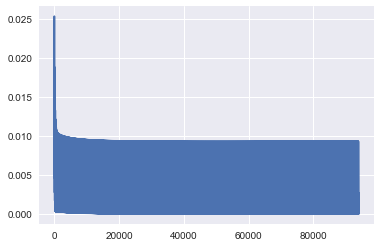

In [78]:
print(len(test_loss))
#plt.plot(test_loss)
plt.plot(train_loss,'-')
#plt.ylim([0.000,0.99])


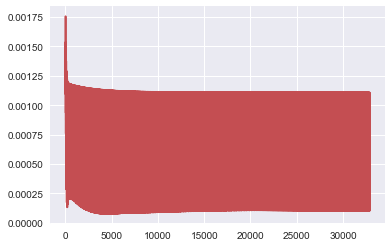

In [79]:
plt.plot(test_loss,'r')

#### Demornamization

In [80]:
rmse = np.sqrt(mse)

In [81]:
rmse_denorm = (rmse * (df_new_test['Kt'].max() - df_new_test['Kt'].min()))+ df_new_test['Kt'].mean()

In [82]:
rmse_denorm

28.553708298461196

In [83]:
df_new_test['Kt'].describe()

count    3583.000000
mean        9.158301
std        52.626796
min        -0.054353
25%        -0.010535
50%         0.156241
75%         1.511747
max      1801.738697
Name: Kt, dtype: float64

### Saving train and test losses to a csv

In [94]:
df_trainLoss = pd.DataFrame(data={'Train Loss':train_loss,'iteration':train_iter}, columns=['Train Loss','iteration'])
df_trainLoss.to_csv('RNN Paper Results/Exp1_FortPeck_TrainLoss.csv')
df_testLoss = pd.DataFrame(data={'Test Loss':test_loss,'iteration':test_iter}, columns=['Test Loss','iteration'])
df_testLoss.to_csv('RNN Paper Results/Exp1_FortPeck_TestLoss.csv')